# **IMPORTS:**

In [ ]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)

In [ ]:
!pip install dalex -U

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 11.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for dalex: filename=dalex-1.6.0-py3-none-any.whl size=1045995 sha256=c65d05f6d8fc1ae9373bd7165a490994f8eb9c4d38095cc7ac4500ddb5fddab5
  Stored in directory: /root/.cache/pip/wheels/c8/45/19/f5810bf7c5ff9a476ebd89bb5b81a18ffcdf93931d17dbb0c1
Successfully built dalex


In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=11680d691c0b5f473b23a4b1a6342b3db8aa7531560a4b6022ccf43cad48d18c
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
#imports necesarios
import pandas as pd
import numpy as np
from scipy.stats import ttest_rel
from sklearn.model_selection import train_test_split, cross_val_score, KFold, StratifiedKFold
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import cross_validate
from sklearn.model_selection import GridSearchCV
from sklearn.inspection import permutation_importance
import statsmodels.api as sm
import dalex as dx
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from imblearn.ensemble import BalancedRandomForestClassifier, RUSBoostClassifier
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score, RocCurveDisplay

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Dataset preprocesado:**

In [ ]:
#carga del dataset
data=pd.read_csv("/content/drive/MyDrive/TFM/Merge/ruby_data.csv")
label=pd.read_csv("/content/drive/MyDrive/TFM/Merge/ruby_label.csv")
#file_path_data = r'D:\Descargas\merge conflict\ruby_data.csv'
#file_path_label = r'D:\Descargas\merge conflict\ruby_label.csv'
#data = pd.read_csv(file_path_data)
#label= pd.read_csv(file_path_label)

In [ ]:
pd.set_option('display.max_columns', None)

In [ ]:
data.head() #comprobar el dataframe

,parallel_changed_file_num,commit_num,file_added,file_removed,file_renamed,file_modified,file_copied,line_added,line_removed,developer_num,duration,commit_density,add_frequency,bug_frequency,change_frequency,delete_frequency,document_frequency,feature_frequency,fix_frequency,improve_frequency,refactor_frequency,remove_frequency,update_frequency,use_frequency,messages_min,messages_max,messages_mean,messages_median
0,1.0,116.0,-100.0,-47.0,0.0,-2123.0,0.0,-85525.0,-59705.0,-3.0,66.0,-114.0,2.0,0.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,16.0,204.0,54.055556,41.0
1,0.0,14.0,-2.0,-2.0,0.0,-41.0,0.0,564.0,-202.0,-3.0,54.0,-12.0,0.0,2.0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,13.0,72.0,41.428571,41.0
2,0.0,6.0,0.0,0.0,0.0,-4.0,0.0,-138.0,-53.0,-1.0,6.0,-4.0,1.0,0.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,10.0,83.0,57.333333,67.0
3,0.0,3.0,0.0,0.0,0.0,-1.0,0.0,-40.0,-9.0,0.0,120.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,27.0,43.0,37.333333,42.0
4,0.0,3.0,0.0,0.0,0.0,-5.0,0.0,-34.0,0.0,-1.0,55.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,30.0,54.0,43.000000,45.0


In [ ]:
label.head()

,is_conflict
0,0
1,0
2,0
3,0
4,0


In [ ]:
#comprobar si existen valores null o ?
print("¿Existen valores nulos en los datos?:", data.isnull().values.any())
print("¿Existen valores  '?'  en los datos?:", (data == '?').values.any())
print("¿Existen valores nulos en las etiquetas?:", label.isnull().values.any())
print("¿Existen valores  '?'  en las etiquetas?:", (label == '?').values.any())

¿Existen valores nulos en los datos?: False
¿Existen valores  '?'  en los datos?: False
¿Existen valores nulos en las etiquetas?: False
¿Existen valores  '?'  en las etiquetas?: False


In [ ]:
print(data.shape)
print(label.shape)

#obtener lista de atributos sin la variable dependiente
feature_names=list(data)
print(feature_names)
print(list(label))

(40129, 28)
(40129, 1)
['parallel_changed_file_num', 'commit_num', 'file_added', 'file_removed', 'file_renamed', 'file_modified', 'file_copied', 'line_added', 'line_removed', 'developer_num', 'duration', 'commit_density', 'add_frequency', 'bug_frequency', 'change_frequency', 'delete_frequency', 'document_frequency', 'feature_frequency', 'fix_frequency', 'improve_frequency', 'refactor_frequency', 'remove_frequency', 'update_frequency', 'use_frequency', 'messages_min', 'messages_max', 'messages_mean', 'messages_median']
['is_conflict']


In [ ]:
# Calcular la frecuencia de cada clase
num_clases = label['is_conflict'].value_counts()
print(num_clases)

0    37098
1     3031
Name: is_conflict, dtype: int64


In [ ]:
# Combinamos los datos con las etiquetas en un solo df
df = pd.concat([data, label], axis=1)

In [ ]:
df.head()

,parallel_changed_file_num,commit_num,file_added,file_removed,file_renamed,file_modified,file_copied,line_added,line_removed,developer_num,duration,commit_density,add_frequency,bug_frequency,change_frequency,delete_frequency,document_frequency,feature_frequency,fix_frequency,improve_frequency,refactor_frequency,remove_frequency,update_frequency,use_frequency,messages_min,messages_max,messages_mean,messages_median,is_conflict
0,1.0,116.0,-100.0,-47.0,0.0,-2123.0,0.0,-85525.0,-59705.0,-3.0,66.0,-114.0,2.0,0.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,16.0,204.0,54.055556,41.0,0
1,0.0,14.0,-2.0,-2.0,0.0,-41.0,0.0,564.0,-202.0,-3.0,54.0,-12.0,0.0,2.0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,13.0,72.0,41.428571,41.0,0
2,0.0,6.0,0.0,0.0,0.0,-4.0,0.0,-138.0,-53.0,-1.0,6.0,-4.0,1.0,0.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,10.0,83.0,57.333333,67.0,0
3,0.0,3.0,0.0,0.0,0.0,-1.0,0.0,-40.0,-9.0,0.0,120.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,27.0,43.0,37.333333,42.0,0
4,0.0,3.0,0.0,0.0,0.0,-5.0,0.0,-34.0,0.0,-1.0,55.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,30.0,54.0,43.000000,45.0,0


In [ ]:
df.info() #comprobar el tipo de variables y su cantidad. Parece que no hay ninguna variable objeto

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40129 entries, 0 to 40128
Data columns (total 29 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   parallel_changed_file_num  40129 non-null  float64
 1   commit_num                 40129 non-null  float64
 2   file_added                 40129 non-null  float64
 3   file_removed               40129 non-null  float64
 4   file_renamed               40129 non-null  float64
 5   file_modified              40129 non-null  float64
 6   file_copied                40129 non-null  float64
 7   line_added                 40129 non-null  float64
 8   line_removed               40129 non-null  float64
 9   developer_num              40129 non-null  float64
 10  duration                   40129 non-null  float64
 11  commit_density             40129 non-null  float64
 12  add_frequency              40129 non-null  float64
 13  bug_frequency              40129 non-null  flo

In [ ]:
df.describe() #obtener algunas estadísitcas de cada atributo

,parallel_changed_file_num,commit_num,file_added,file_removed,file_renamed,file_modified,file_copied,line_added,line_removed,developer_num,duration,commit_density,add_frequency,bug_frequency,change_frequency,delete_frequency,document_frequency,feature_frequency,fix_frequency,improve_frequency,refactor_frequency,remove_frequency,update_frequency,use_frequency,messages_min,messages_max,messages_mean,messages_median,is_conflict
count,40129.000000,40129.000000,40129.000000,40129.000000,40129.0,40129.000000,40129.0,4.012900e+04,4.012900e+04,40129.000000,40129.000000,40129.000000,40129.000000,40129.000000,40129.000000,40129.000000,40129.000000,40129.000000,40129.000000,40129.000000,40129.000000,40129.000000,40129.000000,40129.000000,40129.000000,40129.000000,40129.000000,40129.000000,40129.000000
mean,1.242817,72.711605,-179.492063,-156.584041,0.0,-404.496848,0.0,-1.990696e+04,-1.931652e+04,-2.236712,79.626330,-40.237609,1.300705,0.222433,0.324454,0.040594,0.105983,0.086945,1.582845,0.105684,0.092576,0.408059,0.629370,0.581300,29.039348,81.372648,49.380278,47.118082,0.075531
std,23.046735,1043.367581,3417.434387,3093.169526,0.0,8444.147769,0.0,4.766318e+05,5.725382e+05,18.670115,1324.036724,523.293879,1.868899,0.677639,0.778141,0.257022,0.439645,0.482438,2.131147,0.437387,0.459295,0.889407,1.384641,1.115233,24.767770,55.661681,25.705484,25.598495,0.264250
min,0.000000,1.000000,-131063.000000,-104129.000000,0.0,-422454.000000,0.0,-2.136905e+07,-3.308476e+07,-1364.000000,-41164.000000,-30730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,-1.000000,0.000000,0.0,-17.000000,0.0,-2.090000e+02,-8.400000e+01,-2.000000,-40.000000,-8.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,15.000000,49.000000,37.000000,35.000000,0.000000
50%,0.000000,4.000000,0.000000,0.000000,0.0,1.000000,0.0,1.000000e+00,1.000000e+00,0.000000,-2.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,24.000000,69.000000,45.904762,45.000000,0.000000
75%,0.000000,18.000000,0.000000,0.000000,0.0,2.000000,0.0,2.100000e+01,7.000000e+00,1.000000,13.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,1.000000,1.000000,1.000000,37.000000,94.000000,55.750000,53.500000,0.000000
max,2596.000000,44155.000000,24248.000000,139785.000000,0.0,257352.000000,0.0,3.588850e+07,5.300111e+07,281.000000,37540.000000,40865.000000,26.000000,13.000000,15.000000,12.000000,13.000000,18.000000,48.000000,13.000000,13.000000,21.000000,45.000000,20.000000,400.000000,410.000000,400.000000,400.000000,1.000000


In [ ]:
# Parece que file_renamed y file_copied tienen el mismo valor siempre. Vamos a comprobarlo
val_renamed = df['file_renamed'].value_counts()
val_copied = df['file_copied'].value_counts()
print("Para file_renamed:\n", val_renamed)
print("Para file_copied:\n", val_copied)
columnas_constantes = df.columns[df.describe().loc['std'] == 0].tolist()
columnas_constantes

Para file_renamed:
 0.0    40129
Name: file_renamed, dtype: int64
Para file_copied:
 0.0    40129
Name: file_copied, dtype: int64


['file_renamed', 'file_copied']

In [ ]:
# Al ser caracteristicas constantes decido eliminarlas
df=df.drop('file_renamed', axis=1)
df=df.drop('file_copied', axis=1)

In [ ]:
# Actualizamos los nombres de las caracteristicas
feature_names=list(df)
feature_names.remove('is_conflict')
print(feature_names)

['parallel_changed_file_num', 'commit_num', 'file_added', 'file_removed', 'file_modified', 'line_added', 'line_removed', 'developer_num', 'duration', 'commit_density', 'add_frequency', 'bug_frequency', 'change_frequency', 'delete_frequency', 'document_frequency', 'feature_frequency', 'fix_frequency', 'improve_frequency', 'refactor_frequency', 'remove_frequency', 'update_frequency', 'use_frequency', 'messages_min', 'messages_max', 'messages_mean', 'messages_median']


In [ ]:
correlation_matrix=df.corr()
print(correlation_matrix) #coeficientes de correlación

                           parallel_changed_file_num  commit_num  file_added  \
parallel_changed_file_num                   1.000000    0.068148   -0.063416   
commit_num                                  0.068148    1.000000   -0.917138   
file_added                                 -0.063416   -0.917138    1.000000   
file_removed                               -0.056011   -0.799438    0.846853   
file_modified                              -0.056590   -0.828958    0.911210   
line_added                                 -0.046733   -0.694711    0.757133   
line_removed                               -0.035388   -0.499354    0.548303   
developer_num                              -0.072730   -0.619851    0.587273   
duration                                    0.000994    0.016578   -0.011519   
commit_density                             -0.000334   -0.000488    0.001319   
add_frequency                               0.024159   -0.005383    0.003265   
bug_frequency                           

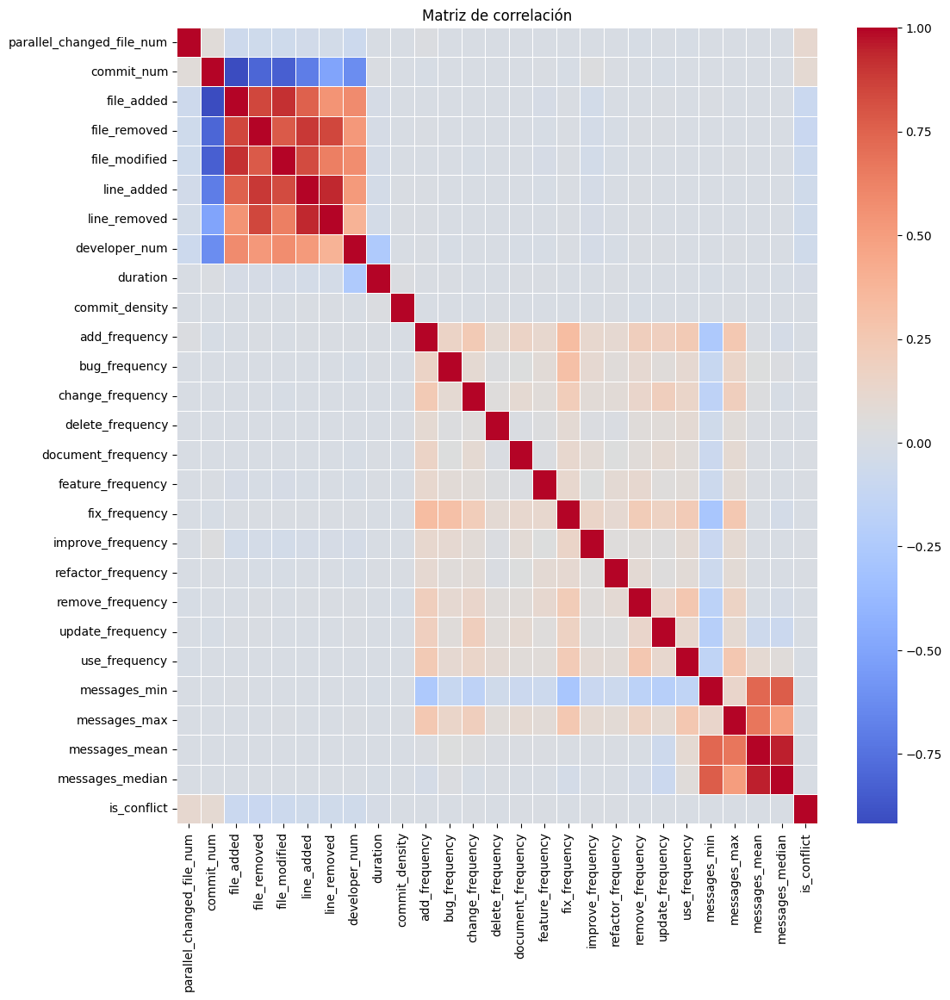

In [ ]:
plt.figure(figsize=(12, 12))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', fmt=".2f", annot_kws={"size": 7}, linewidths=0.5)
plt.title("Matriz de correlación")
plt.show()

In [ ]:
#Pares de atributos con correlación superior al umbral
high_correlation_pairs = []
atributos = []

#Recorre la matriz de correlación y verifica los valores
for i in range(len(correlation_matrix.columns)):
    for j in range(i + 1, len(correlation_matrix.columns)):
        if abs(correlation_matrix.iloc[i, j]) > 0.80:
            attribute_pair = (correlation_matrix.columns[i], correlation_matrix.columns[j])
            high_correlation_pairs.append(attribute_pair)

# Imprime los pares de atributos con correlación superior a 0.8 y crear una lista de atributos sin repetir
for pair in high_correlation_pairs:
    print("Correlación alta entre: ", pair[0], "y", pair[1])
    atributos.extend(pair)

# Eliminar duplicados y mantener el orden
atributos = list(dict.fromkeys(atributos))

# Imprimir la lista de atributos
print("Lista de atributos con correlación alta: ", atributos)

Correlación alta entre:  commit_num y file_added
Correlación alta entre:  commit_num y file_modified
Correlación alta entre:  file_added y file_removed
Correlación alta entre:  file_added y file_modified
Correlación alta entre:  file_removed y line_added
Correlación alta entre:  file_removed y line_removed
Correlación alta entre:  file_modified y line_added
Correlación alta entre:  line_added y line_removed
Correlación alta entre:  messages_mean y messages_median
Lista de atributos con correlación alta:  ['commit_num', 'file_added', 'file_modified', 'file_removed', 'line_added', 'line_removed', 'messages_mean', 'messages_median']


**VALIDACIÓN CRUZADA PARA COMPROBAR EL EFECTO DE LOS PARÁMETROS:**

In [ ]:
# Defino los algoritmos base para evaluar
rf= RandomForestClassifier()
dt = DecisionTreeClassifier()
vot=VotingClassifier([('rf',rf),('dt',dt)])
modelos=[rf, dt, vot]

In [ ]:
for i in atributos:
  print("\n##########################################################################################################")
  print("\nPARA EL ATRIBUTO: ", i)

  # Preparando los datos
  X=df[feature_names]
  Y=df['is_conflict']

  x_train, x_test, y_train, y_test = train_test_split(X, Y, train_size=0.7, test_size=0.3, random_state=42, stratify=Y)
  x_train_sin=x_train.drop(i, axis=1)

  for j in modelos:
    # Realizar validación cruzada con y sin el atributo con alta correlación:
    # Con el atributo
    cv_scores_con = cross_val_score(j, x_train, y_train, cv=10, scoring='f1')

    # Sin el atributo
    cv_scores_sin = cross_val_score(j, x_train_sin, y_train, cv=10, scoring='f1')

    # Calcular el estadístico t y el p-valor
    t_statistic, p_value = ttest_rel(cv_scores_con, cv_scores_sin)

    # Mostrar los resultados
    print("-------------------------------------------------------------------------------------------------------------")
    print("El modelo: ", j)
    print("Valor de validación cruzada (con atributo):", cv_scores_con)
    print("Valor de validación cruzada (sin atributo):", cv_scores_sin)
    print("Valor medio con atributo es: ", np.mean(cv_scores_con), "\nEl valor medio sin atributo es: ", np.mean(cv_scores_sin))
    if np.mean(cv_scores_con) > np.mean(cv_scores_sin):
      print("El atributo mejora el desempeño del modelo, con una diferencia de: ", np.mean(cv_scores_con)-np.mean(cv_scores_sin))
    else:
      print("El atributo no mejora el desempeño del modelo, con una diferencia de: ", np.mean(cv_scores_con)-np.mean(cv_scores_sin))

    print("Estadístico t:", t_statistic)
    print("p-valor:", p_value)


##########################################################################################################

PARA EL ATRIBUTO:  commit_num
-------------------------------------------------------------------------------------------------------------
El modelo:  RandomForestClassifier()
Valor de validación cruzada (con atributo): [0.5648415  0.61702128 0.609375   0.66485014 0.61096606 0.60526316
 0.59574468 0.58221024 0.58119658 0.56741573]
Valor de validación cruzada (sin atributo): [0.61325967 0.59299191 0.63613232 0.63414634 0.60106383 0.59358289
 0.60106383 0.58082192 0.59668508 0.55248619]
Valor medio con atributo es:  0.5998884361702919 
El valor medio sin atributo es:  0.6002233975041414
El atributo no mejora el desempeño del modelo, con una diferencia de:  -0.0003349613338495816
Estadístico t: -0.04362150833161312
p-valor: 0.9661585885793287
-------------------------------------------------------------------------------------------------------------
El modelo:  DecisionTreeClassi

In [ ]:
# Elimina los atributos con demasiada correlación y menor relevancia que su par
feature_names.remove('messages_median')
print(feature_names)

['parallel_changed_file_num', 'commit_num', 'file_added', 'file_removed', 'file_modified', 'line_added', 'line_removed', 'developer_num', 'duration', 'commit_density', 'add_frequency', 'bug_frequency', 'change_frequency', 'delete_frequency', 'document_frequency', 'feature_frequency', 'fix_frequency', 'improve_frequency', 'refactor_frequency', 'remove_frequency', 'update_frequency', 'use_frequency', 'messages_min', 'messages_max', 'messages_mean']


In [ ]:
from google.colab.data_table import DataTable
DataTable.max_columns = 30

df_display=df.drop("messages_median", axis=1)
df_display.describe()

,parallel_changed_file_num,commit_num,file_added,file_removed,file_modified,line_added,line_removed,developer_num,duration,commit_density,add_frequency,bug_frequency,change_frequency,delete_frequency,document_frequency,feature_frequency,fix_frequency,improve_frequency,refactor_frequency,remove_frequency,update_frequency,use_frequency,messages_min,messages_max,messages_mean,is_conflict
count,40129.000000,40129.000000,40129.000000,40129.000000,40129.000000,4.012900e+04,4.012900e+04,40129.000000,40129.000000,40129.000000,40129.000000,40129.000000,40129.000000,40129.000000,40129.000000,40129.000000,40129.000000,40129.000000,40129.000000,40129.000000,40129.000000,40129.000000,40129.000000,40129.000000,40129.000000,40129.000000
mean,1.242817,72.711605,-179.492063,-156.584041,-404.496848,-1.990696e+04,-1.931652e+04,-2.236712,79.626330,-40.237609,1.300705,0.222433,0.324454,0.040594,0.105983,0.086945,1.582845,0.105684,0.092576,0.408059,0.629370,0.581300,29.039348,81.372648,49.380278,0.075531
std,23.046735,1043.367581,3417.434387,3093.169526,8444.147769,4.766318e+05,5.725382e+05,18.670115,1324.036724,523.293879,1.868899,0.677639,0.778141,0.257022,0.439645,0.482438,2.131147,0.437387,0.459295,0.889407,1.384641,1.115233,24.767770,55.661681,25.705484,0.264250
min,0.000000,1.000000,-131063.000000,-104129.000000,-422454.000000,-2.136905e+07,-3.308476e+07,-1364.000000,-41164.000000,-30730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,-1.000000,0.000000,-17.000000,-2.090000e+02,-8.400000e+01,-2.000000,-40.000000,-8.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,15.000000,49.000000,37.000000,0.000000
50%,0.000000,4.000000,0.000000,0.000000,1.000000,1.000000e+00,1.000000e+00,0.000000,-2.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,24.000000,69.000000,45.904762,0.000000
75%,0.000000,18.000000,0.000000,0.000000,2.000000,2.100000e+01,7.000000e+00,1.000000,13.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,1.000000,1.000000,1.000000,37.000000,94.000000,55.750000,0.000000
max,2596.000000,44155.000000,24248.000000,139785.000000,257352.000000,3.588850e+07,5.300111e+07,281.000000,37540.000000,40865.000000,26.000000,13.000000,15.000000,12.000000,13.000000,18.000000,48.000000,13.000000,13.000000,21.000000,45.000000,20.000000,400.000000,410.000000,400.000000,1.000000


In [ ]:
# Tomar los valores de la variable dependiente (y) y las independientes (x)
X=df[feature_names]
Y=df['is_conflict']

In [ ]:
#dividir en conjunto de entrenamiento y test 70%-30%
x_train, x_test, y_train, y_test = train_test_split(X, Y, train_size=0.7, test_size=0.3, random_state=42, stratify=Y)

In [ ]:
# Comprobar la division de clases
num_train=pd.Series(y_train).value_counts()
num_test=pd.Series(y_test).value_counts()
porc_train=pd.Series(y_train).value_counts(normalize=True)
porc_test=pd.Series(y_test).value_counts(normalize=True)
comparacion = pd.DataFrame({'% Train': porc_train, 'Num Train': num_train, '% Test': porc_test,'Num Test': num_test})
print(comparacion)

    % Train  Num Train    % Test  Num Test
0  0.924457      25968  0.924495     11130
1  0.075543       2122  0.075505       909


# **Algoritmos:**

### **RandomForest:**

In [ ]:
modelo=RandomForestClassifier(random_state=42)
params={'n_estimators':[10,25,50,75,100,200,300],'min_samples_split':[2,3,5,10,20],'min_samples_leaf':[1,3,5,10],'max_depth':[None,1,5,10,20,30], 'class_weight':[None,'balanced']}
grid=GridSearchCV(modelo,params,cv=10,scoring='f1',verbose=1)
grid.fit(x_train,y_train)

Fitting 10 folds for each of 1400 candidates, totalling 14000 fits


GridSearchCV(cv=10, estimator=RandomForestClassifier(random_state=42),
             param_grid={'class_weight': [None, 'balanced'],
                         'max_depth': [None, 5, 10, 20, 30],
                         'min_samples_leaf': [1, 3, 5, 10],
                         'min_samples_split': [2, 3, 5, 10, 20],
                         'n_estimators': [10, 25, 50, 75, 100, 200, 300]},
             scoring='f1', verbose=1)

In [ ]:
print(grid.best_params_)
print(grid.best_estimator_)
print(grid.best_score_)

{'class_weight': 'balanced', 'max_depth': 20, 'min_samples_leaf': 3, 'min_samples_split': 2, 'n_estimators': 300}
RandomForestClassifier(class_weight='balanced', max_depth=20,
                       min_samples_leaf=3, n_estimators=300, random_state=42)
0.6512431338322443


In [ ]:
rf = RandomForestClassifier(class_weight='balanced', max_depth=20, min_samples_leaf=3, n_estimators=300, random_state=42)

In [ ]:
modelo_rf=rf.fit(x_train,y_train)

In [ ]:
y_pred_rf = modelo_rf.predict(x_test)

**EVALUACIÓN MODELO:**

In [ ]:
#comprobación resultados
df_pred = pd.DataFrame({'Actual': y_test.squeeze(), 'Predicted': y_pred_rf.squeeze()})
print(df_pred)

       Actual  Predicted
37777       0          0
1215        0          0
418         0          0
11571       0          0
25827       1          1
...       ...        ...
14095       0          0
17674       0          0
18585       0          0
23423       0          0
12312       0          0

[12039 rows x 2 columns]


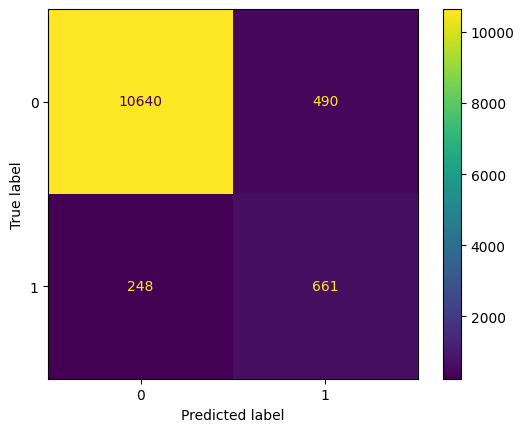

In [ ]:
# Matriz de confusion
cm_rf = confusion_matrix(y_test, y_pred_rf)
cm_display = ConfusionMatrixDisplay(cm_rf).plot()

In [ ]:
# Calcular métricas para evaluar el rendimiento del algoritmo
accuracy = accuracy_score(y_test, y_pred_rf)
recall = recall_score(y_test, y_pred_rf)
precision = precision_score(y_test, y_pred_rf)
f1 = f1_score(y_test, y_pred_rf)
print("Accuracy:", accuracy)
print("Recall:", recall)
print("Precision:", precision)
print("F1-score:", f1)

Accuracy: 0.9386992275105905
Recall: 0.7271727172717272
Precision: 0.5742832319721981
F1-score: 0.641747572815534


In [ ]:
modelo_rf.score(x_test, y_test)

0.9386992275105905

In [ ]:
modelo_rf.score(x_train, y_train)

0.9800996796012816

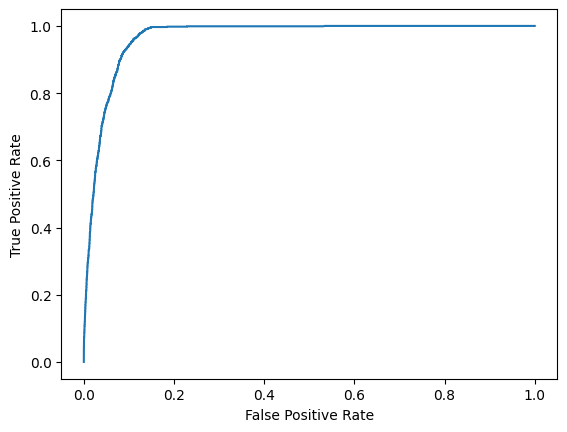

In [ ]:
# AUROC
y_score = modelo_rf.predict_proba(x_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_score, pos_label=modelo_rf.classes_[1])
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot()

In [ ]:
auc=roc_auc_score(y_test, y_score)
auc

0.9668296569099858

**CLASES INVERTIDAS**

In [ ]:
y_test_inv = y_test.values
y_test_inv = 1 - y_test_inv
y_test_inv = pd.Series(y_test_inv)
y_pred_rf_inv = 1 - y_pred_rf
df_pred_inv = pd.DataFrame({'Actual': y_test_inv.squeeze(), 'Predicted': y_pred_rf_inv.squeeze()})

In [ ]:
df_pred.head(20)

,Actual,Predicted
37777,0,0
1215,0,0
418,0,0
11571,0,0
25827,1,1
26319,0,0
25417,0,0
38219,0,0
2793,0,0
689,0,0


In [ ]:
df_pred_inv.head(20)

,Actual,Predicted
0,1,1
1,1,1
2,1,1
3,1,1
4,0,0
5,1,1
6,1,1
7,1,1
8,1,1
9,1,1


In [ ]:
# Calcular métricas al invertir las clases
accuracy_inv = accuracy_score(y_test_inv, y_pred_rf_inv)
recall_inv = recall_score(y_test_inv, y_pred_rf_inv)
precision_inv = precision_score(y_test_inv, y_pred_rf_inv)
f1_inv = f1_score(y_test_inv, y_pred_rf_inv)
print("Accuracy:", accuracy_inv)
print("Recall:", recall_inv)
print("Precision:", precision_inv)
print("F1-score:", f1_inv)

Accuracy: 0.9386992275105905
Recall: 0.9559748427672956
Precision: 0.9772226304188097
F1-score: 0.9664819692978474


In [ ]:
score_inv_result={"Modelo":["RandomForest"],"Accuracy":[accuracy_inv], "Precision":[precision_inv], "Recall":[recall_inv], "F1-score":[f1_inv]}
score_inv_result=pd.DataFrame(score_inv_result)

**VALIDACIÓN CRUZADA**

In [ ]:
# El número de folds
n_folds = 10

# Inicializar listas para almacenar las puntuaciones de las métricas. Nos centramos en las métricas comunes en la literatura
acc_sc = []
prec_sc = []
rcll_sc = []
f1_sc = []

# Crear los objetos KFold
skf = StratifiedKFold(n_splits=n_folds)

for train_index, test_index in skf.split(X, Y):
    # Dividir los datos en entrenamiento y prueba
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    Y_train, Y_test = Y.iloc[train_index], Y.iloc[test_index]

    # Entrenar el modelo
    cv_rf= RandomForestClassifier(class_weight='balanced', max_depth=20, min_samples_leaf=3, n_estimators=300, random_state=42)
    cv_rf.fit(X_train, Y_train)

    # Realizar las predicciones en el conjunto de prueba
    Y_pred = cv_rf.predict(X_test)

    # Calcular las métricas
    accuracy = accuracy_score(Y_test, Y_pred)
    recall = recall_score(Y_test, Y_pred)
    precision = precision_score(Y_test, Y_pred)
    f1 = f1_score(Y_test, Y_pred)

    # Agregar las puntuaciones a las listas
    acc_sc.append(accuracy)
    prec_sc.append(precision)
    rcll_sc.append(recall)
    f1_sc.append(f1)

# Calcular la media de las puntuaciones
mean_acc = np.mean(acc_sc)
mean_prec = np.mean(prec_sc)
mean_rcll = np.mean(rcll_sc)
mean_f1 = np.mean(f1_sc)

print(f'CV Accuracy: {mean_acc:.4f}')
print(f'CV Precision: {mean_prec:.4f}')
print(f'CV Recall: {mean_rcll:.4f}')
print(f'CV F1-Score: {mean_f1:.4f}')

CV Accuracy: 0.9376
CV Precision: 0.5671
CV Recall: 0.7476
CV F1-Score: 0.6444


In [ ]:
cv_results = cross_validate(rf, X, Y, cv=10, scoring=('accuracy','precision', 'recall','f1'))

In [ ]:
sorted(cv_results.keys())

['fit_time',
 'score_time',
 'test_accuracy',
 'test_f1',
 'test_precision',
 'test_recall']

In [ ]:
print("Accuracy:\n", cv_results['test_accuracy'], "\n Con una media de: ", np.mean(cv_results['test_accuracy']))
print("Precision:\n" , cv_results['test_precision'], "\n Con una media de: ", np.mean(cv_results['test_precision']))
print("Recall:\n", cv_results['test_recall'], "\n Con una media de: ", np.mean(cv_results['test_recall']))
print("F1-score:\n", cv_results['test_f1'], "\n Con una media de: ", np.mean(cv_results['test_f1']))

Accuracy:
 [0.9369549  0.93969599 0.94343384 0.9369549  0.93147271 0.9394468
 0.93296785 0.94542736 0.93720409 0.93270189] 
 Con una media de:  0.9376260329403019
Precision:
 [0.56410256 0.57605985 0.60497238 0.56281407 0.535      0.57389163
 0.54086538 0.61351351 0.5631068  0.53674833] 
 Con una media de:  0.5671074510001543
Recall:
 [0.72607261 0.76237624 0.72277228 0.73927393 0.70627063 0.7689769
 0.74257426 0.74917492 0.76315789 0.79537954] 
 Con una media de:  0.7476029181865556
F1-score:
 [0.63492063 0.65625    0.65864662 0.63908702 0.60881935 0.65726375
 0.62586926 0.67459138 0.64804469 0.64095745] 
 Con una media de:  0.6444450151714667


In [ ]:
score_result={"Modelo":["RandomForest"],"Accuracy":[np.mean(cv_results['test_accuracy'])], "Precision":[np.mean(cv_results['test_precision'])], "Recall":[np.mean(cv_results['test_recall'])], "F1-score":[np.mean(cv_results['test_f1'])]}
score_result=pd.DataFrame(score_result)

### **BalancedRandomForest:**

In [ ]:
modelo=BalancedRandomForestClassifier(random_state=42)
params={'n_estimators':[10,25,50,75,100,200],'min_samples_split':[2,3,5,10,20],'min_samples_leaf':[1,3,5,10,20],'max_depth':[1,3,5,10,20,30], 'class_weight':[None,'balanced']}
grid=GridSearchCV(modelo,params,cv=10,scoring='f1',verbose=1)
grid.fit(x_train,y_train)

Fitting 10 folds for each of 1800 candidates, totalling 18000 fits
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=2, n_estimators=10; total ti

[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=1, min_samples_lea

[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   0.2s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   0.2s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   0.2s
[CV] END class_weight=None, max_depth=1, min_samples_lea

[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=1, min_sam

[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=20, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=20, n_estimators=100; total time=   0.5s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=20, n_estimators=100; total time=   0.5s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=20, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=20, n_estimators=100; total time=   0.5s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=20, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=20, n_estimators=100; total time=   0.5s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=1, min_samples_split=20, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=1, 

[CV] END class_weight=None, max_depth=1, min_samples_leaf=3, min_samples_split=2, n_estimators=100; total time=   0.5s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=3, min_samples_split=2, n_estimators=200; total time=   1.2s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=3, min_samples_split=2, n_estimators=200; total time=   1.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=3, min_samples_split=2, n_estimators=200; total time=   1.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=3, min_samples_split=2, n_estimators=200; total time=   1.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=3, min_samples_split=2, n_estimators=200; total time=   1.3s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=3, min_samples_split=2, n_estimators=200; total time=   1.5s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=3, min_samples_split=2, n_estimators=200; total time=   1.4s
[CV] END class_weight=None, max_depth=1, min_sam

[CV] END class_weight=None, max_depth=1, min_samples_leaf=3, min_samples_split=3, n_estimators=200; total time=   1.2s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=3, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=3, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=3, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=3, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=3, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=3, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=3, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=1, min_samples_le

[CV] END class_weight=None, max_depth=1, min_samples_leaf=3, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=3, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=3, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=3, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=3, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=3, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=3, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=3, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=1, min_sam

[CV] END class_weight=None, max_depth=1, min_samples_leaf=3, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=3, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=3, min_samples_split=20, n_estimators=50; total time=   0.2s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=3, min_samples_split=20, n_estimators=50; total time=   0.2s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=3, min_samples_split=20, n_estimators=50; total time=   0.2s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=3, min_samples_split=20, n_estimators=50; total time=   0.2s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=3, min_samples_split=20, n_estimators=50; total time=   0.2s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=3, min_samples_split=20, n_estimators=50; total time=   0.2s
[CV] END class_weight=None, max_depth=1, min_sam

[CV] END class_weight=None, max_depth=1, min_samples_leaf=5, min_samples_split=2, n_estimators=50; total time=   0.2s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=5, min_samples_split=2, n_estimators=50; total time=   0.2s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=5, min_samples_split=2, n_estimators=50; total time=   0.2s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=5, min_samples_split=2, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=5, min_samples_split=2, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=5, min_samples_split=2, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=5, min_samples_split=2, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=5, min_samples_split=2, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=1, min_samples_lea

[CV] END class_weight=None, max_depth=1, min_samples_leaf=5, min_samples_split=3, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=5, min_samples_split=3, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=5, min_samples_split=3, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=5, min_samples_split=3, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=5, min_samples_split=3, n_estimators=100; total time=   0.5s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=5, min_samples_split=3, n_estimators=100; total time=   0.5s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=5, min_samples_split=3, n_estimators=100; total time=   0.5s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=5, min_samples_split=3, n_estimators=100; total time=   0.5s
[CV] END class_weight=None, max_depth=1, min_sample

[CV] END class_weight=None, max_depth=1, min_samples_leaf=5, min_samples_split=5, n_estimators=100; total time=   0.5s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=5, min_samples_split=5, n_estimators=100; total time=   0.5s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=5, min_samples_split=5, n_estimators=100; total time=   0.5s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=5, min_samples_split=5, n_estimators=200; total time=   1.2s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=5, min_samples_split=5, n_estimators=200; total time=   1.3s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=5, min_samples_split=5, n_estimators=200; total time=   1.3s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=5, min_samples_split=5, n_estimators=200; total time=   1.2s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=5, min_samples_split=5, n_estimators=200; total time=   1.1s
[CV] END class_weight=None, max_depth=1, min_sam

[CV] END class_weight=None, max_depth=1, min_samples_leaf=5, min_samples_split=10, n_estimators=200; total time=   1.2s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=5, min_samples_split=10, n_estimators=200; total time=   1.2s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=5, min_samples_split=10, n_estimators=200; total time=   1.2s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=5, min_samples_split=10, n_estimators=200; total time=   1.2s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=5, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=5, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=5, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=5, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=1, min

[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=1, min_sam

[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=3, n_estimators=50; total time=   0.2s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=3, n_estimators=50; total time=   0.2s
[CV] END class_weight=None, max_depth=1, min_sam

[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=5, n_estimators=50; total time=   0.2s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=5, n_estimators=50; total time=   0.2s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=5, n_estimators=50; total time=   0.2s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=5, n_estimators=50; total time=   0.2s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=5, n_estimators=50; total time=   0.2s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=5, n_estimators=50; total time=   0.2s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=5, n_estimators=50; total time=   0.2s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=5, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=1, min_sam

[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=1,

[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.5s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.5s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.5s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.5s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.5s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_

[CV] END class_weight=None, max_depth=1, min_samples_leaf=20, min_samples_split=2, n_estimators=200; total time=   1.3s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=20, min_samples_split=2, n_estimators=200; total time=   1.3s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=20, min_samples_split=2, n_estimators=200; total time=   1.2s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=20, min_samples_split=2, n_estimators=200; total time=   1.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=20, min_samples_split=2, n_estimators=200; total time=   1.2s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=20, min_samples_split=2, n_estimators=200; total time=   1.4s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=20, min_samples_split=2, n_estimators=200; total time=   1.3s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=20, min_samples_split=2, n_estimators=200; total time=   1.4s
[CV] END class_weight=None, max_depth=1,

[CV] END class_weight=None, max_depth=1, min_samples_leaf=20, min_samples_split=3, n_estimators=200; total time=   1.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=20, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=20, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=20, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=20, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=20, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=20, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=20, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=1, min_sa

[CV] END class_weight=None, max_depth=1, min_samples_leaf=20, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=20, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=20, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=20, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=20, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=20, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=20, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=20, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=1,

[CV] END class_weight=None, max_depth=1, min_samples_leaf=20, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=20, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=20, min_samples_split=20, n_estimators=50; total time=   0.2s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=20, min_samples_split=20, n_estimators=50; total time=   0.2s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=20, min_samples_split=20, n_estimators=50; total time=   0.2s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=20, min_samples_split=20, n_estimators=50; total time=   0.2s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=20, min_samples_split=20, n_estimators=50; total time=   0.2s
[CV] END class_weight=None, max_depth=1, min_samples_leaf=20, min_samples_split=20, n_estimators=50; total time=   0.2s
[CV] END class_weight=None, max_depth=1,

[CV] END class_weight=None, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=3, min_samples_lea

[CV] END class_weight=None, max_depth=3, min_samples_leaf=1, min_samples_split=3, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=1, min_samples_split=3, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=1, min_samples_split=3, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=1, min_samples_split=3, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=1, min_samples_split=3, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=1, min_samples_split=3, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=1, min_samples_split=3, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=1, min_samples_split=3, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=3, min_sample

[CV] END class_weight=None, max_depth=3, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   1.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   1.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   1.5s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   1.4s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   1.4s
[CV] END class_weight=None, max_depth=3, min_sam

[CV] END class_weight=None, max_depth=3, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   1.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   1.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   1.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   1.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=1, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=1, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=1, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=1, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=3, min

[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=3, min_samples_lea

[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=3, n_estimators=25; total time=   0.2s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=3, min_samples_lea

[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=5, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=5, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=5, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=3, min_samples_lea

[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=10, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=10, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, max_depth=3, min_s

[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=20, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=20, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=20, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=20, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=20, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=20, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=20, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=3, min_samples_split=20, n_estimators=200; total time=   1.3s
[CV] END class_weight=None, max_depth=3,

[CV] END class_weight=None, max_depth=3, min_samples_leaf=5, min_samples_split=2, n_estimators=200; total time=   1.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=5, min_samples_split=2, n_estimators=200; total time=   1.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=5, min_samples_split=2, n_estimators=200; total time=   1.4s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=5, min_samples_split=2, n_estimators=200; total time=   1.4s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=5, min_samples_split=2, n_estimators=200; total time=   1.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=5, min_samples_split=2, n_estimators=200; total time=   1.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=5, min_samples_split=2, n_estimators=200; total time=   1.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=5, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=3, min_samp

[CV] END class_weight=None, max_depth=3, min_samples_leaf=5, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=5, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=5, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=5, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=5, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=5, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=5, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=5, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=3, min_samples_lea

[CV] END class_weight=None, max_depth=3, min_samples_leaf=5, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=5, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=5, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=5, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=5, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=5, min_samples_split=10, n_estimators=50; total time=   0.2s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=5, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=5, min_samples_split=10, n_estimators=50; total time=   0.2s
[CV] END class_weight=None, max_depth=3, min_sam

[CV] END class_weight=None, max_depth=3, min_samples_leaf=5, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=5, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=5, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=5, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=5, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=5, min_samples_split=20, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=5, min_samples_split=20, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=5, min_samples_split=20, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=3, min_sam

[CV] END class_weight=None, max_depth=3, min_samples_leaf=10, min_samples_split=2, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=10, min_samples_split=2, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=10, min_samples_split=2, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=10, min_samples_split=2, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=10, min_samples_split=2, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=10, min_samples_split=2, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=10, min_samples_split=2, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=10, min_samples_split=2, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=3, min_s

[CV] END class_weight=None, max_depth=3, min_samples_leaf=10, min_samples_split=3, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=10, min_samples_split=3, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=10, min_samples_split=3, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=10, min_samples_split=3, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=10, min_samples_split=3, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=10, min_samples_split=3, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=10, min_samples_split=3, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=10, min_samples_split=3, n_estimators=200; total time=   1.2s
[CV] END class_weight=None, max_depth=3,

[CV] END class_weight=None, max_depth=3, min_samples_leaf=10, min_samples_split=5, n_estimators=200; total time=   1.4s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=10, min_samples_split=5, n_estimators=200; total time=   1.4s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=10, min_samples_split=5, n_estimators=200; total time=   1.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=10, min_samples_split=5, n_estimators=200; total time=   1.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=10, min_samples_split=5, n_estimators=200; total time=   1.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=10, min_samples_split=5, n_estimators=200; total time=   1.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=10, min_samples_split=5, n_estimators=200; total time=   1.2s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=10, min_samples_split=5, n_estimators=200; total time=   1.2s
[CV] END class_weight=None, max_depth=3,

[CV] END class_weight=None, max_depth=3, min_samples_leaf=10, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=10, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=10, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=10, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=10, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=10, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=10, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=10, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=3,

[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=3, min_sam

[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=3, n_estimators=50; total time=   0.2s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=3, n_estimators=50; total time=   0.2s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=3, n_estimators=50; total time=   0.2s
[CV] END class_weight=None, max_depth=3, min_sam

[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=5, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=5, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=5, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=5, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=5, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=5, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=5, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=5, n_estimators=75; total time=   0.4s
[CV] END class_weight=None, max_depth=3, min_sam

[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=10, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=10, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=10, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=10, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=10, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=10, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=10, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=10, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_d

[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=20, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=20, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=20, n_estimators=200; total time=   1.4s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=20, n_estimators=200; total time=   1.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=20, n_estimators=200; total time=   1.2s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=20, n_estimators=200; total time=   1.3s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=20, n_estimators=200; total time=   1.2s
[CV] END class_weight=None, max_depth=3, min_samples_leaf=20, min_samples_split=20, n_estimators=200; total time=   1.3s
[CV] END class_weight=None, max_

[CV] END class_weight=None, max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.5s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.6s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.5s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=1, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=1, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=1, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=1, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=1, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=5, min_samples_

[CV] END class_weight=None, max_depth=5, min_samples_leaf=1, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=1, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=1, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=1, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=1, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=1, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=1, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=1, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=5, min_samples_lea

[CV] END class_weight=None, max_depth=5, min_samples_leaf=1, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=1, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=5, min_sam

[CV] END class_weight=None, max_depth=5, min_samples_leaf=1, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=1, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=1, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=1, min_samples_split=20, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=1, min_samples_split=20, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=1, min_samples_split=20, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=1, min_samples_split=20, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=1, min_samples_split=20, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=5, min_sam

[CV] END class_weight=None, max_depth=5, min_samples_leaf=3, min_samples_split=2, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=3, min_samples_split=2, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=3, min_samples_split=2, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=3, min_samples_split=2, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=3, min_samples_split=2, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=3, min_samples_split=2, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=3, min_samples_split=2, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=3, min_samples_split=2, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, max_depth=5, min_samples

[CV] END class_weight=None, max_depth=5, min_samples_leaf=3, min_samples_split=3, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=3, min_samples_split=3, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=3, min_samples_split=3, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=3, min_samples_split=3, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=3, min_samples_split=3, n_estimators=200; total time=   1.4s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=3, min_samples_split=3, n_estimators=200; total time=   1.4s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=3, min_samples_split=3, n_estimators=200; total time=   1.4s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=3, min_samples_split=3, n_estimators=200; total time=   1.6s
[CV] END class_weight=None, max_depth=5, min_sam

[CV] END class_weight=None, max_depth=5, min_samples_leaf=3, min_samples_split=5, n_estimators=200; total time=   1.4s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=3, min_samples_split=5, n_estimators=200; total time=   1.4s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=3, min_samples_split=5, n_estimators=200; total time=   1.4s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=3, min_samples_split=5, n_estimators=200; total time=   1.4s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=3, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=3, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=3, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=3, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=5, min_sam

[CV] END class_weight=None, max_depth=5, min_samples_leaf=3, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=3, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=3, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=3, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=3, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=3, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=3, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=3, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=5, min_sam

[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=5, min_samples_lea

[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=3, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=3, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=3, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=5, min_samples_lea

[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=5, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=5, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=5, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=5, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=5, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=5, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=5, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=5, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, max_depth=5, min_samples_l

[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=10, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=10, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=10, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=10, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=10, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=10, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=10, n_estimators=200; total time=   1.4s
[CV] END class_weight=None, max_depth=5,

[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=20, n_estimators=200; total time=   1.4s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=20, n_estimators=200; total time=   1.4s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=20, n_estimators=200; total time=   1.6s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=20, n_estimators=200; total time=   1.5s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=20, n_estimators=200; total time=   1.4s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=20, n_estimators=200; total time=   1.4s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=20, n_estimators=200; total time=   1.4s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=5, min_samples_split=20, n_estimators=200; total time=   1.4s
[CV] END class_weight=None, max_depth=5,

[CV] END class_weight=None, max_depth=5, min_samples_leaf=10, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=10, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=10, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=10, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=10, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=10, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=10, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=10, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=5, min_sam

[CV] END class_weight=None, max_depth=5, min_samples_leaf=10, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=10, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=10, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=10, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=10, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=10, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=10, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=10, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=5, min_sam

[CV] END class_weight=None, max_depth=5, min_samples_leaf=10, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=10, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=10, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=10, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=10, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=10, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=10, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=10, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=5,

[CV] END class_weight=None, max_depth=5, min_samples_leaf=10, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=10, min_samples_split=20, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=10, min_samples_split=20, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=10, min_samples_split=20, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=10, min_samples_split=20, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=10, min_samples_split=20, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=10, min_samples_split=20, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=10, min_samples_split=20, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=5,

[CV] END class_weight=None, max_depth=5, min_samples_leaf=20, min_samples_split=2, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=20, min_samples_split=2, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=20, min_samples_split=2, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=20, min_samples_split=2, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=20, min_samples_split=2, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=20, min_samples_split=2, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=20, min_samples_split=2, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=20, min_samples_split=2, n_estimators=100; total time=   0.6s
[CV] END class_weight=None, max_depth=5, m

[CV] END class_weight=None, max_depth=5, min_samples_leaf=20, min_samples_split=3, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=20, min_samples_split=3, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=20, min_samples_split=3, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=20, min_samples_split=3, n_estimators=200; total time=   1.4s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=20, min_samples_split=3, n_estimators=200; total time=   1.4s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=20, min_samples_split=3, n_estimators=200; total time=   1.4s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=20, min_samples_split=3, n_estimators=200; total time=   1.4s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=20, min_samples_split=3, n_estimators=200; total time=   1.4s
[CV] END class_weight=None, max_depth=5,

[CV] END class_weight=None, max_depth=5, min_samples_leaf=20, min_samples_split=5, n_estimators=200; total time=   1.5s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=20, min_samples_split=5, n_estimators=200; total time=   1.6s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=20, min_samples_split=5, n_estimators=200; total time=   1.4s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=20, min_samples_split=5, n_estimators=200; total time=   1.4s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=20, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=20, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=20, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=20, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=5,

[CV] END class_weight=None, max_depth=5, min_samples_leaf=20, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=20, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=20, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=20, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=20, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=20, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=20, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=5, min_samples_leaf=20, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=5,

[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=25; total time=   0.2s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=10, min_sa

[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=3, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=3, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=3, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=3, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=3, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=3, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=3, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=3, n_estimators=75; total time=   0.7s
[CV] END class_weight=None, max_depth=10, min_sa

[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=75; total time=   0.7s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=75; total time=   0.7s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=75; total time=   0.7s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=10, min_sa

[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.9s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   1.1s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   1.1s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.9s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_

[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=20, n_estimators=200; total time=   1.8s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=20, n_estimators=200; total time=   1.7s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=20, n_estimators=200; total time=   1.7s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=20, n_estimators=200; total time=   1.7s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=20, n_estimators=200; total time=   1.7s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=20, n_estimators=200; total time=   1.7s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=20, n_estimators=200; total time=   1.7s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=1, min_samples_split=20, n_estimators=200; total time=   1.7s
[CV] END class_weight=None, max_

[CV] END class_weight=None, max_depth=10, min_samples_leaf=3, min_samples_split=2, n_estimators=200; total time=   1.7s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=3, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=3, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=3, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=3, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=3, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=3, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=3, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=10, min_s

[CV] END class_weight=None, max_depth=10, min_samples_leaf=3, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=3, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=3, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=3, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=3, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=3, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=3, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=3, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=10, min_sa

[CV] END class_weight=None, max_depth=10, min_samples_leaf=3, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=3, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=3, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=3, min_samples_split=10, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=3, min_samples_split=10, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=3, min_samples_split=10, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=3, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=3, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=10

[CV] END class_weight=None, max_depth=10, min_samples_leaf=3, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=3, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=3, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=3, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=3, min_samples_split=20, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=3, min_samples_split=20, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=3, min_samples_split=20, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=3, min_samples_split=20, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=10

[CV] END class_weight=None, max_depth=10, min_samples_leaf=5, min_samples_split=2, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=5, min_samples_split=2, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=5, min_samples_split=2, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=5, min_samples_split=2, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=5, min_samples_split=2, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=5, min_samples_split=2, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=5, min_samples_split=2, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=5, min_samples_split=2, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=10, min

[CV] END class_weight=None, max_depth=10, min_samples_leaf=5, min_samples_split=3, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=5, min_samples_split=3, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=5, min_samples_split=3, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=5, min_samples_split=3, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=5, min_samples_split=3, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=5, min_samples_split=3, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=5, min_samples_split=3, n_estimators=200; total time=   1.6s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=5, min_samples_split=3, n_estimators=200; total time=   1.6s
[CV] END class_weight=None, max_depth=10

[CV] END class_weight=None, max_depth=10, min_samples_leaf=5, min_samples_split=5, n_estimators=200; total time=   1.6s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=5, min_samples_split=5, n_estimators=200; total time=   1.6s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=5, min_samples_split=5, n_estimators=200; total time=   1.7s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=5, min_samples_split=5, n_estimators=200; total time=   1.8s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=5, min_samples_split=5, n_estimators=200; total time=   1.8s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=5, min_samples_split=5, n_estimators=200; total time=   1.7s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=5, min_samples_split=5, n_estimators=200; total time=   1.7s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=5, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=10

[CV] END class_weight=None, max_depth=10, min_samples_leaf=5, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=5, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=5, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=5, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=5, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=5, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=5, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=5, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=10

[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=10

[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=10

[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=5, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=5, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=5, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=5, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=5, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=5, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=5, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=5, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=10

[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=10, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=10, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=10, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=10, n_estimators=100; total time=   0.9s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END class_weight=None,

[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.9s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.9s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=20, n_estimators=200; total time=   1.6s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=20, n_estimators=200; total time=   1.6s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=10, min_samples_split=20, n_estimators=200; total time=   1.6s
[CV] END class_weight=No

[CV] END class_weight=None, max_depth=10, min_samples_leaf=20, min_samples_split=2, n_estimators=200; total time=   1.6s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=20, min_samples_split=2, n_estimators=200; total time=   2.2s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=20, min_samples_split=2, n_estimators=200; total time=   1.7s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=20, min_samples_split=2, n_estimators=200; total time=   1.5s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=20, min_samples_split=2, n_estimators=200; total time=   1.5s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=20, min_samples_split=2, n_estimators=200; total time=   1.5s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=20, min_samples_split=2, n_estimators=200; total time=   1.6s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=20, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_d

[CV] END class_weight=None, max_depth=10, min_samples_leaf=20, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=20, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=20, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=20, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=20, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=20, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=20, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=20, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=10

[CV] END class_weight=None, max_depth=10, min_samples_leaf=20, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=20, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=20, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=20, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=20, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=20, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=20, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=20, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_

[CV] END class_weight=None, max_depth=10, min_samples_leaf=20, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=20, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=20, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=20, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=20, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=20, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=20, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=10, min_samples_leaf=20, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_

[CV] END class_weight=None, max_depth=20, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=1, min_samples_split=2, n_estimators=75; total time=   0.7s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=1, min_samples_split=2, n_estimators=75; total time=   0.7s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=1, min_samples_split=2, n_estimators=75; total time=   0.7s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=1, min_samples_split=2, n_estimators=75; total time=   0.7s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=1, min_samples_split=2, n_estimators=75; total time=   0.7s
[CV] END class_weight=None, max_depth=20, min_sa

[CV] END class_weight=None, max_depth=20, min_samples_leaf=1, min_samples_split=3, n_estimators=75; total time=   0.7s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=1, min_samples_split=3, n_estimators=75; total time=   0.7s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=1, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=1, min_samples_split=3, n_estimators=75; total time=   0.7s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=1, min_samples_split=3, n_estimators=100; total time=   0.9s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=1, min_samples_split=3, n_estimators=100; total time=   0.9s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=1, min_samples_split=3, n_estimators=100; total time=   0.9s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=1, min_samples_split=3, n_estimators=100; total time=   0.9s
[CV] END class_weight=None, max_depth=20, mi

[CV] END class_weight=None, max_depth=20, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.9s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.9s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.9s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.9s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.9s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   1.9s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   2.1s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   1.9s
[CV] END class_weight=None, max_depth=20

[CV] END class_weight=None, max_depth=20, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   1.8s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   1.8s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   1.8s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   1.8s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   1.9s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   1.8s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=1, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=1, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_de

[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=20, min_sa

[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=3, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=3, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=20, min_sa

[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=5, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=5, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=5, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=5, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=5, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=5, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=5, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=5, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=20, min_sa

[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=10, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=10, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=10, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=10, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=10, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=10, n_estimators=75; total time=   0.7s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=10, n_estimators=75; total time=   0.7s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=10, n_estimators=75; total time=   0.7s
[CV] END class_weight=None, max_depth=20

[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=20, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=20, n_estimators=100; total time=   0.9s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=20, n_estimators=100; total time=   0.9s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=20, n_estimators=100; total time=   0.9s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=20, n_estimators=100; total time=   0.9s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=20, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=20, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=3, min_samples_split=20, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_

[CV] END class_weight=None, max_depth=20, min_samples_leaf=5, min_samples_split=2, n_estimators=200; total time=   1.8s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=5, min_samples_split=2, n_estimators=200; total time=   1.7s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=5, min_samples_split=2, n_estimators=200; total time=   1.7s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=5, min_samples_split=2, n_estimators=200; total time=   1.7s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=5, min_samples_split=2, n_estimators=200; total time=   1.7s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=5, min_samples_split=2, n_estimators=200; total time=   1.7s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=5, min_samples_split=2, n_estimators=200; total time=   1.7s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=5, min_samples_split=2, n_estimators=200; total time=   1.8s
[CV] END class_weight=None, max_depth=20

[CV] END class_weight=None, max_depth=20, min_samples_leaf=5, min_samples_split=3, n_estimators=200; total time=   1.7s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=5, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=5, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=5, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=5, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=5, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=5, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=5, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=20, min_s

[CV] END class_weight=None, max_depth=20, min_samples_leaf=5, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=5, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=5, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=5, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=5, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=5, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=5, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=5, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=20

[CV] END class_weight=None, max_depth=20, min_samples_leaf=5, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=5, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=5, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=5, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=5, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=5, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=5, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=5, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=20

[CV] END class_weight=None, max_depth=20, min_samples_leaf=10, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=10, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=10, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=10, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=10, min_samples_split=2, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=10, min_samples_split=2, n_estimators=75; total time=   0.7s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=10, min_samples_split=2, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=10, min_samples_split=2, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=20

[CV] END class_weight=None, max_depth=20, min_samples_leaf=10, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=10, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=10, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=10, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=10, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=10, min_samples_split=3, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=10, min_samples_split=3, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=10, min_samples_split=3, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth

[CV] END class_weight=None, max_depth=20, min_samples_leaf=10, min_samples_split=5, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=10, min_samples_split=5, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=10, min_samples_split=5, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=10, min_samples_split=5, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=10, min_samples_split=5, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=10, min_samples_split=5, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=10, min_samples_split=5, n_estimators=200; total time=   1.6s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=10, min_samples_split=5, n_estimators=200; total time=   1.6s
[CV] END class_weight=None, max_

[CV] END class_weight=None, max_depth=20, min_samples_leaf=10, min_samples_split=10, n_estimators=200; total time=   1.6s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=10, min_samples_split=10, n_estimators=200; total time=   1.6s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=10, min_samples_split=10, n_estimators=200; total time=   1.6s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=10, min_samples_split=10, n_estimators=200; total time=   1.6s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=10, min_samples_split=10, n_estimators=200; total time=   1.6s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=10, min_samples_split=10, n_estimators=200; total time=   1.8s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=10, min_samples_split=10, n_estimators=200; total time=   1.7s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=10, min_samples_split=10, n_estimators=200; total time=   1.6s
[CV] END class_weight=No

[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=20

[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=20

[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=5, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=5, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=5, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=5, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=20

[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=10, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=10, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=10, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=10, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=10, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=10, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_

[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=20, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=20, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=20, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=20, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=20, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=20, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=20, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=20, min_samples_leaf=20, min_samples_split=20, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, 

[CV] END class_weight=None, max_depth=30, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.9s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.9s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.9s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.9s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.9s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.9s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.9s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   2.1s
[CV] END class_weight=None, max_depth=30

[CV] END class_weight=None, max_depth=30, min_samples_leaf=1, min_samples_split=3, n_estimators=200; total time=   1.9s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=1, min_samples_split=3, n_estimators=200; total time=   1.9s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=1, min_samples_split=3, n_estimators=200; total time=   1.9s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=1, min_samples_split=3, n_estimators=200; total time=   2.0s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=1, min_samples_split=3, n_estimators=200; total time=   1.9s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=1, min_samples_split=3, n_estimators=200; total time=   1.9s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=1, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=1, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=30, 

[CV] END class_weight=None, max_depth=30, min_samples_leaf=1, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=1, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=1, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=1, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=1, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=1, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=1, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=1, min_samples_split=10, n_estimators=25; total time=   0.2s
[CV] END class_weight=None, max_depth=30

[CV] END class_weight=None, max_depth=30, min_samples_leaf=1, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=1, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=1, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=1, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=1, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=1, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=1, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=1, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=30

[CV] END class_weight=None, max_depth=30, min_samples_leaf=3, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=3, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=3, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=3, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=3, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=3, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=3, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=3, min_samples_split=2, n_estimators=50; total time=   0.6s
[CV] END class_weight=None, max_depth=30, min_sa

[CV] END class_weight=None, max_depth=30, min_samples_leaf=3, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=3, min_samples_split=3, n_estimators=75; total time=   0.7s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=3, min_samples_split=3, n_estimators=75; total time=   0.7s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=3, min_samples_split=3, n_estimators=75; total time=   0.7s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=3, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=3, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=3, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=3, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=30, min_sa

[CV] END class_weight=None, max_depth=30, min_samples_leaf=3, min_samples_split=5, n_estimators=100; total time=   0.9s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=3, min_samples_split=5, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=3, min_samples_split=5, n_estimators=100; total time=   0.9s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=3, min_samples_split=5, n_estimators=100; total time=   0.9s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=3, min_samples_split=5, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=3, min_samples_split=5, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=3, min_samples_split=5, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=3, min_samples_split=5, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=30

[CV] END class_weight=None, max_depth=30, min_samples_leaf=3, min_samples_split=10, n_estimators=100; total time=   0.9s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=3, min_samples_split=10, n_estimators=200; total time=   1.9s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=3, min_samples_split=10, n_estimators=200; total time=   1.8s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=3, min_samples_split=10, n_estimators=200; total time=   1.8s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=3, min_samples_split=10, n_estimators=200; total time=   1.9s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=3, min_samples_split=10, n_estimators=200; total time=   2.0s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=3, min_samples_split=10, n_estimators=200; total time=   1.8s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=3, min_samples_split=10, n_estimators=200; total time=   1.8s
[CV] END class_weight=None, max_

[CV] END class_weight=None, max_depth=30, min_samples_leaf=3, min_samples_split=20, n_estimators=200; total time=   1.7s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=3, min_samples_split=20, n_estimators=200; total time=   1.7s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=30, mi

[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=30, min_sa

[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=5, n_estimators=25; total time=   0.2s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=5, n_estimators=25; total time=   0.2s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=5, n_estimators=25; total time=   0.2s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=5, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=5, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=5, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=5, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=30, min_sa

[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=10, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=10, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=10, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=10, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=10, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=10, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=10, n_estimators=75; total time=   0.7s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=10, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=30

[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=20, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=20, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=20, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=20, n_estimators=75; total time=   0.6s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=20, n_estimators=75; total time=   0.7s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=20, n_estimators=75; total time=   0.7s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=20, n_estimators=100; total time=   0.9s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=5, min_samples_split=20, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=

[CV] END class_weight=None, max_depth=30, min_samples_leaf=10, min_samples_split=2, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=10, min_samples_split=2, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=10, min_samples_split=2, n_estimators=100; total time=   1.0s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=10, min_samples_split=2, n_estimators=100; total time=   1.0s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=10, min_samples_split=2, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=10, min_samples_split=2, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=10, min_samples_split=2, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=10, min_samples_split=2, n_estimators=200; total time=   1.6s
[CV] END class_weight=None, max_

[CV] END class_weight=None, max_depth=30, min_samples_leaf=10, min_samples_split=3, n_estimators=200; total time=   1.7s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=10, min_samples_split=3, n_estimators=200; total time=   1.6s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=10, min_samples_split=3, n_estimators=200; total time=   1.6s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=10, min_samples_split=3, n_estimators=200; total time=   1.6s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=10, min_samples_split=3, n_estimators=200; total time=   1.6s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=10, min_samples_split=3, n_estimators=200; total time=   1.6s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=10, min_samples_split=3, n_estimators=200; total time=   1.7s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=10, min_samples_split=3, n_estimators=200; total time=   1.6s
[CV] END class_weight=None, max_

[CV] END class_weight=None, max_depth=30, min_samples_leaf=10, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=10, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=10, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=10, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=10, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=10, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=10, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=10, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=None, max_

[CV] END class_weight=None, max_depth=30, min_samples_leaf=10, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=10, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=10, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=10, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=10, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=10, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=10, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=10, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_

[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=None, max_depth=30

[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=3, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=3, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=3, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=3, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=3, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=3, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=30

[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=5, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=5, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=5, n_estimators=75; total time=   0.5s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=5, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=5, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=5, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=5, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=5, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, max_dep

[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=10, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=10, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=10, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=10, n_estimators=100; total time=   0.7s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=10, n_estimators=200; total time=   1.5s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=10, n_estimators=200; total time=   1.5s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=10, n_estimators=200; total time=   1.5s
[CV] END class_weight=No

[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=20, n_estimators=200; total time=   1.6s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=20, n_estimators=200; total time=   1.6s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=20, n_estimators=200; total time=   1.5s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=20, n_estimators=200; total time=   1.5s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=20, n_estimators=200; total time=   1.5s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=20, n_estimators=200; total time=   1.6s
[CV] END class_weight=None, max_depth=30, min_samples_leaf=20, min_samples_split=20, n_estimators=200; total time=   1.5s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=1, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=ba

[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=1, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=1, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=1, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=1, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=1, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=1, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=1, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=1, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=ba

[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=1, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=1, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=1, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=1, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=1, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=1, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=1, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=1, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=ba

[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=1, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=1, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.2s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.2s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.2s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.2s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.2s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.2s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=1, min_samples_split=20, n_estimators=50; total time=   0.2s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=1, min_samples_split=20, n_estimators=50; total time=   0.2s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=1, min_samples_split=20, n_estimators=50; total time=   0.2s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=1, min_samples_split=20, n_estimators=50; total time=   0.2s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=1, min_samples_split=20, n_estimators=50; total time=   0.2s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=1, min_samples_split=20, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=1, min_samples_split=20, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=1, min_samples_split=20, n_estimators=75; total time=   0.4s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=3, min_samples_split=2, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=3, min_samples_split=2, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=3, min_samples_split=2, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=3, min_samples_split=2, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=3, min_samples_split=2, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=3, min_samples_split=2, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=3, min_samples_split=2, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=3, min_samples_split=2, n_estimators=75; total time=   0.4s
[CV] END class_weight=ba

[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=3, min_samples_split=3, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=3, min_samples_split=3, n_estimators=100; total time=   0.5s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=3, min_samples_split=3, n_estimators=100; total time=   0.5s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=3, min_samples_split=3, n_estimators=100; total time=   0.5s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=3, min_samples_split=3, n_estimators=100; total time=   0.5s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=3, min_samples_split=3, n_estimators=100; total time=   0.5s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=3, min_samples_split=3, n_estimators=100; total time=   0.5s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=3, min_samples_split=3, n_estimators=100; total time=   0.5s
[CV] END class_we

[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=3, min_samples_split=5, n_estimators=100; total time=   0.5s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=3, min_samples_split=5, n_estimators=100; total time=   0.5s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=3, min_samples_split=5, n_estimators=100; total time=   0.5s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=3, min_samples_split=5, n_estimators=100; total time=   0.5s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=3, min_samples_split=5, n_estimators=200; total time=   1.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=3, min_samples_split=5, n_estimators=200; total time=   1.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=3, min_samples_split=5, n_estimators=200; total time=   1.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=3, min_samples_split=5, n_estimators=200; total time=   1.2s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=3, min_samples_split=10, n_estimators=200; total time=   1.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=3, min_samples_split=10, n_estimators=200; total time=   1.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=3, min_samples_split=10, n_estimators=200; total time=   1.2s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=3, min_samples_split=10, n_estimators=200; total time=   1.3s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=3, min_samples_split=10, n_estimators=200; total time=   1.2s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=3, min_samples_split=10, n_estimators=200; total time=   1.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=3, min_samples_split=10, n_estimators=200; total time=   1.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=3, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END 

[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=ba

[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=ba

[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=5, n_estimators=50; total time=   0.2s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=5, n_estimators=50; total time=   0.2s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=5, n_estimators=50; total time=   0.2s
[CV] END class_weight=ba

[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=10, n_estimators=50; total time=   0.2s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=20, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=20, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=20, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=20, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=20, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=20, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=20, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=5, min_samples_split=20, n_estimators=75; total time=   0.4s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=10, min_samples_split=2, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=10, min_samples_split=2, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=10, min_samples_split=2, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=10, min_samples_split=2, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=10, min_samples_split=2, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=10, min_samples_split=2, n_estimators=100; total time=   0.5s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=10, min_samples_split=2, n_estimators=100; total time=   0.5s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=10, min_samples_split=2, n_estimators=100; total time=   0.5s
[CV] END 

[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=10, min_samples_split=3, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=10, min_samples_split=3, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=10, min_samples_split=3, n_estimators=100; total time=   0.5s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=10, min_samples_split=3, n_estimators=100; total time=   0.5s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=10, min_samples_split=3, n_estimators=200; total time=   1.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=10, min_samples_split=3, n_estimators=200; total time=   1.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=10, min_samples_split=3, n_estimators=200; total time=   1.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=10, min_samples_split=3, n_estimators=200; total time=   1.1s
[CV] END

[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=10, min_samples_split=5, n_estimators=200; total time=   1.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=10, min_samples_split=5, n_estimators=200; total time=   1.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=10, min_samples_split=5, n_estimators=200; total time=   1.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=10, min_samples_split=5, n_estimators=200; total time=   1.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=10, min_samples_split=5, n_estimators=200; total time=   1.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=10, min_samples_split=5, n_estimators=200; total time=   1.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=10, min_samples_split=5, n_estimators=200; total time=   1.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=10, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END

[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=10, min_samples_split=10, n_estimators=200; total time=   1.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=10, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=10, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=10, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=10, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=10, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=10, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=10, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] EN

[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=5, n_estimators=50; total time=   0.2s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=5, n_estimators=50; total time=   0.2s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=5, n_estimators=50; total time=   0.2s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=5, n_estimators=50; total time=   0.2s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=5, n_estimators=50; total time=   0.2s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=5, n_estimators=50; total time=   0.2s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=5, n_estimators=50; total time=   0.2s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=5, n_estimators=50; total time=   0.2s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=10, n_estimators=50; total time=   0.2s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=10, n_estimators=50; total time=   0.2s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=10, n_estimators=50; total time=   0.2s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END

[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=20, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=20, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=20, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=20, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=20, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=20, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=20, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=1, min_samples_leaf=20, min_samples_split=20, n_estimators=100; total time=   0.5s
[CV] EN

[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.6s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=1, min_samples_split=3, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=1, min_samples_split=3, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=1, min_samples_split=3, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=1, min_samples_split=3, n_estimators=200; total time=   1.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=1, min_samples_split=3, n_estimators=200; total time=   1.5s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=1, min_samples_split=3, n_estimators=200; total time=   1.5s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=1, min_samples_split=3, n_estimators=200; total time=   1.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=1, min_samples_split=3, n_estimators=200; total time=   1.3s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   1.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   1.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   1.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   1.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   1.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   1.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=1, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=1, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=1, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=1, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=1, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=1, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=1, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=1, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=1, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=1, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=ba

[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=3, n_estimators=50; total time=   0.2s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=ba

[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=5, n_estimators=50; total time=   0.2s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=5, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=5, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=5, n_estimators=75; total time=   0.4s
[CV] END class_weight=ba

[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=20, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=20, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=20, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=20, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=20, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=20, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=20, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=3, min_samples_split=20, n_estimators=100; total time=   0.7s
[CV] END c

[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=5, min_samples_split=2, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=5, min_samples_split=2, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=5, min_samples_split=2, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=5, min_samples_split=2, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=5, min_samples_split=2, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=5, min_samples_split=2, n_estimators=200; total time=   1.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=5, min_samples_split=2, n_estimators=200; total time=   1.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=5, min_samples_split=2, n_estimators=200; total time=   1.3s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=5, min_samples_split=3, n_estimators=200; total time=   1.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=5, min_samples_split=3, n_estimators=200; total time=   1.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=5, min_samples_split=3, n_estimators=200; total time=   1.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=5, min_samples_split=3, n_estimators=200; total time=   1.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=5, min_samples_split=3, n_estimators=200; total time=   1.4s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=5, min_samples_split=3, n_estimators=200; total time=   1.4s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=5, min_samples_split=3, n_estimators=200; total time=   1.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=5, min_samples_split=3, n_estimators=200; total time=   1.3s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=5, min_samples_split=5, n_estimators=200; total time=   1.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=5, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=5, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=5, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=5, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=5, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=5, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=5, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=5, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=5, min_samples_split=20, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=5, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=5, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=5, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=5, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=5, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=5, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=2, n_estimators=50; total time=   0.2s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=3, n_estimators=50; total time=   0.2s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=3, n_estimators=75; total time=   0.5s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=5, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=5, n_estimators=75; total time=   0.7s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=5, n_estimators=75; total time=   0.7s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=5, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=5, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=5, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=5, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=5, n_estimators=75; total time=   0.4s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=10, n_estimators=75; total time=   0.4s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=10, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=10, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=10, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=10, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=10, n_estimators=100; total time=   0.6s
[CV

[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=10, min_samples_split=20, n_estimators=200; total time=   1.4s


[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=20, min_samples_split=2, n_estimators=200; total time=   1.4s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=20, min_samples_split=2, n_estimators=200; total time=   1.5s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=20, min_samples_split=2, n_estimators=200; total time=   1.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=20, min_samples_split=2, n_estimators=200; total time=   1.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=20, min_samples_split=2, n_estimators=200; total time=   1.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=20, min_samples_split=2, n_estimators=200; total time=   1.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=20, min_samples_split=2, n_estimators=200; total time=   1.4s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=20, min_samples_split=2, n_estimators=200; total time=   1.3s
[CV] END

[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=20, min_samples_split=3, n_estimators=200; total time=   1.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=20, min_samples_split=3, n_estimators=200; total time=   1.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=20, min_samples_split=3, n_estimators=200; total time=   1.3s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=20, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=20, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=20, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=20, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=20, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END clas

[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=20, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=20, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=20, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=20, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=20, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=20, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=20, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=20, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END

[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=20, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=20, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=20, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=20, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=20, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=20, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=20, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=3, min_samples_leaf=20, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END

[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=ba

[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=3, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=3, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=3, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=3, n_estimators=75; total time=   0.5s
[CV] END class_weight=ba

[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=5, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=5, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=5, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=5, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=5, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=5, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=5, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.7s
[CV] END class_weight=b

[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.7s
[CV] END

[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=20, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=20, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=20, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=20, n_estimators=200; total time=   1.4s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=20, n_estimators=200; total time=   1.4s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=20, n_estimators=200; total time=   1.4s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=20, n_estimators=200; total time=   1.4s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=1, min_samples_split=20, n_estimators=200; total time=   1.4s
[CV] END

[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=3, min_samples_split=2, n_estimators=200; total time=   1.6s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=3, min_samples_split=2, n_estimators=200; total time=   1.5s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=3, min_samples_split=2, n_estimators=200; total time=   1.4s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=3, min_samples_split=2, n_estimators=200; total time=   1.4s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=3, min_samples_split=2, n_estimators=200; total time=   1.4s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=3, min_samples_split=2, n_estimators=200; total time=   1.4s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=3, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=3, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_wei

[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=3, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=3, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=3, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=3, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=3, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=3, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=3, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=3, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=ba

[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=3, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=3, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=3, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=3, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=3, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=3, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=3, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=3, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=3, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=3, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=3, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=3, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=3, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=3, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=3, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=3, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=2, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=2, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=2, n_estimators=75; total time=   0.5s
[CV] END class_weight=ba

[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=3, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=3, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=3, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=3, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=3, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=3, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=3, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=3, n_estimators=75; total time=   0.5s
[CV] END class_weight=ba

[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=5, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=5, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=5, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=5, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=5, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=5, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=5, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=5, n_estimators=100; total time=   0.7s
[CV] END class_we

[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=10, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=10, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=10, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=10, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=10, n_estimators=200; total time=   1.4s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=10, n_estimators=200; total time=   1.4s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=10, n_estimators=200; total time=   1.6s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=10, n_estimators=200; total time=   1.6s
[CV] END

[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=20, n_estimators=200; total time=   1.4s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=20, n_estimators=200; total time=   1.4s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=20, n_estimators=200; total time=   1.4s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=20, n_estimators=200; total time=   1.4s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=20, n_estimators=200; total time=   1.4s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=20, n_estimators=200; total time=   1.4s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=5, min_samples_split=20, n_estimators=200; total time=   1.4s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=10, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END 

[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=10, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=10, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=10, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=10, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=10, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=10, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=10, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=10, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=10, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=10, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=10, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=10, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=10, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=10, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=10, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=10, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=10, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=10, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=10, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=10, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=10, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=10, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=10, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=10, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END

[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=10, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=10, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=10, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=10, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=10, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=10, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=10, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=10, min_samples_split=20, n_estimators=75; total time=   0.5s
[CV] END

[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=2, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=2, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=2, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=2, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=2, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=2, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=2, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=2, n_estimators=75; total time=   0.5s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=3, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=3, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=3, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=3, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=3, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=3, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=3, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=3, n_estimators=100; total time=   0.7s
[CV] END cl

[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=5, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=5, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=5, n_estimators=100; total time=   0.6s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=5, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=5, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=5, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=5, n_estimators=200; total time=   1.4s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=5, n_estimators=200; total time=   1.7s
[CV] END

[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=10, n_estimators=200; total time=   1.4s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=10, n_estimators=200; total time=   1.4s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=10, n_estimators=200; total time=   1.4s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=10, n_estimators=200; total time=   1.4s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=10, n_estimators=200; total time=   1.4s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=10, n_estimators=200; total time=   1.4s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=10, n_estimators=200; total time=   1.4s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=10, n_estimators=200; total time=   1.4s


[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=20, n_estimators=200; total time=   1.6s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=20, n_estimators=200; total time=   1.6s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=20, n_estimators=200; total time=   1.4s
[CV] END class_weight=balanced, max_depth=5, min_samples_leaf=20, min_samples_split=20, n_estimators=200; total time=   1.4s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END

[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=3, n_estimators=25; total time=   0.2s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=25; total time=   0.2s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=25; total time=   0.2s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   0.4s
[CV] END

[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=1, min_samples_split=20, n_estimators=75; total time=   0.6s
[CV] END

[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=2, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=2, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=2, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=2, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=2, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=2, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=2, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=2, n_estimators=75; total time=   0.6s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=3, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=3, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=3, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=3, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=3, n_estimators=100; total time=   0.8s
[CV] END cl

[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=5, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=5, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=5, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=5, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=5, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=5, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=5, n_estimators=200; total time=   1.8s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=5, n_estimators=200; total time=   1.9s
[CV] END

[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=10, n_estimators=200; total time=   1.7s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=10, n_estimators=200; total time=   1.7s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=10, n_estimators=200; total time=   1.7s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=10, n_estimators=200; total time=   1.8s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=10, n_estimators=200; total time=   1.9s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=10, n_estimators=200; total time=   1.7s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=10, n_estimators=200; total time=   1.7s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=10, n_estimators=200; total time=   1.7s


[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=20, n_estimators=200; total time=   1.9s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=20, n_estimators=200; total time=   1.9s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=20, n_estimators=200; total time=   1.7s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=3, min_samples_split=20, n_estimators=200; total time=   1.7s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=2, n_estimators=10; total time=   0.0s
[CV] END

[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=10, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=10, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=10, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=10, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=10, n_estimators=50; total time=   0.4s
[CV] END

[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=5, min_samples_split=20, n_estimators=75; total time=   0.6s
[CV] END

[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=2, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=2, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=2, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=2, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=2, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=2, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=2, n_estimators=75; total time=   0.6s
[CV] END

[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=3, n_estimators=75; total time=   0.7s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=3, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=3, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=3, n_estimators=100; total time=   0.8s
[CV] 

[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=5, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=5, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=5, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=5, n_estimators=100; total time=   0.9s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=5, n_estimators=100; total time=   0.9s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=5, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=5, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=5, n_estimators=100; total time=   0.8s


[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=10, n_estimators=200; total time=   1.6s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=10, n_estimators=200; total time=   1.8s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=10, n_estimators=200; total time=   1.7s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=10, n_estimators=200; total time=   1.6s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=10, n_estimators=200; total time=

[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=20, n_estimators=200; total time=   1.6s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=20, n_estimators=200; total time=   1.7s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=20, n_estimators=200; total time=   1.8s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=20, n_estimators=200; total time=   1.7s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=20, n_estimators=200; total time=   1.6s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=20, n_estimators=200; total time=   1.6s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=10, min_samples_split=20, n_estimators=200; total time=   1.6s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=20, min_samples_split=2, n_estimators=10; total time=  

[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=20, min_samples_split=2, n_estimators=200; total time=   1.6s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=20, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=20, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=20, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=20, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=20, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=20, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=20, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] EN

[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=20, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=20, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=20, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=20, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=20, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=20, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=20, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=20, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END

[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=20, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=20, min_samples_split=10, n_estimators=25; total time=   0.2s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=20, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=20, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=20, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=20, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=20, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=20, min_samples_split=10, n_estimators=25; total time=   0.2s


[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=20, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=20, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=20, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=20, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=20, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=20, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=20, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=10, min_samples_leaf=20, min_samples_split=20, n_estimators=50; total time=   0.4s


[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=2, n_estimators=75; total time=   0.7s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=3, n_estimators=75; total time=   0.7s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=3, n_estimators=75; total time=   0.7s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=3, n_estimators=75; total time=   0.7s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=3, n_estimators=75; total time=   0.7s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=3, n_estimators=75; total time=   0.7s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=3, n_estimators=75; total time=   0.8s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=3, n_estimators=75; total time=   0.8s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=3, n_estimators=75; total time=   0.8s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=5, n_estimators=75; total time=   0.7s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=5, n_estimators=75; total time=   0.7s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=5, n_estimators=75; total time=   0.7s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   1.0s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   1.0s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   1.0s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   1.0s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   1.0s
[CV] END cl

[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   1.0s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   1.0s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   1.0s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   1.0s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   1.0s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   1.0s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   2.0s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   2.0s


[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=20, n_estimators=200; total time=   2.0s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=20, n_estimators=200; total time=   1.9s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=20, n_estimators=200; total time=   1.9s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=20, n_estimators=200; total time=   1.9s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=20, n_estimators=200; total time=   2.0s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=20, n_estimators=200; total time=   2.1s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=20, n_estimators=200; total time=   2.1s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=1, min_samples_split=20, n_estimators=200; total time=   2.0s


[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=3, min_samples_split=2, n_estimators=200; total time=   1.9s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=3, min_samples_split=2, n_estimators=200; total time=   1.8s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=3, min_samples_split=2, n_estimators=200; total time=   1.8s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=3, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=3, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=3, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=3, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=3, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END clas

[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=3, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=3, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=3, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=3, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=3, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=3, min_samples_split=5, n_estimators=25; total time=   0.2s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=3, min_samples_split=5, n_estimators=25; total time=   0.2s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=3, min_samples_split=5, n_estimators=25; total time=   0.2s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=3, min_samples_split=10, n_estimators=25; total time=   0.2s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=3, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=3, min_samples_split=10, n_estimators=25; total time=   0.2s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=3, min_samples_split=10, n_estimators=25; total time=   0.2s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=3, min_samples_split=10, n_estimators=25; total time=   0.2s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=3, min_samples_split=10, n_estimators=25; total time=   0.2s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=3, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=3, min_samples_split=10, n_estimators=25; total time=   0.2s
[CV] END

[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=3, min_samples_split=20, n_estimators=25; total time=   0.2s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=3, min_samples_split=20, n_estimators=25; total time=   0.2s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=3, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=3, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=3, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=3, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=3, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=3, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END

[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=2, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=2, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=2, n_estimators=75; total time=   0.6s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=5, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=5, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=5, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=5, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=5, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=5, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=5, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=5, n_estimators=100; total time=   0.8s
[CV] END 

[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=10, n_estimators=100; total time=   0.9s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=10, n_estimators=200; total time=   1.8s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=10, n_estimators=200; total time=   2.0s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=10, n_estimators=200; total time=   1.8s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=10, n_estimators=200; total time=   1.7s


[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=20, n_estimators=200; total time=   1.8s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=20, n_estimators=200; total time=   1.9s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=20, n_estimators=200; total time=   1.8s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=20, n_estimators=200; total time=   1.7s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=20, n_estimators=200; total time=   1.7s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=20, n_estimators=200; total time=   1.7s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=20, n_estimators=200; total time=   1.7s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=5, min_samples_split=20, n_estimators=200; total time=   1.7s


[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=10, min_samples_split=2, n_estimators=200; total time=   1.7s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=10, min_samples_split=2, n_estimators=200; total time=   1.7s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=10, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=10, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=10, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=10, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=10, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=10, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] E

[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=10, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=10, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=10, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=10, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=10, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=10, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=10, min_samples_split=5, n_estimators=25; total time=   0.2s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=10, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END

[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=10, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=10, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=10, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=10, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=10, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=10, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=10, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=10, min_samples_split=10, n_estimators=25; total time=   0.1s


[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=10, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=10, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=10, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=10, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=10, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=10, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=10, min_samples_split=20, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=10, min_samples_split=20, n_estimators=50; total time=   0.3s


[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=2, n_estimators=75; total time=   0.5s
[CV] END

[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=3, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=3, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END

[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=5, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=5, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=5, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=5, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=5, n_estimators=75; total time=   0.5s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=5, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=5, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=5, n_estimators=100; total time=   0.7s
[CV] 

[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=10, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=10, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=10, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=10, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=10, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=10, n_estimators=100; total time=

[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=20, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=20, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=20, n_estimators=100; total time=   0.7s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=20, n_estimators=200; total time=   1.5s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=20, n_estimators=200; total time=   1.5s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=20, n_estimators=200; total time=   1.6s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=20, n_estimators=200; total time=   1.5s
[CV] END class_weight=balanced, max_depth=20, min_samples_leaf=20, min_samples_split=20, n_estimators=200; total time=

[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   2.1s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   2.1s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   2.4s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   2.2s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   2.1s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   2.0s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=1, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=1, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END c

[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=1, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=1, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=1, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=1, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=1, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=1, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=1, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=1, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=1, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=1, min_samples_split=10, n_estimators=25; total time=   0.2s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=1, min_samples_split=10, n_estimators=25; total time=   0.2s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=1, min_samples_split=10, n_estimators=25; total time=   0.2s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=1, min_samples_split=10, n_estimators=25; total time=   0.2s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=1, min_samples_split=10, n_estimators=25; total time=   0.2s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=1, min_samples_split=10, n_estimators=25; total time=   0.2s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=1, min_samples_split=10, n_estimators=25; total time=   0.2s
[CV] END

[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=1, min_samples_split=20, n_estimators=25; total time=   0.2s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=1, min_samples_split=20, n_estimators=25; total time=   0.2s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=1, min_samples_split=20, n_estimators=25; total time=   0.2s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=1, min_samples_split=20, n_estimators=25; total time=   0.2s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=1, min_samples_split=20, n_estimators=25; total time=   0.2s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=1, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=1, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=1, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END

[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=3, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=5, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=5, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=5, n_estimators=75; total time=   0.7s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=5, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=5, n_estimators=100; total time=   1.0s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=5, n_estimators=100; total time=   1.0s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=5, n_estimators=100; total time=   0.9s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=5, n_estimators=100; total time=   0.9s
[CV] END cla

[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=10, n_estimators=100; total time=   1.0s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=10, n_estimators=100; total time=   1.0s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=10, n_estimators=100; total time=   0.9s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=10, n_estimators=100; total time=   0.9s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=10, n_estimators=100; total time=   0.9s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=10, n_estimators=100; total time=   0.9s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=10, n_estimators=100; total time=   0.9s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=10, n_estimators=200; total time=   1.8s


[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=20, n_estimators=100; total time=   0.9s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=20, n_estimators=200; total time=   1.8s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=20, n_estimators=200; total time=   1.8s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=20, n_estimators=200; total time=   1.8s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=20, n_estimators=200; total time=   1.8s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=20, n_estimators=200; total time=   1.8s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=20, n_estimators=200; total time=   1.8s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=3, min_samples_split=20, n_estimators=200; total time=   2.0s


[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=5, min_samples_split=2, n_estimators=200; total time=   1.8s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=5, min_samples_split=2, n_estimators=200; total time=   1.9s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=5, min_samples_split=2, n_estimators=200; total time=   2.2s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=5, min_samples_split=2, n_estimators=200; total time=   1.8s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=5, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=5, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=5, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=5, min_samples_split=3, n_estimators=10; total time=   0.0s
[CV] END cla

[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=5, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=5, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=5, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=5, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=5, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=5, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=5, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=5, min_samples_split=5, n_estimators=25; total time=   0.2s
[CV] END class_w

[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=5, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=5, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=5, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=5, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=5, min_samples_split=10, n_estimators=25; total time=   0.2s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=5, min_samples_split=10, n_estimators=25; total time=   0.2s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=5, min_samples_split=10, n_estimators=25; total time=   0.2s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=5, min_samples_split=10, n_estimators=25; total time=   0.2s
[CV] END

[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=5, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=5, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=5, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=5, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=5, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=5, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=5, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=5, min_samples_split=20, n_estimators=50; total time=   0.4s
[CV] END

[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END

[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=3, n_estimators=50; total time=   0.4s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=3, n_estimators=50; total time=   0.3s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=3, n_estimators=75; total time=   0.6s
[CV] END

[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=5, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=5, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=5, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=5, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=5, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=5, n_estimators=75; total time=   0.6s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=5, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=5, n_estimators=100; total time=   0.8s
[CV] E

[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=10, n_estimators=100; total time=

[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=20, n_estimators=100; total time=   0.8s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=20, n_estimators=200; total time=   1.7s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=20, n_estimators=200; total time=   1.7s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=20, n_estimators=200; total time=   1.7s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=10, min_samples_split=20, n_estimators=200; total time=

[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=20, min_samples_split=2, n_estimators=200; total time=   1.7s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=20, min_samples_split=2, n_estimators=200; total time=   1.5s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=20, min_samples_split=2, n_estimators=200; total time=   1.6s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=20, min_samples_split=2, n_estimators=200; total time=   1.5s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=20, min_samples_split=2, n_estimators=200; total time=   1.5s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=20, min_samples_split=2, n_estimators=200; total time=   1.6s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=20, min_samples_split=2, n_estimators=200; total time=   1.5s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=20, min_samples_split=2, n_estimators=200; total time=   1.5s


[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=20, min_samples_split=3, n_estimators=200; total time=   1.6s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=20, min_samples_split=3, n_estimators=200; total time=   1.5s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=20, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=20, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=20, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=20, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=20, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=20, min_samples_split=5, n_estimators=10; total time=   0.0s
[CV] E

[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=20, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=20, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=20, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=20, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=20, min_samples_split=10, n_estimators=10; total time=   0.0s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=20, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=20, min_samples_split=10, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=20, min_samples_split=10, n_estimators=25; total time=   0.1s


[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=20, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=20, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=20, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=20, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=20, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=20, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=20, min_samples_split=20, n_estimators=25; total time=   0.1s
[CV] END class_weight=balanced, max_depth=30, min_samples_leaf=20, min_samples_split=20, n_estimators=25; total time=   0.1s


GridSearchCV(cv=10, estimator=BalancedRandomForestClassifier(random_state=42),
             param_grid={'class_weight': [None, 'balanced'],
                         'max_depth': [1, 3, 5, 10, 20, 30],
                         'min_samples_leaf': [1, 3, 5, 10, 20],
                         'min_samples_split': [2, 3, 5, 10, 20],
                         'n_estimators': [10, 25, 50, 75, 100, 200]},
             scoring='f1', verbose=2)

In [ ]:
print(grid.best_params_)
print(grid.best_estimator_)
print(grid.best_score_)

{'class_weight': None, 'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 10}
BalancedRandomForestClassifier(max_depth=20, n_estimators=10, random_state=42)
0.5567937857596751


In [ ]:
brf = BalancedRandomForestClassifier(max_depth=20, n_estimators=10, random_state=42)

In [ ]:
modelo_brf=brf.fit(x_train,y_train)

In [ ]:
y_pred_brf = modelo_brf.predict(x_test)

**EVALUACIÓN MODELO:**

In [ ]:
#comprobación resultados
df_pred = pd.DataFrame({'Actual': y_test.squeeze(), 'Predicted': y_pred_brf.squeeze()})
print(df_pred)

       Actual  Predicted
37777       0          0
1215        0          0
418         0          0
11571       0          0
25827       1          1
...       ...        ...
14095       0          0
17674       0          0
18585       0          0
23423       0          1
12312       0          0

[12039 rows x 2 columns]


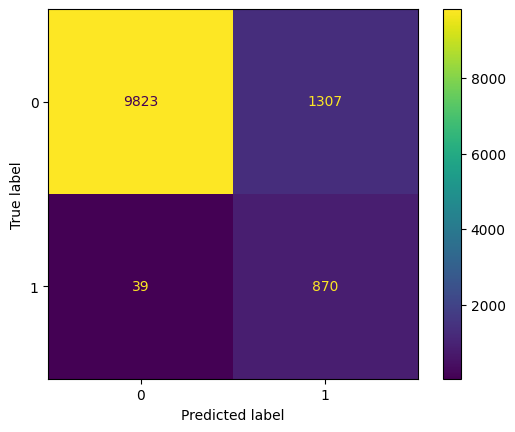

In [ ]:
# Matriz de confusion
cm_brf = confusion_matrix(y_test, y_pred_brf)
cm_display = ConfusionMatrixDisplay(cm_brf).plot()

In [ ]:
#calcular métricas para evaluar el rendimiento del algoritmo
accuracy = accuracy_score(y_test, y_pred_brf)
recall = recall_score(y_test, y_pred_brf)
precision = precision_score(y_test, y_pred_brf)
f1 = f1_score(y_test, y_pred_brf)
print("Accuracy:", accuracy)
print("Recall:", recall)
print("Precision:", precision)
print("F1-score:", f1)

Accuracy: 0.8881966940775812
Recall: 0.9570957095709571
Precision: 0.399632521819017
F1-score: 0.5638366817887233


In [ ]:
modelo_brf.score(x_test, y_test)

0.8881966940775812

In [ ]:
modelo_brf.score(x_train, y_train)

0.8972588109647561

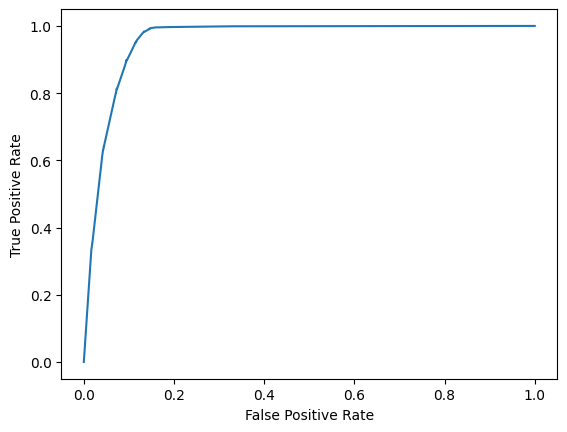

In [ ]:
# AUROC
y_score = modelo_brf.predict_proba(x_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_score, pos_label=modelo_brf.classes_[1])
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot()

In [ ]:
auc=roc_auc_score(y_test, y_score)
auc

0.9577997602096238

**CLASES INVERTIDAS**

In [ ]:
y_test_inv = y_test.values
y_test_inv = 1 - y_test_inv
y_test_inv = pd.Series(y_test_inv)
y_pred_brf_inv = 1 - y_pred_brf
df_pred_inv = pd.DataFrame({'Actual': y_test_inv.squeeze(), 'Predicted': y_pred_brf_inv.squeeze()})

In [ ]:
df_pred.head(20)

,Actual,Predicted
37777,0,0
1215,0,0
418,0,0
11571,0,0
25827,1,1
26319,0,0
25417,0,0
38219,0,0
2793,0,0
689,0,0


In [ ]:
df_pred_inv.head(20)

,Actual,Predicted
0,1,1
1,1,1
2,1,1
3,1,1
4,0,0
5,1,1
6,1,1
7,1,1
8,1,1
9,1,1


In [ ]:
# Calcular métricas al invertir las clases
accuracy_inv = accuracy_score(y_test_inv, y_pred_brf_inv)
recall_inv = recall_score(y_test_inv, y_pred_brf_inv)
precision_inv = precision_score(y_test_inv, y_pred_brf_inv)
f1_inv = f1_score(y_test_inv, y_pred_brf_inv)
print("Accuracy:", accuracy_inv)
print("Recall:", recall_inv)
print("Precision:", precision_inv)
print("F1-score:", f1_inv)

Accuracy: 0.8881966940775812
Recall: 0.8825696316262354
Precision: 0.9960454268910971
F1-score: 0.9358803353658536


In [ ]:
score_inv_result=score_inv_result.append({"Modelo":"BalancedRF","Accuracy":accuracy_inv, "Precision":precision_inv, "Recall":recall_inv, "F1-score":f1_inv}, ignore_index=True)

**VALIDACIÓN CRUZADA**

In [ ]:
# El número de folds
n_folds = 10

# Inicializar listas para almacenar las puntuaciones de las métricas. Nos centramos en las métricas comunes en la literatura
acc_sc = []
prec_sc = []
rcll_sc = []
f1_sc = []

# Crear los objetos KFold
skf = StratifiedKFold(n_splits=n_folds)

for train_index, test_index in skf.split(X, Y):
    # Dividir los datos en entrenamiento y prueba
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    Y_train, Y_test = Y.iloc[train_index], Y.iloc[test_index]

    # Entrenar el modelo
    cv_brf=BalancedRandomForestClassifier(max_depth=20, n_estimators=10, random_state=42)
    cv_brf.fit(X_train, Y_train)

    # Realizar las predicciones en el conjunto de prueba
    Y_pred = cv_brf.predict(X_test)

    # Calcular las métricas
    accuracy = accuracy_score(Y_test, Y_pred)
    recall = recall_score(Y_test, Y_pred)
    precision = precision_score(Y_test, Y_pred)
    f1 = f1_score(Y_test, Y_pred)

    # Agregar las puntuaciones a las listas
    acc_sc.append(accuracy)
    prec_sc.append(precision)
    rcll_sc.append(recall)
    f1_sc.append(f1)

# Calcular la media de las puntuaciones
mean_acc = np.mean(acc_sc)
mean_prec = np.mean(prec_sc)
mean_rcll = np.mean(rcll_sc)
mean_f1 = np.mean(f1_sc)

print(f'CV Accuracy: {mean_acc:.4f}')
print(f'CV Precision: {mean_prec:.4f}')
print(f'CV Recall: {mean_rcll:.4f}')
print(f'CV F1-Score: {mean_f1:.4f}')

CV Accuracy: 0.8840
CV Precision: 0.3910
CV Recall: 0.9551
CV F1-Score: 0.5546


In [ ]:
cv_results = cross_validate(brf, X, Y, cv=10, scoring=('accuracy','precision', 'recall','f1'))

In [ ]:
sorted(cv_results.keys())

['fit_time',
 'score_time',
 'test_accuracy',
 'test_f1',
 'test_precision',
 'test_recall']

In [ ]:
print("Accuracy:\n", cv_results['test_accuracy'], "\n Con una media de: ", np.mean(cv_results['test_accuracy']))
print("Precision:\n" , cv_results['test_precision'], "\n Con una media de: ", np.mean(cv_results['test_precision']))
print("Recall:\n", cv_results['test_recall'], "\n Con una media de: ", np.mean(cv_results['test_recall']))
print("F1-score:\n", cv_results['test_f1'], "\n Con una media de: ", np.mean(cv_results['test_f1']))

Accuracy:
 [0.88786444 0.89284824 0.88960877 0.86967356 0.88736606 0.88661849
 0.87964117 0.88337902 0.88736606 0.87537388] 
 Con una media de:  0.8839739689478785
Precision:
 [0.39834025 0.41043724 0.40331492 0.36419753 0.395218   0.3953168
 0.3828125  0.3871409  0.39863014 0.37420179] 
 Con una media de:  0.3909610067571566
Recall:
 [0.95049505 0.96039604 0.96369637 0.97359736 0.92739274 0.94719472
 0.97029703 0.9339934  0.95723684 0.9669967 ] 
 Con una media de:  0.9551296248045856
F1-score:
 [0.56140351 0.57509881 0.56864654 0.53009883 0.55424063 0.55782313
 0.54901961 0.54738878 0.56286267 0.53959484] 
 Con una media de:  0.5546177360714666


In [ ]:
score_result=score_result.append({"Modelo":"BalancedRF","Accuracy":np.mean(cv_results['test_accuracy']), "Precision":np.mean(cv_results['test_precision']), "Recall":np.mean(cv_results['test_recall']), "F1-score":np.mean(cv_results['test_f1'])}, ignore_index=True)

### **GradientBoosting:**

In [ ]:
modelo=GradientBoostingClassifier(random_state=42)
params={'n_estimators':[10,25,50,75,100,200],'min_samples_split':[2,3,5,10,20],'min_samples_leaf':[1,3,5,10,20],'max_depth':[1,3,5,10,20,30]}
grid=GridSearchCV(modelo,params,cv=10,scoring='f1',verbose=1)
grid.fit(x_train,y_train)

In [ ]:
print(grid.best_params_)
print(grid.best_estimator_)
print(grid.best_score_)

In [ ]:
gb =GradientBoostingClassifier(max_depth=5, min_samples_leaf=25, random_state=42)

In [ ]:
modelo_gb=gb.fit(x_train,y_train)

In [ ]:
y_pred_gb = modelo_gb.predict(x_test)

**EVALUACIÓN MODELO:**

In [ ]:
#comprobación resultados
df_pred = pd.DataFrame({'Actual': y_test.squeeze(), 'Predicted': y_pred_gb.squeeze()})
print(df_pred)

       Actual  Predicted
37777       0          0
1215        0          0
418         0          0
11571       0          0
25827       1          0
...       ...        ...
14095       0          0
17674       0          0
18585       0          0
23423       0          0
12312       0          1

[12039 rows x 2 columns]


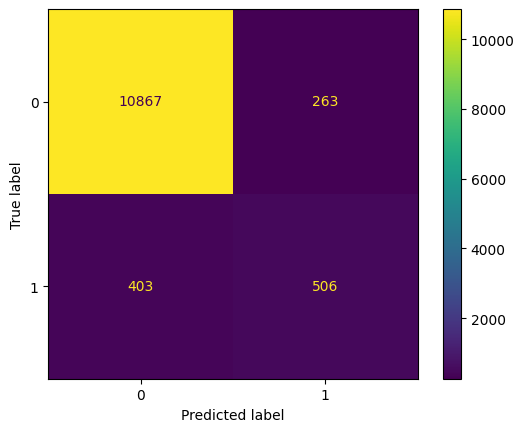

In [ ]:
# Matriz de confusion
cm_gb = confusion_matrix(y_test, y_pred_gb)
cm_display = ConfusionMatrixDisplay(cm_gb).plot()

In [ ]:
#calcular métricas para evaluar el rendimiento del algoritmo
accuracy = accuracy_score(y_test, y_pred_gb)
recall = recall_score(y_test, y_pred_gb)
precision = precision_score(y_test, y_pred_gb)
f1 = f1_score(y_test, y_pred_gb)
print("Accuracy:", accuracy)
print("Recall:", recall)
print("Precision:", precision)
print("F1-score:", f1)

Accuracy: 0.9446797906802891
Recall: 0.5566556655665567
Precision: 0.657997399219766
F1-score: 0.6030989272943981


In [ ]:
modelo_gb.score(x_test, y_test)

0.9446797906802891

In [ ]:
modelo_gb.score(x_train, y_train)

0.9608045567817729

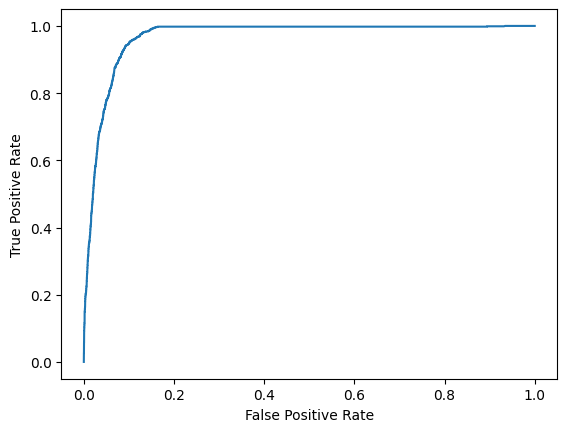

In [ ]:
# AUROC
y_score = modelo_gb.predict_proba(x_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_score, pos_label=modelo_gb.classes_[1])
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot()

In [ ]:
auc=roc_auc_score(y_test, y_score)
auc

0.9669477235234756

**CLASES INVERTIDAS**

In [ ]:
y_test_inv = y_test.values
y_test_inv = 1 - y_test_inv
y_test_inv = pd.Series(y_test_inv)
y_pred_gb_inv = 1 - y_pred_gb
df_pred_inv = pd.DataFrame({'Actual': y_test_inv.squeeze(), 'Predicted': y_pred_gb_inv.squeeze()})

In [ ]:
df_pred.head(20)

,Actual,Predicted
37777,0,0
1215,0,0
418,0,0
11571,0,0
25827,1,0
26319,0,0
25417,0,0
38219,0,0
2793,0,0
689,0,0


In [ ]:
df_pred_inv.head(20)

,Actual,Predicted
0,1,1
1,1,1
2,1,1
3,1,1
4,0,1
5,1,1
6,1,1
7,1,1
8,1,1
9,1,1


In [ ]:
# Calcular métricas al invertir las clases
accuracy_inv = accuracy_score(y_test_inv, y_pred_gb_inv)
recall_inv = recall_score(y_test_inv, y_pred_gb_inv)
precision_inv = precision_score(y_test_inv, y_pred_gb_inv)
f1_inv = f1_score(y_test_inv, y_pred_gb_inv)
print("Accuracy:", accuracy_inv)
print("Recall:", recall_inv)
print("Precision:", precision_inv)
print("F1-score:", f1_inv)

Accuracy: 0.9446797906802891
Recall: 0.9763701707097934
Precision: 0.9642413487133984
F1-score: 0.9702678571428572


In [ ]:
score_inv_result=score_inv_result.append({"Modelo":"GradientBoost","Accuracy":accuracy_inv, "Precision":precision_inv, "Recall":recall_inv, "F1-score":f1_inv}, ignore_index=True)

**VALIDACIÓN CRUZADA**

In [ ]:
# El número de folds
n_folds = 10

# Inicializar listas para almacenar las puntuaciones de las métricas. Nos centramos en las métricas comunes en la literatura
acc_sc = []
prec_sc = []
rcll_sc = []
f1_sc = []

# Crear los objetos KFold
skf = StratifiedKFold(n_splits=n_folds)

for train_index, test_index in skf.split(X, Y):
    # Dividir los datos en entrenamiento y prueba
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    Y_train, Y_test = Y.iloc[train_index], Y.iloc[test_index]

    # Entrenar el modelo
    cv_gb= GradientBoostingClassifier(max_depth=5, min_samples_leaf=25, random_state=42)
    cv_gb.fit(X_train, Y_train)

    # Realizar las predicciones en el conjunto de prueba
    Y_pred = cv_gb.predict(X_test)

    # Calcular las métricas
    accuracy = accuracy_score(Y_test, Y_pred)
    recall = recall_score(Y_test, Y_pred)
    precision = precision_score(Y_test, Y_pred)
    f1 = f1_score(Y_test, Y_pred)

    # Agregar las puntuaciones a las listas
    acc_sc.append(accuracy)
    prec_sc.append(precision)
    rcll_sc.append(recall)
    f1_sc.append(f1)

# Calcular la media de las puntuaciones
mean_acc = np.mean(acc_sc)
mean_prec = np.mean(prec_sc)
mean_rcll = np.mean(rcll_sc)
mean_f1 = np.mean(f1_sc)

print(f'CV Accuracy: {mean_acc:.4f}')
print(f'CV Precision: {mean_prec:.4f}')
print(f'CV Recall: {mean_rcll:.4f}')
print(f'CV F1-Score: {mean_f1:.4f}')

CV Accuracy: 0.9467
CV Precision: 0.6819
CV Recall: 0.5549
CV F1-Score: 0.6111


In [ ]:
cv_results = cross_validate(gb, X, Y, cv=10, scoring=('accuracy','precision', 'recall','f1'))

In [ ]:
sorted(cv_results.keys())

['fit_time',
 'score_time',
 'test_accuracy',
 'test_f1',
 'test_precision',
 'test_recall']

In [ ]:
print("Accuracy:\n", cv_results['test_accuracy'], "\n Con una media de: ", np.mean(cv_results['test_accuracy']))
print("Precision:\n" , cv_results['test_precision'], "\n Con una media de: ", np.mean(cv_results['test_precision']))
print("Recall:\n", cv_results['test_recall'], "\n Con una media de: ", np.mean(cv_results['test_recall']))
print("F1-score:\n", cv_results['test_f1'], "\n Con una media de: ", np.mean(cv_results['test_f1']))

Accuracy:
 [0.94418141 0.94318465 0.94916521 0.9469225  0.94667331 0.94492898
 0.94218789 0.95066035 0.95041116 0.94865404] 
 Con una media de:  0.9466969512593542
Precision:
 [0.65612648 0.64367816 0.7239819  0.69396552 0.68016194 0.66942149
 0.6381323  0.73542601 0.70588235 0.67259786] 
 Con una media de:  0.6819374014148305
Recall:
 [0.54785479 0.55445545 0.52805281 0.53135314 0.55445545 0.53465347
 0.54125413 0.54125413 0.59210526 0.62376238] 
 Con una media de:  0.5549200972728852
F1-score:
 [0.5971223  0.59574468 0.61068702 0.60186916 0.61090909 0.59449541
 0.58571429 0.62357414 0.64400716 0.64726027] 
 Con una media de:  0.6111383528350376


In [ ]:
score_result=score_result.append({"Modelo":"GradientBoosting","Accuracy":np.mean(cv_results['test_accuracy']), "Precision":np.mean(cv_results['test_precision']), "Recall":np.mean(cv_results['test_recall']), "F1-score":np.mean(cv_results['test_f1'])}, ignore_index=True)

### **ADABoost:**

In [ ]:
modelo=AdaBoostClassifier(random_state=42)
params={'n_estimators':[5,10,25,50,75,100,200],'learning_rate':[0.2,0.4,0.6,0.8,1.0,1.2,1.4,1.6,1.8,2.0,3.0,5.0], 'algorithm':['SAMME','SAMME.R']}
grid=GridSearchCV(modelo,params,cv=10,scoring='f1',verbose=1)
grid.fit(x_train,y_train)

Fitting 10 folds for each of 72 candidates, totalling 720 fits


GridSearchCV(cv=10, estimator=AdaBoostClassifier(random_state=42),
             param_grid={'learning_rate': [0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4,
                                           1.6, 1.8, 2.0, 3.0, 5.0],
                         'n_estimators': [10, 25, 50, 75, 100, 200]},
             scoring='f1', verbose=1)

In [ ]:
print(grid.best_params_)
print(grid.best_estimator_)
print(grid.best_score_)

{'learning_rate': 0.8, 'n_estimators': 10}
AdaBoostClassifier(learning_rate=0.8, n_estimators=10, random_state=42)
0.6383748901575536


In [ ]:
ada=AdaBoostClassifier(learning_rate=0.8, n_estimators=5, random_state=42)

In [ ]:
modelo_ada=ada.fit(x_train,y_train)

In [ ]:
y_pred_ada = modelo_ada.predict(x_test)

**EVALUACIÓN MODELO:**

In [ ]:
#comprobación resultados
df_pred = pd.DataFrame({'Actual': y_test.squeeze(), 'Predicted': y_pred_ada.squeeze()})
print(df_pred)

       Actual  Predicted
37777       0          0
1215        0          0
418         0          0
11571       0          0
25827       1          0
...       ...        ...
14095       0          0
17674       0          0
18585       0          0
23423       0          1
12312       0          0

[12039 rows x 2 columns]


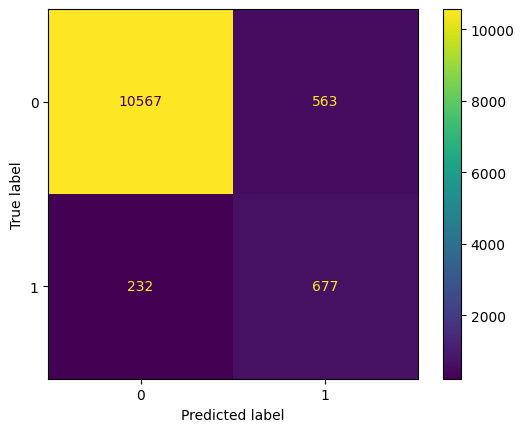

In [ ]:
# Matriz de confusion
cm_ada = confusion_matrix(y_test, y_pred_ada)
cm_display = ConfusionMatrixDisplay(cm_ada).plot()

In [ ]:
#calcular métricas para evaluar el rendimiento del algoritmo
accuracy = accuracy_score(y_test, y_pred_ada)
recall = recall_score(y_test, y_pred_ada)
precision = precision_score(y_test, y_pred_ada)
f1 = f1_score(y_test, y_pred_ada)
print("Accuracy:", accuracy)
print("Recall:", recall)
print("Precision:", precision)
print("F1-score:", f1)

Accuracy: 0.933964615001246
Recall: 0.7447744774477447
Precision: 0.5459677419354839
F1-score: 0.6300604932526757


In [ ]:
modelo_ada.score(x_test, y_test)

0.933964615001246

In [ ]:
modelo_ada.score(x_train, y_train)

0.934496262014952

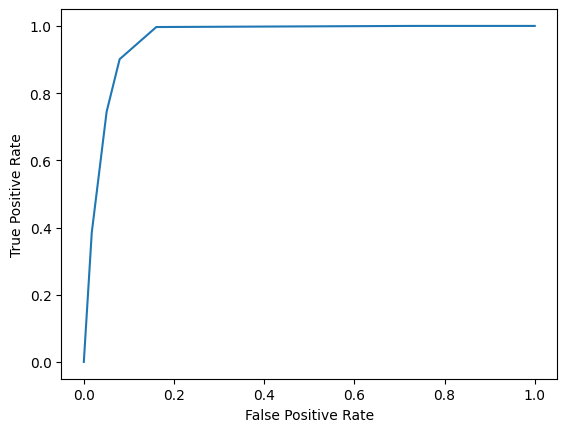

In [ ]:
# AUROC
y_score = modelo_ada.predict_proba(x_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_score, pos_label=modelo_ada.classes_[1])
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot()

In [ ]:
auc=roc_auc_score(y_test, y_score)
auc

0.9612319452969554

**CLASES INVERTIDAS**

In [ ]:
y_test_inv = y_test.values
y_test_inv = 1 - y_test_inv
y_test_inv = pd.Series(y_test_inv)
y_pred_ada_inv = 1 - y_pred_ada
df_pred_inv = pd.DataFrame({'Actual': y_test_inv.squeeze(), 'Predicted': y_pred_ada_inv.squeeze()})

In [ ]:
df_pred.head(20)

,Actual,Predicted
37777,0,0
1215,0,0
418,0,0
11571,0,0
25827,1,0
26319,0,0
25417,0,0
38219,0,0
2793,0,0
689,0,0


In [ ]:
df_pred_inv.head(20)

,Actual,Predicted
0,1,1
1,1,1
2,1,1
3,1,1
4,0,1
5,1,1
6,1,1
7,1,1
8,1,1
9,1,1


In [ ]:
# Calcular métricas al invertir las clases
accuracy_inv = accuracy_score(y_test_inv, y_pred_ada_inv)
recall_inv = recall_score(y_test_inv, y_pred_ada_inv)
precision_inv = precision_score(y_test_inv, y_pred_ada_inv)
f1_inv = f1_score(y_test_inv, y_pred_ada_inv)
print("Accuracy:", accuracy_inv)
print("Recall:", recall_inv)
print("Precision:", precision_inv)
print("F1-score:", f1_inv)

Accuracy: 0.933964615001246
Recall: 0.9494159928122192
Precision: 0.9785165293082693
F1-score: 0.9637466368735464


In [ ]:
score_inv_result=score_inv_result.append({"Modelo":"AdaBoost","Accuracy":accuracy_inv, "Precision":precision_inv, "Recall":recall_inv, "F1-score":f1_inv}, ignore_index=True)

**VALIDACIÓN CRUZADA**

In [ ]:
# El número de folds
n_folds = 10

# Inicializar listas para almacenar las puntuaciones de las métricas. Nos centramos en las métricas comunes en la literatura
acc_sc = []
prec_sc = []
rcll_sc = []
f1_sc = []

# Crear los objetos KFold
skf = StratifiedKFold(n_splits=n_folds)

for train_index, test_index in skf.split(X, Y):
    # Dividir los datos en entrenamiento y prueba
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    Y_train, Y_test = Y.iloc[train_index], Y.iloc[test_index]

    # Entrenar el modelo
    cv_ada=AdaBoostClassifier(learning_rate=0.8, n_estimators=5, random_state=42)
    cv_ada.fit(X_train, Y_train)

    # Realizar las predicciones en el conjunto de prueba
    Y_pred = cv_ada.predict(X_test)

    # Calcular las métricas
    accuracy = accuracy_score(Y_test, Y_pred)
    recall = recall_score(Y_test, Y_pred)
    precision = precision_score(Y_test, Y_pred)
    f1 = f1_score(Y_test, Y_pred)

    # Agregar las puntuaciones a las listas
    acc_sc.append(accuracy)
    prec_sc.append(precision)
    rcll_sc.append(recall)
    f1_sc.append(f1)

# Calcular la media de las puntuaciones
mean_acc = np.mean(acc_sc)
mean_prec = np.mean(prec_sc)
mean_rcll = np.mean(rcll_sc)
mean_f1 = np.mean(f1_sc)

print(f'CV Accuracy: {mean_acc:.4f}')
print(f'CV Precision: {mean_prec:.4f}')
print(f'CV Recall: {mean_rcll:.4f}')
print(f'CV F1-Score: {mean_f1:.4f}')

CV Accuracy: 0.9343
CV Precision: 0.5491
CV Recall: 0.7361
CV F1-Score: 0.6287


In [ ]:
cv_results = cross_validate(ada, X, Y, cv=10, scoring=('accuracy','precision', 'recall','f1'))

In [ ]:
sorted(cv_results.keys())

['fit_time',
 'score_time',
 'test_accuracy',
 'test_f1',
 'test_precision',
 'test_recall']

In [ ]:
print("Accuracy:\n", cv_results['test_accuracy'], "\n Con una media de: ", np.mean(cv_results['test_accuracy']))
print("Precision:\n" , cv_results['test_precision'], "\n Con una media de: ", np.mean(cv_results['test_precision']))
print("Recall:\n", cv_results['test_recall'], "\n Con una media de: ", np.mean(cv_results['test_recall']))
print("F1-score:\n", cv_results['test_f1'], "\n Con una media de: ", np.mean(cv_results['test_f1']))

Accuracy:
 [0.93346623 0.92997757 0.93620733 0.93421381 0.93321704 0.93570895
 0.93521057 0.94069275 0.93271866 0.93195414] 
 Con una media de:  0.9343367045636081
Precision:
 [0.54477612 0.52696078 0.56167979 0.54814815 0.5440806  0.55474453
 0.55361596 0.58354756 0.54126214 0.5326087 ] 
 Con una media de:  0.5491424321487426
Recall:
 [0.72277228 0.70957096 0.70627063 0.73267327 0.71287129 0.75247525
 0.73267327 0.74917492 0.73355263 0.80858086] 
 Con una media de:  0.7360615337849574
F1-score:
 [0.6212766  0.604782   0.62573099 0.62711864 0.61714286 0.63865546
 0.63068182 0.65606936 0.62290503 0.64220183] 
 Con una media de:  0.628656459561833


In [ ]:
score_result=score_result.append({"Modelo":"AdaBoost","Accuracy":np.mean(cv_results['test_accuracy']), "Precision":np.mean(cv_results['test_precision']), "Recall":np.mean(cv_results['test_recall']), "F1-score":np.mean(cv_results['test_f1'])}, ignore_index=True)

### **RUSBoost:**

In [ ]:
modelo=RUSBoostClassifier(random_state=42)
params={'n_estimators':[5,10,25,50,75,100,200], 'learning_rate':[0.2,0.4,0.6,0.8,1.0,1.2,1.4,1.6,1.8,2.0,3.0,5.0], 'algorithm':['SAMME','SAMME.R'], 'replacement':[True, False]}
grid=GridSearchCV(modelo,params,cv=10,scoring='f1',verbose=1)
grid.fit(x_train,y_train)

Fitting 10 folds for each of 84 candidates, totalling 840 fits


GridSearchCV(cv=10, estimator=RUSBoostClassifier(random_state=42),
             param_grid={'learning_rate': [0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4,
                                           1.6, 1.8, 2.0, 3.0, 5.0],
                         'n_estimators': [5, 10, 25, 50, 75, 100, 200]},
             scoring='f1', verbose=1)

In [ ]:
print(grid.best_params_)
print(grid.best_estimator_)
print(grid.best_score_)

{'learning_rate': 1.8, 'n_estimators': 5}
RUSBoostClassifier(learning_rate=1.8, n_estimators=5, random_state=42)
0.5990130841047085


In [ ]:
rus = RUSBoostClassifier(learning_rate=1.8, n_estimators=5, random_state=42)

In [ ]:
modelo_rus=rus.fit(x_train,y_train)

In [ ]:
y_pred_rus = modelo_rus.predict(x_test)

**EVALUACIÓN MODELO:**

In [ ]:
#comprobación resultados
df_pred = pd.DataFrame({'Actual': y_test.squeeze(), 'Predicted': y_pred_rus.squeeze()})
print(df_pred)

       Actual  Predicted
37777       0          0
1215        0          0
418         0          0
11571       0          0
25827       1          0
...       ...        ...
14095       0          0
17674       0          0
18585       0          0
23423       0          1
12312       0          0

[12039 rows x 2 columns]


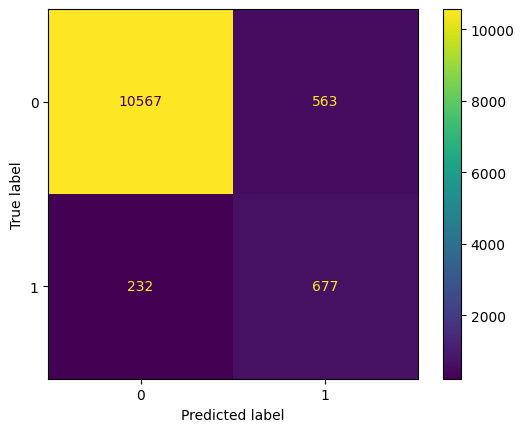

In [ ]:
# Matriz de confusion
cm_rus = confusion_matrix(y_test, y_pred_rus)
cm_display = ConfusionMatrixDisplay(cm_rus).plot()

In [ ]:
#calcular métricas para evaluar el rendimiento del algoritmo
accuracy = accuracy_score(y_test, y_pred_rus)
recall = recall_score(y_test, y_pred_rus)
precision = precision_score(y_test, y_pred_rus)
f1 = f1_score(y_test, y_pred_rus)
print("Accuracy:", accuracy)
print("Recall:", recall)
print("Precision:", precision)
print("F1-score:", f1)

Accuracy: 0.933964615001246
Recall: 0.7447744774477447
Precision: 0.5459677419354839
F1-score: 0.6300604932526757


In [ ]:
modelo_rus.score(x_test, y_test)

0.933964615001246

In [ ]:
modelo_rus.score(x_train, y_train)

0.934496262014952

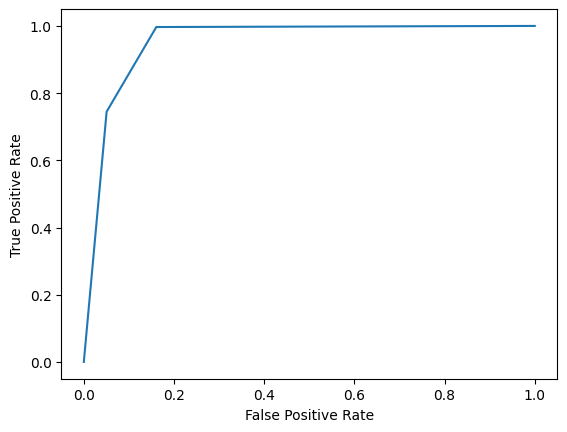

In [ ]:
# AUROC
y_score = modelo_rus.predict_proba(x_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_score, pos_label=modelo_rus.classes_[1])
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot()

In [ ]:
auc=roc_auc_score(y_test, y_score)
auc

0.9526292431579187

**CLASES INVERTIDAS**

In [ ]:
y_test_inv = y_test.values
y_test_inv = 1 - y_test_inv
y_test_inv = pd.Series(y_test_inv)
y_pred_rus_inv = 1 - y_pred_rus
df_pred_inv = pd.DataFrame({'Actual': y_test_inv.squeeze(), 'Predicted': y_pred_rus_inv.squeeze()})

In [ ]:
df_pred.head(20)

,Actual,Predicted
37777,0,0
1215,0,0
418,0,0
11571,0,0
25827,1,0
26319,0,0
25417,0,0
38219,0,0
2793,0,0
689,0,0


In [ ]:
df_pred_inv.head(20)

,Actual,Predicted
0,1,1
1,1,1
2,1,1
3,1,1
4,0,1
5,1,1
6,1,1
7,1,1
8,1,1
9,1,1


In [ ]:
# Calcular métricas al invertir las clases
accuracy_inv = accuracy_score(y_test_inv, y_pred_rus_inv)
recall_inv = recall_score(y_test_inv, y_pred_rus_inv)
precision_inv = precision_score(y_test_inv, y_pred_rus_inv)
f1_inv = f1_score(y_test_inv, y_pred_rus_inv)
print("Accuracy:", accuracy_inv)
print("Recall:", recall_inv)
print("Precision:", precision_inv)
print("F1-score:", f1_inv)

Accuracy: 0.933964615001246
Recall: 0.9494159928122192
Precision: 0.9785165293082693
F1-score: 0.9637466368735464


In [ ]:
score_inv_result=score_inv_result.append({"Modelo":"RUSBoost","Accuracy":accuracy_inv, "Precision":precision_inv, "Recall":recall_inv, "F1-score":f1_inv}, ignore_index=True)

**VALIDACIÓN CRUZADA**

In [ ]:
# El número de folds
n_folds = 10

# Inicializar listas para almacenar las puntuaciones de las métricas. Nos centramos en las métricas comunes en la literatura
acc_sc = []
prec_sc = []
rcll_sc = []
f1_sc = []

# Crear los objetos KFold
skf = StratifiedKFold(n_splits=n_folds)

for train_index, test_index in skf.split(X, Y):
    # Dividir los datos en entrenamiento y prueba
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    Y_train, Y_test = Y.iloc[train_index], Y.iloc[test_index]

    # Entrenar el modelo
    cv_rus= RUSBoostClassifier(learning_rate=1.8, n_estimators=5, random_state=42)
    cv_rus.fit(X_train, Y_train)

    # Realizar las predicciones en el conjunto de prueba
    Y_pred = cv_rus.predict(X_test)

    # Calcular las métricas
    accuracy = accuracy_score(Y_test, Y_pred)
    recall = recall_score(Y_test, Y_pred)
    precision = precision_score(Y_test, Y_pred)
    f1 = f1_score(Y_test, Y_pred)

    # Agregar las puntuaciones a las listas
    acc_sc.append(accuracy)
    prec_sc.append(precision)
    rcll_sc.append(recall)
    f1_sc.append(f1)

# Calcular la media de las puntuaciones
mean_acc = np.mean(acc_sc)
mean_prec = np.mean(prec_sc)
mean_rcll = np.mean(rcll_sc)
mean_f1 = np.mean(f1_sc)

print(f'CV Accuracy: {mean_acc:.4f}')
print(f'CV Precision: {mean_prec:.4f}')
print(f'CV Recall: {mean_rcll:.4f}')
print(f'CV F1-Score: {mean_f1:.4f}')

CV Accuracy: 0.9343
CV Precision: 0.5491
CV Recall: 0.7361
CV F1-Score: 0.6287


In [ ]:
cv_results = cross_validate(rus, X, Y, cv=10, scoring=('accuracy','precision', 'recall','f1'))

In [ ]:
sorted(cv_results.keys())

['fit_time',
 'score_time',
 'test_accuracy',
 'test_f1',
 'test_precision',
 'test_recall']

In [ ]:
print("Accuracy:\n", cv_results['test_accuracy'], "\n Con una media de: ", np.mean(cv_results['test_accuracy']))
print("Precision:\n" , cv_results['test_precision'], "\n Con una media de: ", np.mean(cv_results['test_precision']))
print("Recall:\n", cv_results['test_recall'], "\n Con una media de: ", np.mean(cv_results['test_recall']))
print("F1-score:\n", cv_results['test_f1'], "\n Con una media de: ", np.mean(cv_results['test_f1']))

Accuracy:
 [0.93346623 0.92997757 0.93620733 0.93421381 0.93321704 0.93570895
 0.93521057 0.94069275 0.93271866 0.93195414] 
 Con una media de:  0.9343367045636081
Precision:
 [0.54477612 0.52696078 0.56167979 0.54814815 0.5440806  0.55474453
 0.55361596 0.58354756 0.54126214 0.5326087 ] 
 Con una media de:  0.5491424321487426
Recall:
 [0.72277228 0.70957096 0.70627063 0.73267327 0.71287129 0.75247525
 0.73267327 0.74917492 0.73355263 0.80858086] 
 Con una media de:  0.7360615337849574
F1-score:
 [0.6212766  0.604782   0.62573099 0.62711864 0.61714286 0.63865546
 0.63068182 0.65606936 0.62290503 0.64220183] 
 Con una media de:  0.628656459561833


In [ ]:
score_result=score_result.append({"Modelo":"RUSBoost","Accuracy":np.mean(cv_results['test_accuracy']), "Precision":np.mean(cv_results['test_precision']), "Recall":np.mean(cv_results['test_recall']), "F1-score":np.mean(cv_results['test_f1'])}, ignore_index=True)

# **Instancias comunes:**

In [ ]:
# Crear un DataFrame con las predicciones de cada modelo y la etiqueta real
pred_modelos_df = pd.DataFrame({
    'RandomForest': y_pred_rf,
    'BalancedRF': y_pred_brf,
    'GradientBoost': y_pred_gb,
    'AdaBoost': y_pred_ada,
    'RUSBoost': y_pred_rus,
    'Etiqueta': y_test
})

In [ ]:
pred_modelos_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta
37777,0,0,0,0,0,0
1215,0,0,0,0,0,0
418,0,0,0,0,0,0
11571,0,0,0,0,0,0
25827,1,1,0,0,0,1
...,...,...,...,...,...,...
14095,0,0,0,0,0,0
17674,0,0,0,0,0,0
18585,0,0,0,0,0,0
23423,0,1,0,1,1,0


In [ ]:
# Filtrar las instancias que tienen valor 1 en todas las columnas de los modelos
filtro_1 = pred_modelos_df[['RandomForest', 'BalancedRF', 'GradientBoost', 'AdaBoost', 'RUSBoost']].all(axis=1)

# Filtrar las instancias que tienen valor 0 en todas las columnas de los modelos
filtro_0 = (~pred_modelos_df[['RandomForest', 'BalancedRF', 'GradientBoost', 'AdaBoost', 'RUSBoost']].any(axis=1)) & (~filtro_1)

# Aplicar los filtros al DataFrame de las predicciones
df_comunes = pred_modelos_df[filtro_1 | filtro_0]

In [ ]:
df_comunes

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta
37777,0,0,0,0,0,0
1215,0,0,0,0,0,0
418,0,0,0,0,0,0
11571,0,0,0,0,0,0
26319,0,0,0,0,0,0
...,...,...,...,...,...,...
9890,0,0,0,0,0,0
7822,0,0,0,0,0,0
14095,0,0,0,0,0,0
17674,0,0,0,0,0,0


In [ ]:
# Filtrar las instancias que son Verdadero Positivo
vp_df = pred_modelos_df[(pred_modelos_df['RandomForest'] == 1) & (pred_modelos_df['BalancedRF'] == 1) & (pred_modelos_df['GradientBoost'] == 1) & (pred_modelos_df['AdaBoost'] == 1) & (pred_modelos_df['RUSBoost'] == 1) & (pred_modelos_df['Etiqueta'] == 1)]

# Filtrar las instancias que son Verdadero Negativo
vn_df = pred_modelos_df[(pred_modelos_df['RandomForest'] == 0) & (pred_modelos_df['BalancedRF'] == 0) & (pred_modelos_df['GradientBoost'] == 0) & (pred_modelos_df['AdaBoost'] == 0) & (pred_modelos_df['RUSBoost'] == 0) & (pred_modelos_df['Etiqueta'] == 0)]

# Filtrar las instancias que son Falso Positivo
fp_df = pred_modelos_df[(pred_modelos_df['RandomForest'] == 1) & (pred_modelos_df['BalancedRF'] == 1) & (pred_modelos_df['GradientBoost'] == 1) & (pred_modelos_df['AdaBoost'] == 1) & (pred_modelos_df['RUSBoost'] == 1) & (pred_modelos_df['Etiqueta'] == 0)]

# Filtrar las instancias que son Falso Negativo
fn_df = pred_modelos_df[(pred_modelos_df['RandomForest'] == 0) & (pred_modelos_df['BalancedRF'] == 0) & (pred_modelos_df['GradientBoost'] == 0) & (pred_modelos_df['AdaBoost'] == 0) & (pred_modelos_df['RUSBoost'] == 0) & (pred_modelos_df['Etiqueta'] == 1)]


In [ ]:
vp_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta
24147,1,1,1,1,1,1
16104,1,1,1,1,1,1
4575,1,1,1,1,1,1
5082,1,1,1,1,1,1
9680,1,1,1,1,1,1
...,...,...,...,...,...,...
20824,1,1,1,1,1,1
4102,1,1,1,1,1,1
36874,1,1,1,1,1,1
3298,1,1,1,1,1,1


In [ ]:
vn_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta
37777,0,0,0,0,0,0
1215,0,0,0,0,0,0
418,0,0,0,0,0,0
11571,0,0,0,0,0,0
26319,0,0,0,0,0,0
...,...,...,...,...,...,...
9890,0,0,0,0,0,0
7822,0,0,0,0,0,0
14095,0,0,0,0,0,0
17674,0,0,0,0,0,0


In [ ]:
fp_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta
34203,1,1,1,1,1,0
37263,1,1,1,1,1,0
6434,1,1,1,1,1,0
3081,1,1,1,1,1,0
5050,1,1,1,1,1,0
...,...,...,...,...,...,...
11717,1,1,1,1,1,0
30735,1,1,1,1,1,0
33321,1,1,1,1,1,0
27334,1,1,1,1,1,0


In [ ]:
fn_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta
9607,0,0,0,0,0,1
18389,0,0,0,0,0,1
33850,0,0,0,0,0,1
27259,0,0,0,0,0,1
9531,0,0,0,0,0,1
19515,0,0,0,0,0,1
31342,0,0,0,0,0,1
21641,0,0,0,0,0,1
4514,0,0,0,0,0,1
2319,0,0,0,0,0,1


In [ ]:
indices_vp = vp_df.index.tolist()
indices_vn = vn_df.index.tolist()
indices_fp = fp_df.index.tolist()
indices_fn = fn_df.index.tolist()

In [ ]:
vp_instancias = x_test.loc[indices_vp]
vn_instancias = x_test.loc[indices_vn]
fp_instancias = x_test.loc[indices_fp]
fn_instancias = x_test.loc[indices_fn]

**VALOR DE PREDICCION INSTANCIAS COMUNES:**

In [ ]:
# Valor de la predicciones para RandomForest
valor_pred_rf_vp = modelo_rf.predict_proba(vp_instancias)
valor_pred_rf_vn = modelo_rf.predict_proba(vn_instancias)
valor_pred_rf_fp = modelo_rf.predict_proba(fp_instancias)
valor_pred_rf_fn = modelo_rf.predict_proba(fn_instancias)

proba_rf_vp = valor_pred_rf_vp[:, 1] # selecciona la probabilidad estimada de la clase positiva de los verdaderos positivos
proba_rf_vn = valor_pred_rf_vn[:, 0] # selecciona la probabilidad estimada de la clase negativa de los verdaderos negativos
proba_rf_fp = valor_pred_rf_fp[:, 1] # selecciona la probabilidad estimada de la clase positiva de los falsos positivos
proba_rf_fn = valor_pred_rf_fn[:, 0] # selecciona la probabilidad estimada de la clase negativa de los falsos negativos

proba_rf_vp = pd.Series(proba_rf_vp, index=vp_df.index) # transformamos en series de pandas
proba_rf_vn = pd.Series(proba_rf_vn, index=vn_df.index)
proba_rf_fp = pd.Series(proba_rf_fp, index=fp_df.index)
proba_rf_fn = pd.Series(proba_rf_fn, index=fn_df.index)

vp_df['RF V.Pred'] = proba_rf_vp # añadir los valores a los dataframe
vn_df['RF V.Pred'] = proba_rf_vn
fp_df['RF V.Pred'] = proba_rf_fp
fn_df['RF V.Pred'] = proba_rf_fn

# Valor de la predicciones para BalancedRandomForest
valor_pred_brf_vp = modelo_brf.predict_proba(vp_instancias)
valor_pred_brf_vn = modelo_brf.predict_proba(vn_instancias)
valor_pred_brf_fp = modelo_brf.predict_proba(fp_instancias)
valor_pred_brf_fn = modelo_brf.predict_proba(fn_instancias)

proba_brf_vp = valor_pred_brf_vp[:, 1]
proba_brf_vn = valor_pred_brf_vn[:, 0]
proba_brf_fp = valor_pred_brf_fp[:, 1]
proba_brf_fn = valor_pred_brf_fn[:, 0]

proba_brf_vp = pd.Series(proba_brf_vp, index=vp_df.index)
proba_brf_vn = pd.Series(proba_brf_vn, index=vn_df.index)
proba_brf_fp = pd.Series(proba_brf_fp, index=fp_df.index)
proba_brf_fn = pd.Series(proba_brf_fn, index=fn_df.index)

vp_df['BRF V.Pred'] = proba_brf_vp
vn_df['BRF V.Pred'] = proba_brf_vn
fp_df['BRF V.Pred'] = proba_brf_fp
fn_df['BRF V.Pred'] = proba_brf_fn

# Valor de la predicciones para GradientBoosting
valor_pred_gb_vp = modelo_gb.predict_proba(vp_instancias)
valor_pred_gb_vn = modelo_gb.predict_proba(vn_instancias)
valor_pred_gb_fp = modelo_gb.predict_proba(fp_instancias)
valor_pred_gb_fn = modelo_gb.predict_proba(fn_instancias)

proba_gb_vp = valor_pred_gb_vp[:, 1]
proba_gb_vn = valor_pred_gb_vn[:, 0]
proba_gb_fp = valor_pred_gb_fp[:, 1]
proba_gb_fn = valor_pred_gb_fn[:, 0]

proba_gb_vp = pd.Series(proba_gb_vp, index=vp_df.index)
proba_gb_vn = pd.Series(proba_gb_vn, index=vn_df.index)
proba_gb_fp = pd.Series(proba_gb_fp, index=fp_df.index)
proba_gb_fn = pd.Series(proba_gb_fn, index=fn_df.index)

vp_df['GB V.Pred'] = proba_gb_vp
vn_df['GB V.Pred'] = proba_gb_vn
fp_df['GB V.Pred'] = proba_gb_fp
fn_df['GB V.Pred'] = proba_gb_fn

# Valor de la predicciones para AdaBoost
valor_pred_ada_vp = modelo_ada.predict_proba(vp_instancias)
valor_pred_ada_vn = modelo_ada.predict_proba(vn_instancias)
valor_pred_ada_fp = modelo_ada.predict_proba(fp_instancias)
valor_pred_ada_fn = modelo_ada.predict_proba(fn_instancias)

proba_ada_vp = valor_pred_ada_vp[:, 1]
proba_ada_vn = valor_pred_ada_vn[:, 0]
proba_ada_fp = valor_pred_ada_fp[:, 1]
proba_ada_fn = valor_pred_ada_fn[:, 0]

proba_ada_vp = pd.Series(proba_ada_vp, index=vp_df.index)
proba_ada_vn = pd.Series(proba_ada_vn, index=vn_df.index)
proba_ada_fp = pd.Series(proba_ada_fp, index=fp_df.index)
proba_ada_fn = pd.Series(proba_ada_fn, index=fn_df.index)

vp_df['AB V.Pred'] = proba_ada_vp
vn_df['AB V.Pred'] = proba_ada_vn
fp_df['AB V.Pred'] = proba_ada_fp
fn_df['AB V.Pred'] = proba_ada_fn

# Valor de la predicciones para RUSBoos
valor_pred_rus_vp = modelo_rus.predict_proba(vp_instancias)
valor_pred_rus_vn = modelo_rus.predict_proba(vn_instancias)
valor_pred_rus_fp = modelo_rus.predict_proba(fp_instancias)
valor_pred_rus_fn = modelo_rus.predict_proba(fn_instancias)

proba_rus_vp = valor_pred_rus_vp[:, 1]
proba_rus_vn = valor_pred_rus_vn[:, 0]
proba_rus_fp = valor_pred_rus_fp[:, 1]
proba_rus_fn = valor_pred_rus_fn[:, 0]

proba_rus_vp = pd.Series(proba_rus_vp, index=vp_df.index)
proba_rus_vn = pd.Series(proba_rus_vn, index=vn_df.index)
proba_rus_fp = pd.Series(proba_rus_fp, index=fp_df.index)
proba_rus_fn = pd.Series(proba_rus_fn, index=fn_df.index)

vp_df['RB V.Pred'] = proba_rus_vp
vn_df['RB V.Pred'] = proba_rus_vn
fp_df['RB V.Pred'] = proba_rus_fp
fn_df['RB V.Pred'] = proba_rus_fn

In [ ]:
# Cálculo de la media para cada instancia del dataframe
media_vp = vp_df[['RF V.Pred', 'BRF V.Pred', 'GB V.Pred', 'AB V.Pred', 'RB V.Pred']].mean(axis=1)
vp_df['V.Pred media'] = media_vp

media_vn = vn_df[['RF V.Pred', 'BRF V.Pred', 'GB V.Pred', 'AB V.Pred', 'RB V.Pred']].mean(axis=1)
vn_df['V.Pred media'] = media_vn

media_fp = fp_df[['RF V.Pred', 'BRF V.Pred', 'GB V.Pred', 'AB V.Pred', 'RB V.Pred']].mean(axis=1)
fp_df['V.Pred media'] = media_fp

media_fn = fn_df[['RF V.Pred', 'BRF V.Pred', 'GB V.Pred', 'AB V.Pred', 'RB V.Pred']].mean(axis=1)
fn_df['V.Pred media'] = media_fn

In [ ]:
vp_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta,RF V.Pred,BRF V.Pred,GB V.Pred,AB V.Pred,RB V.Pred,V.Pred media
24147,1,1,1,1,1,1,0.781956,0.9,0.808945,0.551375,0.607808,0.730017
16104,1,1,1,1,1,1,0.630481,0.8,0.582627,0.551375,0.607808,0.634458
4575,1,1,1,1,1,1,0.662420,0.7,0.850577,0.504859,0.607808,0.665133
5082,1,1,1,1,1,1,0.642821,1.0,0.640195,0.551375,0.607808,0.688440
9680,1,1,1,1,1,1,0.744690,0.9,0.679704,0.504859,0.607808,0.687412
...,...,...,...,...,...,...,...,...,...,...,...,...
20824,1,1,1,1,1,1,0.928767,1.0,0.890786,0.551375,0.607808,0.795747
4102,1,1,1,1,1,1,0.740538,0.8,0.552356,0.551375,0.607808,0.650415
36874,1,1,1,1,1,1,0.680860,0.9,0.715178,0.551375,0.607808,0.691044
3298,1,1,1,1,1,1,0.781573,1.0,0.613292,0.551375,0.607808,0.710810


In [ ]:
vn_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta,RF V.Pred,BRF V.Pred,GB V.Pred,AB V.Pred,RB V.Pred,V.Pred media
37777,0,0,0,0,0,0,1.000000,1.0,0.999245,0.894655,0.64555,0.907890
1215,0,0,0,0,0,0,1.000000,0.9,0.999311,0.911006,0.64555,0.891173
418,0,0,0,0,0,0,0.987255,1.0,0.999378,0.911006,0.64555,0.908638
11571,0,0,0,0,0,0,0.981502,1.0,0.999144,0.911006,0.64555,0.907440
26319,0,0,0,0,0,0,1.000000,1.0,0.999245,0.894655,0.64555,0.907890
...,...,...,...,...,...,...,...,...,...,...,...,...
9890,0,0,0,0,0,0,1.000000,1.0,0.999245,0.894655,0.64555,0.907890
7822,0,0,0,0,0,0,0.994154,0.8,0.999252,0.894655,0.64555,0.866722
14095,0,0,0,0,0,0,0.997031,0.9,0.999245,0.911006,0.64555,0.890566
17674,0,0,0,0,0,0,0.995975,0.9,0.999337,0.911006,0.64555,0.890374


In [ ]:
fp_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta,RF V.Pred,BRF V.Pred,GB V.Pred,AB V.Pred,RB V.Pred,V.Pred media
34203,1,1,1,1,1,0,0.772539,0.8,0.752029,0.551375,0.607808,0.696750
37263,1,1,1,1,1,0,0.610472,0.8,0.768006,0.551375,0.607808,0.667532
6434,1,1,1,1,1,0,0.799676,1.0,0.855359,0.551375,0.607808,0.762844
3081,1,1,1,1,1,0,0.715489,0.9,0.642666,0.551375,0.607808,0.683467
5050,1,1,1,1,1,0,0.852815,0.9,0.738937,0.551375,0.607808,0.730187
...,...,...,...,...,...,...,...,...,...,...,...,...
11717,1,1,1,1,1,0,0.756019,0.9,0.591413,0.551375,0.607808,0.681323
30735,1,1,1,1,1,0,0.630231,0.9,0.666388,0.551375,0.607808,0.671160
33321,1,1,1,1,1,0,0.667670,0.9,0.533628,0.551375,0.607808,0.652096
27334,1,1,1,1,1,0,0.765466,0.9,0.803931,0.551375,0.607808,0.725716


In [ ]:
fn_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta,RF V.Pred,BRF V.Pred,GB V.Pred,AB V.Pred,RB V.Pred,V.Pred media
9607,0,0,0,0,0,1,0.805422,0.700000,0.906112,0.639810,0.505232,0.711315
18389,0,0,0,0,0,1,0.663626,0.500000,0.767602,0.595741,0.505232,0.606440
33850,0,0,0,0,0,1,0.879548,0.600000,0.943814,0.639810,0.505232,0.713681
27259,0,0,0,0,0,1,0.910505,0.600000,0.938048,0.639810,0.505232,0.718719
9531,0,0,0,0,0,1,0.893575,0.500000,0.947750,0.639810,0.505232,0.697273
19515,0,0,0,0,0,1,0.865204,0.583333,0.950647,0.639810,0.505232,0.708845
31342,0,0,0,0,0,1,0.839388,0.500000,0.925811,0.639810,0.505232,0.682048
21641,0,0,0,0,0,1,0.984082,0.900000,0.999255,0.894655,0.645550,0.884708
4514,0,0,0,0,0,1,0.590151,0.600000,0.682383,0.595741,0.505232,0.594701
2319,0,0,0,0,0,1,0.877083,0.600000,0.920044,0.639810,0.505232,0.708434


In [ ]:
# Calcula la instancia con la media máxima
instancia_vp_max = vp_df['V.Pred media'].idxmax()
instancia_vn_max = vn_df['V.Pred media'].idxmax()
instancia_fp_max = fp_df['V.Pred media'].idxmax()
instancia_fn_max = fn_df['V.Pred media'].idxmax()

# Calcula la instancia con la mediana
mediana_vp = vp_df['V.Pred media'].median()
mediana_vn = vn_df['V.Pred media'].median()
mediana_fp = fp_df['V.Pred media'].median()
mediana_fn = fn_df['V.Pred media'].median()

instancia_vp_mediana = vp_df.loc[(vp_df['V.Pred media'] - mediana_vp).abs().idxmin()].name
instancia_vn_mediana = vn_df.loc[(vn_df['V.Pred media'] - mediana_vn).abs().idxmin()].name
instancia_fp_mediana = fp_df.loc[(fp_df['V.Pred media'] - mediana_fp).abs().idxmin()].name
instancia_fn_mediana = fn_df.loc[(fn_df['V.Pred media'] - mediana_fn).abs().idxmin()].name

# Calcula la instancia con la media mínima
instancia_vp_min = vp_df['V.Pred media'].idxmin()
instancia_vn_min = vn_df['V.Pred media'].idxmin()
instancia_fp_min = fp_df['V.Pred media'].idxmin()
instancia_fn_min = fn_df['V.Pred media'].idxmin()

In [ ]:
# Mostrar las instancias
print("La instancia verdadero positivo máxima es: ", instancia_vp_max)
print("La instancia verdadero negativo máxima es: ", instancia_vn_max)
print("La instancia falso positivo máxima es: ", instancia_fp_max)
print("La instancia falso negativo máxima es: ", instancia_fn_max)

print("La instancia verdadero positivo en la mediana es: ", instancia_vp_mediana)
print("La instancia verdadero negativo en la mediana es: ", instancia_vn_mediana)
print("La instancia falso positivo en la mediana es: ", instancia_fp_mediana)
print("La instancia falso negativo en la mediana es: ", instancia_fn_mediana)

print("La instancia verdadero positivo minima es: ", instancia_vp_min)
print("La instancia verdadero negativo minima es: ", instancia_vn_min)
print("La instancia falso positivo minima es: ", instancia_fp_min)
print("La instancia falso negativo minima es: ", instancia_fn_min)

La instancia verdadero positivo máxima es:  14088
La instancia verdadero negativo máxima es:  38538
La instancia falso positivo máxima es:  7453
La instancia falso negativo máxima es:  32970
La instancia verdadero positivo en la mediana es:  34443
La instancia verdadero negativo en la mediana es:  37777
La instancia falso positivo en la mediana es:  6265
La instancia falso negativo en la mediana es:  38113
La instancia verdadero positivo minima es:  27245
La instancia verdadero negativo minima es:  28060
La instancia falso positivo minima es:  48
La instancia falso negativo minima es:  21729


In [ ]:
# Indices del conjunto de prueba
lista_indices = y_test.index.tolist()

In [ ]:
# Posiciones dentro del ndarray de las predicciones
pos_vp_max = lista_indices.index(instancia_vp_max)
pos_vp_min = lista_indices.index(instancia_vp_min)
pos_vp_mediana = lista_indices.index(instancia_vp_mediana)
pos_vn_max = lista_indices.index(instancia_vn_max)
pos_vn_min = lista_indices.index(instancia_vn_min)
pos_vn_mediana = lista_indices.index(instancia_vn_mediana)
pos_fp_max = lista_indices.index(instancia_fp_max)
pos_fp_min = lista_indices.index(instancia_fp_min)
pos_fp_mediana = lista_indices.index(instancia_fp_mediana)
pos_fn_max = lista_indices.index(instancia_fn_max)
pos_fn_min = lista_indices.index(instancia_fn_min)
pos_fn_mediana = lista_indices.index(instancia_fn_mediana)

In [ ]:
df_instancia_vp_max = x_test.loc[instancia_vp_max]
df_instancia_vp_min = x_test.loc[instancia_vp_min]
df_instancia_vp_mediana = x_test.loc[instancia_vp_mediana]
df_instancia_vn_max = x_test.loc[instancia_vn_max]
df_instancia_vn_min = x_test.loc[instancia_vn_min]
df_instancia_vn_mediana = x_test.loc[instancia_vn_mediana]
df_instancia_fp_max = x_test.loc[instancia_fp_max]
df_instancia_fp_min = x_test.loc[instancia_fp_min]
df_instancia_fp_mediana = x_test.loc[instancia_fp_mediana]
df_instancia_fn_max = x_test.loc[instancia_fn_max]
df_instancia_fn_min = x_test.loc[instancia_fn_min]
df_instancia_fn_mediana = x_test.loc[instancia_fn_mediana]

# **Explicabilidad:**

In [ ]:
# Función para evaluar el signo de los valores
def evaluar_valor(valor):
    if valor >= 0:
        return "Positivo"
    else:
        return "Negativo"

In [ ]:
# Crear las columnas del MultiIndex
columns_multi = pd.MultiIndex.from_tuples([
    ('Breakdown', 'Ranking'), ('Breakdown', 'Signo'),
    ('Shapley', 'Ranking'), ('Shapley', 'Signo'),
    ('Lime', 'Ranking'), ('Lime', 'Signo')
])

## **RandomForest:**

**FEATURE IMPORTANCE**

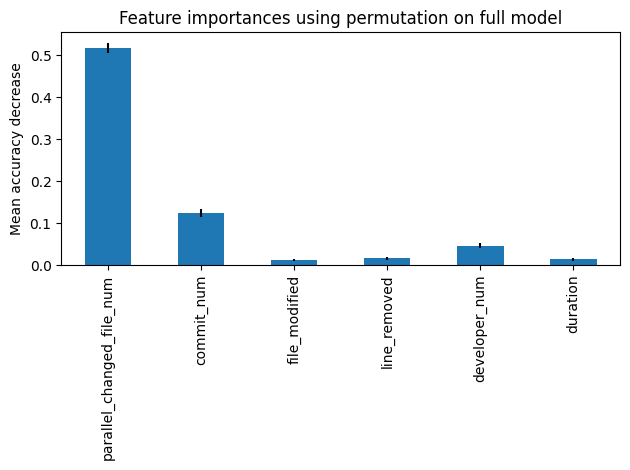

In [ ]:
permu = permutation_importance(modelo_rf, x_test, y_test, n_repeats=20, random_state=42, n_jobs=2, scoring='f1')

# Umbral para valores significativos
importance_threshold = 0.01

# Filtrar los caracteristicas
significant_indices = permu.importances_mean > importance_threshold
permu_importances = pd.Series(permu.importances_mean.round(3), index=feature_names)[significant_indices]
permu_std = permu.importances_std[significant_indices]

# Crear la representación gráfica
fig, ax = plt.subplots()
permu_importances.plot.bar(yerr=permu_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

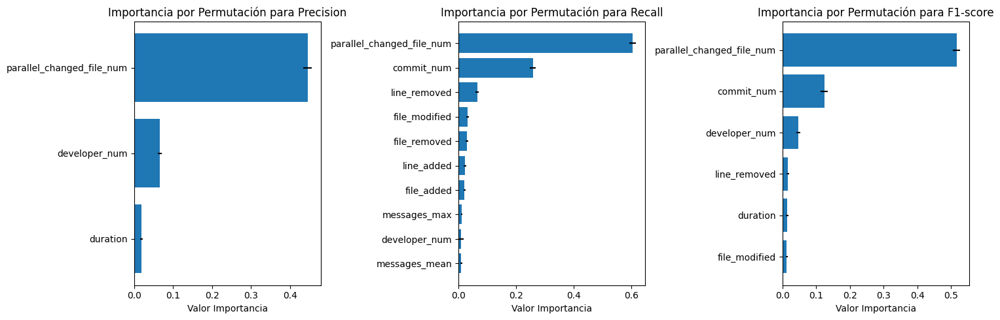

In [ ]:
scoring = ['precision', 'recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

permu_score = permutation_importance(modelo_rf, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Umbral para importancias significativas
importance_threshold = 0.01

# Itera a través de las métricas
for i, metric in enumerate(scoring):
    permu = permu_score[metric]

    # Filtra las características que cumplen la condición del umbral
    significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
    sorted_feature_names = [feature_names[j] for j in significant_indices]
    importances_mean = permu.importances_mean[significant_indices]
    importances_std = permu.importances_std[significant_indices]

    # Ordena los datos por importancia de mayor a menor
    sorted_indices = np.argsort(importances_mean)[::1]
    sorted_feature_names = [sorted_feature_names[j] for j in sorted_indices]
    importances_mean = importances_mean[sorted_indices]
    importances_std = importances_std[sorted_indices]

    # Crea la representación gráfica en el subplot correspondiente
    axs[i].barh(range(len(sorted_feature_names)), importances_mean, xerr=importances_std, align='center')
    axs[i].set_yticks(range(len(sorted_feature_names)))
    axs[i].set_yticklabels(sorted_feature_names)
    axs[i].set_xlabel('Valor Importancia')
    axs[i].set_title(f'Importancia por Permutación para {metric_names[i]}')

# Ajusta los espacios entre subplots y muestra la figura
plt.tight_layout()
plt.show()


In [ ]:
scoring = ['precision','recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

# Umbral para importancias significativas
importance_threshold = 0.01

# Crea un diccionario para almacenar los DataFrames
results_global_rf = {}

permu_score = permutation_importance(modelo_rf, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
for i, metric in enumerate(scoring):
  permu = permu_score[metric]

  # Filtra las características que cumplen la condición
  significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
  sorted_feature_names = [feature_names[j] for j in significant_indices]
  importances_mean = permu.importances_mean[significant_indices]
  importances_std = permu.importances_std[significant_indices]

  # Crear un DataFrame con los resultados
  df_exp_global = pd.DataFrame({'Feature': sorted_feature_names,
                       'Importance_Mean': importances_mean,
                       'Importance_Std': importances_std})

  # Ordenar el DataFrame por importance_mean en orden descendente
  df_exp_global = df_exp_global.sort_values(by='Importance_Mean', ascending=False)

  # Asignar el DataFrame al diccionario con el nombre de la métrica
  results_global_rf[f'df_global_{metric_names[i]}'] = df_exp_global

In [ ]:
results_global_rf['df_global_Precision']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.445969,0.010951
1,developer_num,0.065265,0.005169
2,duration,0.018952,0.003303


In [ ]:
results_global_rf['df_global_Recall']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.605171,0.011427
1,commit_num,0.258196,0.010924
6,line_removed,0.065677,0.005935
4,file_modified,0.032563,0.004238
3,file_removed,0.028658,0.004379
5,line_added,0.022882,0.004790
2,file_added,0.021232,0.004058
8,messages_max,0.011386,0.003213
7,developer_num,0.010231,0.007654
9,messages_mean,0.010121,0.003366


In [ ]:
results_global_rf['df_global_F1-score']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.516689,0.011106
1,commit_num,0.123777,0.010158
4,developer_num,0.046411,0.005630
3,line_removed,0.016247,0.004222
5,duration,0.013588,0.003713
2,file_modified,0.012160,0.002769


**BREAK-DOWN, SHAP Y LIME:**

In [ ]:
#primero definimos el explainer
exp = dx.Explainer(modelo_rf, x_train, y_train)

Preparation of a new explainer is initiated

  -> data              : 28090 rows 25 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 28090 values
  -> model_class       : sklearn.ensemble._forest.RandomForestClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x7ea4d39cf130> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.0, mean = 0.107, max = 0.993
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.857, mean = -0.0319, max = 0.463
  -> model_info        : package sklearn

A new explainer has been created!


### **Instancia VP MAX:**

In [ ]:
breakdown_vp_max = exp.predict_parts(df_instancia_vp_max, type="break_down",random_state=42)
shap_vp_max = exp.predict_parts(df_instancia_vp_max, type="shap",random_state=42)
lime_vp_max = exp.predict_surrogate(df_instancia_vp_max, random_state=42)

breakdown_vp_df_max = breakdown_vp_max.result
shap_vp_df_max = shap_vp_max.result
lime_vp_df_max=lime_vp_max.result

In [ ]:
breakdown_vp_max.plot()

In [ ]:
shap_vp_max.plot()

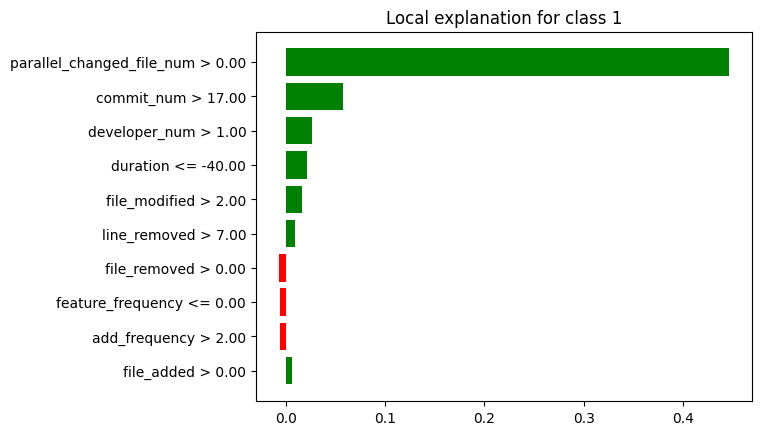

In [ ]:
lime_vp_max.plot()

In [ ]:
breakdown_vp_df_max = breakdown_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_max = breakdown_vp_df_max.drop(index=[0, 26])
breakdown_vp_df_max['sign'] = breakdown_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_max = breakdown_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_max = shap_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_max = shap_vp_df_max.tail(25)
shap_vp_df_max['sign'] = shap_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_max = shap_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_max["Variable"] = lime_vp_df_max["variable"].str.split(" ").str[0]
lime_vp_df_max["Signo"] = lime_vp_df_max["effect"].apply(evaluar_valor)
lime_vp_df_max = lime_vp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_max = lime_vp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_max['Ranking'] = breakdown_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_max = breakdown_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_max['Ranking'] = shap_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_max = shap_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_max['Ranking'] = lime_vp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_max = lime_vp_df_max.head(5)
lime_vp_df_max = lime_vp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_max = breakdown_vp_df_max.drop(columns=['contribution'])
shap_vp_df_max = shap_vp_df_max.drop(columns=['contribution'])
lime_vp_df_max = lime_vp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_max = breakdown_vp_df_max.head(5)
breakdown_vp_df_max = breakdown_vp_df_max.reset_index(drop=True)

shap_vp_df_max = shap_vp_df_max.head(5)
shap_vp_df_max = shap_vp_df_max.reset_index(drop=True)

lime_vp_df_max = lime_vp_df_max.reset_index(drop=True)

print(breakdown_vp_df_max)
print(shap_vp_df_max)
print(lime_vp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3                 line_added        4  Positivo
4              file_modified        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3               line_removed        4  Positivo
4              file_modified        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3                   duration        4  Positivo
4              file_modified        5  Positivo


In [ ]:
#lime_vp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_max['Variable'])
shapley_features = list(shap_vp_df_max['Variable'])
lime_features = list(lime_vp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_max[breakdown_vp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_max[shap_vp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_max[lime_vp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_added', 'file_modified']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_removed', 'file_modified']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'duration', 'file_modified']
['line_removed', 'line_added', 'developer_num', 'commit_num', 'duration', 'parallel_changed_file_num', 'file_modified']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               line_removed         -         -       4  Positivo       -   
1                 line_added         4  Positivo       -         -       -   
2              developer_num         3  Positivo       3  Positivo       3   
3                 commit_num         2  Positivo       2  Positivo       2   
4                   duration         -         -       -         -       4   
5  parallel_changed_file_num         1  Positivo       1  Positivo       1   
6              file_modified         5  Positivo       5  Positivo       5   

             
      Signo  
0         -  
1         -  
2  Positivo  
3  Positivo  
4  Positivo  
5  Positivo  
6  Positivo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "line_added", "file_modified", "line_removed", "duration"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
developer_num                     3  Positivo       3  Positivo       3   
line_added                        4  Positivo       -         -       -   
file_modified                     5  Positivo       5  Positivo       5   
line_removed                      -         -       4  Positivo       -   
duration                          -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
developer_num              Positivo  
line_added                        -  
file_modified              Positivo  
line_removed                      -  
duration                   Positivo

### **Instancia VP MEDIANA:**

In [ ]:
breakdown_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="break_down",random_state=42)
shap_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="shap",random_state=42)
lime_vp_mediana = exp.predict_surrogate(df_instancia_vp_mediana, random_state=42)

breakdown_vp_df_mediana = breakdown_vp_mediana.result
shap_vp_df_mediana = shap_vp_mediana.result
lime_vp_df_mediana=lime_vp_mediana.result

In [ ]:
breakdown_vp_mediana.plot()

In [ ]:
shap_vp_mediana.plot()

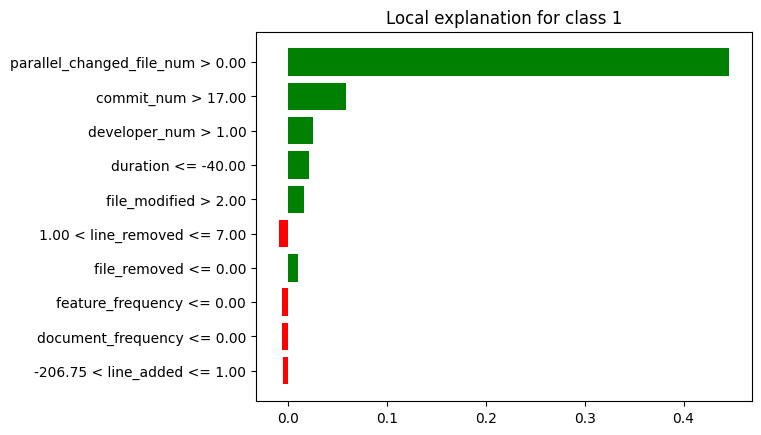

In [ ]:
lime_vp_mediana.plot()

In [ ]:
breakdown_vp_df_mediana = breakdown_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(index=[0, 26])
breakdown_vp_df_mediana['sign'] = breakdown_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_mediana = breakdown_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_mediana = shap_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_mediana = shap_vp_df_mediana.tail(25)
shap_vp_df_mediana['sign'] = shap_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_mediana = shap_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_mediana["Variable"] = lime_vp_df_mediana["variable"].str.split(" ").str[0]
lime_vp_df_mediana["Signo"] = lime_vp_df_mediana["effect"].apply(evaluar_valor)
lime_vp_df_mediana = lime_vp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_mediana['Ranking'] = breakdown_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_mediana = breakdown_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_mediana['Ranking'] = shap_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_mediana = shap_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_mediana['Ranking'] = lime_vp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_mediana = lime_vp_df_mediana.head(5)
lime_vp_df_mediana = lime_vp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(columns=['contribution'])
shap_vp_df_mediana = shap_vp_df_mediana.drop(columns=['contribution'])
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_mediana = breakdown_vp_df_mediana.head(5)
breakdown_vp_df_mediana = breakdown_vp_df_mediana.reset_index(drop=True)

shap_vp_df_mediana = shap_vp_df_mediana.head(5)
shap_vp_df_mediana = shap_vp_df_mediana.reset_index(drop=True)

lime_vp_df_mediana = lime_vp_df_mediana.reset_index(drop=True)

print(breakdown_vp_df_mediana)
print(shap_vp_df_mediana)
print(lime_vp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3              messages_mean        4  Positivo
4              file_modified        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2                 commit_num        3  Positivo
3              file_modified        4  Positivo
4               line_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3                   duration        4  Positivo
4              file_modified        5  Positivo


In [ ]:
#lime_vp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_mediana['Variable'])
shapley_features = list(shap_vp_df_mediana['Variable'])
lime_features = list(lime_vp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_mediana[breakdown_vp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_mediana[shap_vp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_mediana[lime_vp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'commit_num', 'developer_num', 'messages_mean', 'file_modified']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'file_modified', 'line_removed']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'duration', 'file_modified']
['line_removed', 'messages_mean', 'developer_num', 'commit_num', 'duration', 'parallel_changed_file_num', 'file_modified']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               line_removed         -         -       5  Negativo       -   
1              messages_mean         4  Positivo       -         -       -   
2              developer_num         3  Positivo       2  Positivo       3   
3                 commit_num         2  Positivo       3  Positivo       2   
4                   duration         -         -       -         -       4   
5  parallel_changed_file_num         1  Positivo       1  Positivo       1   
6              file_modified         5  Positivo       4  Positivo       5   

             
      Signo  
0         -  
1         -  
2  Positivo  
3  Positivo  
4  Positivo  
5  Positivo  
6  Positivo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "messages_mean", "file_modified", "line_removed", "duration"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       3  Positivo       2   
developer_num                     3  Positivo       2  Positivo       3   
messages_mean                     4  Positivo       -         -       -   
file_modified                     5  Positivo       4  Positivo       5   
line_removed                      -         -       5  Negativo       -   
duration                          -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
developer_num              Positivo  
messages_mean                     -  
file_modified              Positivo  
line_removed                      -  
duration                   Positivo

### **Instancia VP MIN:**

In [ ]:
breakdown_vp_min = exp.predict_parts(df_instancia_vp_min, type="break_down",random_state=42)
shap_vp_min = exp.predict_parts(df_instancia_vp_min, type="shap",random_state=42)
lime_vp_min = exp.predict_surrogate(df_instancia_vp_min, random_state=42)

breakdown_vp_df_min = breakdown_vp_min.result
shap_vp_df_min = shap_vp_min.result
lime_vp_df_min = lime_vp_min.result

In [ ]:
breakdown_vp_min.plot()

In [ ]:
shap_vp_min.plot()

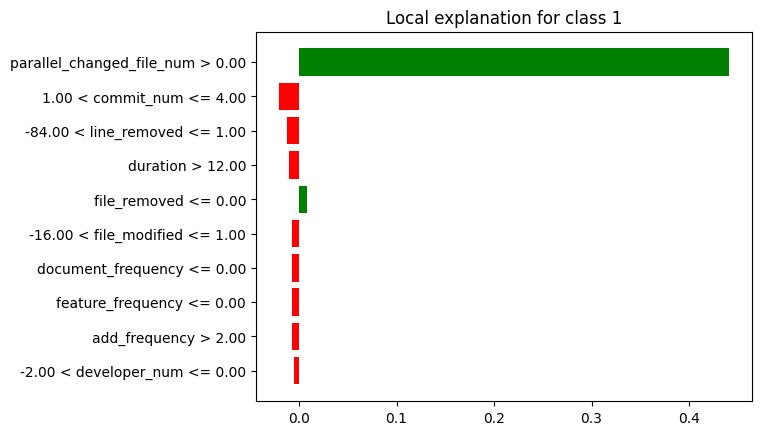

In [ ]:
lime_vp_min.plot()

In [ ]:
breakdown_vp_df_min = breakdown_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_min = breakdown_vp_df_min.drop(index=[0, 26])
breakdown_vp_df_min['sign'] = breakdown_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_min = breakdown_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_min = shap_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_min = shap_vp_df_min.tail(25)
shap_vp_df_min['sign'] = shap_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_min = shap_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_min["Variable"] = lime_vp_df_min["variable"].str.split(" ").str[0]
lime_vp_df_min["Signo"] = lime_vp_df_min["effect"].apply(evaluar_valor)
lime_vp_df_min = lime_vp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_min = lime_vp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_min['Ranking'] = breakdown_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_min = breakdown_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_min['Ranking'] = shap_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_min = shap_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_min['Ranking'] = lime_vp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_min = lime_vp_df_min.head(5)
lime_vp_df_min = lime_vp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_min = breakdown_vp_df_min.drop(columns=['contribution'])
shap_vp_df_min = shap_vp_df_min.drop(columns=['contribution'])
lime_vp_df_min = lime_vp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_min = breakdown_vp_df_min.head(5)
breakdown_vp_df_min = breakdown_vp_df_min.reset_index(drop=True)

shap_vp_df_min = shap_vp_df_min.head(5)
shap_vp_df_min = shap_vp_df_min.reset_index(drop=True)

lime_vp_df_min = lime_vp_df_min.reset_index(drop=True)
lime_vp_df_min.at[1, 'Variable'] = 'commit_num'
lime_vp_df_min.at[2, 'Variable'] = 'line_removed'

print(breakdown_vp_df_min)
print(shap_vp_df_min)
print(lime_vp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2                 commit_num        3  Negativo
3                 line_added        4  Negativo
4               file_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2                 commit_num        3  Negativo
3               file_removed        4  Positivo
4               line_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Negativo
2               line_removed        3  Negativo
3                   duration        4  Negativo
4               file_removed        5  Positivo


In [ ]:
#lime_vp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_min['Variable'])
shapley_features = list(shap_vp_df_min['Variable'])
lime_features = list(lime_vp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_min[breakdown_vp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_min[shap_vp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_min[lime_vp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'developer_num', 'commit_num', 'line_added', 'file_removed']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'file_removed', 'line_removed']
['parallel_changed_file_num', 'commit_num', 'line_removed', 'duration', 'file_removed']
['file_removed', 'line_removed', 'line_added', 'developer_num', 'commit_num', 'duration', 'parallel_changed_file_num']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         5  Positivo       4  Positivo       5   
1               line_removed         -         -       5  Negativo       3   
2                 line_added         4  Negativo       -         -       -   
3              developer_num         2  Positivo       2  Positivo       -   
4                 commit_num         3  Negativo       3  Negativo       2   
5                   duration         -         -       -         -       4   
6  parallel_changed_file_num         1  Positivo       1  Positivo       1   

             
      Signo  
0  Positivo  
1  Negativo  
2         -  
3         -  
4  Negativo  
5  Negativo  
6  Positivo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "commit_num", "line_added", "file_removed", "line_removed", "duration"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Positivo       2  Positivo       -   
commit_num                        3  Negativo       3  Negativo       2   
line_added                        4  Negativo       -         -       -   
file_removed                      5  Positivo       4  Positivo       5   
line_removed                      -         -       5  Negativo       3   
duration                          -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num                     -  
commit_num                 Negativo  
line_added                        -  
file_removed               Positivo  
line_removed               Negativo  
duration                   Negativo

### **VP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_added', 4), ('file_modified', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('messages_mean', 4), ('file_modified', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('line_added', 4), ('file_removed', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_modified', 5), ('line_removed', 4), ('parallel_changed_file_num', 1), ('commit_num', 3), ('developer_num', 2), ('file_modified', 4), ('line_removed', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('file_removed', 4), ('line_removed', 5)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_modified', 5), ('duration', 4), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_modified', 5), ('duration', 4), ('parallel_changed_file_num', 1

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_rf_vp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_rf_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_modified                       5.0      2           4.5      2   
parallel_changed_file_num           1.0      3           1.0      3   
duration                              -      -             -      -   
commit_num                     2.333333      3      2.666667      3   
developer_num                  2.666667      3      2.333333      3   
line_added                          4.0      2             -      -   
messages_mean                       4.0      1             -      -   
line_removed                          -      -      4.666667      3   
file_removed                        5.0      1           4.0      1   

                                   Lime         
                          Ranking Medio Conteo  
file_modified                       5.0      2  
parallel_changed_file_num           1.0      3  
duration                            4.0      3  
commit_num                          2.0      3  
developer_num                       3.0      2  
line_added                            -      -  
messages_mean                         -      -  
line_removed                        3.0      1  
file_removed                        5.0      1

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_rf_vp[("General", "Ranking")] = df_resumen_rf_vp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_rf_vp[("General", "Conteo Total")] = df_resumen_rf_vp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_rf_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_modified                       5.0      2           4.5      2   
parallel_changed_file_num           1.0      3           1.0      3   
duration                              -      -             -      -   
commit_num                     2.333333      3      2.666667      3   
developer_num                  2.666667      3      2.333333      3   
line_added                          4.0      2             -      -   
messages_mean                       4.0      1             -      -   
line_removed                          -      -      4.666667      3   
file_removed                        5.0      1           4.0      1   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
file_modified                       5.0      2  4.833333            6  
parallel_changed_file_num           1.0      3  1.000000            9  
duration                            4.0      3  4.000000            3  
commit_num                          2.0      3  2.333333            9  
developer_num                       3.0      2  2.666667            8  
line_added                            -      -  4.000000            2  
messages_mean                         -      -  4.000000            1  
line_removed                        3.0      1  3.833333            4  
file_removed                        5.0      1  4.666667            3

In [ ]:
# Obtener el número de características
num_caract = df_resumen_rf_vp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_rf_vp[("General", "Peso Rango")] = 1 - ((df_resumen_rf_vp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_rf_vp[("General", "Peso Conteo")] = df_resumen_rf_vp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_rf_vp[("General", "Puntaje")] = df_resumen_rf_vp[("General", "Peso Rango")] + df_resumen_rf_vp[("General", "Peso Conteo")]
df_resumen_rf_vp[("General", "Ranking")] = df_resumen_rf_vp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_rf_vp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_rf_vp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_rf_vp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_rf_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_modified                       5.0      2           4.5      2   
parallel_changed_file_num           1.0      3           1.0      3   
duration                              -      -             -      -   
commit_num                     2.333333      3      2.666667      3   
developer_num                  2.666667      3      2.333333      3   
line_added                          4.0      2             -      -   
messages_mean                       4.0      1             -      -   
line_removed                          -      -      4.666667      3   
file_removed                        5.0      1           4.0      1   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
file_modified                       5.0      2     6.0            6  
parallel_changed_file_num           1.0      3     1.0            9  
duration                            4.0      3     5.0            3  
commit_num                          2.0      3     2.0            9  
developer_num                       3.0      2     3.0            8  
line_added                            -      -     7.0            2  
messages_mean                         -      -     9.0            1  
line_removed                        3.0      1     4.0            4  
file_removed                        5.0      1     8.0            3

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_rf_vp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_rf_vp = df_resumen_rf_vp[new_columns]

In [ ]:
df_resumen_rf_vp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_rf_vp[(tech, "Ranking Medio")] = df_resumen_rf_vp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_rf_vp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
commit_num                    2.0            9          2.33      3   
developer_num                 3.0            8          2.67      3   
line_removed                  4.0            4             -      -   
duration                      5.0            3             -      -   
file_modified                 6.0            6          5.00      2   
line_added                    7.0            2          4.00      2   
file_removed                  8.0            3          5.00      1   
messages_mean                 9.0            1          4.00      1   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         2.67      3          2.00      3  
developer_num                      2.33      3          3.00      2  
line_removed                       4.67      3          3.00      1  
duration                              -      -          4.00      3  
file_modified                      4.50      2          5.00      2  
line_added                            -      -             -      -  
file_removed                       4.00      1          5.00      1  
messages_mean                         -      -             -      -

### **Instancia VN MAX:**

In [ ]:
breakdown_vn_max = exp.predict_parts(df_instancia_vn_max, type="break_down",random_state=42)
shap_vn_max = exp.predict_parts(df_instancia_vn_max, type="shap",random_state=42)
lime_vn_max = exp.predict_surrogate(df_instancia_vn_max, random_state=42)

breakdown_vn_df_max = breakdown_vn_max.result
shap_vn_df_max = shap_vn_max.result
lime_vn_df_max = lime_vn_max.result

In [ ]:
breakdown_vn_max.plot()

In [ ]:
shap_vn_max.plot()

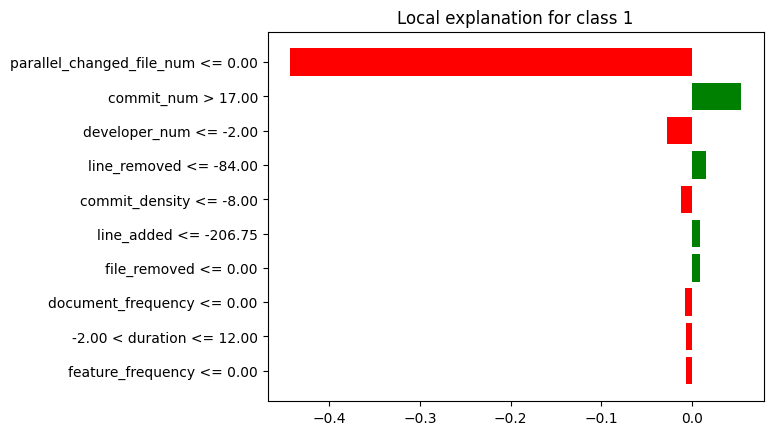

In [ ]:
lime_vn_max.plot()

In [ ]:
breakdown_vn_df_max = breakdown_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_max = breakdown_vn_df_max.drop(index=[0, 26])
breakdown_vn_df_max['sign'] = breakdown_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_max = breakdown_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_max = shap_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_max = shap_vn_df_max.tail(25)
shap_vn_df_max['sign'] = shap_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_max = shap_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_max["Variable"] = lime_vn_df_max["variable"].str.split(" ").str[0]
lime_vn_df_max["Signo"] = lime_vn_df_max["effect"].apply(evaluar_valor)
lime_vn_df_max = lime_vn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_max = lime_vn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_max['Ranking'] = breakdown_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_max = breakdown_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_max['Ranking'] = shap_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_max = shap_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_max['Ranking'] = lime_vn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_max = lime_vn_df_max.head(5)
lime_vn_df_max = lime_vn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_vn_df_max = breakdown_vn_df_max.drop(columns=['contribution'])
shap_vn_df_max = shap_vn_df_max.drop(columns=['contribution'])
lime_vn_df_max = lime_vn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_max = breakdown_vn_df_max.head(5)
breakdown_vn_df_max = breakdown_vn_df_max.reset_index(drop=True)

shap_vn_df_max = shap_vn_df_max.head(5)
shap_vn_df_max = shap_vn_df_max.reset_index(drop=True)

lime_vn_df_max = lime_vn_df_max.reset_index(drop=True)

print(breakdown_vn_df_max)
print(shap_vn_df_max)
print(lime_vn_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Negativo
2                 commit_num        3  Positivo
3               messages_max        4  Negativo
4              file_modified        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Negativo
2               line_removed        3  Negativo
3              file_modified        4  Negativo
4                   duration        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3               line_removed        4  Positivo
4             commit_density        5  Negativo


In [ ]:
#lime_vn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_max['Variable'])
shapley_features = list(shap_vn_df_max['Variable'])
lime_features = list(lime_vn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_max[breakdown_vn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_max[shap_vn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_max[lime_vn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'developer_num', 'commit_num', 'messages_max', 'file_modified']
['parallel_changed_file_num', 'developer_num', 'line_removed', 'file_modified', 'duration']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_removed', 'commit_density']
['commit_density', 'line_removed', 'developer_num', 'commit_num', 'duration', 'messages_max', 'parallel_changed_file_num', 'file_modified']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0             commit_density         -         -       -         -       5   
1               line_removed         -         -       3  Negativo       4   
2              developer_num         2  Negativo       2  Negativo       3   
3                 commit_num         3  Positivo       -         -       2   
4                   duration         -         -       5  Negativo       -   
5               messages_max         4  Negativo       -         -       -   
6  parallel_changed_file_num         1  Negativo       1  Negativo       1   
7              file_modified         5  Negativo       4  Negativo       -   

             
      Signo  
0  Negativo  
1  Positivo  
2  Negativo  
3  Positivo  
4         -  
5         -  
6  Negativo  
7         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "commit_num", "messages_max", "file_modified", "line_removed", "duration", "commit_density"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
developer_num                     2  Negativo       2  Negativo       3   
commit_num                        3  Positivo       -         -       2   
messages_max                      4  Negativo       -         -       -   
file_modified                     5  Negativo       4  Negativo       -   
line_removed                      -         -       3  Negativo       4   
duration                          -         -       5  Negativo       -   
commit_density                    -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
developer_num              Negativo  
commit_num                 Positivo  
messages_max                      -  
file_modified                     -  
line_removed               Positivo  
duration                          -  
commit_density             Negativo

### **Instancia VN MEDIANA:**

In [ ]:
breakdown_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="break_down",random_state=42)
shap_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="shap",random_state=42)
lime_vn_mediana = exp.predict_surrogate(df_instancia_vn_mediana, random_state=42)

breakdown_vn_df_mediana = breakdown_vn_mediana.result
shap_vn_df_mediana = shap_vn_mediana.result
lime_vn_df_mediana = lime_vn_mediana.result

In [ ]:
breakdown_vn_mediana.plot()

In [ ]:
shap_vn_mediana.plot()

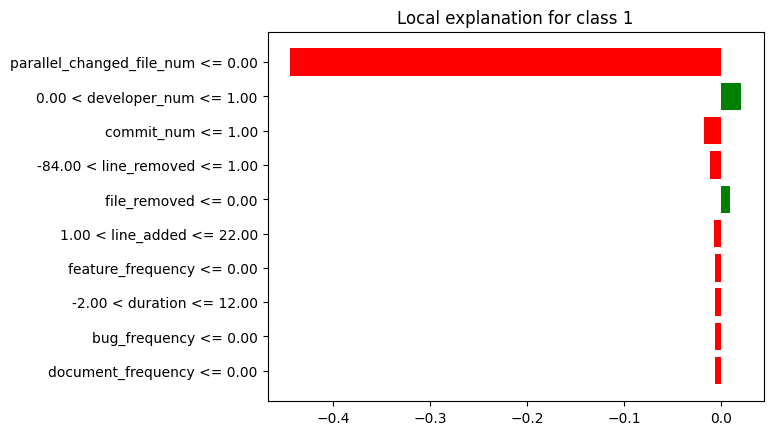

In [ ]:
lime_vn_mediana.plot()

In [ ]:
breakdown_vn_df_mediana = breakdown_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(index=[0, 26])
breakdown_vn_df_mediana['sign'] = breakdown_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_mediana = breakdown_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_mediana = shap_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_mediana = shap_vn_df_mediana.tail(25)
shap_vn_df_mediana['sign'] = shap_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_mediana = shap_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_mediana["Variable"] = lime_vn_df_mediana["variable"].str.split(" ").str[0]
lime_vn_df_mediana["Signo"] = lime_vn_df_mediana["effect"].apply(evaluar_valor)
lime_vn_df_mediana = lime_vn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_mediana['Ranking'] = breakdown_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_mediana = breakdown_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_mediana['Ranking'] = shap_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_mediana = shap_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_mediana['Ranking'] = lime_vn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_mediana = lime_vn_df_mediana.head(5)
lime_vn_df_mediana = lime_vn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(columns=['contribution'])
shap_vn_df_mediana = shap_vn_df_mediana.drop(columns=['contribution'])
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_mediana = breakdown_vn_df_mediana.head(5)
breakdown_vn_df_mediana = breakdown_vn_df_mediana.reset_index(drop=True)

shap_vn_df_mediana = shap_vn_df_mediana.head(5)
shap_vn_df_mediana = shap_vn_df_mediana.reset_index(drop=True)

lime_vn_df_mediana = lime_vn_df_mediana.reset_index(drop=True)
lime_vn_df_mediana.at[1, 'Variable'] = 'developer_num'
lime_vn_df_mediana.at[3, 'Variable'] = 'line_removed'

print(breakdown_vn_df_mediana)
print(shap_vn_df_mediana)
print(lime_vn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3              file_modified        4  Positivo
4                   duration        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3               line_removed        4  Negativo
4                 line_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Positivo
2                 commit_num        3  Negativo
3               line_removed        4  Negativo
4               file_removed        5  Positivo


In [ ]:
#lime_vn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_mediana['Variable'])
shapley_features = list(shap_vn_df_mediana['Variable'])
lime_features = list(lime_vn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_mediana[breakdown_vn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_mediana[shap_vn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_mediana[lime_vn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_modified', 'duration']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_removed', 'line_added']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'line_removed', 'file_removed']
['file_removed', 'line_removed', 'line_added', 'developer_num', 'commit_num', 'duration', 'parallel_changed_file_num', 'file_modified']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       5   
1               line_removed         -         -       4  Negativo       4   
2                 line_added         -         -       5  Negativo       -   
3              developer_num         3  Positivo       3  Positivo       2   
4                 commit_num         2  Negativo       2  Negativo       3   
5                   duration         5  Positivo       -         -       -   
6  parallel_changed_file_num         1  Negativo       1  Negativo       1   
7              file_modified         4  Positivo       -         -       -   

             
      Signo  
0  Positivo  
1  Negativo  
2         -  
3  Positivo  
4  Negativo  
5         -  
6  Negativo  
7         -

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "file_modified", "duration", "line_removed", "line_added", "file_removed"]
# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
commit_num                        2  Negativo       2  Negativo       3   
developer_num                     3  Positivo       3  Positivo       2   
file_modified                     4  Positivo       -         -       -   
duration                          5  Positivo       -         -       -   
line_removed                      -         -       4  Negativo       4   
line_added                        -         -       5  Negativo       -   
file_removed                      -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
commit_num                 Negativo  
developer_num              Positivo  
file_modified                     -  
duration                          -  
line_removed               Negativo  
line_added                        -  
file_removed               Positivo

### **Instancia VN MIN:**

In [ ]:
breakdown_vn_min = exp.predict_parts(df_instancia_vn_min, type="break_down",random_state=42)
shap_vn_min = exp.predict_parts(df_instancia_vn_min, type="shap",random_state=42)
lime_vn_min = exp.predict_surrogate(df_instancia_vn_min, random_state=42)

breakdown_vn_df_min = breakdown_vn_min.result
shap_vn_df_min = shap_vn_min.result
lime_vn_df_min = lime_vn_min.result

In [ ]:
breakdown_vn_min.plot()

In [ ]:
shap_vn_min.plot()

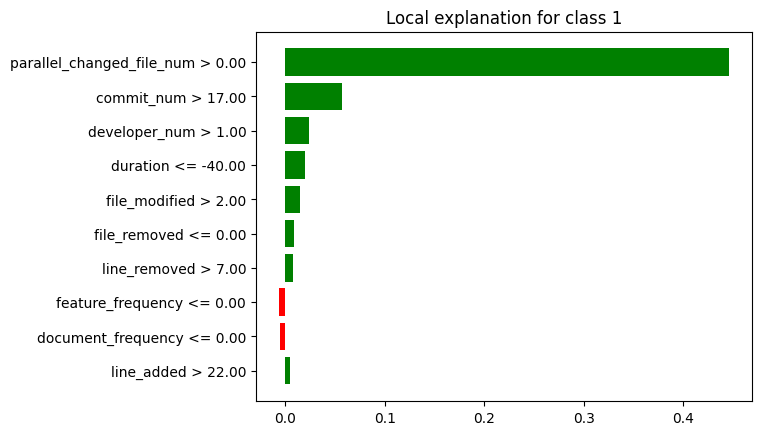

In [ ]:
lime_vn_min.plot()

In [ ]:
breakdown_vn_df_min = breakdown_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_min = breakdown_vn_df_min.drop(index=[0, 26])
breakdown_vn_df_min['sign'] = breakdown_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_min = breakdown_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_min = shap_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_min = shap_vn_df_min.tail(25)
shap_vn_df_min['sign'] = shap_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_min = shap_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_min["Variable"] = lime_vn_df_min["variable"].str.split(" ").str[0]
lime_vn_df_min["Signo"] = lime_vn_df_min["effect"].apply(evaluar_valor)
lime_vn_df_min = lime_vn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_min = lime_vn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_min['Ranking'] = breakdown_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_min = breakdown_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_min['Ranking'] = shap_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_min = shap_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_min['Ranking'] = lime_vn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_min = lime_vn_df_min.head(5)
lime_vn_df_min = lime_vn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vn_df_min = breakdown_vn_df_min.drop(columns=['contribution'])
shap_vn_df_min = shap_vn_df_min.drop(columns=['contribution'])
lime_vn_df_min = lime_vn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_min = breakdown_vn_df_min.head(5)
breakdown_vn_df_min = breakdown_vn_df_min.reset_index(drop=True)

shap_vn_df_min = shap_vn_df_min.head(5)
shap_vn_df_min = shap_vn_df_min.reset_index(drop=True)

lime_vn_df_min = lime_vn_df_min.reset_index(drop=True)

print(breakdown_vn_df_min)
print(shap_vn_df_min)
print(lime_vn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2                 commit_num        3  Positivo
3              fix_frequency        4  Positivo
4              use_frequency        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3              use_frequency        4  Negativo
4               line_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3                   duration        4  Positivo
4              file_modified        5  Positivo


In [ ]:
#lime_vn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_min['Variable'])
shapley_features = list(shap_vn_df_min['Variable'])
lime_features = list(lime_vn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_min[breakdown_vn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_min[shap_vn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_min[lime_vn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'developer_num', 'commit_num', 'fix_frequency', 'use_frequency']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'use_frequency', 'line_removed']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'duration', 'file_modified']
['line_removed', 'developer_num', 'commit_num', 'duration', 'fix_frequency', 'parallel_changed_file_num', 'file_modified', 'use_frequency']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               line_removed         -         -       5  Negativo       -   
1              developer_num         2  Positivo       3  Positivo       3   
2                 commit_num         3  Positivo       2  Positivo       2   
3                   duration         -         -       -         -       4   
4              fix_frequency         4  Positivo       -         -       -   
5  parallel_changed_file_num         1  Positivo       1  Positivo       1   
6              file_modified         -         -       -         -       5   
7              use_frequency         5  Negativo       4  Negativo       -   

             
      Signo  
0         -  
1  Positivo  
2  Positivo  
3  Positivo  
4         -  
5  Positivo  
6  Positivo  
7         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "commit_num", "fix_frequency", "use_frequency", "line_removed", "duration", "file_modified"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Positivo       3  Positivo       3   
commit_num                        3  Positivo       2  Positivo       2   
fix_frequency                     4  Positivo       -         -       -   
use_frequency                     5  Negativo       4  Negativo       -   
line_removed                      -         -       5  Negativo       -   
duration                          -         -       -         -       4   
file_modified                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Positivo  
commit_num                 Positivo  
fix_frequency                     -  
use_frequency                     -  
line_removed                      -  
duration                   Positivo  
file_modified              Positivo

### **VN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('messages_max', 4), ('file_modified', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_modified', 4), ('duration', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('fix_frequency', 4), ('use_frequency', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('developer_num', 2), ('file_modified', 4), ('line_removed', 3), ('duration', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_removed', 4), ('line_added', 5), ('parallel_changed_file_num', 1), ('developer_num', 3), ('commit_num', 2), ('use_frequency', 4), ('line_removed', 5)], 'Lime': [('parallel_changed_file_num', 1), ('developer_num', 3), ('commit_num', 2), ('line_removed', 4), ('commit_density', 5), ('parallel_changed_file_num', 1), ('commit_num', 3), ('developer_num', 2), ('line_removed', 4), ('file_removed', 5), ('parallel_changed_file_nu

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_rf_vn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_rf_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_modified                       4.5      2           4.0      1   
use_frequency                       5.0      1           4.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
messages_max                        4.0      1             -      -   
fix_frequency                       4.0      1             -      -   
duration                            5.0      1           5.0      1   
commit_num                     2.666667      3           2.0      2   
developer_num                  2.333333      3      2.666667      3   
commit_density                        -      -             -      -   
line_added                            -      -           5.0      1   
line_removed                          -      -           4.0      3   
file_removed                          -      -             -      -   

                                   Lime         
                          Ranking Medio Conteo  
file_modified                       5.0      1  
use_frequency                         -      -  
parallel_changed_file_num           1.0      3  
messages_max                          -      -  
fix_frequency                         -      -  
duration                            4.0      1  
commit_num                     2.333333      3  
developer_num                  2.666667      3  
commit_density                      5.0      1  
line_added                            -      -  
line_removed                        4.0      2  
file_removed                        5.0      1

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_rf_vn[("General", "Ranking")] = df_resumen_rf_vn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_rf_vn[("General", "Conteo Total")] = df_resumen_rf_vn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_rf_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_modified                       4.5      2           4.0      1   
use_frequency                       5.0      1           4.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
messages_max                        4.0      1             -      -   
fix_frequency                       4.0      1             -      -   
duration                            5.0      1           5.0      1   
commit_num                     2.666667      3           2.0      2   
developer_num                  2.333333      3      2.666667      3   
commit_density                        -      -             -      -   
line_added                            -      -           5.0      1   
line_removed                          -      -           4.0      3   
file_removed                          -      -             -      -   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
file_modified                       5.0      1  4.500000            4  
use_frequency                         -      -  4.500000            2  
parallel_changed_file_num           1.0      3  1.000000            9  
messages_max                          -      -  4.000000            1  
fix_frequency                         -      -  4.000000            1  
duration                            4.0      1  4.666667            3  
commit_num                     2.333333      3  2.333333            8  
developer_num                  2.666667      3  2.555556            9  
commit_density                      5.0      1  5.000000            1  
line_added                            -      -  5.000000            1  
line_removed                        4.0      2  4.000000            5  
file_removed                        5.0      1  5.000000            1

In [ ]:
# Obtener el número de características
num_caract = df_resumen_rf_vn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_rf_vn[("General", "Peso Rango")] = 1 - ((df_resumen_rf_vn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_rf_vn[("General", "Peso Conteo")] = df_resumen_rf_vn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_rf_vn[("General", "Puntaje")] = df_resumen_rf_vn[("General", "Peso Rango")] + df_resumen_rf_vn[("General", "Peso Conteo")]
df_resumen_rf_vn[("General", "Ranking")] = df_resumen_rf_vn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_rf_vn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_rf_vn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_rf_vn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_rf_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_modified                       4.5      2           4.0      1   
use_frequency                       5.0      1           4.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
messages_max                        4.0      1             -      -   
fix_frequency                       4.0      1             -      -   
duration                            5.0      1           5.0      1   
commit_num                     2.666667      3           2.0      2   
developer_num                  2.333333      3      2.666667      3   
commit_density                        -      -             -      -   
line_added                            -      -           5.0      1   
line_removed                          -      -           4.0      3   
file_removed                          -      -             -      -   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
file_modified                       5.0      1     5.0            4  
use_frequency                         -      -     6.0            2  
parallel_changed_file_num           1.0      3     1.0            9  
messages_max                          -      -     7.0            1  
fix_frequency                         -      -     7.0            1  
duration                            4.0      1     7.0            3  
commit_num                     2.333333      3     3.0            8  
developer_num                  2.666667      3     2.0            9  
commit_density                      5.0      1    10.0            1  
line_added                            -      -    10.0            1  
line_removed                        4.0      2     4.0            5  
file_removed                        5.0      1    10.0            1

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_rf_vn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_rf_vn = df_resumen_rf_vn[new_columns]

In [ ]:
df_resumen_rf_vn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_rf_vn[(tech, "Ranking Medio")] = df_resumen_rf_vn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_rf_vn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
developer_num                 2.0            9          2.33      3   
commit_num                    3.0            8          2.67      3   
line_removed                  4.0            5             -      -   
file_modified                 5.0            4          4.50      2   
use_frequency                 6.0            2          5.00      1   
messages_max                  7.0            1          4.00      1   
fix_frequency                 7.0            1          4.00      1   
duration                      7.0            3          5.00      1   
commit_density               10.0            1             -      -   
line_added                   10.0            1             -      -   
file_removed                 10.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
developer_num                      2.67      3          2.67      3  
commit_num                         2.00      2          2.33      3  
line_removed                       4.00      3          4.00      2  
file_modified                      4.00      1          5.00      1  
use_frequency                      4.00      1             -      -  
messages_max                          -      -             -      -  
fix_frequency                         -      -             -      -  
duration                           5.00      1          4.00      1  
commit_density                        -      -          5.00      1  
line_added                         5.00      1             -      -  
file_removed                          -      -          5.00      1

### **Instancia FP MAX:**

In [ ]:
breakdown_fp_max = exp.predict_parts(df_instancia_fp_max, type="break_down",random_state=42)
shap_fp_max = exp.predict_parts(df_instancia_fp_max, type="shap",random_state=42)
lime_fp_max = exp.predict_surrogate(df_instancia_fp_max, random_state=42)

breakdown_fp_df_max = breakdown_fp_max.result
shap_fp_df_max = shap_fp_max.result
lime_fp_df_max=lime_fp_max.result

In [ ]:
breakdown_fp_max.plot()

In [ ]:
shap_fp_max.plot()

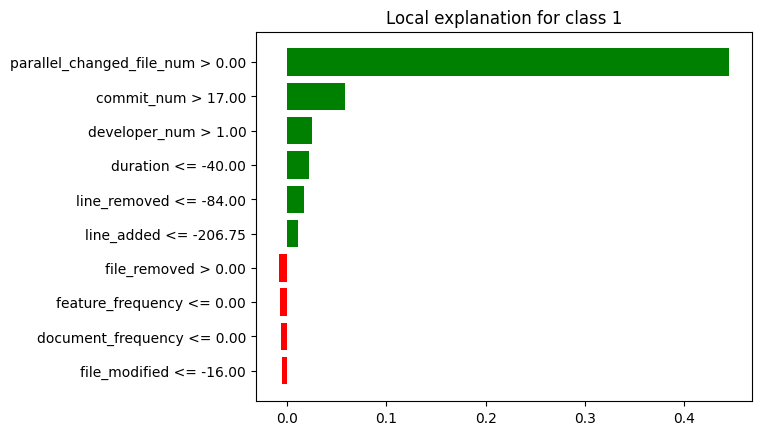

In [ ]:
lime_fp_max.plot()

In [ ]:
breakdown_fp_df_max = breakdown_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_max = breakdown_fp_df_max.drop(index=[0, 26])
breakdown_fp_df_max['sign'] = breakdown_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_max = breakdown_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_max = shap_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_max = shap_fp_df_max.tail(25)
shap_fp_df_max['sign'] = shap_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_max = shap_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_max["Variable"] = lime_fp_df_max["variable"].str.split(" ").str[0]
lime_fp_df_max["Signo"] = lime_fp_df_max["effect"].apply(evaluar_valor)
lime_fp_df_max = lime_fp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_max = lime_fp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_max['Ranking'] = breakdown_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_max = breakdown_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_max['Ranking'] = shap_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_max = shap_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_max['Ranking'] = lime_fp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_max = lime_fp_df_max.head(5)
lime_fp_df_max = lime_fp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fp_df_max = breakdown_fp_df_max.drop(columns=['contribution'])
shap_fp_df_max = shap_fp_df_max.drop(columns=['contribution'])
lime_fp_df_max = lime_fp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_max = breakdown_fp_df_max.head(5)
breakdown_fp_df_max = breakdown_fp_df_max.reset_index(drop=True)

shap_fp_df_max = shap_fp_df_max.head(5)
shap_fp_df_max = shap_fp_df_max.reset_index(drop=True)

lime_fp_df_max = lime_fp_df_max.reset_index(drop=True)

print(breakdown_fp_df_max)
print(shap_fp_df_max)
print(lime_fp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3                   duration        4  Positivo
4               line_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3               line_removed        4  Positivo
4                   duration        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3                   duration        4  Positivo
4               line_removed        5  Positivo


In [ ]:
#lime_fp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_max['Variable'])
shapley_features = list(shap_fp_df_max['Variable'])
lime_features = list(lime_fp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_max[breakdown_fp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_max[shap_fp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_max[lime_fp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'developer_num', 'duration', 'line_removed']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_removed', 'duration']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'duration', 'line_removed']
['line_removed', 'developer_num', 'commit_num', 'duration', 'parallel_changed_file_num']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               line_removed         5  Positivo       4  Positivo       5   
1              developer_num         3  Positivo       3  Positivo       3   
2                 commit_num         2  Positivo       2  Positivo       2   
3                   duration         4  Positivo       5  Positivo       4   
4  parallel_changed_file_num         1  Positivo       1  Positivo       1   

             
      Signo  
0  Positivo  
1  Positivo  
2  Positivo  
3  Positivo  
4  Positivo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "duration", "line_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
developer_num                     3  Positivo       3  Positivo       3   
duration                          4  Positivo       5  Positivo       4   
line_removed                      5  Positivo       4  Positivo       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
developer_num              Positivo  
duration                   Positivo  
line_removed               Positivo

### **Instancia FP MEDIANA:**

In [ ]:
breakdown_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="break_down",random_state=42)
shap_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="shap",random_state=42)
lime_fp_mediana = exp.predict_surrogate(df_instancia_fp_mediana, random_state=42)

breakdown_fp_df_mediana = breakdown_fp_mediana.result
shap_fp_df_mediana = shap_fp_mediana.result
lime_fp_df_mediana=lime_fp_mediana.result

In [ ]:
breakdown_fp_mediana.plot()

In [ ]:
shap_fp_mediana.plot()

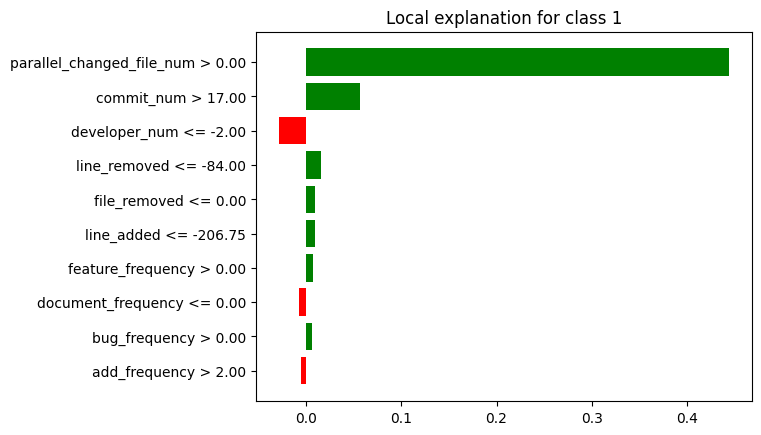

In [ ]:
lime_fp_mediana.plot()

In [ ]:
breakdown_fp_df_mediana = breakdown_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(index=[0, 26])
breakdown_fp_df_mediana['sign'] = breakdown_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_mediana = breakdown_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_mediana = shap_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_mediana = shap_fp_df_mediana.tail(25)
shap_fp_df_mediana['sign'] = shap_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_mediana = shap_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_mediana["Variable"] = lime_fp_df_mediana["variable"].str.split(" ").str[0]
lime_fp_df_mediana["Signo"] = lime_fp_df_mediana["effect"].apply(evaluar_valor)
lime_fp_df_mediana = lime_fp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_mediana['Ranking'] = breakdown_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_mediana = breakdown_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_mediana['Ranking'] = shap_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_mediana = shap_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_mediana['Ranking'] = lime_fp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_mediana = lime_fp_df_mediana.head(5)
lime_fp_df_mediana = lime_fp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(columns=['contribution'])
shap_fp_df_mediana = shap_fp_df_mediana.drop(columns=['contribution'])
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_mediana = breakdown_fp_df_mediana.head(5)
breakdown_fp_df_mediana = breakdown_fp_df_mediana.reset_index(drop=True)

shap_fp_df_mediana = shap_fp_df_mediana.head(5)
shap_fp_df_mediana = shap_fp_df_mediana.reset_index(drop=True)

lime_fp_df_mediana = lime_fp_df_mediana.reset_index(drop=True)

print(breakdown_fp_df_mediana)
print(shap_fp_df_mediana)
print(lime_fp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               messages_max        3  Negativo
3              developer_num        4  Negativo
4               line_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               line_removed        3  Positivo
3              developer_num        4  Negativo
4               file_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3               line_removed        4  Positivo
4               file_removed        5  Positivo


In [ ]:
#lime_fp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_mediana['Variable'])
shapley_features = list(shap_fp_df_mediana['Variable'])
lime_features = list(lime_fp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_mediana[breakdown_fp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_mediana[shap_fp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_mediana[lime_fp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'commit_num', 'messages_max', 'developer_num', 'line_removed']
['parallel_changed_file_num', 'commit_num', 'line_removed', 'developer_num', 'file_removed']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_removed', 'file_removed']
['file_removed', 'line_removed', 'developer_num', 'commit_num', 'messages_max', 'parallel_changed_file_num']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       5  Positivo       5   
1               line_removed         5  Positivo       3  Positivo       4   
2              developer_num         4  Negativo       4  Negativo       3   
3                 commit_num         2  Positivo       2  Positivo       2   
4               messages_max         3  Negativo       -         -       -   
5  parallel_changed_file_num         1  Positivo       1  Positivo       1   

             
      Signo  
0  Positivo  
1  Positivo  
2  Negativo  
3  Positivo  
4         -  
5  Positivo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "messages_max", "developer_num", "line_removed", "file_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
messages_max                      3  Negativo       -         -       -   
developer_num                     4  Negativo       4  Negativo       3   
line_removed                      5  Positivo       3  Positivo       4   
file_removed                      -         -       5  Positivo       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
messages_max                      -  
developer_num              Negativo  
line_removed               Positivo  
file_removed               Positivo

### **Instancia FP MIN:**

In [ ]:
breakdown_fp_min = exp.predict_parts(df_instancia_fp_min, type="break_down",random_state=42)
shap_fp_min = exp.predict_parts(df_instancia_fp_min, type="shap",random_state=42)
lime_fp_min = exp.predict_surrogate(df_instancia_fp_min, random_state=42)

breakdown_fp_df_min = breakdown_fp_min.result
shap_fp_df_min = shap_fp_min.result
lime_fp_df_min = lime_fp_min.result

In [ ]:
breakdown_fp_min.plot()

In [ ]:
shap_fp_min.plot()

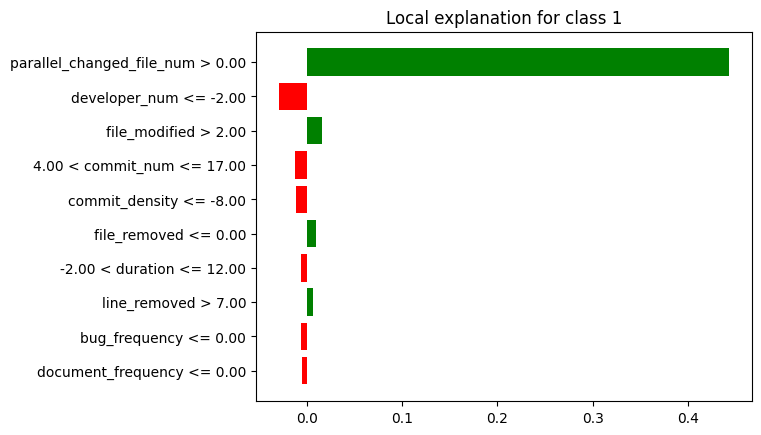

In [ ]:
lime_fp_min.plot()

In [ ]:
breakdown_fp_df_min = breakdown_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_min = breakdown_fp_df_min.drop(index=[0, 26])
breakdown_fp_df_min['sign'] = breakdown_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_min = breakdown_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_min = shap_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_min = shap_fp_df_min.tail(25)
shap_fp_df_min['sign'] = shap_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_min = shap_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_min["Variable"] = lime_fp_df_min["variable"].str.split(" ").str[0]
lime_fp_df_min["Signo"] = lime_fp_df_min["effect"].apply(evaluar_valor)
lime_fp_df_min = lime_fp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_min = lime_fp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_min['Ranking'] = breakdown_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_min = breakdown_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_min['Ranking'] = shap_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_min = shap_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_min['Ranking'] = lime_fp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_min = lime_fp_df_min.head(5)
lime_fp_df_min = lime_fp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fp_df_min = breakdown_fp_df_min.drop(columns=['contribution'])
shap_fp_df_min = shap_fp_df_min.drop(columns=['contribution'])
lime_fp_df_min = lime_fp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_min = breakdown_fp_df_min.head(5)
breakdown_fp_df_min = breakdown_fp_df_min.reset_index(drop=True)

shap_fp_df_min = shap_fp_df_min.head(5)
shap_fp_df_min = shap_fp_df_min.reset_index(drop=True)

lime_fp_df_min = lime_fp_df_min.reset_index(drop=True)
lime_fp_df_min.at[3, 'Variable'] = 'commit_num'

print(breakdown_fp_df_min)
print(shap_fp_df_min)
print(lime_fp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Positivo
3                 file_added        4  Positivo
4               messages_max        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Positivo
3              file_modified        4  Positivo
4               line_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2              file_modified        3  Positivo
3                 commit_num        4  Negativo
4             commit_density        5  Negativo


In [ ]:
#lime_fp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_min['Variable'])
shapley_features = list(shap_fp_df_min['Variable'])
lime_features = list(lime_fp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_min[breakdown_fp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_min[shap_fp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_min[lime_fp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'developer_num', 'commit_num', 'file_added', 'messages_max']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'file_modified', 'line_removed']
['parallel_changed_file_num', 'developer_num', 'file_modified', 'commit_num', 'commit_density']
['commit_density', 'file_added', 'line_removed', 'developer_num', 'commit_num', 'messages_max', 'parallel_changed_file_num', 'file_modified']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0             commit_density         -         -       -         -       5   
1                 file_added         4  Positivo       -         -       -   
2               line_removed         -         -       5  Positivo       -   
3              developer_num         2  Negativo       2  Negativo       2   
4                 commit_num         3  Positivo       3  Positivo       4   
5               messages_max         5  Positivo       -         -       -   
6  parallel_changed_file_num         1  Positivo       1  Positivo       1   
7              file_modified         -         -       4  Positivo       3   

             
      Signo  
0  Negativo  
1         -  
2         -  
3  Negativo  
4  Negativo  
5         -  
6  Positivo  
7  Positivo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "commit_num",  "file_added", "messages_max", "file_modified", "line_removed", "commit_density"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Negativo       2  Negativo       2   
commit_num                        3  Positivo       3  Positivo       4   
file_added                        4  Positivo       -         -       -   
messages_max                      5  Positivo       -         -       -   
file_modified                     -         -       4  Positivo       3   
line_removed                      -         -       5  Positivo       -   
commit_density                    -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Negativo  
commit_num                 Negativo  
file_added                        -  
messages_max                      -  
file_modified              Positivo  
line_removed                      -  
commit_density             Negativo

### **FP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('duration', 4), ('line_removed', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('messages_max', 3), ('developer_num', 4), ('line_removed', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('file_added', 4), ('messages_max', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('duration', 5), ('line_removed', 4), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 4), ('line_removed', 3), ('file_removed', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('file_modified', 4), ('line_removed', 5)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('duration', 4), ('line_removed', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_removed', 4), ('file_removed', 5), ('parallel_changed_file_num', 1), ('dev

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_rf_fp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_rf_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_modified                         -      -           4.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
messages_max                        4.0      2             -      -   
duration                            4.0      1           5.0      1   
commit_num                     2.333333      3      2.333333      3   
developer_num                       3.0      3           3.0      3   
commit_density                        -      -             -      -   
line_removed                        5.0      2           4.0      3   
file_added                          4.0      1             -      -   
file_removed                          -      -           5.0      1   

                                   Lime         
                          Ranking Medio Conteo  
file_modified                       3.0      1  
parallel_changed_file_num           1.0      3  
messages_max                          -      -  
duration                            4.0      1  
commit_num                     2.666667      3  
developer_num                  2.666667      3  
commit_density                      5.0      1  
line_removed                        4.5      2  
file_added                            -      -  
file_removed                        5.0      1

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_rf_fp[("General", "Ranking")] = df_resumen_rf_fp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_rf_fp[("General", "Conteo Total")] = df_resumen_rf_fp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_rf_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_modified                         -      -           4.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
messages_max                        4.0      2             -      -   
duration                            4.0      1           5.0      1   
commit_num                     2.333333      3      2.333333      3   
developer_num                       3.0      3           3.0      3   
commit_density                        -      -             -      -   
line_removed                        5.0      2           4.0      3   
file_added                          4.0      1             -      -   
file_removed                          -      -           5.0      1   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
file_modified                       3.0      1  3.500000            2  
parallel_changed_file_num           1.0      3  1.000000            9  
messages_max                          -      -  4.000000            2  
duration                            4.0      1  4.333333            3  
commit_num                     2.666667      3  2.444444            9  
developer_num                  2.666667      3  2.888889            9  
commit_density                      5.0      1  5.000000            1  
line_removed                        4.5      2  4.500000            7  
file_added                            -      -  4.000000            1  
file_removed                        5.0      1  5.000000            2

In [ ]:
# Obtener el número de características
num_caract = df_resumen_rf_fp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_rf_fp[("General", "Peso Rango")] = 1 - ((df_resumen_rf_fp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_rf_fp[("General", "Peso Conteo")] = df_resumen_rf_fp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_rf_fp[("General", "Puntaje")] = df_resumen_rf_fp[("General", "Peso Rango")] + df_resumen_rf_fp[("General", "Peso Conteo")]
df_resumen_rf_fp[("General", "Ranking")] = df_resumen_rf_fp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_rf_fp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_rf_fp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_rf_fp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_rf_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_modified                         -      -           4.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
messages_max                        4.0      2             -      -   
duration                            4.0      1           5.0      1   
commit_num                     2.333333      3      2.333333      3   
developer_num                       3.0      3           3.0      3   
commit_density                        -      -             -      -   
line_removed                        5.0      2           4.0      3   
file_added                          4.0      1             -      -   
file_removed                          -      -           5.0      1   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
file_modified                       3.0      1     4.0            2  
parallel_changed_file_num           1.0      3     1.0            9  
messages_max                          -      -     7.0            2  
duration                            4.0      1     5.0            3  
commit_num                     2.666667      3     2.0            9  
developer_num                  2.666667      3     3.0            9  
commit_density                      5.0      1    10.0            1  
line_removed                        4.5      2     5.0            7  
file_added                            -      -     8.0            1  
file_removed                        5.0      1     9.0            2

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_rf_fp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_rf_fp = df_resumen_rf_fp[new_columns]

In [ ]:
df_resumen_rf_fp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_rf_fp[(tech, "Ranking Medio")] = df_resumen_rf_fp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_rf_fp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
commit_num                    2.0            9          2.33      3   
developer_num                 3.0            9          3.00      3   
file_modified                 4.0            2             -      -   
duration                      5.0            3          4.00      1   
line_removed                  5.0            7          5.00      2   
messages_max                  7.0            2          4.00      2   
file_added                    8.0            1          4.00      1   
file_removed                  9.0            2             -      -   
commit_density               10.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         2.33      3          2.67      3  
developer_num                      3.00      3          2.67      3  
file_modified                      4.00      1          3.00      1  
duration                           5.00      1          4.00      1  
line_removed                       4.00      3          4.50      2  
messages_max                          -      -             -      -  
file_added                            -      -             -      -  
file_removed                       5.00      1          5.00      1  
commit_density                        -      -          5.00      1

### **Instancia FN MAX:**

In [ ]:
breakdown_fn_max = exp.predict_parts(df_instancia_fn_max, type="break_down",random_state=42)
shap_fn_max = exp.predict_parts(df_instancia_fn_max, type="shap",random_state=42)
lime_fn_max = exp.predict_surrogate(df_instancia_fn_max, random_state=42)

breakdown_fn_df_max = breakdown_fn_max.result
shap_fn_df_max = shap_fn_max.result
lime_fn_df_max=lime_fn_max.result

In [ ]:
breakdown_fn_max.plot()

In [ ]:
shap_fn_max.plot()

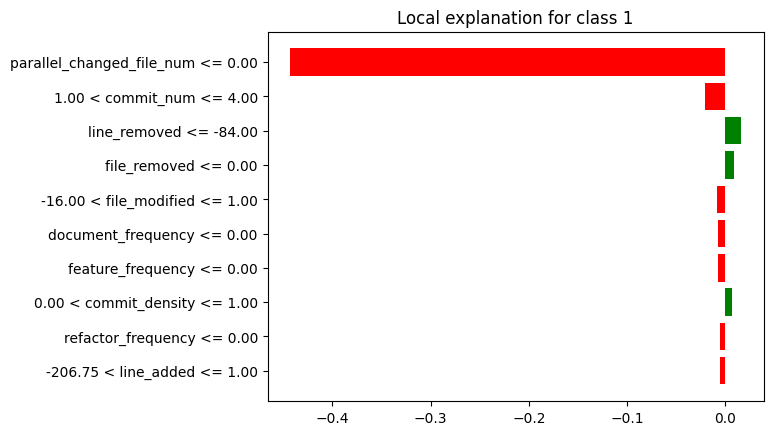

In [ ]:
lime_fn_max.plot()

In [ ]:
breakdown_fn_df_max = breakdown_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_max = breakdown_fn_df_max.drop(index=[0, 26])
breakdown_fn_df_max['sign'] = breakdown_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_max = breakdown_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_max = shap_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_max = shap_fn_df_max.tail(25)
shap_fn_df_max['sign'] = shap_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_max = shap_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_max["Variable"] = lime_fn_df_max["variable"].str.split(" ").str[0]
lime_fn_df_max["Signo"] = lime_fn_df_max["effect"].apply(evaluar_valor)
lime_fn_df_max = lime_fn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_max = lime_fn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_max['Ranking'] = breakdown_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_max = breakdown_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_max['Ranking'] = shap_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_max = shap_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_max['Ranking'] = lime_fn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_max = lime_fn_df_max.head(5)
lime_fn_df_max = lime_fn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fn_df_max = breakdown_fn_df_max.drop(columns=['contribution'])
shap_fn_df_max = shap_fn_df_max.drop(columns=['contribution'])
lime_fn_df_max = lime_fn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_max = breakdown_fn_df_max.head(5)
breakdown_fn_df_max = breakdown_fn_df_max.reset_index(drop=True)

shap_fn_df_max = shap_fn_df_max.head(5)
shap_fn_df_max = shap_fn_df_max.reset_index(drop=True)

lime_fn_df_max = lime_fn_df_max.reset_index(drop=True)
lime_fn_df_max.at[1, 'Variable'] = 'commit_num'
lime_fn_df_max.at[4, 'Variable'] = 'file_modified'

print(breakdown_fn_df_max)
print(shap_fn_df_max)
print(lime_fn_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3                 line_added        4  Positivo
4             commit_density        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3              file_modified        4  Negativo
4               file_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2               line_removed        3  Positivo
3               file_removed        4  Positivo
4              file_modified        5  Negativo


In [ ]:
#lime_fn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_max['Variable'])
shapley_features = list(shap_fn_df_max['Variable'])
lime_features = list(lime_fn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_max[breakdown_fn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_max[shap_fn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_max[lime_fn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_added', 'commit_density']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_modified', 'file_removed']
['parallel_changed_file_num', 'commit_num', 'line_removed', 'file_removed', 'file_modified']
['commit_density', 'line_removed', 'line_added', 'developer_num', 'commit_num', 'file_removed', 'parallel_changed_file_num', 'file_modified']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0             commit_density         5  Positivo       -         -       -   
1               line_removed         -         -       -         -       3   
2                 line_added         4  Positivo       -         -       -   
3              developer_num         3  Positivo       3  Positivo       -   
4                 commit_num         2  Negativo       2  Negativo       2   
5               file_removed         -         -       5  Positivo       4   
6  parallel_changed_file_num         1  Negativo       1  Negativo       1   
7              file_modified         -         -       4  Negativo       5   

             
      Signo  
0         -  
1  Positivo  
2         -  
3         -  
4  Negativo  
5  Positivo  
6  Negativo  
7  Negativo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "line_added", "commit_density", "file_modified", "file_removed", "line_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
commit_num                        2  Negativo       2  Negativo       2   
developer_num                     3  Positivo       3  Positivo       -   
line_added                        4  Positivo       -         -       -   
commit_density                    5  Positivo       -         -       -   
file_modified                     -         -       4  Negativo       5   
file_removed                      -         -       5  Positivo       4   
line_removed                      -         -       -         -       3   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
commit_num                 Negativo  
developer_num                     -  
line_added                        -  
commit_density                    -  
file_modified              Negativo  
file_removed               Positivo  
line_removed               Positivo

### **Instancia FN MEDIANA:**

In [ ]:
breakdown_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="break_down",random_state=42)
shap_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="shap",random_state=42)
lime_fn_mediana = exp.predict_surrogate(df_instancia_fn_mediana, random_state=42)

breakdown_fn_df_mediana = breakdown_fn_mediana.result
shap_fn_df_mediana = shap_fn_mediana.result
lime_fn_df_mediana=lime_fn_mediana.result

In [ ]:
breakdown_fn_mediana.plot()

In [ ]:
shap_fn_mediana.plot()

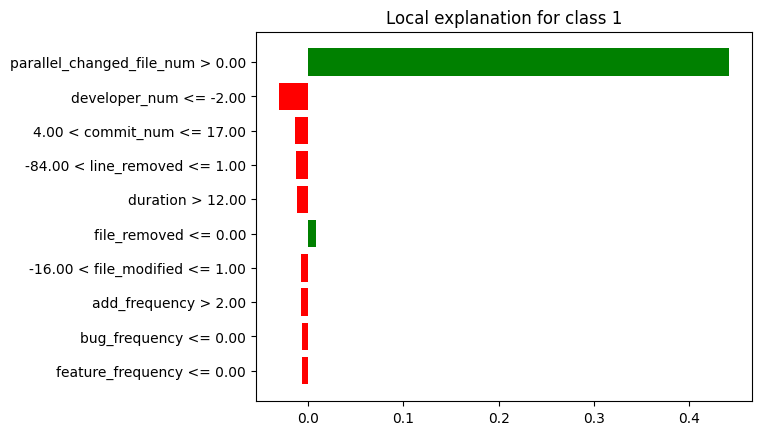

In [ ]:
lime_fn_mediana.plot()

In [ ]:
breakdown_fn_df_mediana = breakdown_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(index=[0, 26])
breakdown_fn_df_mediana['sign'] = breakdown_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_mediana = breakdown_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_mediana = shap_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_mediana = shap_fn_df_mediana.tail(25)
shap_fn_df_mediana['sign'] = shap_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_mediana = shap_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_mediana["Variable"] = lime_fn_df_mediana["variable"].str.split(" ").str[0]
lime_fn_df_mediana["Signo"] = lime_fn_df_mediana["effect"].apply(evaluar_valor)
lime_fn_df_mediana = lime_fn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_mediana['Ranking'] = breakdown_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_mediana = breakdown_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_mediana['Ranking'] = shap_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_mediana = shap_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_mediana['Ranking'] = lime_fn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_mediana = lime_fn_df_mediana.head(5)
lime_fn_df_mediana = lime_fn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(columns=['contribution'])
shap_fn_df_mediana = shap_fn_df_mediana.drop(columns=['contribution'])
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_mediana = breakdown_fn_df_mediana.head(5)
breakdown_fn_df_mediana = breakdown_fn_df_mediana.reset_index(drop=True)

shap_fn_df_mediana = shap_fn_df_mediana.head(5)
shap_fn_df_mediana = shap_fn_df_mediana.reset_index(drop=True)

lime_fn_df_mediana = lime_fn_df_mediana.reset_index(drop=True)
lime_fn_df_mediana.at[2, 'Variable'] = 'commit_num'
lime_fn_df_mediana.at[3, 'Variable'] = 'line_removed'

print(breakdown_fn_df_mediana)
print(shap_fn_df_mediana)
print(lime_fn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Negativo
3                   duration        4  Negativo
4                 line_added        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2              file_modified        3  Negativo
3                 commit_num        4  Negativo
4                   duration        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Negativo
3               line_removed        4  Negativo
4                   duration        5  Negativo


In [ ]:
#lime_fn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_mediana['Variable'])
shapley_features = list(shap_fn_df_mediana['Variable'])
lime_features = list(lime_fn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_mediana[breakdown_fn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_mediana[shap_fn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_mediana[lime_fn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'developer_num', 'commit_num', 'duration', 'line_added']
['parallel_changed_file_num', 'developer_num', 'file_modified', 'commit_num', 'duration']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'line_removed', 'duration']
['line_removed', 'line_added', 'developer_num', 'commit_num', 'duration', 'parallel_changed_file_num', 'file_modified']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               line_removed         -         -       -         -       4   
1                 line_added         5  Positivo       -         -       -   
2              developer_num         2  Negativo       2  Negativo       2   
3                 commit_num         3  Negativo       4  Negativo       3   
4                   duration         4  Negativo       5  Negativo       5   
5  parallel_changed_file_num         1  Positivo       1  Positivo       1   
6              file_modified         -         -       3  Negativo       -   

             
      Signo  
0  Negativo  
1         -  
2  Negativo  
3  Negativo  
4  Negativo  
5  Positivo  
6         -

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "commit_num", "duration", "line_added", "file_modified", "line_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Negativo       2  Negativo       2   
commit_num                        3  Negativo       4  Negativo       3   
duration                          4  Negativo       5  Negativo       5   
line_added                        5  Positivo       -         -       -   
file_modified                     -         -       3  Negativo       -   
line_removed                      -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Negativo  
commit_num                 Negativo  
duration                   Negativo  
line_added                        -  
file_modified                     -  
line_removed               Negativo

### **Instancia FN MIN:**

In [ ]:
breakdown_fn_min = exp.predict_parts(df_instancia_fn_min, type="break_down",random_state=42)
shap_fn_min = exp.predict_parts(df_instancia_fn_min, type="shap",random_state=42)
lime_fn_min = exp.predict_surrogate(df_instancia_fn_min, random_state=42)

breakdown_fn_df_min = breakdown_fn_min.result
shap_fn_df_min = shap_fn_min.result
lime_fn_df_min = lime_fn_min.result

In [ ]:
breakdown_fn_min.plot()

In [ ]:
shap_fn_min.plot()

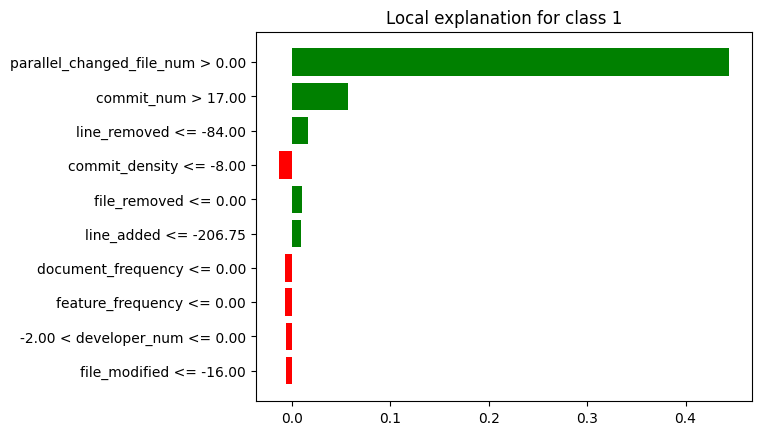

In [ ]:
lime_fn_min.plot()

In [ ]:
breakdown_fn_df_min = breakdown_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_min = breakdown_fn_df_min.drop(index=[0, 26])
breakdown_fn_df_min['sign'] = breakdown_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_min = breakdown_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_min = shap_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_min = shap_fn_df_min.tail(25)
shap_fn_df_min['sign'] = shap_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_min = shap_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_min["Variable"] = lime_fn_df_min["variable"].str.split(" ").str[0]
lime_fn_df_min["Signo"] = lime_fn_df_min["effect"].apply(evaluar_valor)
lime_fn_df_min = lime_fn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_min = lime_fn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_min['Ranking'] = breakdown_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_min = breakdown_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_min['Ranking'] = shap_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_min = shap_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_min['Ranking'] = lime_fn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_min = lime_fn_df_min.head(5)
lime_fn_df_min = lime_fn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fn_df_min = breakdown_fn_df_min.drop(columns=['contribution'])
shap_fn_df_min = shap_fn_df_min.drop(columns=['contribution'])
lime_fn_df_min = lime_fn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_min = breakdown_fn_df_min.head(5)
breakdown_fn_df_min = breakdown_fn_df_min.reset_index(drop=True)

shap_fn_df_min = shap_fn_df_min.head(5)
shap_fn_df_min = shap_fn_df_min.reset_index(drop=True)

lime_fn_df_min = lime_fn_df_min.reset_index(drop=True)

print(breakdown_fn_df_min)
print(shap_fn_df_min)
print(lime_fn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1             commit_density        2  Negativo
2              developer_num        3  Positivo
3                 commit_num        4  Positivo
4               line_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1             commit_density        2  Negativo
2                 commit_num        3  Positivo
3              developer_num        4  Positivo
4               messages_max        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               line_removed        3  Positivo
3             commit_density        4  Negativo
4               file_removed        5  Positivo


In [ ]:
#lime_fn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_min['Variable'])
shapley_features = list(shap_fn_df_min['Variable'])
lime_features = list(lime_fn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_min[breakdown_fn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_min[shap_fn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_min[lime_fn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'commit_density', 'developer_num', 'commit_num', 'line_removed']
['parallel_changed_file_num', 'commit_density', 'commit_num', 'developer_num', 'messages_max']
['parallel_changed_file_num', 'commit_num', 'line_removed', 'commit_density', 'file_removed']
['commit_density', 'line_removed', 'developer_num', 'commit_num', 'file_removed', 'messages_max', 'parallel_changed_file_num']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0             commit_density         2  Negativo       2  Negativo       4   
1               line_removed         5  Positivo       -         -       3   
2              developer_num         3  Positivo       4  Positivo       -   
3                 commit_num         4  Positivo       3  Positivo       2   
4               file_removed         -         -       -         -       5   
5               messages_max         -         -       5  Positivo       -   
6  parallel_changed_file_num         1  Positivo       1  Positivo       1   

             
      Signo  
0  Negativo  
1  Positivo  
2         -  
3  Positivo  
4  Positivo  
5         -  
6  Positivo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_density", "developer_num", "commit_num", "line_removed", "messages_max", "file_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_density                    2  Negativo       2  Negativo       4   
developer_num                     3  Positivo       4  Positivo       -   
commit_num                        4  Positivo       3  Positivo       2   
line_removed                      5  Positivo       -         -       3   
messages_max                      -         -       5  Positivo       -   
file_removed                      -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_density             Negativo  
developer_num                     -  
commit_num                 Positivo  
line_removed               Positivo  
messages_max                      -  
file_removed               Positivo

### **FN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_added', 4), ('commit_density', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('duration', 4), ('line_added', 5), ('parallel_changed_file_num', 1), ('commit_density', 2), ('developer_num', 3), ('commit_num', 4), ('line_removed', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_modified', 4), ('file_removed', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 4), ('duration', 5), ('file_modified', 3), ('parallel_changed_file_num', 1), ('commit_density', 2), ('developer_num', 4), ('commit_num', 3), ('messages_max', 5)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 2), ('file_modified', 5), ('file_removed', 4), ('line_removed', 3), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('duration', 5), ('line_removed', 4), ('parallel_changed_file_num', 1), 

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_rf_fn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_rf_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_modified                         -      -           3.5      2   
parallel_changed_file_num           1.0      3           1.0      3   
messages_max                          -      -           5.0      1   
file_removed                          -      -           5.0      1   
duration                            4.0      1           5.0      1   
commit_num                          3.0      3           3.0      3   
developer_num                  2.666667      3           3.0      3   
line_added                          4.5      2             -      -   
line_removed                        5.0      1             -      -   
commit_density                      3.5      2           2.0      1   

                                   Lime         
                          Ranking Medio Conteo  
file_modified                       5.0      1  
parallel_changed_file_num           1.0      3  
messages_max                          -      -  
file_removed                        4.5      2  
duration                            5.0      1  
commit_num                     2.333333      3  
developer_num                       2.0      1  
line_added                            -      -  
line_removed                   3.333333      3  
commit_density                      4.0      1

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_rf_fn[("General", "Ranking")] = df_resumen_rf_fn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_rf_fn[("General", "Conteo Total")] = df_resumen_rf_fn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_rf_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_modified                         -      -           3.5      2   
parallel_changed_file_num           1.0      3           1.0      3   
messages_max                          -      -           5.0      1   
file_removed                          -      -           5.0      1   
duration                            4.0      1           5.0      1   
commit_num                          3.0      3           3.0      3   
developer_num                  2.666667      3           3.0      3   
line_added                          4.5      2             -      -   
line_removed                        5.0      1             -      -   
commit_density                      3.5      2           2.0      1   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
file_modified                       5.0      1  4.250000            3  
parallel_changed_file_num           1.0      3  1.000000            9  
messages_max                          -      -  5.000000            1  
file_removed                        4.5      2  4.750000            3  
duration                            5.0      1  4.666667            3  
commit_num                     2.333333      3  2.777778            9  
developer_num                       2.0      1  2.555556            7  
line_added                            -      -  4.500000            2  
line_removed                   3.333333      3  4.166667            4  
commit_density                      4.0      1  3.166667            4

In [ ]:
# Obtener el número de características
num_caract = df_resumen_rf_fn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_rf_fn[("General", "Peso Rango")] = 1 - ((df_resumen_rf_fn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_rf_fn[("General", "Peso Conteo")] = df_resumen_rf_fn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_rf_fn[("General", "Puntaje")] = df_resumen_rf_fn[("General", "Peso Rango")] + df_resumen_rf_fn[("General", "Peso Conteo")]
df_resumen_rf_fn[("General", "Ranking")] = df_resumen_rf_fn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_rf_fn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_rf_fn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_rf_fn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_rf_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_modified                         -      -           3.5      2   
parallel_changed_file_num           1.0      3           1.0      3   
messages_max                          -      -           5.0      1   
file_removed                          -      -           5.0      1   
duration                            4.0      1           5.0      1   
commit_num                          3.0      3           3.0      3   
developer_num                  2.666667      3           3.0      3   
line_added                          4.5      2             -      -   
line_removed                        5.0      1             -      -   
commit_density                      3.5      2           2.0      1   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
file_modified                       5.0      1     6.0            3  
parallel_changed_file_num           1.0      3     1.0            9  
messages_max                          -      -    10.0            1  
file_removed                        4.5      2     9.0            3  
duration                            5.0      1     7.0            3  
commit_num                     2.333333      3     2.0            9  
developer_num                       2.0      1     3.0            7  
line_added                            -      -     8.0            2  
line_removed                   3.333333      3     5.0            4  
commit_density                      4.0      1     4.0            4

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_rf_fn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_rf_fn = df_resumen_rf_fn[new_columns]

In [ ]:
df_resumen_rf_fn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_rf_fn[(tech, "Ranking Medio")] = df_resumen_rf_fn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_rf_fn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
commit_num                    2.0            9          3.00      3   
developer_num                 3.0            7          2.67      3   
commit_density                4.0            4          3.50      2   
line_removed                  5.0            4          5.00      1   
file_modified                 6.0            3             -      -   
duration                      7.0            3          4.00      1   
line_added                    8.0            2          4.50      2   
file_removed                  9.0            3             -      -   
messages_max                 10.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         3.00      3          2.33      3  
developer_num                      3.00      3          2.00      1  
commit_density                     2.00      1          4.00      1  
line_removed                          -      -          3.33      3  
file_modified                      3.50      2          5.00      1  
duration                           5.00      1          5.00      1  
line_added                            -      -             -      -  
file_removed                       5.00      1          4.50      2  
messages_max                       5.00      1             -      -

## **BalancedRandomForest:**

**FEATURE IMPORTANCE**

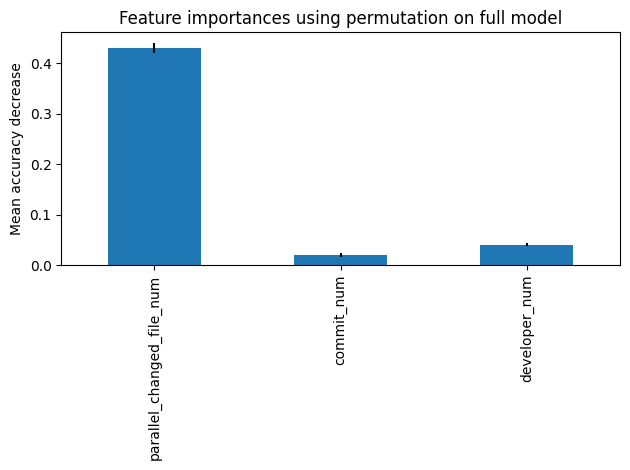

In [ ]:
permu = permutation_importance(modelo_brf, x_test, y_test, n_repeats=20, random_state=42, n_jobs=2, scoring='f1')

# Umbral para valores significativos
importance_threshold = 0.01

# Filtrar los caracteristicas
significant_indices = permu.importances_mean > importance_threshold
permu_importances = pd.Series(permu.importances_mean.round(2), index=feature_names)[significant_indices]
permu_std = permu.importances_std[significant_indices]

# Crear la representación gráfica
fig, ax = plt.subplots()
permu_importances.plot.bar(yerr=permu_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

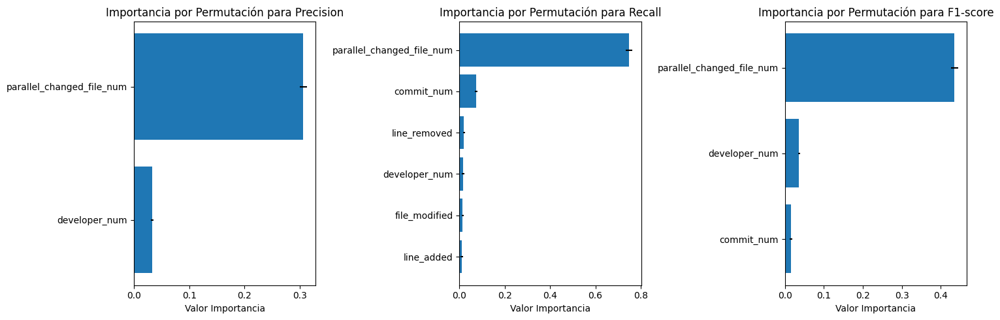

In [ ]:
scoring = ['precision', 'recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

permu_score = permutation_importance(modelo_brf, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Umbral para importancias significativas
importance_threshold = 0.01

# Itera a través de las métricas
for i, metric in enumerate(scoring):
    permu = permu_score[metric]

    # Filtra las características que cumplen la condición del umbral
    significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
    sorted_feature_names = [feature_names[j] for j in significant_indices]
    importances_mean = permu.importances_mean[significant_indices]
    importances_std = permu.importances_std[significant_indices]

    # Ordena los datos por importancia de mayor a menor
    sorted_indices = np.argsort(importances_mean)[::1]
    sorted_feature_names = [sorted_feature_names[j] for j in sorted_indices]
    importances_mean = importances_mean[sorted_indices]
    importances_std = importances_std[sorted_indices]

    # Crea la representación gráfica en el subplot correspondiente
    axs[i].barh(range(len(sorted_feature_names)), importances_mean, xerr=importances_std, align='center')
    axs[i].set_yticks(range(len(sorted_feature_names)))
    axs[i].set_yticklabels(sorted_feature_names)
    axs[i].set_xlabel('Valor Importancia')
    axs[i].set_title(f'Importancia por Permutación para {metric_names[i]}')

# Ajusta los espacios entre subplots y muestra la figura
plt.tight_layout()
plt.show()


In [ ]:
scoring = ['precision','recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

# Umbral para importancias significativas
importance_threshold = 0.01

# Crea un diccionario para almacenar los DataFrames
results_global_brf = {}

permu_score = permutation_importance(modelo_brf, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
for i, metric in enumerate(scoring):
  permu = permu_score[metric]

  # Filtra las características que cumplen la condición
  significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
  sorted_feature_names = [feature_names[j] for j in significant_indices]
  importances_mean = permu.importances_mean[significant_indices]
  importances_std = permu.importances_std[significant_indices]

  # Crear un DataFrame con los resultados
  df_exp_global = pd.DataFrame({'Feature': sorted_feature_names,
                       'Importance_Mean': importances_mean,
                       'Importance_Std': importances_std})

  # Ordenar el DataFrame por importance_mean en orden descendente
  df_exp_global = df_exp_global.sort_values(by='Importance_Mean', ascending=False)

  # Asignar el DataFrame al diccionario con el nombre de la métrica
  results_global_brf[f'df_global_{metric_names[i]}'] = df_exp_global

In [ ]:
results_global_brf['df_global_Precision']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.306303,0.006677
1,developer_num,0.033193,0.002191


In [ ]:
results_global_brf['df_global_Recall']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.748625,0.015126
1,commit_num,0.074532,0.005830
4,line_removed,0.020352,0.004004
5,developer_num,0.016502,0.004895
2,file_modified,0.013806,0.004462
3,line_added,0.010451,0.005011


In [ ]:
results_global_brf['df_global_F1-score']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.434903,0.009250
2,developer_num,0.036430,0.002844
1,commit_num,0.015486,0.003225


**BREAK-DOWN, SHAP Y LIME:**

In [ ]:
#primero definimos el explainer
exp = dx.Explainer(modelo_brf, x_train, y_train)

Preparation of a new explainer is initiated

  -> data              : 28090 rows 25 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 28090 values
  -> model_class       : imblearn.ensemble._forest.BalancedRandomForestClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x7ea4d39cf130> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.0, mean = 0.188, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -1.0, mean = -0.113, max = 0.8
  -> model_info        : package imblearn

A new explainer has been created!


### **Instancia VP MAX:**

In [ ]:
breakdown_vp_max = exp.predict_parts(df_instancia_vp_max, type="break_down",random_state=42)
shap_vp_max = exp.predict_parts(df_instancia_vp_max, type="shap",random_state=42)
lime_vp_max = exp.predict_surrogate(df_instancia_vp_max, random_state=42)

breakdown_vp_df_max = breakdown_vp_max.result
shap_vp_df_max = shap_vp_max.result
lime_vp_df_max=lime_vp_max.result

In [ ]:
breakdown_vp_max.plot()

In [ ]:
shap_vp_max.plot()

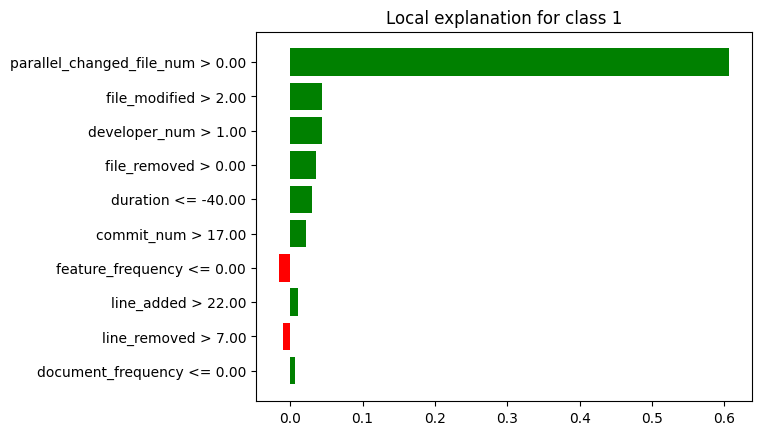

In [ ]:
lime_vp_max.plot()

In [ ]:
breakdown_vp_df_max = breakdown_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_max = breakdown_vp_df_max.drop(index=[0, 26])
breakdown_vp_df_max['sign'] = breakdown_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_max = breakdown_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_max = shap_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_max = shap_vp_df_max.tail(25)
shap_vp_df_max['sign'] = shap_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_max = shap_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_max["Variable"] = lime_vp_df_max["variable"].str.split(" ").str[0]
lime_vp_df_max["Signo"] = lime_vp_df_max["effect"].apply(evaluar_valor)
lime_vp_df_max = lime_vp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_max = lime_vp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_max['Ranking'] = breakdown_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_max = breakdown_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_max['Ranking'] = shap_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_max = shap_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_max['Ranking'] = lime_vp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_max = lime_vp_df_max.head(5)
lime_vp_df_max = lime_vp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_max = breakdown_vp_df_max.drop(columns=['contribution'])
shap_vp_df_max = shap_vp_df_max.drop(columns=['contribution'])
lime_vp_df_max = lime_vp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_max = breakdown_vp_df_max.head(5)
breakdown_vp_df_max = breakdown_vp_df_max.reset_index(drop=True)

shap_vp_df_max = shap_vp_df_max.head(5)
shap_vp_df_max = shap_vp_df_max.reset_index(drop=True)

lime_vp_df_max = lime_vp_df_max.reset_index(drop=True)

print(breakdown_vp_df_max)
print(shap_vp_df_max)
print(lime_vp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3                   duration        4  Negativo
4                 file_added        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              file_modified        3  Positivo
3                 file_added        4  Positivo
4                 line_added        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              file_modified        2  Positivo
2              developer_num        3  Positivo
3               file_removed        4  Positivo
4                   duration        5  Positivo


In [ ]:
#lime_vp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_max['Variable'])
shapley_features = list(shap_vp_df_max['Variable'])
lime_features = list(lime_vp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_max[breakdown_vp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_max[shap_vp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_max[lime_vp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'developer_num', 'duration', 'file_added']
['parallel_changed_file_num', 'commit_num', 'file_modified', 'file_added', 'line_added']
['parallel_changed_file_num', 'file_modified', 'developer_num', 'file_removed', 'duration']
['file_removed', 'file_added', 'line_added', 'developer_num', 'commit_num', 'duration', 'parallel_changed_file_num', 'file_modified']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       4   
1                 file_added         5  Positivo       4  Positivo       -   
2                 line_added         -         -       5  Positivo       -   
3              developer_num         3  Negativo       -         -       3   
4                 commit_num         2  Positivo       2  Positivo       -   
5                   duration         4  Negativo       -         -       5   
6  parallel_changed_file_num         1  Positivo       1  Positivo       1   
7              file_modified         -         -       3  Positivo       2   

             
      Signo  
0  Positivo  
1         -  
2         -  
3  Positivo  
4         -  
5  Positivo  
6  Positivo  
7  Positivo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "duration", "file_added", "file_modified", "line_added","file_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       -   
developer_num                     3  Negativo       -         -       3   
duration                          4  Negativo       -         -       5   
file_added                        5  Positivo       4  Positivo       -   
file_modified                     -         -       3  Positivo       2   
line_added                        -         -       5  Positivo       -   
file_removed                      -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                        -  
developer_num              Positivo  
duration                   Positivo  
file_added                        -  
file_modified              Positivo  
line_added                        -  
file_removed               Positivo

### **Instancia VP MEDIANA:**

In [ ]:
breakdown_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="break_down",random_state=42)
shap_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="shap",random_state=42)
lime_vp_mediana = exp.predict_surrogate(df_instancia_vp_mediana, random_state=42)

breakdown_vp_df_mediana = breakdown_vp_mediana.result
shap_vp_df_mediana = shap_vp_mediana.result
lime_vp_df_mediana=lime_vp_mediana.result

In [ ]:
breakdown_vp_mediana.plot()

In [ ]:
shap_vp_mediana.plot()

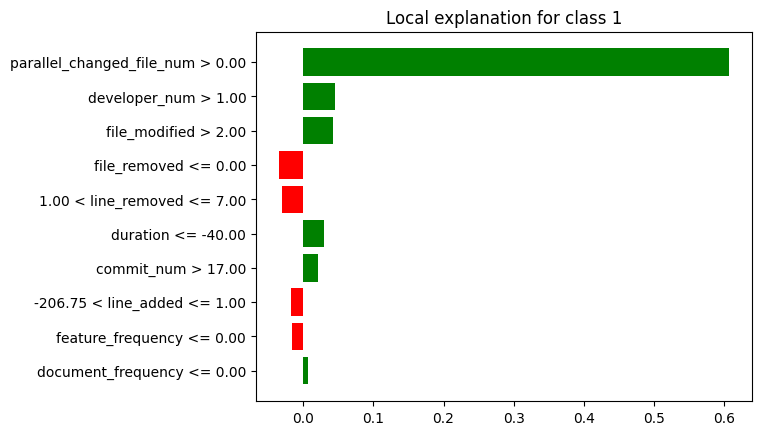

In [ ]:
lime_vp_mediana.plot()

In [ ]:
breakdown_vp_df_mediana = breakdown_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(index=[0, 26])
breakdown_vp_df_mediana['sign'] = breakdown_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_mediana = breakdown_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_mediana = shap_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_mediana = shap_vp_df_mediana.tail(25)
shap_vp_df_mediana['sign'] = shap_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_mediana = shap_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_mediana["Variable"] = lime_vp_df_mediana["variable"].str.split(" ").str[0]
lime_vp_df_mediana["Signo"] = lime_vp_df_mediana["effect"].apply(evaluar_valor)
lime_vp_df_mediana = lime_vp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_mediana['Ranking'] = breakdown_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_mediana = breakdown_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_mediana['Ranking'] = shap_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_mediana = shap_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_mediana['Ranking'] = lime_vp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_mediana = lime_vp_df_mediana.head(5)
lime_vp_df_mediana = lime_vp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(columns=['contribution'])
shap_vp_df_mediana = shap_vp_df_mediana.drop(columns=['contribution'])
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_mediana = breakdown_vp_df_mediana.head(5)
breakdown_vp_df_mediana = breakdown_vp_df_mediana.reset_index(drop=True)

shap_vp_df_mediana = shap_vp_df_mediana.head(5)
shap_vp_df_mediana = shap_vp_df_mediana.reset_index(drop=True)

lime_vp_df_mediana = lime_vp_df_mediana.reset_index(drop=True)
lime_vp_df_mediana.at[4, 'Variable'] = 'line_removed'

print(breakdown_vp_df_mediana)
print(shap_vp_df_mediana)
print(lime_vp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               line_removed        2  Positivo
2                 commit_num        3  Positivo
3             commit_density        4  Negativo
4                 line_added        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2                 line_added        3  Positivo
3               line_removed        4  Positivo
4                 commit_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2              file_modified        3  Positivo
3               file_removed        4  Negativo
4               line_removed        5  Negativo


In [ ]:
#lime_vp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_mediana['Variable'])
shapley_features = list(shap_vp_df_mediana['Variable'])
lime_features = list(lime_vp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_mediana[breakdown_vp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_mediana[shap_vp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_mediana[lime_vp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'line_removed', 'commit_num', 'commit_density', 'line_added']
['parallel_changed_file_num', 'developer_num', 'line_added', 'line_removed', 'commit_num']
['parallel_changed_file_num', 'developer_num', 'file_modified', 'file_removed', 'line_removed']
['commit_density', 'line_removed', 'line_added', 'developer_num', 'commit_num', 'file_removed', 'parallel_changed_file_num', 'file_modified']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0             commit_density         4  Negativo       -         -       -   
1               line_removed         2  Positivo       4  Positivo       5   
2                 line_added         5  Positivo       3  Positivo       -   
3              developer_num         -         -       2  Positivo       2   
4                 commit_num         3  Positivo       5  Positivo       -   
5               file_removed         -         -       -         -       4   
6  parallel_changed_file_num         1  Positivo       1  Positivo       1   
7              file_modified         -         -       -         -       3   

             
      Signo  
0         -  
1  Negativo  
2         -  
3  Positivo  
4         -  
5  Negativo  
6  Positivo  
7  Positivo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "line_removed", "commit_num", "commit_density", "line_added", "developer_num", "file_modified", "file_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
line_removed                      2  Positivo       4  Positivo       5   
commit_num                        3  Positivo       5  Positivo       -   
commit_density                    4  Negativo       -         -       -   
line_added                        5  Positivo       3  Positivo       -   
developer_num                     -         -       2  Positivo       2   
file_modified                     -         -       -         -       3   
file_removed                      -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
line_removed               Negativo  
commit_num                        -  
commit_density                    -  
line_added                        -  
developer_num              Positivo  
file_modified              Positivo  
file_removed               Negativo

### **Instancia VP MIN:**

In [ ]:
breakdown_vp_min = exp.predict_parts(df_instancia_vp_min, type="break_down",random_state=42)
shap_vp_min = exp.predict_parts(df_instancia_vp_min, type="shap",random_state=42)
lime_vp_min = exp.predict_surrogate(df_instancia_vp_min, random_state=42)

breakdown_vp_df_min = breakdown_vp_min.result
shap_vp_df_min = shap_vp_min.result
lime_vp_df_min = lime_vp_min.result

In [ ]:
breakdown_vp_min.plot()

In [ ]:
shap_vp_min.plot()

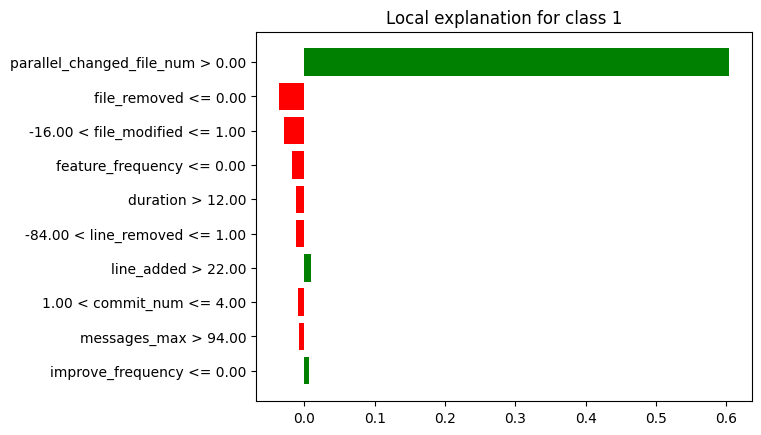

In [ ]:
lime_vp_min.plot()

In [ ]:
breakdown_vp_df_min = breakdown_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_min = breakdown_vp_df_min.drop(index=[0, 26])
breakdown_vp_df_min['sign'] = breakdown_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_min = breakdown_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_min = shap_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_min = shap_vp_df_min.tail(25)
shap_vp_df_min['sign'] = shap_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_min = shap_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_min["Variable"] = lime_vp_df_min["variable"].str.split(" ").str[0]
lime_vp_df_min["Signo"] = lime_vp_df_min["effect"].apply(evaluar_valor)
lime_vp_df_min = lime_vp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_min = lime_vp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_min['Ranking'] = breakdown_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_min = breakdown_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_min['Ranking'] = shap_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_min = shap_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_min['Ranking'] = lime_vp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_min = lime_vp_df_min.head(5)
lime_vp_df_min = lime_vp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_min = breakdown_vp_df_min.drop(columns=['contribution'])
shap_vp_df_min = shap_vp_df_min.drop(columns=['contribution'])
lime_vp_df_min = lime_vp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_min = breakdown_vp_df_min.head(5)
breakdown_vp_df_min = breakdown_vp_df_min.reset_index(drop=True)

shap_vp_df_min = shap_vp_df_min.head(5)
shap_vp_df_min = shap_vp_df_min.reset_index(drop=True)

lime_vp_df_min = lime_vp_df_min.reset_index(drop=True)
lime_vp_df_min.at[2, 'Variable'] = 'file_modified'

print(breakdown_vp_df_min)
print(shap_vp_df_min)
print(lime_vp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Negativo
2               file_removed        3  Negativo
3              developer_num        4  Positivo
4           remove_frequency        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2              use_frequency        3  Negativo
3              fix_frequency        4  Negativo
4               messages_max        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               file_removed        2  Negativo
2              file_modified        3  Negativo
3          feature_frequency        4  Negativo
4                   duration        5  Negativo


In [ ]:
#lime_vp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_min['Variable'])
shapley_features = list(shap_vp_df_min['Variable'])
lime_features = list(lime_vp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_min[breakdown_vp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_min[shap_vp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_min[lime_vp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'commit_num', 'file_removed', 'developer_num', 'remove_frequency']
['parallel_changed_file_num', 'developer_num', 'use_frequency', 'fix_frequency', 'messages_max']
['parallel_changed_file_num', 'file_removed', 'file_modified', 'feature_frequency', 'duration']
['file_removed', 'developer_num', 'commit_num', 'duration', 'messages_max', 'fix_frequency', 'remove_frequency', 'parallel_changed_file_num', 'feature_frequency', 'file_modified', 'use_frequency']


Variable Breakdown           Shapley              Lime  \
                                Ranking     Signo Ranking     Signo Ranking   
0                file_removed         3  Negativo       -         -       2   
1               developer_num         4  Positivo       2  Positivo       -   
2                  commit_num         2  Negativo       -         -       -   
3                    duration         -         -       -         -       5   
4                messages_max         -         -       5  Negativo       -   
5               fix_frequency         -         -       4  Negativo       -   
6            remove_frequency         5  Positivo       -         -       -   
7   parallel_changed_file_num         1  Positivo       1  Positivo       1   
8           feature_frequency         -         -       -         -       4   
9               file_modified         -         -       -         -       3   
10              use_frequency         -         -       3  Negativo       -   

              
       Signo  
0   Negativo  
1          -  
2          -  
3   Negativo  
4          -  
5          -  
6          -  
7   Positivo  
8   Negativo  
9   Negativo  
10         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "file_removed", "developer_num", "remove_frequency", "use_frequency", "fix_frequency", "messages_max", "file_modified", "feature_frequency", "duration"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Negativo       -         -       -   
file_removed                      3  Negativo       -         -       2   
developer_num                     4  Positivo       2  Positivo       -   
remove_frequency                  5  Positivo       -         -       -   
use_frequency                     -         -       3  Negativo       -   
fix_frequency                     -         -       4  Negativo       -   
messages_max                      -         -       5  Negativo       -   
file_modified                     -         -       -         -       3   
feature_frequency                 -         -       -         -       4   
duration                          -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                        -  
file_removed               Negativo  
developer_num                     -  
remove_frequency                  -  
use_frequency                     -  
fix_frequency                     -  
messages_max                      -  
file_modified              Negativo  
feature_frequency          Negativo  
duration                   Negativo

### **VP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('duration', 4), ('file_added', 5), ('parallel_changed_file_num', 1), ('line_removed', 2), ('commit_num', 3), ('commit_density', 4), ('line_added', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('file_removed', 3), ('developer_num', 4), ('remove_frequency', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 2), ('file_added', 4), ('file_modified', 3), ('line_added', 5), ('parallel_changed_file_num', 1), ('line_removed', 4), ('commit_num', 5), ('line_added', 3), ('developer_num', 2), ('parallel_changed_file_num', 1), ('developer_num', 2), ('use_frequency', 3), ('fix_frequency', 4), ('messages_max', 5)], 'Lime': [('parallel_changed_file_num', 1), ('developer_num', 3), ('duration', 5), ('file_modified', 2), ('file_removed', 4), ('parallel_changed_file_num', 1), ('line_removed', 5), ('developer_num', 2), ('file_modified', 3), ('file_removed', 4), ('parallel_changed_file_num',

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_brf_vp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_brf_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
feature_frequency                     -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
remove_frequency                    5.0      1             -      -   
fix_frequency                         -      -           4.0      1   
messages_max                          -      -           5.0      1   
commit_num                     2.333333      3           3.5      2   
developer_num                       3.5      2           2.0      2   
commit_density                      4.0      1             -      -   
line_added                          5.0      1           4.0      2   
file_added                          5.0      1           4.0      1   
file_modified                         -      -           3.0      1   
use_frequency                         -      -           3.0      1   
duration                            4.0      1             -      -   
line_removed                        2.0      1           4.0      1   
file_removed                        3.0      1             -      -   

                                   Lime         
                          Ranking Medio Conteo  
feature_frequency                   4.0      1  
parallel_changed_file_num           1.0      3  
remove_frequency                      -      -  
fix_frequency                         -      -  
messages_max                          -      -  
commit_num                            -      -  
developer_num                       2.5      2  
commit_density                        -      -  
line_added                            -      -  
file_added                            -      -  
file_modified                  2.666667      3  
use_frequency                         -      -  
duration                            5.0      2  
line_removed                        5.0      1  
file_removed                   3.333333      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_brf_vp[("General", "Ranking")] = df_resumen_brf_vp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_brf_vp[("General", "Conteo Total")] = df_resumen_brf_vp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_brf_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
feature_frequency                     -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
remove_frequency                    5.0      1             -      -   
fix_frequency                         -      -           4.0      1   
messages_max                          -      -           5.0      1   
commit_num                     2.333333      3           3.5      2   
developer_num                       3.5      2           2.0      2   
commit_density                      4.0      1             -      -   
line_added                          5.0      1           4.0      2   
file_added                          5.0      1           4.0      1   
file_modified                         -      -           3.0      1   
use_frequency                         -      -           3.0      1   
duration                            4.0      1             -      -   
line_removed                        2.0      1           4.0      1   
file_removed                        3.0      1             -      -   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
feature_frequency                   4.0      1  4.000000            1  
parallel_changed_file_num           1.0      3  1.000000            9  
remove_frequency                      -      -  5.000000            1  
fix_frequency                         -      -  4.000000            1  
messages_max                          -      -  5.000000            1  
commit_num                            -      -  2.916667            5  
developer_num                       2.5      2  2.666667            6  
commit_density                        -      -  4.000000            1  
line_added                            -      -  4.500000            3  
file_added                            -      -  4.500000            2  
file_modified                  2.666667      3  2.833333            4  
use_frequency                         -      -  3.000000            1  
duration                            5.0      2  4.500000            3  
line_removed                        5.0      1  3.666667            3  
file_removed                   3.333333      3  3.166667            4

In [ ]:
# Obtener el número de características
num_caract = df_resumen_brf_vp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_brf_vp[("General", "Peso Rango")] = 1 - ((df_resumen_brf_vp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_brf_vp[("General", "Peso Conteo")] = df_resumen_brf_vp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_brf_vp[("General", "Puntaje")] = df_resumen_brf_vp[("General", "Peso Rango")] + df_resumen_brf_vp[("General", "Peso Conteo")]
df_resumen_brf_vp[("General", "Ranking")] = df_resumen_brf_vp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_brf_vp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_brf_vp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_brf_vp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_brf_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
feature_frequency                     -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
remove_frequency                    5.0      1             -      -   
fix_frequency                         -      -           4.0      1   
messages_max                          -      -           5.0      1   
commit_num                     2.333333      3           3.5      2   
developer_num                       3.5      2           2.0      2   
commit_density                      4.0      1             -      -   
line_added                          5.0      1           4.0      2   
file_added                          5.0      1           4.0      1   
file_modified                         -      -           3.0      1   
use_frequency                         -      -           3.0      1   
duration                            4.0      1             -      -   
line_removed                        2.0      1           4.0      1   
file_removed                        3.0      1             -      -   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
feature_frequency                   4.0      1    11.0            1  
parallel_changed_file_num           1.0      3     1.0            9  
remove_frequency                      -      -    14.0            1  
fix_frequency                         -      -    11.0            1  
messages_max                          -      -    14.0            1  
commit_num                            -      -     3.0            5  
developer_num                       2.5      2     2.0            6  
commit_density                        -      -    11.0            1  
line_added                            -      -     8.0            3  
file_added                            -      -    10.0            2  
file_modified                  2.666667      3     4.0            4  
use_frequency                         -      -     7.0            1  
duration                            5.0      2     8.0            3  
line_removed                        5.0      1     6.0            3  
file_removed                   3.333333      3     5.0            4

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_brf_vp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_brf_vp = df_resumen_brf_vp[new_columns]

In [ ]:
df_resumen_brf_vp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_brf_vp[(tech, "Ranking Medio")] = df_resumen_brf_vp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_brf_vp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
developer_num                 2.0            6          3.50      2   
commit_num                    3.0            5          2.33      3   
file_modified                 4.0            4             -      -   
file_removed                  5.0            4          3.00      1   
line_removed                  6.0            3          2.00      1   
use_frequency                 7.0            1             -      -   
line_added                    8.0            3          5.00      1   
duration                      8.0            3          4.00      1   
file_added                   10.0            2          5.00      1   
feature_frequency            11.0            1             -      -   
fix_frequency                11.0            1             -      -   
commit_density               11.0            1          4.00      1   
remove_frequency             14.0            1          5.00      1   
messages_max                 14.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
developer_num                      2.00      2          2.50      2  
commit_num                         3.50      2             -      -  
file_modified                      3.00      1          2.67      3  
file_removed                          -      -          3.33      3  
line_removed                       4.00      1          5.00      1  
use_frequency                      3.00      1             -      -  
line_added                         4.00      2             -      -  
duration                              -      -          5.00      2  
file_added                         4.00      1             -      -  
feature_frequency                     -      -          4.00      1  
fix_frequency                      4.00      1             -      -  
commit_density                        -      -             -      -  
remove_frequency                      -      -             -      -  
messages_max                       5.00      1             -      -

### **Instancia VN MAX:**

In [ ]:
breakdown_vn_max = exp.predict_parts(df_instancia_vn_max, type="break_down",random_state=42)
shap_vn_max = exp.predict_parts(df_instancia_vn_max, type="shap",random_state=42)
lime_vn_max = exp.predict_surrogate(df_instancia_vn_max, random_state=42)

breakdown_vn_df_max = breakdown_vn_max.result
shap_vn_df_max = shap_vn_max.result
lime_vn_df_max = lime_vn_max.result

In [ ]:
breakdown_vn_max.plot()

In [ ]:
shap_vn_max.plot()

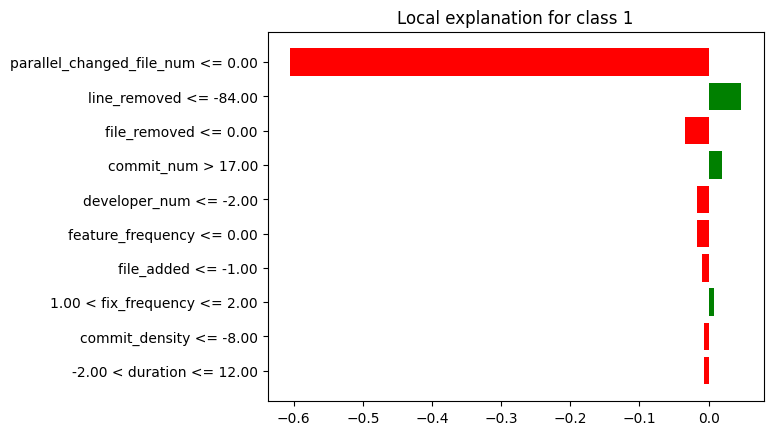

In [ ]:
lime_vn_max.plot()

In [ ]:
breakdown_vn_df_max = breakdown_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_max = breakdown_vn_df_max.drop(index=[0, 26])
breakdown_vn_df_max['sign'] = breakdown_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_max = breakdown_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_max = shap_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_max = shap_vn_df_max.tail(25)
shap_vn_df_max['sign'] = shap_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_max = shap_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_max["Variable"] = lime_vn_df_max["variable"].str.split(" ").str[0]
lime_vn_df_max["Signo"] = lime_vn_df_max["effect"].apply(evaluar_valor)
lime_vn_df_max = lime_vn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_max = lime_vn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_max['Ranking'] = breakdown_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_max = breakdown_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_max['Ranking'] = shap_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_max = shap_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_max['Ranking'] = lime_vn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_max = lime_vn_df_max.head(5)
lime_vn_df_max = lime_vn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_vn_df_max = breakdown_vn_df_max.drop(columns=['contribution'])
shap_vn_df_max = shap_vn_df_max.drop(columns=['contribution'])
lime_vn_df_max = lime_vn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_max = breakdown_vn_df_max.head(5)
breakdown_vn_df_max = breakdown_vn_df_max.reset_index(drop=True)

shap_vn_df_max = shap_vn_df_max.head(5)
shap_vn_df_max = shap_vn_df_max.reset_index(drop=True)

lime_vn_df_max = lime_vn_df_max.reset_index(drop=True)

print(breakdown_vn_df_max)
print(shap_vn_df_max)
print(lime_vn_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2                 line_added        3  Positivo
3              file_modified        4  Positivo
4                   duration        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              file_modified        3  Positivo
3              developer_num        4  Negativo
4                   duration        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               line_removed        2  Positivo
2               file_removed        3  Negativo
3                 commit_num        4  Positivo
4              developer_num        5  Negativo


In [ ]:
#lime_vn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_max['Variable'])
shapley_features = list(shap_vn_df_max['Variable'])
lime_features = list(lime_vn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_max[breakdown_vn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_max[shap_vn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_max[lime_vn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'line_added', 'file_modified', 'duration']
['parallel_changed_file_num', 'commit_num', 'file_modified', 'developer_num', 'duration']
['parallel_changed_file_num', 'line_removed', 'file_removed', 'commit_num', 'developer_num']
['file_removed', 'line_removed', 'line_added', 'developer_num', 'commit_num', 'duration', 'parallel_changed_file_num', 'file_modified']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       3   
1               line_removed         -         -       -         -       2   
2                 line_added         3  Positivo       -         -       -   
3              developer_num         -         -       4  Negativo       5   
4                 commit_num         2  Negativo       2  Negativo       4   
5                   duration         5  Negativo       5  Negativo       -   
6  parallel_changed_file_num         1  Negativo       1  Negativo       1   
7              file_modified         4  Positivo       3  Positivo       -   

             
      Signo  
0  Negativo  
1  Positivo  
2         -  
3  Negativo  
4  Positivo  
5         -  
6  Negativo  
7         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "line_added", "file_modified", "duration", "developer_num", "line_removed", "file_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
commit_num                        2  Negativo       2  Negativo       4   
line_added                        3  Positivo       -         -       -   
file_modified                     4  Positivo       3  Positivo       -   
duration                          5  Negativo       5  Negativo       -   
developer_num                     -         -       4  Negativo       5   
line_removed                      -         -       -         -       2   
file_removed                      -         -       -         -       3   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
commit_num                 Positivo  
line_added                        -  
file_modified                     -  
duration                          -  
developer_num              Negativo  
line_removed               Positivo  
file_removed               Negativo

### **Instancia VN MEDIANA:**

In [ ]:
breakdown_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="break_down",random_state=42)
shap_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="shap",random_state=42)
lime_vn_mediana = exp.predict_surrogate(df_instancia_vn_mediana, random_state=42)

breakdown_vn_df_mediana = breakdown_vn_mediana.result
shap_vn_df_mediana = shap_vn_mediana.result
lime_vn_df_mediana = lime_vn_mediana.result

In [ ]:
breakdown_vn_mediana.plot()

In [ ]:
shap_vn_mediana.plot()

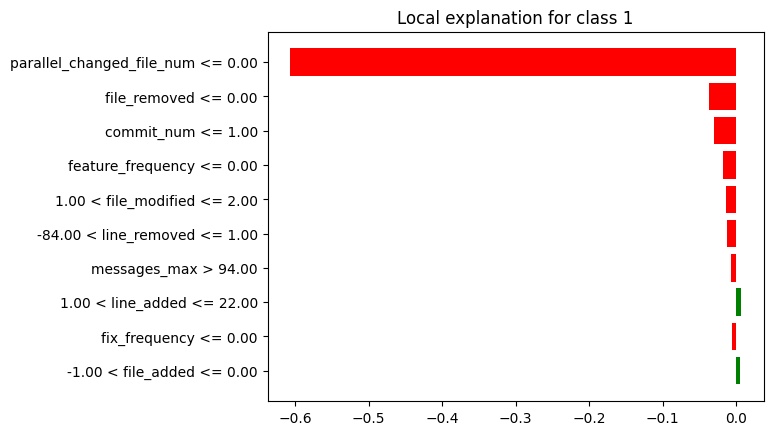

In [ ]:
lime_vn_mediana.plot()

In [ ]:
breakdown_vn_df_mediana = breakdown_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(index=[0, 26])
breakdown_vn_df_mediana['sign'] = breakdown_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_mediana = breakdown_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_mediana = shap_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_mediana = shap_vn_df_mediana.tail(25)
shap_vn_df_mediana['sign'] = shap_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_mediana = shap_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_mediana["Variable"] = lime_vn_df_mediana["variable"].str.split(" ").str[0]
lime_vn_df_mediana["Signo"] = lime_vn_df_mediana["effect"].apply(evaluar_valor)
lime_vn_df_mediana = lime_vn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_mediana['Ranking'] = breakdown_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_mediana = breakdown_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_mediana['Ranking'] = shap_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_mediana = shap_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_mediana['Ranking'] = lime_vn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_mediana = lime_vn_df_mediana.head(5)
lime_vn_df_mediana = lime_vn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(columns=['contribution'])
shap_vn_df_mediana = shap_vn_df_mediana.drop(columns=['contribution'])
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_mediana = breakdown_vn_df_mediana.head(5)
breakdown_vn_df_mediana = breakdown_vn_df_mediana.reset_index(drop=True)

shap_vn_df_mediana = shap_vn_df_mediana.head(5)
shap_vn_df_mediana = shap_vn_df_mediana.reset_index(drop=True)

lime_vn_df_mediana = lime_vn_df_mediana.reset_index(drop=True)
lime_vn_df_mediana.at[4, 'Variable'] = 'file_modified'

print(breakdown_vn_df_mediana)
print(shap_vn_df_mediana)
print(lime_vn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3                   duration        4  Positivo
4              file_modified        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              file_modified        2  Negativo
2               line_removed        3  Negativo
3           update_frequency        4  Positivo
4              developer_num        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               file_removed        2  Negativo
2                 commit_num        3  Negativo
3          feature_frequency        4  Negativo
4              file_modified        5  Negativo


In [ ]:
#lime_vn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_mediana['Variable'])
shapley_features = list(shap_vn_df_mediana['Variable'])
lime_features = list(lime_vn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_mediana[breakdown_vn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_mediana[shap_vn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_mediana[lime_vn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'commit_num', 'developer_num', 'duration', 'file_modified']
['parallel_changed_file_num', 'file_modified', 'line_removed', 'update_frequency', 'developer_num']
['parallel_changed_file_num', 'file_removed', 'commit_num', 'feature_frequency', 'file_modified']
['update_frequency', 'line_removed', 'developer_num', 'commit_num', 'duration', 'file_removed', 'parallel_changed_file_num', 'feature_frequency', 'file_modified']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0           update_frequency         -         -       4  Positivo       -   
1               line_removed         -         -       3  Negativo       -   
2              developer_num         3  Positivo       5  Negativo       -   
3                 commit_num         2  Negativo       -         -       3   
4                   duration         4  Positivo       -         -       -   
5               file_removed         -         -       -         -       2   
6  parallel_changed_file_num         1  Negativo       1  Negativo       1   
7          feature_frequency         -         -       -         -       4   
8              file_modified         5  Negativo       2  Negativo       5   

             
      Signo  
0         -  
1         -  
2         -  
3  Negativo  
4         -  
5  Negativo  
6  Negativo  
7  Negativo  
8  Negativo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "duration", "file_modified", "line_removed", "update_frequency", "file_removed", "feature_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
commit_num                        2  Negativo       -         -       3   
developer_num                     3  Positivo       5  Negativo       -   
duration                          4  Positivo       -         -       -   
file_modified                     5  Negativo       2  Negativo       5   
line_removed                      -         -       3  Negativo       -   
update_frequency                  -         -       4  Positivo       -   
file_removed                      -         -       -         -       2   
feature_frequency                 -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
commit_num                 Negativo  
developer_num                     -  
duration                          -  
file_modified              Negativo  
line_removed                      -  
update_frequency                  -  
file_removed               Negativo  
feature_frequency          Negativo

### **Instancia VN MIN:**

In [ ]:
breakdown_vn_min = exp.predict_parts(df_instancia_vn_min, type="break_down",random_state=42)
shap_vn_min = exp.predict_parts(df_instancia_vn_min, type="shap",random_state=42)
lime_vn_min = exp.predict_surrogate(df_instancia_vn_min, random_state=42)

breakdown_vn_df_min = breakdown_vn_min.result
shap_vn_df_min = shap_vn_min.result
lime_vn_df_min = lime_vn_min.result

In [ ]:
breakdown_vn_min.plot()

In [ ]:
shap_vn_min.plot()

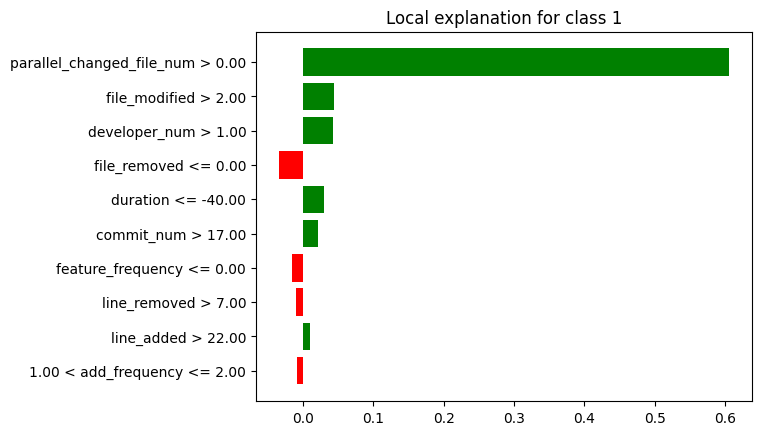

In [ ]:
lime_vn_min.plot()

In [ ]:
breakdown_vn_df_min = breakdown_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_min = breakdown_vn_df_min.drop(index=[0, 26])
breakdown_vn_df_min['sign'] = breakdown_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_min = breakdown_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_min = shap_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_min = shap_vn_df_min.tail(25)
shap_vn_df_min['sign'] = shap_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_min = shap_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_min["Variable"] = lime_vn_df_min["variable"].str.split(" ").str[0]
lime_vn_df_min["Signo"] = lime_vn_df_min["effect"].apply(evaluar_valor)
lime_vn_df_min = lime_vn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_min = lime_vn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_min['Ranking'] = breakdown_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_min = breakdown_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_min['Ranking'] = shap_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_min = shap_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_min['Ranking'] = lime_vn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_min = lime_vn_df_min.head(5)
lime_vn_df_min = lime_vn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vn_df_min = breakdown_vn_df_min.drop(columns=['contribution'])
shap_vn_df_min = shap_vn_df_min.drop(columns=['contribution'])
lime_vn_df_min = lime_vn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_min = breakdown_vn_df_min.head(5)
breakdown_vn_df_min = breakdown_vn_df_min.reset_index(drop=True)

shap_vn_df_min = shap_vn_df_min.head(5)
shap_vn_df_min = shap_vn_df_min.reset_index(drop=True)

lime_vn_df_min = lime_vn_df_min.reset_index(drop=True)

print(breakdown_vn_df_min)
print(shap_vn_df_min)
print(lime_vn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              messages_mean        2  Negativo
2                 commit_num        3  Positivo
3               line_removed        4  Negativo
4           remove_frequency        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               line_removed        3  Negativo
3           remove_frequency        4  Negativo
4              developer_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              file_modified        2  Positivo
2              developer_num        3  Positivo
3               file_removed        4  Negativo
4                   duration        5  Positivo


In [ ]:
#lime_vn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_min['Variable'])
shapley_features = list(shap_vn_df_min['Variable'])
lime_features = list(lime_vn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_min[breakdown_vn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_min[shap_vn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_min[lime_vn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'messages_mean', 'commit_num', 'line_removed', 'remove_frequency']
['parallel_changed_file_num', 'commit_num', 'line_removed', 'remove_frequency', 'developer_num']
['parallel_changed_file_num', 'file_modified', 'developer_num', 'file_removed', 'duration']
['file_removed', 'line_removed', 'messages_mean', 'developer_num', 'commit_num', 'duration', 'parallel_changed_file_num', 'remove_frequency', 'file_modified']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       4   
1               line_removed         4  Negativo       3  Negativo       -   
2              messages_mean         2  Negativo       -         -       -   
3              developer_num         -         -       5  Positivo       3   
4                 commit_num         3  Positivo       2  Positivo       -   
5                   duration         -         -       -         -       5   
6  parallel_changed_file_num         1  Positivo       1  Positivo       1   
7           remove_frequency         5  Negativo       4  Negativo       -   
8              file_modified         -         -       -         -       2   

             
      Signo  
0  Negativo  
1         -  
2         -  
3  Positivo  
4         -  
5  Positivo  
6  Positivo  
7         -  
8  Positivo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "messages_mean", "commit_num", "line_removed", "remove_frequency", "developer_num", "file_modified", "file_removed", "duration"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
messages_mean                     2  Negativo       -         -       -   
commit_num                        3  Positivo       2  Positivo       -   
line_removed                      4  Negativo       3  Negativo       -   
remove_frequency                  5  Negativo       4  Negativo       -   
developer_num                     -         -       5  Positivo       3   
file_modified                     -         -       -         -       2   
file_removed                      -         -       -         -       4   
duration                          -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
messages_mean                     -  
commit_num                        -  
line_removed                      -  
remove_frequency                  -  
developer_num              Positivo  
file_modified              Positivo  
file_removed               Negativo  
duration                   Positivo

### **VN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('line_added', 3), ('file_modified', 4), ('duration', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('duration', 4), ('file_modified', 5), ('parallel_changed_file_num', 1), ('messages_mean', 2), ('commit_num', 3), ('line_removed', 4), ('remove_frequency', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 2), ('file_modified', 3), ('duration', 5), ('developer_num', 4), ('parallel_changed_file_num', 1), ('developer_num', 5), ('file_modified', 2), ('line_removed', 3), ('update_frequency', 4), ('parallel_changed_file_num', 1), ('commit_num', 2), ('line_removed', 3), ('remove_frequency', 4), ('developer_num', 5)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 4), ('developer_num', 5), ('line_removed', 2), ('file_removed', 3), ('parallel_changed_file_num', 1), ('commit_num', 3), ('file_modified', 5), ('file_removed', 2), ('feature_frequency', 4), ('parallel_changed

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_brf_vn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_brf_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_modified                       4.5      2           2.5      2   
feature_frequency                     -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
remove_frequency                    5.0      1           4.0      1   
file_removed                          -      -             -      -   
duration                            4.5      2           5.0      1   
commit_num                     2.333333      3           2.0      2   
developer_num                       3.0      1      4.666667      3   
line_added                          3.0      1             -      -   
messages_mean                       2.0      1             -      -   
line_removed                        4.0      1           3.0      2   
update_frequency                      -      -           4.0      1   

                                   Lime         
                          Ranking Medio Conteo  
file_modified                       3.5      2  
feature_frequency                   4.0      1  
parallel_changed_file_num           1.0      3  
remove_frequency                      -      -  
file_removed                        3.0      3  
duration                            5.0      1  
commit_num                          3.5      2  
developer_num                       4.0      2  
line_added                            -      -  
messages_mean                         -      -  
line_removed                        2.0      1  
update_frequency                      -      -

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_brf_vn[("General", "Ranking")] = df_resumen_brf_vn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_brf_vn[("General", "Conteo Total")] = df_resumen_brf_vn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_brf_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_modified                       4.5      2           2.5      2   
feature_frequency                     -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
remove_frequency                    5.0      1           4.0      1   
file_removed                          -      -             -      -   
duration                            4.5      2           5.0      1   
commit_num                     2.333333      3           2.0      2   
developer_num                       3.0      1      4.666667      3   
line_added                          3.0      1             -      -   
messages_mean                       2.0      1             -      -   
line_removed                        4.0      1           3.0      2   
update_frequency                      -      -           4.0      1   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
file_modified                       3.5      2  3.500000            6  
feature_frequency                   4.0      1  4.000000            1  
parallel_changed_file_num           1.0      3  1.000000            9  
remove_frequency                      -      -  4.500000            2  
file_removed                        3.0      3  3.000000            3  
duration                            5.0      1  4.833333            4  
commit_num                          3.5      2  2.611111            7  
developer_num                       4.0      2  3.888889            6  
line_added                            -      -  3.000000            1  
messages_mean                         -      -  2.000000            1  
line_removed                        2.0      1  3.000000            4  
update_frequency                      -      -  4.000000            1

In [ ]:
# Obtener el número de características
num_caract = df_resumen_brf_vn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_brf_vn[("General", "Peso Rango")] = 1 - ((df_resumen_brf_vn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_brf_vn[("General", "Peso Conteo")] = df_resumen_brf_vn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_brf_vn[("General", "Puntaje")] = df_resumen_brf_vn[("General", "Peso Rango")] + df_resumen_brf_vn[("General", "Peso Conteo")]
df_resumen_brf_vn[("General", "Ranking")] = df_resumen_brf_vn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_brf_vn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_brf_vn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_brf_vn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_brf_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_modified                       4.5      2           2.5      2   
feature_frequency                     -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
remove_frequency                    5.0      1           4.0      1   
file_removed                          -      -             -      -   
duration                            4.5      2           5.0      1   
commit_num                     2.333333      3           2.0      2   
developer_num                       3.0      1      4.666667      3   
line_added                          3.0      1             -      -   
messages_mean                       2.0      1             -      -   
line_removed                        4.0      1           3.0      2   
update_frequency                      -      -           4.0      1   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
file_modified                       3.5      2     4.0            6  
feature_frequency                   4.0      1    11.0            1  
parallel_changed_file_num           1.0      3     1.0            9  
remove_frequency                      -      -    10.0            2  
file_removed                        3.0      3     6.0            3  
duration                            5.0      1     9.0            4  
commit_num                          3.5      2     2.0            7  
developer_num                       4.0      2     5.0            6  
line_added                            -      -     8.0            1  
messages_mean                         -      -     7.0            1  
line_removed                        2.0      1     3.0            4  
update_frequency                      -      -    11.0            1

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_brf_vn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_brf_vn = df_resumen_brf_vn[new_columns]

In [ ]:
df_resumen_brf_vn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_brf_vn[(tech, "Ranking Medio")] = df_resumen_brf_vn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_brf_vn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
commit_num                    2.0            7          2.33      3   
line_removed                  3.0            4          4.00      1   
file_modified                 4.0            6          4.50      2   
developer_num                 5.0            6          3.00      1   
file_removed                  6.0            3             -      -   
messages_mean                 7.0            1          2.00      1   
line_added                    8.0            1          3.00      1   
duration                      9.0            4          4.50      2   
remove_frequency             10.0            2          5.00      1   
feature_frequency            11.0            1             -      -   
update_frequency             11.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         2.00      2          3.50      2  
line_removed                       3.00      2          2.00      1  
file_modified                      2.50      2          3.50      2  
developer_num                      4.67      3          4.00      2  
file_removed                          -      -          3.00      3  
messages_mean                         -      -             -      -  
line_added                            -      -             -      -  
duration                           5.00      1          5.00      1  
remove_frequency                   4.00      1             -      -  
feature_frequency                     -      -          4.00      1  
update_frequency                   4.00      1             -      -

### **Instancia FP MAX:**

In [ ]:
breakdown_fp_max = exp.predict_parts(df_instancia_fp_max, type="break_down",random_state=42)
shap_fp_max = exp.predict_parts(df_instancia_fp_max, type="shap",random_state=42)
lime_fp_max = exp.predict_surrogate(df_instancia_fp_max, random_state=42)

breakdown_fp_df_max = breakdown_fp_max.result
shap_fp_df_max = shap_fp_max.result
lime_fp_df_max=lime_fp_max.result

In [ ]:
breakdown_fp_max.plot()

In [ ]:
shap_fp_max.plot()

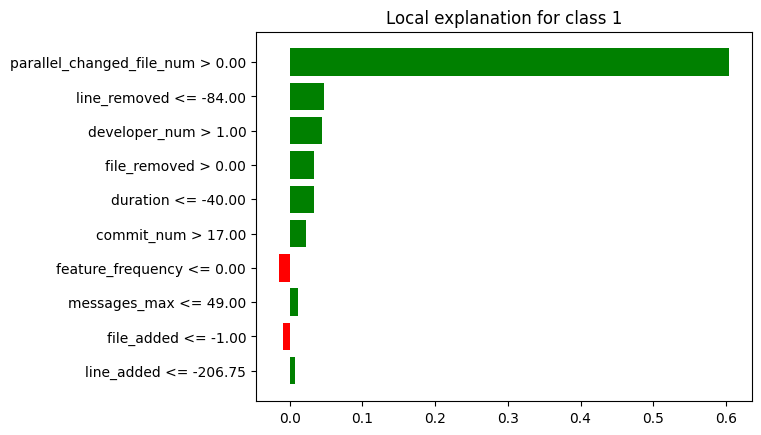

In [ ]:
lime_fp_max.plot()

In [ ]:
breakdown_fp_df_max = breakdown_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_max = breakdown_fp_df_max.drop(index=[0, 26])
breakdown_fp_df_max['sign'] = breakdown_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_max = breakdown_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_max = shap_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_max = shap_fp_df_max.tail(25)
shap_fp_df_max['sign'] = shap_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_max = shap_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_max["Variable"] = lime_fp_df_max["variable"].str.split(" ").str[0]
lime_fp_df_max["Signo"] = lime_fp_df_max["effect"].apply(evaluar_valor)
lime_fp_df_max = lime_fp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_max = lime_fp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_max['Ranking'] = breakdown_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_max = breakdown_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_max['Ranking'] = shap_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_max = shap_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_max['Ranking'] = lime_fp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_max = lime_fp_df_max.head(5)
lime_fp_df_max = lime_fp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fp_df_max = breakdown_fp_df_max.drop(columns=['contribution'])
shap_fp_df_max = shap_fp_df_max.drop(columns=['contribution'])
lime_fp_df_max = lime_fp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_max = breakdown_fp_df_max.head(5)
breakdown_fp_df_max = breakdown_fp_df_max.reset_index(drop=True)

shap_fp_df_max = shap_fp_df_max.head(5)
shap_fp_df_max = shap_fp_df_max.reset_index(drop=True)

lime_fp_df_max = lime_fp_df_max.reset_index(drop=True)

print(breakdown_fp_df_max)
print(shap_fp_df_max)
print(lime_fp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               line_removed        3  Negativo
3                 line_added        4  Positivo
4               file_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               line_removed        2  Positivo
2                 line_added        3  Positivo
3                 commit_num        4  Positivo
4                   duration        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               line_removed        2  Positivo
2              developer_num        3  Positivo
3               file_removed        4  Positivo
4                   duration        5  Positivo


In [ ]:
#lime_fp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_max['Variable'])
shapley_features = list(shap_fp_df_max['Variable'])
lime_features = list(lime_fp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_max[breakdown_fp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_max[shap_fp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_max[lime_fp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'line_removed', 'line_added', 'file_removed']
['parallel_changed_file_num', 'line_removed', 'line_added', 'commit_num', 'duration']
['parallel_changed_file_num', 'line_removed', 'developer_num', 'file_removed', 'duration']
['file_removed', 'line_removed', 'line_added', 'developer_num', 'commit_num', 'duration', 'parallel_changed_file_num']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         5  Positivo       -         -       4   
1               line_removed         3  Negativo       2  Positivo       2   
2                 line_added         4  Positivo       3  Positivo       -   
3              developer_num         -         -       -         -       3   
4                 commit_num         2  Positivo       4  Positivo       -   
5                   duration         -         -       5  Positivo       5   
6  parallel_changed_file_num         1  Positivo       1  Positivo       1   

             
      Signo  
0  Positivo  
1  Positivo  
2         -  
3  Positivo  
4         -  
5  Positivo  
6  Positivo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "line_removed", "line_added", "file_removed", "duration", "developer_num"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       4  Positivo       -   
line_removed                      3  Negativo       2  Positivo       2   
line_added                        4  Positivo       3  Positivo       -   
file_removed                      5  Positivo       -         -       4   
duration                          -         -       5  Positivo       5   
developer_num                     -         -       -         -       3   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                        -  
line_removed               Positivo  
line_added                        -  
file_removed               Positivo  
duration                   Positivo  
developer_num              Positivo

### **Instancia FP MEDIANA:**

In [ ]:
breakdown_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="break_down",random_state=42)
shap_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="shap",random_state=42)
lime_fp_mediana = exp.predict_surrogate(df_instancia_fp_mediana, random_state=42)

breakdown_fp_df_mediana = breakdown_fp_mediana.result
shap_fp_df_mediana = shap_fp_mediana.result
lime_fp_df_mediana=lime_fp_mediana.result

In [ ]:
breakdown_fp_mediana.plot()

In [ ]:
shap_fp_mediana.plot()

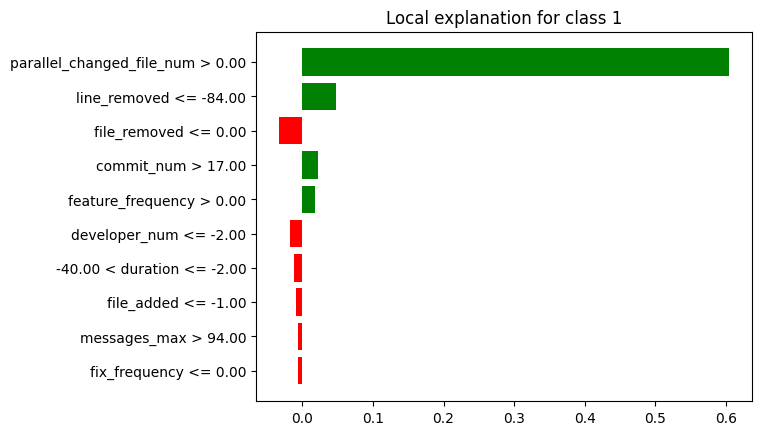

In [ ]:
lime_fp_mediana.plot()

In [ ]:
breakdown_fp_df_mediana = breakdown_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(index=[0, 26])
breakdown_fp_df_mediana['sign'] = breakdown_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_mediana = breakdown_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_mediana = shap_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_mediana = shap_fp_df_mediana.tail(25)
shap_fp_df_mediana['sign'] = shap_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_mediana = shap_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_mediana["Variable"] = lime_fp_df_mediana["variable"].str.split(" ").str[0]
lime_fp_df_mediana["Signo"] = lime_fp_df_mediana["effect"].apply(evaluar_valor)
lime_fp_df_mediana = lime_fp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_mediana['Ranking'] = breakdown_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_mediana = breakdown_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_mediana['Ranking'] = shap_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_mediana = shap_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_mediana['Ranking'] = lime_fp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_mediana = lime_fp_df_mediana.head(5)
lime_fp_df_mediana = lime_fp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(columns=['contribution'])
shap_fp_df_mediana = shap_fp_df_mediana.drop(columns=['contribution'])
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_mediana = breakdown_fp_df_mediana.head(5)
breakdown_fp_df_mediana = breakdown_fp_df_mediana.reset_index(drop=True)

shap_fp_df_mediana = shap_fp_df_mediana.head(5)
shap_fp_df_mediana = shap_fp_df_mediana.reset_index(drop=True)

lime_fp_df_mediana = lime_fp_df_mediana.reset_index(drop=True)

print(breakdown_fp_df_mediana)
print(shap_fp_df_mediana)
print(lime_fp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               file_removed        3  Positivo
3                 file_added        4  Positivo
4                 line_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2                 file_added        3  Positivo
3               line_removed        4  Positivo
4               file_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               line_removed        2  Positivo
2               file_removed        3  Negativo
3                 commit_num        4  Positivo
4          feature_frequency        5  Positivo


In [ ]:
#lime_fp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_mediana['Variable'])
shapley_features = list(shap_fp_df_mediana['Variable'])
lime_features = list(lime_fp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_mediana[breakdown_fp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_mediana[shap_fp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_mediana[lime_fp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'commit_num', 'file_removed', 'file_added', 'line_added']
['parallel_changed_file_num', 'commit_num', 'file_added', 'line_removed', 'file_removed']
['parallel_changed_file_num', 'line_removed', 'file_removed', 'commit_num', 'feature_frequency']
['file_removed', 'file_added', 'line_removed', 'line_added', 'commit_num', 'parallel_changed_file_num', 'feature_frequency']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         3  Positivo       5  Positivo       3   
1                 file_added         4  Positivo       3  Positivo       -   
2               line_removed         -         -       4  Positivo       2   
3                 line_added         5  Negativo       -         -       -   
4                 commit_num         2  Positivo       2  Positivo       4   
5  parallel_changed_file_num         1  Positivo       1  Positivo       1   
6          feature_frequency         -         -       -         -       5   

             
      Signo  
0  Negativo  
1         -  
2  Positivo  
3         -  
4  Positivo  
5  Positivo  
6  Positivo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "file_removed", "file_added", "line_added", "line_removed", "feature_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       4   
file_removed                      3  Positivo       5  Positivo       3   
file_added                        4  Positivo       3  Positivo       -   
line_added                        5  Negativo       -         -       -   
line_removed                      -         -       4  Positivo       2   
feature_frequency                 -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
file_removed               Negativo  
file_added                        -  
line_added                        -  
line_removed               Positivo  
feature_frequency          Positivo

### **Instancia FP MIN:**

In [ ]:
breakdown_fp_min = exp.predict_parts(df_instancia_fp_min, type="break_down",random_state=42)
shap_fp_min = exp.predict_parts(df_instancia_fp_min, type="shap",random_state=42)
lime_fp_min = exp.predict_surrogate(df_instancia_fp_min, random_state=42)

breakdown_fp_df_min = breakdown_fp_min.result
shap_fp_df_min = shap_fp_min.result
lime_fp_df_min = lime_fp_min.result

In [ ]:
breakdown_fp_min.plot()

In [ ]:
shap_fp_min.plot()

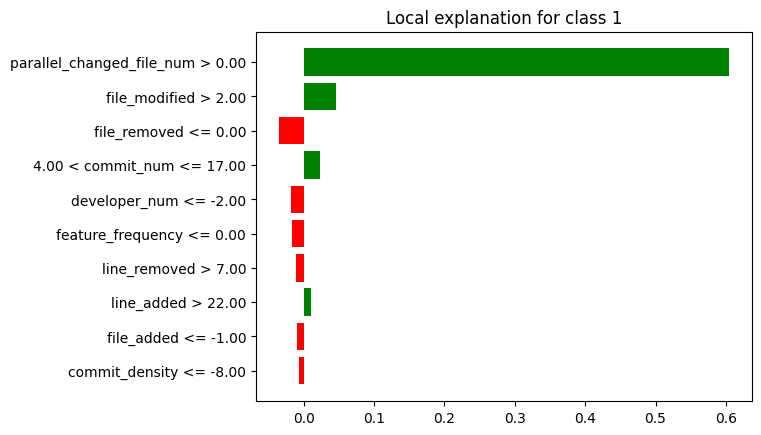

In [ ]:
lime_fp_min.plot()

In [ ]:
breakdown_fp_df_min = breakdown_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_min = breakdown_fp_df_min.drop(index=[0, 26])
breakdown_fp_df_min['sign'] = breakdown_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_min = breakdown_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_min = shap_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_min = shap_fp_df_min.tail(25)
shap_fp_df_min['sign'] = shap_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_min = shap_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_min["Variable"] = lime_fp_df_min["variable"].str.split(" ").str[0]
lime_fp_df_min["Signo"] = lime_fp_df_min["effect"].apply(evaluar_valor)
lime_fp_df_min = lime_fp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_min = lime_fp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_min['Ranking'] = breakdown_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_min = breakdown_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_min['Ranking'] = shap_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_min = shap_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_min['Ranking'] = lime_fp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_min = lime_fp_df_min.head(5)
lime_fp_df_min = lime_fp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fp_df_min = breakdown_fp_df_min.drop(columns=['contribution'])
shap_fp_df_min = shap_fp_df_min.drop(columns=['contribution'])
lime_fp_df_min = lime_fp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_min = breakdown_fp_df_min.head(5)
breakdown_fp_df_min = breakdown_fp_df_min.reset_index(drop=True)

shap_fp_df_min = shap_fp_df_min.head(5)
shap_fp_df_min = shap_fp_df_min.reset_index(drop=True)

lime_fp_df_min = lime_fp_df_min.reset_index(drop=True)
lime_fp_df_min.at[3, 'Variable'] = 'commit_num'

print(breakdown_fp_df_min)
print(shap_fp_df_min)
print(lime_fp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               line_removed        2  Negativo
2                 commit_num        3  Positivo
3              developer_num        4  Negativo
4             commit_density        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               line_removed        2  Negativo
2                 file_added        3  Negativo
3             commit_density        4  Negativo
4                 commit_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              file_modified        2  Positivo
2               file_removed        3  Negativo
3                 commit_num        4  Positivo
4              developer_num        5  Negativo


In [ ]:
#lime_fp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_min['Variable'])
shapley_features = list(shap_fp_df_min['Variable'])
lime_features = list(lime_fp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_min[breakdown_fp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_min[shap_fp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_min[lime_fp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'line_removed', 'commit_num', 'developer_num', 'commit_density']
['parallel_changed_file_num', 'line_removed', 'file_added', 'commit_density', 'commit_num']
['parallel_changed_file_num', 'file_modified', 'file_removed', 'commit_num', 'developer_num']
['commit_density', 'file_added', 'line_removed', 'developer_num', 'commit_num', 'file_removed', 'parallel_changed_file_num', 'file_modified']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0             commit_density         5  Negativo       4  Negativo       -   
1                 file_added         -         -       3  Negativo       -   
2               line_removed         2  Negativo       2  Negativo       -   
3              developer_num         4  Negativo       -         -       5   
4                 commit_num         3  Positivo       5  Positivo       4   
5               file_removed         -         -       -         -       3   
6  parallel_changed_file_num         1  Positivo       1  Positivo       1   
7              file_modified         -         -       -         -       2   

             
      Signo  
0         -  
1         -  
2         -  
3  Negativo  
4  Positivo  
5  Negativo  
6  Positivo  
7  Positivo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "line_removed", "commit_num", "developer_num", "commit_density", "file_added", "file_modified", "file_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
line_removed                      2  Negativo       2  Negativo       -   
commit_num                        3  Positivo       5  Positivo       4   
developer_num                     4  Negativo       -         -       5   
commit_density                    5  Negativo       4  Negativo       -   
file_added                        -         -       3  Negativo       -   
file_modified                     -         -       -         -       2   
file_removed                      -         -       -         -       3   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
line_removed                      -  
commit_num                 Positivo  
developer_num              Negativo  
commit_density                    -  
file_added                        -  
file_modified              Positivo  
file_removed               Negativo

### **FP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('line_removed', 3), ('line_added', 4), ('file_removed', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('file_removed', 3), ('file_added', 4), ('line_added', 5), ('parallel_changed_file_num', 1), ('line_removed', 2), ('commit_num', 3), ('developer_num', 4), ('commit_density', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 4), ('line_removed', 2), ('line_added', 3), ('duration', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('file_removed', 5), ('file_added', 3), ('line_removed', 4), ('parallel_changed_file_num', 1), ('line_removed', 2), ('commit_num', 5), ('commit_density', 4), ('file_added', 3)], 'Lime': [('parallel_changed_file_num', 1), ('line_removed', 2), ('file_removed', 4), ('duration', 5), ('developer_num', 3), ('parallel_changed_file_num', 1), ('commit_num', 4), ('file_removed', 3), ('line_removed', 2), ('feature_frequency', 5), ('parallel_changed_file_num', 1), ('commi

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_brf_fp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_brf_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_modified                         -      -             -      -   
feature_frequency                     -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
duration                              -      -           5.0      1   
commit_num                     2.333333      3      3.666667      3   
developer_num                       4.0      1             -      -   
commit_density                      5.0      1           4.0      1   
line_added                          4.5      2           3.0      1   
line_removed                        2.5      2      2.666667      3   
file_added                          4.0      1           3.0      2   
file_removed                        4.0      2           5.0      1   

                                   Lime         
                          Ranking Medio Conteo  
file_modified                       2.0      1  
feature_frequency                   5.0      1  
parallel_changed_file_num           1.0      3  
duration                            5.0      1  
commit_num                          4.0      2  
developer_num                       4.0      2  
commit_density                        -      -  
line_added                            -      -  
line_removed                        2.0      2  
file_added                            -      -  
file_removed                   3.333333      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_brf_fp[("General", "Ranking")] = df_resumen_brf_fp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_brf_fp[("General", "Conteo Total")] = df_resumen_brf_fp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_brf_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_modified                         -      -             -      -   
feature_frequency                     -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
duration                              -      -           5.0      1   
commit_num                     2.333333      3      3.666667      3   
developer_num                       4.0      1             -      -   
commit_density                      5.0      1           4.0      1   
line_added                          4.5      2           3.0      1   
line_removed                        2.5      2      2.666667      3   
file_added                          4.0      1           3.0      2   
file_removed                        4.0      2           5.0      1   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
file_modified                       2.0      1  2.000000            1  
feature_frequency                   5.0      1  5.000000            1  
parallel_changed_file_num           1.0      3  1.000000            9  
duration                            5.0      1  5.000000            2  
commit_num                          4.0      2  3.333333            8  
developer_num                       4.0      2  4.000000            3  
commit_density                        -      -  4.500000            2  
line_added                            -      -  3.750000            3  
line_removed                        2.0      2  2.388889            7  
file_added                            -      -  3.500000            3  
file_removed                   3.333333      3  4.111111            6

In [ ]:
# Obtener el número de características
num_caract = df_resumen_brf_fp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_brf_fp[("General", "Peso Rango")] = 1 - ((df_resumen_brf_fp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_brf_fp[("General", "Peso Conteo")] = df_resumen_brf_fp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_brf_fp[("General", "Puntaje")] = df_resumen_brf_fp[("General", "Peso Rango")] + df_resumen_brf_fp[("General", "Peso Conteo")]
df_resumen_brf_fp[("General", "Ranking")] = df_resumen_brf_fp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_brf_fp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_brf_fp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_brf_fp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_brf_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_modified                         -      -             -      -   
feature_frequency                     -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
duration                              -      -           5.0      1   
commit_num                     2.333333      3      3.666667      3   
developer_num                       4.0      1             -      -   
commit_density                      5.0      1           4.0      1   
line_added                          4.5      2           3.0      1   
line_removed                        2.5      2      2.666667      3   
file_added                          4.0      1           3.0      2   
file_removed                        4.0      2           5.0      1   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
file_modified                       2.0      1     7.0            1  
feature_frequency                   5.0      1    11.0            1  
parallel_changed_file_num           1.0      3     1.0            9  
duration                            5.0      1    10.0            2  
commit_num                          4.0      2     2.0            8  
developer_num                       4.0      2     8.0            3  
commit_density                        -      -     9.0            2  
line_added                            -      -     5.0            3  
line_removed                        2.0      2     2.0            7  
file_added                            -      -     4.0            3  
file_removed                   3.333333      3     5.0            6

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_brf_fp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_brf_fp = df_resumen_brf_fp[new_columns]

In [ ]:
df_resumen_brf_fp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_brf_fp[(tech, "Ranking Medio")] = df_resumen_brf_fp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_brf_fp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
commit_num                    2.0            8          2.33      3   
line_removed                  2.0            7          2.50      2   
file_added                    4.0            3          4.00      1   
line_added                    5.0            3          4.50      2   
file_removed                  5.0            6          4.00      2   
file_modified                 7.0            1             -      -   
developer_num                 8.0            3          4.00      1   
commit_density                9.0            2          5.00      1   
duration                     10.0            2             -      -   
feature_frequency            11.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         3.67      3          4.00      2  
line_removed                       2.67      3          2.00      2  
file_added                         3.00      2             -      -  
line_added                         3.00      1             -      -  
file_removed                       5.00      1          3.33      3  
file_modified                         -      -          2.00      1  
developer_num                         -      -          4.00      2  
commit_density                     4.00      1             -      -  
duration                           5.00      1          5.00      1  
feature_frequency                     -      -          5.00      1

### **Instancia FN MAX:**

In [ ]:
breakdown_fn_max = exp.predict_parts(df_instancia_fn_max, type="break_down",random_state=42)
shap_fn_max = exp.predict_parts(df_instancia_fn_max, type="shap",random_state=42)
lime_fn_max = exp.predict_surrogate(df_instancia_fn_max, random_state=42)

breakdown_fn_df_max = breakdown_fn_max.result
shap_fn_df_max = shap_fn_max.result
lime_fn_df_max=lime_fn_max.result

In [ ]:
breakdown_fn_max.plot()

In [ ]:
shap_fn_max.plot()

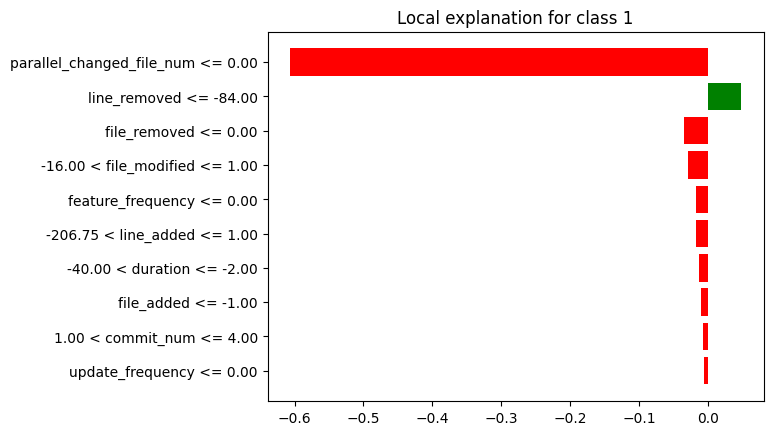

In [ ]:
lime_fn_max.plot()

In [ ]:
breakdown_fn_df_max = breakdown_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_max = breakdown_fn_df_max.drop(index=[0, 26])
breakdown_fn_df_max['sign'] = breakdown_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_max = breakdown_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_max = shap_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_max = shap_fn_df_max.tail(25)
shap_fn_df_max['sign'] = shap_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_max = shap_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_max["Variable"] = lime_fn_df_max["variable"].str.split(" ").str[0]
lime_fn_df_max["Signo"] = lime_fn_df_max["effect"].apply(evaluar_valor)
lime_fn_df_max = lime_fn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_max = lime_fn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_max['Ranking'] = breakdown_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_max = breakdown_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_max['Ranking'] = shap_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_max = shap_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_max['Ranking'] = lime_fn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_max = lime_fn_df_max.head(5)
lime_fn_df_max = lime_fn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fn_df_max = breakdown_fn_df_max.drop(columns=['contribution'])
shap_fn_df_max = shap_fn_df_max.drop(columns=['contribution'])
lime_fn_df_max = lime_fn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_max = breakdown_fn_df_max.head(5)
breakdown_fn_df_max = breakdown_fn_df_max.reset_index(drop=True)

shap_fn_df_max = shap_fn_df_max.head(5)
shap_fn_df_max = shap_fn_df_max.reset_index(drop=True)

lime_fn_df_max = lime_fn_df_max.reset_index(drop=True)
lime_fn_df_max.at[3, 'Variable'] = 'file_modified'

print(breakdown_fn_df_max)
print(shap_fn_df_max)
print(lime_fn_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3               messages_max        4  Negativo
4               file_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               messages_max        2  Negativo
2                   duration        3  Negativo
3              file_modified        4  Negativo
4               file_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               line_removed        2  Positivo
2               file_removed        3  Negativo
3              file_modified        4  Negativo
4          feature_frequency        5  Negativo


In [ ]:
#lime_fn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_max['Variable'])
shapley_features = list(shap_fn_df_max['Variable'])
lime_features = list(lime_fn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_max[breakdown_fn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_max[shap_fn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_max[lime_fn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'developer_num', 'messages_max', 'file_removed']
['parallel_changed_file_num', 'messages_max', 'duration', 'file_modified', 'file_removed']
['parallel_changed_file_num', 'line_removed', 'file_removed', 'file_modified', 'feature_frequency']
['file_removed', 'line_removed', 'developer_num', 'commit_num', 'duration', 'messages_max', 'parallel_changed_file_num', 'feature_frequency', 'file_modified']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         5  Positivo       5  Positivo       3   
1               line_removed         -         -       -         -       2   
2              developer_num         3  Positivo       -         -       -   
3                 commit_num         2  Negativo       -         -       -   
4                   duration         -         -       3  Negativo       -   
5               messages_max         4  Negativo       2  Negativo       -   
6  parallel_changed_file_num         1  Negativo       1  Negativo       1   
7          feature_frequency         -         -       -         -       5   
8              file_modified         -         -       4  Negativo       4   

             
      Signo  
0  Negativo  
1  Positivo  
2         -  
3         -  
4         -  
5         -  
6  Negativo  
7  Negativo  
8  Negativo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "messages_max", "file_removed", "duration", "file_modified", "line_removed", "feature_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
commit_num                        2  Negativo       -         -       -   
developer_num                     3  Positivo       -         -       -   
messages_max                      4  Negativo       2  Negativo       -   
file_removed                      5  Positivo       5  Positivo       3   
duration                          -         -       3  Negativo       -   
file_modified                     -         -       4  Negativo       4   
line_removed                      -         -       -         -       2   
feature_frequency                 -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
commit_num                        -  
developer_num                     -  
messages_max                      -  
file_removed               Negativo  
duration                          -  
file_modified              Negativo  
line_removed               Positivo  
feature_frequency          Negativo

### **Instancia FN MEDIANA:**

In [ ]:
breakdown_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="break_down",random_state=42)
shap_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="shap",random_state=42)
lime_fn_mediana = exp.predict_surrogate(df_instancia_fn_mediana, random_state=42)

breakdown_fn_df_mediana = breakdown_fn_mediana.result
shap_fn_df_mediana = shap_fn_mediana.result
lime_fn_df_mediana=lime_fn_mediana.result

In [ ]:
breakdown_fn_mediana.plot()

In [ ]:
shap_fn_mediana.plot()

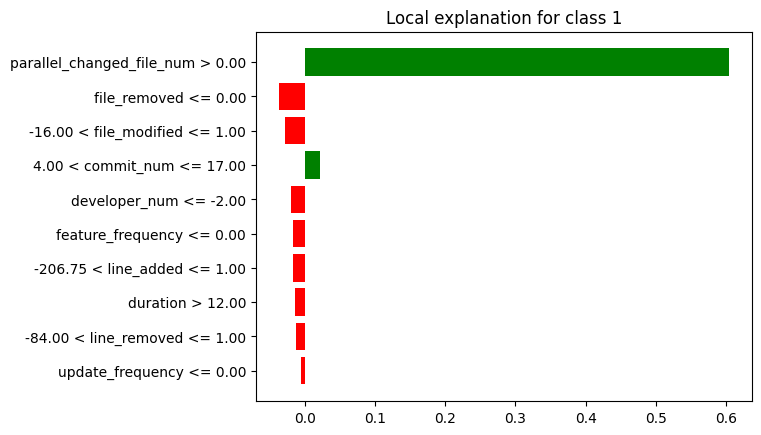

In [ ]:
lime_fn_mediana.plot()

In [ ]:
breakdown_fn_df_mediana = breakdown_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(index=[0, 26])
breakdown_fn_df_mediana['sign'] = breakdown_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_mediana = breakdown_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_mediana = shap_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_mediana = shap_fn_df_mediana.tail(25)
shap_fn_df_mediana['sign'] = shap_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_mediana = shap_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_mediana["Variable"] = lime_fn_df_mediana["variable"].str.split(" ").str[0]
lime_fn_df_mediana["Signo"] = lime_fn_df_mediana["effect"].apply(evaluar_valor)
lime_fn_df_mediana = lime_fn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_mediana['Ranking'] = breakdown_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_mediana = breakdown_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_mediana['Ranking'] = shap_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_mediana = shap_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_mediana['Ranking'] = lime_fn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_mediana = lime_fn_df_mediana.head(5)
lime_fn_df_mediana = lime_fn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(columns=['contribution'])
shap_fn_df_mediana = shap_fn_df_mediana.drop(columns=['contribution'])
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_mediana = breakdown_fn_df_mediana.head(5)
breakdown_fn_df_mediana = breakdown_fn_df_mediana.reset_index(drop=True)

shap_fn_df_mediana = shap_fn_df_mediana.head(5)
shap_fn_df_mediana = shap_fn_df_mediana.reset_index(drop=True)

lime_fn_df_mediana = lime_fn_df_mediana.reset_index(drop=True)
lime_fn_df_mediana.at[2, 'Variable'] = 'file_modified'
lime_fn_df_mediana.at[3, 'Variable'] = 'commit_num'

print(breakdown_fn_df_mediana)
print(shap_fn_df_mediana)
print(lime_fn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                   duration        3  Negativo
3              file_modified        4  Negativo
4                 commit_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Positivo
3               line_removed        4  Negativo
4                   duration        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               file_removed        2  Negativo
2              file_modified        3  Negativo
3                 commit_num        4  Positivo
4              developer_num        5  Negativo


In [ ]:
#lime_fn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_mediana['Variable'])
shapley_features = list(shap_fn_df_mediana['Variable'])
lime_features = list(lime_fn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_mediana[breakdown_fn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_mediana[shap_fn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_mediana[lime_fn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'developer_num', 'duration', 'file_modified', 'commit_num']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'line_removed', 'duration']
['parallel_changed_file_num', 'file_removed', 'file_modified', 'commit_num', 'developer_num']
['file_removed', 'line_removed', 'developer_num', 'commit_num', 'duration', 'parallel_changed_file_num', 'file_modified']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       2   
1               line_removed         -         -       4  Negativo       -   
2              developer_num         2  Negativo       2  Negativo       5   
3                 commit_num         5  Positivo       3  Positivo       4   
4                   duration         3  Negativo       5  Negativo       -   
5  parallel_changed_file_num         1  Positivo       1  Positivo       1   
6              file_modified         4  Negativo       -         -       3   

             
      Signo  
0  Negativo  
1         -  
2  Negativo  
3  Positivo  
4         -  
5  Positivo  
6  Negativo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "duration", "file_modified", "commit_num", "line_removed", "file_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Negativo       2  Negativo       5   
duration                          3  Negativo       5  Negativo       -   
file_modified                     4  Negativo       -         -       3   
commit_num                        5  Positivo       3  Positivo       4   
line_removed                      -         -       4  Negativo       -   
file_removed                      -         -       -         -       2   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Negativo  
duration                          -  
file_modified              Negativo  
commit_num                 Positivo  
line_removed                      -  
file_removed               Negativo

### **Instancia FN MIN:**

In [ ]:
breakdown_fn_min = exp.predict_parts(df_instancia_fn_min, type="break_down",random_state=42)
shap_fn_min = exp.predict_parts(df_instancia_fn_min, type="shap",random_state=42)
lime_fn_min = exp.predict_surrogate(df_instancia_fn_min, random_state=42)

breakdown_fn_df_min = breakdown_fn_min.result
shap_fn_df_min = shap_fn_min.result
lime_fn_df_min = lime_fn_min.result

In [ ]:
breakdown_fn_min.plot()

In [ ]:
shap_fn_min.plot()

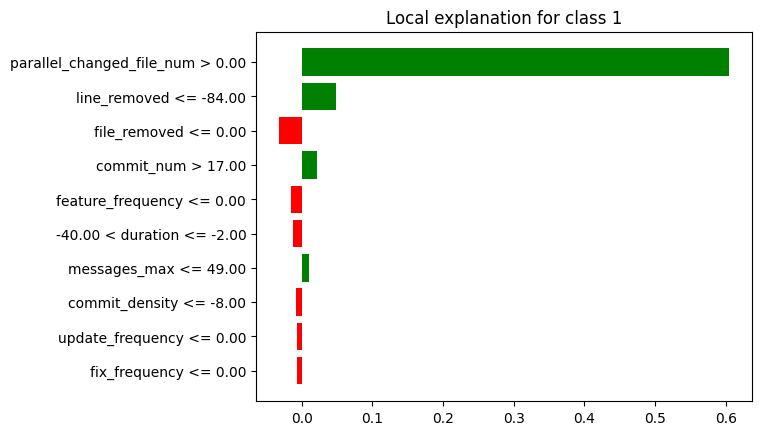

In [ ]:
lime_fn_min.plot()

In [ ]:
breakdown_fn_df_min = breakdown_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_min = breakdown_fn_df_min.drop(index=[0, 26])
breakdown_fn_df_min['sign'] = breakdown_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_min = breakdown_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_min = shap_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_min = shap_fn_df_min.tail(25)
shap_fn_df_min['sign'] = shap_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_min = shap_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_min["Variable"] = lime_fn_df_min["variable"].str.split(" ").str[0]
lime_fn_df_min["Signo"] = lime_fn_df_min["effect"].apply(evaluar_valor)
lime_fn_df_min = lime_fn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_min = lime_fn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_min['Ranking'] = breakdown_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_min = breakdown_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_min['Ranking'] = shap_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_min = shap_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_min['Ranking'] = lime_fn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_min = lime_fn_df_min.head(5)
lime_fn_df_min = lime_fn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fn_df_min = breakdown_fn_df_min.drop(columns=['contribution'])
shap_fn_df_min = shap_fn_df_min.drop(columns=['contribution'])
lime_fn_df_min = lime_fn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_min = breakdown_fn_df_min.head(5)
breakdown_fn_df_min = breakdown_fn_df_min.reset_index(drop=True)

shap_fn_df_min = shap_fn_df_min.head(5)
shap_fn_df_min = shap_fn_df_min.reset_index(drop=True)

lime_fn_df_min = lime_fn_df_min.reset_index(drop=True)

print(breakdown_fn_df_min)
print(shap_fn_df_min)
print(lime_fn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1             commit_density        2  Negativo
2              developer_num        3  Positivo
3                   duration        4  Positivo
4                 commit_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1             commit_density        2  Negativo
2              developer_num        3  Positivo
3                 commit_num        4  Negativo
4                   duration        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               line_removed        2  Positivo
2               file_removed        3  Negativo
3                 commit_num        4  Positivo
4          feature_frequency        5  Negativo


In [ ]:
#lime_fn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_min['Variable'])
shapley_features = list(shap_fn_df_min['Variable'])
lime_features = list(lime_fn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_min[breakdown_fn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_min[shap_fn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_min[lime_fn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'commit_density', 'developer_num', 'duration', 'commit_num']
['parallel_changed_file_num', 'commit_density', 'developer_num', 'commit_num', 'duration']
['parallel_changed_file_num', 'line_removed', 'file_removed', 'commit_num', 'feature_frequency']
['commit_density', 'line_removed', 'developer_num', 'commit_num', 'duration', 'file_removed', 'parallel_changed_file_num', 'feature_frequency']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0             commit_density         2  Negativo       2  Negativo       -   
1               line_removed         -         -       -         -       2   
2              developer_num         3  Positivo       3  Positivo       -   
3                 commit_num         5  Positivo       4  Negativo       4   
4                   duration         4  Positivo       5  Positivo       -   
5               file_removed         -         -       -         -       3   
6  parallel_changed_file_num         1  Positivo       1  Positivo       1   
7          feature_frequency         -         -       -         -       5   

             
      Signo  
0         -  
1  Positivo  
2         -  
3  Positivo  
4         -  
5  Negativo  
6  Positivo  
7  Negativo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_density", "developer_num", "duration", "commit_num", "line_removed", "file_removed", "feature_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_density                    2  Negativo       2  Negativo       -   
developer_num                     3  Positivo       3  Positivo       -   
duration                          4  Positivo       5  Positivo       -   
commit_num                        5  Positivo       4  Negativo       4   
line_removed                      -         -       -         -       2   
file_removed                      -         -       -         -       3   
feature_frequency                 -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_density                    -  
developer_num                     -  
duration                          -  
commit_num                 Positivo  
line_removed               Positivo  
file_removed               Negativo  
feature_frequency          Negativo

### **FN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('messages_max', 4), ('file_removed', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('duration', 3), ('file_modified', 4), ('commit_num', 5), ('parallel_changed_file_num', 1), ('commit_density', 2), ('developer_num', 3), ('duration', 4), ('commit_num', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('messages_max', 2), ('file_removed', 5), ('duration', 3), ('file_modified', 4), ('parallel_changed_file_num', 1), ('developer_num', 2), ('duration', 5), ('commit_num', 3), ('line_removed', 4), ('parallel_changed_file_num', 1), ('commit_density', 2), ('developer_num', 3), ('duration', 5), ('commit_num', 4)], 'Lime': [('parallel_changed_file_num', 1), ('file_removed', 3), ('file_modified', 4), ('line_removed', 2), ('feature_frequency', 5), ('parallel_changed_file_num', 1), ('developer_num', 5), ('file_modified', 3), ('commit_num', 4), ('file_removed', 2), ('parallel_changed_file_num', 1

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_brf_fn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_brf_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_modified                       4.0      1           4.0      1   
feature_frequency                     -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
messages_max                        4.0      1           2.0      1   
duration                            3.5      2      4.333333      3   
commit_num                          4.0      3           3.5      2   
developer_num                  2.666667      3           2.5      2   
commit_density                      2.0      1           2.0      1   
line_removed                          -      -           4.0      1   
file_removed                        5.0      1           5.0      1   

                                   Lime         
                          Ranking Medio Conteo  
file_modified                       3.5      2  
feature_frequency                   5.0      2  
parallel_changed_file_num           1.0      3  
messages_max                          -      -  
duration                              -      -  
commit_num                          4.0      2  
developer_num                       5.0      1  
commit_density                        -      -  
line_removed                        2.0      2  
file_removed                   2.666667      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_brf_fn[("General", "Ranking")] = df_resumen_brf_fn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_brf_fn[("General", "Conteo Total")] = df_resumen_brf_fn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_brf_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_modified                       4.0      1           4.0      1   
feature_frequency                     -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
messages_max                        4.0      1           2.0      1   
duration                            3.5      2      4.333333      3   
commit_num                          4.0      3           3.5      2   
developer_num                  2.666667      3           2.5      2   
commit_density                      2.0      1           2.0      1   
line_removed                          -      -           4.0      1   
file_removed                        5.0      1           5.0      1   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
file_modified                       3.5      2  3.833333            4  
feature_frequency                   5.0      2  5.000000            2  
parallel_changed_file_num           1.0      3  1.000000            9  
messages_max                          -      -  3.000000            2  
duration                              -      -  3.916667            5  
commit_num                          4.0      2  3.833333            7  
developer_num                       5.0      1  3.388889            6  
commit_density                        -      -  2.000000            2  
line_removed                        2.0      2  3.000000            3  
file_removed                   2.666667      3  4.222222            5

In [ ]:
# Obtener el número de características
num_caract = df_resumen_brf_fn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_brf_fn[("General", "Peso Rango")] = 1 - ((df_resumen_brf_fn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_brf_fn[("General", "Peso Conteo")] = df_resumen_brf_fn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_brf_fn[("General", "Puntaje")] = df_resumen_brf_fn[("General", "Peso Rango")] + df_resumen_brf_fn[("General", "Peso Conteo")]
df_resumen_brf_fn[("General", "Ranking")] = df_resumen_brf_fn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_brf_fn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_brf_fn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_brf_fn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_brf_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_modified                       4.0      1           4.0      1   
feature_frequency                     -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
messages_max                        4.0      1           2.0      1   
duration                            3.5      2      4.333333      3   
commit_num                          4.0      3           3.5      2   
developer_num                  2.666667      3           2.5      2   
commit_density                      2.0      1           2.0      1   
line_removed                          -      -           4.0      1   
file_removed                        5.0      1           5.0      1   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
file_modified                       3.5      2     7.0            4  
feature_frequency                   5.0      2    10.0            2  
parallel_changed_file_num           1.0      3     1.0            9  
messages_max                          -      -     7.0            2  
duration                              -      -     6.0            5  
commit_num                          4.0      2     3.0            7  
developer_num                       5.0      1     2.0            6  
commit_density                        -      -     5.0            2  
line_removed                        2.0      2     4.0            3  
file_removed                   2.666667      3     9.0            5

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_brf_fn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_brf_fn = df_resumen_brf_fn[new_columns]

In [ ]:
df_resumen_brf_fn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_brf_fn[(tech, "Ranking Medio")] = df_resumen_brf_fn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_brf_fn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
developer_num                 2.0            6          2.67      3   
commit_num                    3.0            7          4.00      3   
line_removed                  4.0            3             -      -   
commit_density                5.0            2          2.00      1   
duration                      6.0            5          3.50      2   
file_modified                 7.0            4          4.00      1   
messages_max                  7.0            2          4.00      1   
file_removed                  9.0            5          5.00      1   
feature_frequency            10.0            2             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
developer_num                      2.50      2          5.00      1  
commit_num                         3.50      2          4.00      2  
line_removed                       4.00      1          2.00      2  
commit_density                     2.00      1             -      -  
duration                           4.33      3             -      -  
file_modified                      4.00      1          3.50      2  
messages_max                       2.00      1             -      -  
file_removed                       5.00      1          2.67      3  
feature_frequency                     -      -          5.00      2

## **GradientBoosting:**

**FEATURE IMPORTANCE**

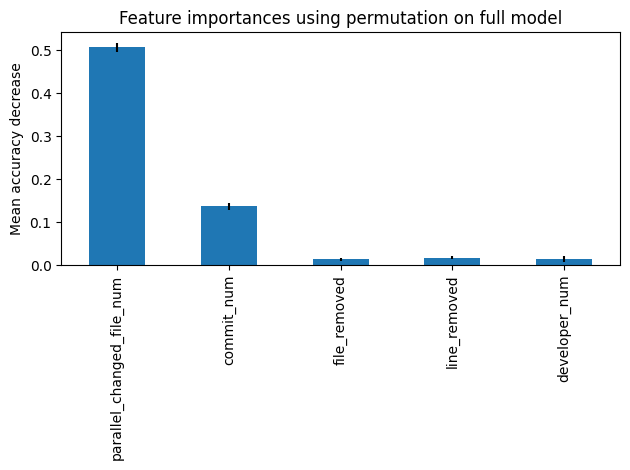

In [ ]:
permu = permutation_importance(modelo_gb, x_test, y_test, n_repeats=20, random_state=42, n_jobs=2, scoring='f1')

# Umbral para valores significativos
importance_threshold = 0.01

# Filtrar los caracteristicas
significant_indices = permu.importances_mean > importance_threshold
permu_importances = pd.Series(permu.importances_mean.round(3), index=feature_names)[significant_indices]
permu_std = permu.importances_std[significant_indices]

# Crear la representación gráfica
fig, ax = plt.subplots()
permu_importances.plot.bar(yerr=permu_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

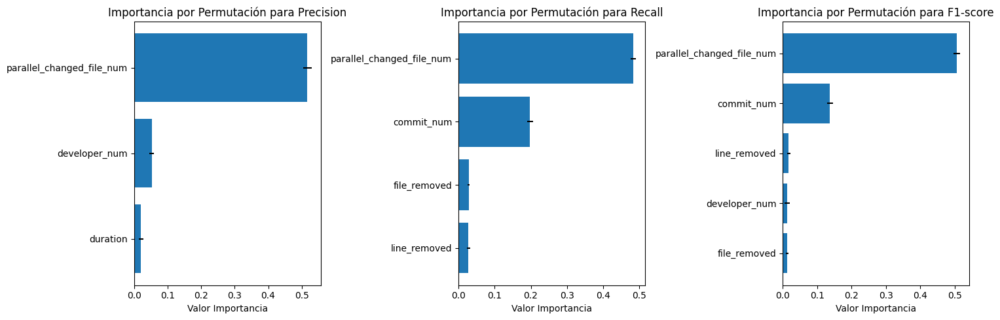

In [ ]:
scoring = ['precision', 'recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

permu_score = permutation_importance(modelo_gb, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Umbral para importancias significativas
importance_threshold = 0.01

# Itera a través de las métricas
for i, metric in enumerate(scoring):
    permu = permu_score[metric]

    # Filtra las características que cumplen la condición del umbral
    significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
    sorted_feature_names = [feature_names[j] for j in significant_indices]
    importances_mean = permu.importances_mean[significant_indices]
    importances_std = permu.importances_std[significant_indices]

    # Ordena los datos por importancia de mayor a menor
    sorted_indices = np.argsort(importances_mean)[::1]
    sorted_feature_names = [sorted_feature_names[j] for j in sorted_indices]
    importances_mean = importances_mean[sorted_indices]
    importances_std = importances_std[sorted_indices]

    # Crea la representación gráfica en el subplot correspondiente
    axs[i].barh(range(len(sorted_feature_names)), importances_mean, xerr=importances_std, align='center')
    axs[i].set_yticks(range(len(sorted_feature_names)))
    axs[i].set_yticklabels(sorted_feature_names)
    axs[i].set_xlabel('Valor Importancia')
    axs[i].set_title(f'Importancia por Permutación para {metric_names[i]}')

# Ajusta los espacios entre subplots y muestra la figura
plt.tight_layout()
plt.show()


In [ ]:
scoring = ['precision','recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

# Umbral para importancias significativas
importance_threshold = 0.01

# Crea un diccionario para almacenar los DataFrames
results_global_gb = {}

permu_score = permutation_importance(modelo_gb, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
for i, metric in enumerate(scoring):
  permu = permu_score[metric]

  # Filtra las características que cumplen la condición
  significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
  sorted_feature_names = [feature_names[j] for j in significant_indices]
  importances_mean = permu.importances_mean[significant_indices]
  importances_std = permu.importances_std[significant_indices]

  # Crear un DataFrame con los resultados
  df_exp_global = pd.DataFrame({'Feature': sorted_feature_names,
                       'Importance_Mean': importances_mean,
                       'Importance_Std': importances_std})

  # Ordenar el DataFrame por importance_mean en orden descendente
  df_exp_global = df_exp_global.sort_values(by='Importance_Mean', ascending=False)

  # Asignar el DataFrame al diccionario con el nombre de la métrica
  results_global_gb[f'df_global_{metric_names[i]}'] = df_exp_global

In [ ]:
results_global_gb['df_global_Precision']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.517267,0.012995
1,developer_num,0.052171,0.007154
2,duration,0.020526,0.006949


In [ ]:
results_global_gb['df_global_Recall']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.483663,0.007568
1,commit_num,0.197965,0.007767
2,file_removed,0.027943,0.003061
3,line_removed,0.027833,0.005149


In [ ]:
results_global_gb['df_global_F1-score']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.506992,0.009513
1,commit_num,0.137489,0.008220
3,line_removed,0.017334,0.004086
4,developer_num,0.013504,0.007533
2,file_removed,0.012828,0.002905


**BREAK-DOWN, SHAP Y LIME:**

In [ ]:
#primero definimos el explainer
exp = dx.Explainer(modelo_gb, x_train, y_train)

Preparation of a new explainer is initiated

  -> data              : 28090 rows 25 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 28090 values
  -> model_class       : sklearn.ensemble._gb.GradientBoostingClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x7ea4d39cf130> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.000271, mean = 0.0755, max = 0.988
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.81, mean = -6.06e-06, max = 0.952
  -> model_info        : package sklearn

A new explainer has been created!


### **Instancia VP MAX:**

In [ ]:
breakdown_vp_max = exp.predict_parts(df_instancia_vp_max, type="break_down",random_state=42)
shap_vp_max = exp.predict_parts(df_instancia_vp_max, type="shap",random_state=42)
lime_vp_max = exp.predict_surrogate(df_instancia_vp_max, random_state=42)

breakdown_vp_df_max = breakdown_vp_max.result
shap_vp_df_max = shap_vp_max.result
lime_vp_df_max=lime_vp_max.result

In [ ]:
breakdown_vp_max.plot()

In [ ]:
shap_vp_max.plot()

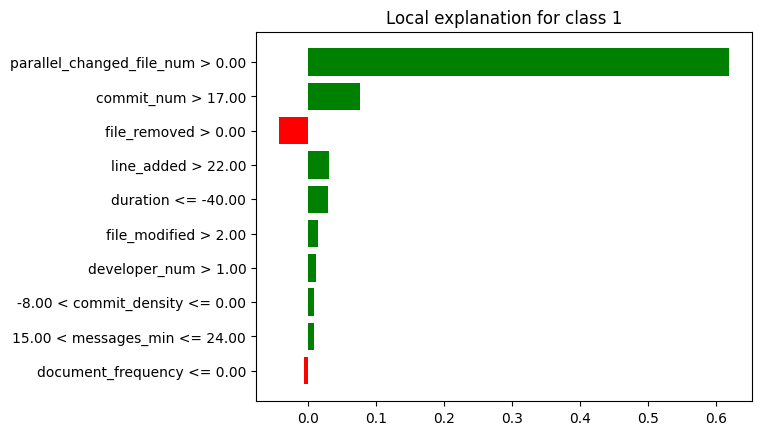

In [ ]:
lime_vp_max.plot()

In [ ]:
breakdown_vp_df_max = breakdown_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_max = breakdown_vp_df_max.drop(index=[0, 26])
breakdown_vp_df_max['sign'] = breakdown_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_max = breakdown_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_max = shap_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_max = shap_vp_df_max.tail(25)
shap_vp_df_max['sign'] = shap_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_max = shap_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_max["Variable"] = lime_vp_df_max["variable"].str.split(" ").str[0]
lime_vp_df_max["Signo"] = lime_vp_df_max["effect"].apply(evaluar_valor)
lime_vp_df_max = lime_vp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_max = lime_vp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_max['Ranking'] = breakdown_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_max = breakdown_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_max['Ranking'] = shap_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_max = shap_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_max['Ranking'] = lime_vp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_max = lime_vp_df_max.head(5)
lime_vp_df_max = lime_vp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_max = breakdown_vp_df_max.drop(columns=['contribution'])
shap_vp_df_max = shap_vp_df_max.drop(columns=['contribution'])
lime_vp_df_max = lime_vp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_max = breakdown_vp_df_max.head(5)
breakdown_vp_df_max = breakdown_vp_df_max.reset_index(drop=True)

shap_vp_df_max = shap_vp_df_max.head(5)
shap_vp_df_max = shap_vp_df_max.reset_index(drop=True)

lime_vp_df_max = lime_vp_df_max.reset_index(drop=True)

print(breakdown_vp_df_max)
print(shap_vp_df_max)
print(lime_vp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                   duration        2  Positivo
2                 commit_num        3  Positivo
3              developer_num        4  Positivo
4              file_modified        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                   duration        2  Positivo
2                 commit_num        3  Positivo
3              developer_num        4  Positivo
4              file_modified        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               file_removed        3  Negativo
3                 line_added        4  Positivo
4                   duration        5  Positivo


In [ ]:
#lime_vp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_max['Variable'])
shapley_features = list(shap_vp_df_max['Variable'])
lime_features = list(lime_vp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_max[breakdown_vp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_max[shap_vp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_max[lime_vp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'duration', 'commit_num', 'developer_num', 'file_modified']
['parallel_changed_file_num', 'duration', 'commit_num', 'developer_num', 'file_modified']
['parallel_changed_file_num', 'commit_num', 'file_removed', 'line_added', 'duration']
['file_removed', 'line_added', 'developer_num', 'commit_num', 'duration', 'parallel_changed_file_num', 'file_modified']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       3   
1                 line_added         -         -       -         -       4   
2              developer_num         4  Positivo       4  Positivo       -   
3                 commit_num         3  Positivo       3  Positivo       2   
4                   duration         2  Positivo       2  Positivo       5   
5  parallel_changed_file_num         1  Positivo       1  Positivo       1   
6              file_modified         5  Negativo       5  Negativo       -   

             
      Signo  
0  Negativo  
1  Positivo  
2         -  
3  Positivo  
4  Positivo  
5  Positivo  
6         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "duration", "commit_num", "developer_num", "file_modified", "file_removed", "line_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
duration                          2  Positivo       2  Positivo       5   
commit_num                        3  Positivo       3  Positivo       2   
developer_num                     4  Positivo       4  Positivo       -   
file_modified                     5  Negativo       5  Negativo       -   
file_removed                      -         -       -         -       3   
line_added                        -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
duration                   Positivo  
commit_num                 Positivo  
developer_num                     -  
file_modified                     -  
file_removed               Negativo  
line_added                 Positivo

### **Instancia VP MEDIANA:**

In [ ]:
breakdown_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="break_down",random_state=42)
shap_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="shap",random_state=42)
lime_vp_mediana = exp.predict_surrogate(df_instancia_vp_mediana, random_state=42)

breakdown_vp_df_mediana = breakdown_vp_mediana.result
shap_vp_df_mediana = shap_vp_mediana.result
lime_vp_df_mediana=lime_vp_mediana.result

In [ ]:
breakdown_vp_mediana.plot()

In [ ]:
shap_vp_mediana.plot()

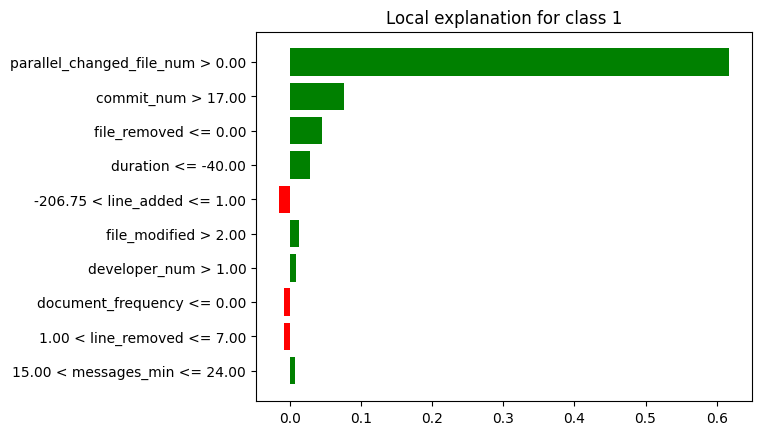

In [ ]:
lime_vp_mediana.plot()

In [ ]:
breakdown_vp_df_mediana = breakdown_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(index=[0, 26])
breakdown_vp_df_mediana['sign'] = breakdown_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_mediana = breakdown_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_mediana = shap_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_mediana = shap_vp_df_mediana.tail(25)
shap_vp_df_mediana['sign'] = shap_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_mediana = shap_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_mediana["Variable"] = lime_vp_df_mediana["variable"].str.split(" ").str[0]
lime_vp_df_mediana["Signo"] = lime_vp_df_mediana["effect"].apply(evaluar_valor)
lime_vp_df_mediana = lime_vp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_mediana['Ranking'] = breakdown_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_mediana = breakdown_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_mediana['Ranking'] = shap_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_mediana = shap_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_mediana['Ranking'] = lime_vp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_mediana = lime_vp_df_mediana.head(5)
lime_vp_df_mediana = lime_vp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(columns=['contribution'])
shap_vp_df_mediana = shap_vp_df_mediana.drop(columns=['contribution'])
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_mediana = breakdown_vp_df_mediana.head(5)
breakdown_vp_df_mediana = breakdown_vp_df_mediana.reset_index(drop=True)

shap_vp_df_mediana = shap_vp_df_mediana.head(5)
shap_vp_df_mediana = shap_vp_df_mediana.reset_index(drop=True)

lime_vp_df_mediana = lime_vp_df_mediana.reset_index(drop=True)
lime_vp_df_mediana.at[4, 'Variable'] = 'line_added'

print(breakdown_vp_df_mediana)
print(shap_vp_df_mediana)
print(lime_vp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2          improve_frequency        3  Positivo
3             commit_density        4  Negativo
4              developer_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3          improve_frequency        4  Positivo
4                   duration        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               file_removed        3  Positivo
3                   duration        4  Positivo
4                 line_added        5  Negativo


In [ ]:
#lime_vp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_mediana['Variable'])
shapley_features = list(shap_vp_df_mediana['Variable'])
lime_features = list(lime_vp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_mediana[breakdown_vp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_mediana[shap_vp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_mediana[lime_vp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'commit_num', 'improve_frequency', 'commit_density', 'developer_num']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'improve_frequency', 'duration']
['parallel_changed_file_num', 'commit_num', 'file_removed', 'duration', 'line_added']
['improve_frequency', 'commit_density', 'line_added', 'developer_num', 'commit_num', 'duration', 'file_removed', 'parallel_changed_file_num']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0          improve_frequency         3  Positivo       4  Positivo       -   
1             commit_density         4  Negativo       -         -       -   
2                 line_added         -         -       -         -       5   
3              developer_num         5  Positivo       3  Positivo       -   
4                 commit_num         2  Positivo       2  Positivo       2   
5                   duration         -         -       5  Positivo       4   
6               file_removed         -         -       -         -       3   
7  parallel_changed_file_num         1  Positivo       1  Positivo       1   

             
      Signo  
0         -  
1         -  
2  Negativo  
3         -  
4  Positivo  
5  Positivo  
6  Positivo  
7  Positivo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "improve_frequency", "commit_density", "developer_num", "duration", "file_removed", "line_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
improve_frequency                 3  Positivo       4  Positivo       -   
commit_density                    4  Negativo       -         -       -   
developer_num                     5  Positivo       3  Positivo       -   
duration                          -         -       5  Positivo       4   
file_removed                      -         -       -         -       3   
line_added                        -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
improve_frequency                 -  
commit_density                    -  
developer_num                     -  
duration                   Positivo  
file_removed               Positivo  
line_added                 Negativo

### **Instancia VP MIN:**

In [ ]:
breakdown_vp_min = exp.predict_parts(df_instancia_vp_min, type="break_down",random_state=42)
shap_vp_min = exp.predict_parts(df_instancia_vp_min, type="shap",random_state=42)
lime_vp_min = exp.predict_surrogate(df_instancia_vp_min, random_state=42)

breakdown_vp_df_min = breakdown_vp_min.result
shap_vp_df_min = shap_vp_min.result
lime_vp_df_min = lime_vp_min.result

In [ ]:
breakdown_vp_min.plot()

In [ ]:
shap_vp_min.plot()

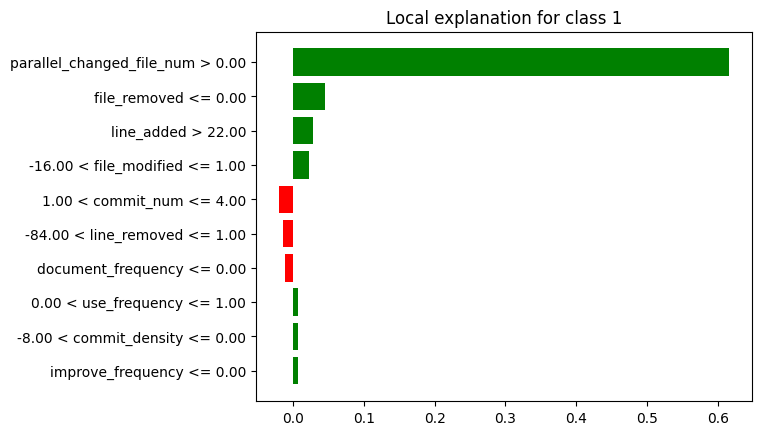

In [ ]:
lime_vp_min.plot()

In [ ]:
breakdown_vp_df_min = breakdown_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_min = breakdown_vp_df_min.drop(index=[0, 26])
breakdown_vp_df_min['sign'] = breakdown_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_min = breakdown_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_min = shap_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_min = shap_vp_df_min.tail(25)
shap_vp_df_min['sign'] = shap_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_min = shap_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_min["Variable"] = lime_vp_df_min["variable"].str.split(" ").str[0]
lime_vp_df_min["Signo"] = lime_vp_df_min["effect"].apply(evaluar_valor)
lime_vp_df_min = lime_vp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_min = lime_vp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_min['Ranking'] = breakdown_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_min = breakdown_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_min['Ranking'] = shap_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_min = shap_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_min['Ranking'] = lime_vp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_min = lime_vp_df_min.head(5)
lime_vp_df_min = lime_vp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_min = breakdown_vp_df_min.drop(columns=['contribution'])
shap_vp_df_min = shap_vp_df_min.drop(columns=['contribution'])
lime_vp_df_min = lime_vp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_min = breakdown_vp_df_min.head(5)
breakdown_vp_df_min = breakdown_vp_df_min.reset_index(drop=True)

shap_vp_df_min = shap_vp_df_min.head(5)
shap_vp_df_min = shap_vp_df_min.reset_index(drop=True)

lime_vp_df_min = lime_vp_df_min.reset_index(drop=True)
lime_vp_df_min.at[3, 'Variable'] = 'file_modified'
lime_vp_df_min.at[4, 'Variable'] = 'commit_num'

print(breakdown_vp_df_min)
print(shap_vp_df_min)
print(lime_vp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2               file_removed        3  Positivo
3               messages_max        4  Positivo
4               line_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2               file_removed        3  Positivo
3               messages_max        4  Positivo
4               line_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               file_removed        2  Positivo
2                 line_added        3  Positivo
3              file_modified        4  Positivo
4                 commit_num        5  Negativo


In [ ]:
#lime_vp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_min['Variable'])
shapley_features = list(shap_vp_df_min['Variable'])
lime_features = list(lime_vp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_min[breakdown_vp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_min[shap_vp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_min[lime_vp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'developer_num', 'file_removed', 'messages_max', 'line_removed']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'messages_max', 'line_removed']
['parallel_changed_file_num', 'file_removed', 'line_added', 'file_modified', 'commit_num']
['file_removed', 'line_removed', 'line_added', 'developer_num', 'commit_num', 'messages_max', 'parallel_changed_file_num', 'file_modified']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         3  Positivo       3  Positivo       2   
1               line_removed         5  Negativo       5  Negativo       -   
2                 line_added         -         -       -         -       3   
3              developer_num         2  Positivo       2  Positivo       -   
4                 commit_num         -         -       -         -       5   
5               messages_max         4  Positivo       4  Positivo       -   
6  parallel_changed_file_num         1  Positivo       1  Positivo       1   
7              file_modified         -         -       -         -       4   

             
      Signo  
0  Positivo  
1         -  
2  Positivo  
3         -  
4  Negativo  
5         -  
6  Positivo  
7  Positivo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "file_removed", "messages_max", "line_removed", "line_added", "file_modified", "commit_num"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Positivo       2  Positivo       -   
file_removed                      3  Positivo       3  Positivo       2   
messages_max                      4  Positivo       4  Positivo       -   
line_removed                      5  Negativo       5  Negativo       -   
line_added                        -         -       -         -       3   
file_modified                     -         -       -         -       4   
commit_num                        -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num                     -  
file_removed               Positivo  
messages_max                      -  
line_removed                      -  
line_added                 Positivo  
file_modified              Positivo  
commit_num                 Negativo

### **VP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('duration', 2), ('commit_num', 3), ('developer_num', 4), ('file_modified', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('improve_frequency', 3), ('commit_density', 4), ('developer_num', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('file_removed', 3), ('messages_max', 4), ('line_removed', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('duration', 2), ('commit_num', 3), ('developer_num', 4), ('file_modified', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('improve_frequency', 4), ('developer_num', 3), ('duration', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('file_removed', 3), ('messages_max', 4), ('line_removed', 5)], 'Lime': [('parallel_changed_file_num', 1), ('duration', 5), ('commit_num', 2), ('file_removed', 3), ('line_added', 4), ('parallel_changed_file_num', 1), ('commit_num', 2), ('duration', 4), ('file_removed', 3), ('line_added', 5), ('parallel_changed_file_num', 1), 

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_gb_vp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_gb_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
parallel_changed_file_num           1.0      3           1.0      3   
messages_max                        4.0      1           4.0      1   
commit_num                          2.5      2           2.5      2   
developer_num                  3.666667      3           3.0      3   
commit_density                      4.0      1             -      -   
line_added                            -      -             -      -   
improve_frequency                   3.0      1           4.0      1   
file_modified                       5.0      1           5.0      1   
duration                            2.0      1           3.5      2   
line_removed                        5.0      1           5.0      1   
file_removed                        3.0      1           3.0      1   

                                   Lime         
                          Ranking Medio Conteo  
parallel_changed_file_num           1.0      3  
messages_max                          -      -  
commit_num                          3.0      3  
developer_num                         -      -  
commit_density                        -      -  
line_added                          4.0      3  
improve_frequency                     -      -  
file_modified                       4.0      1  
duration                            4.5      2  
line_removed                          -      -  
file_removed                   2.666667      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_gb_vp[("General", "Ranking")] = df_resumen_gb_vp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_gb_vp[("General", "Conteo Total")] = df_resumen_gb_vp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_gb_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
parallel_changed_file_num           1.0      3           1.0      3   
messages_max                        4.0      1           4.0      1   
commit_num                          2.5      2           2.5      2   
developer_num                  3.666667      3           3.0      3   
commit_density                      4.0      1             -      -   
line_added                            -      -             -      -   
improve_frequency                   3.0      1           4.0      1   
file_modified                       5.0      1           5.0      1   
duration                            2.0      1           3.5      2   
line_removed                        5.0      1           5.0      1   
file_removed                        3.0      1           3.0      1   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
parallel_changed_file_num           1.0      3  1.000000            9  
messages_max                          -      -  4.000000            2  
commit_num                          3.0      3  2.666667            7  
developer_num                         -      -  3.333333            6  
commit_density                        -      -  4.000000            1  
line_added                          4.0      3  4.000000            3  
improve_frequency                     -      -  3.500000            2  
file_modified                       4.0      1  4.666667            3  
duration                            4.5      2  3.333333            5  
line_removed                          -      -  5.000000            2  
file_removed                   2.666667      3  2.888889            5

In [ ]:
# Obtener el número de características
num_caract = df_resumen_gb_vp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_gb_vp[("General", "Peso Rango")] = 1 - ((df_resumen_gb_vp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_gb_vp[("General", "Peso Conteo")] = df_resumen_gb_vp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_gb_vp[("General", "Puntaje")] = df_resumen_gb_vp[("General", "Peso Rango")] + df_resumen_gb_vp[("General", "Peso Conteo")]
df_resumen_gb_vp[("General", "Ranking")] = df_resumen_gb_vp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_gb_vp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_gb_vp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_gb_vp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_gb_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
parallel_changed_file_num           1.0      3           1.0      3   
messages_max                        4.0      1           4.0      1   
commit_num                          2.5      2           2.5      2   
developer_num                  3.666667      3           3.0      3   
commit_density                      4.0      1             -      -   
line_added                            -      -             -      -   
improve_frequency                   3.0      1           4.0      1   
file_modified                       5.0      1           5.0      1   
duration                            2.0      1           3.5      2   
line_removed                        5.0      1           5.0      1   
file_removed                        3.0      1           3.0      1   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
parallel_changed_file_num           1.0      3     1.0            9  
messages_max                          -      -     9.0            2  
commit_num                          3.0      3     2.0            7  
developer_num                         -      -     3.0            6  
commit_density                        -      -    10.0            1  
line_added                          4.0      3     6.0            3  
improve_frequency                     -      -     7.0            2  
file_modified                       4.0      1     8.0            3  
duration                            4.5      2     5.0            5  
line_removed                          -      -    11.0            2  
file_removed                   2.666667      3     4.0            5

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_gb_vp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_gb_vp = df_resumen_gb_vp[new_columns]

In [ ]:
df_resumen_gb_vp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_gb_vp[(tech, "Ranking Medio")] = df_resumen_gb_vp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_gb_vp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
commit_num                    2.0            7          2.50      2   
developer_num                 3.0            6          3.67      3   
file_removed                  4.0            5          3.00      1   
duration                      5.0            5          2.00      1   
line_added                    6.0            3             -      -   
improve_frequency             7.0            2          3.00      1   
file_modified                 8.0            3          5.00      1   
messages_max                  9.0            2          4.00      1   
commit_density               10.0            1          4.00      1   
line_removed                 11.0            2          5.00      1   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         2.50      2          3.00      3  
developer_num                      3.00      3             -      -  
file_removed                       3.00      1          2.67      3  
duration                           3.50      2          4.50      2  
line_added                            -      -          4.00      3  
improve_frequency                  4.00      1             -      -  
file_modified                      5.00      1          4.00      1  
messages_max                       4.00      1             -      -  
commit_density                        -      -             -      -  
line_removed                       5.00      1             -      -

### **Instancia VN MAX:**

In [ ]:
breakdown_vn_max = exp.predict_parts(df_instancia_vn_max, type="break_down",random_state=42)
shap_vn_max = exp.predict_parts(df_instancia_vn_max, type="shap",random_state=42)
lime_vn_max = exp.predict_surrogate(df_instancia_vn_max, random_state=42)

breakdown_vn_df_max = breakdown_vn_max.result
shap_vn_df_max = shap_vn_max.result
lime_vn_df_max = lime_vn_max.result

In [ ]:
breakdown_vn_max.plot()

In [ ]:
shap_vn_max.plot()

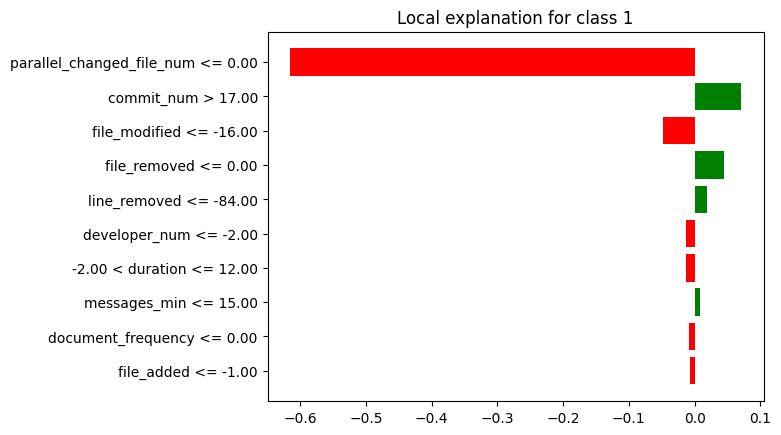

In [ ]:
lime_vn_max.plot()

In [ ]:
breakdown_vn_df_max = breakdown_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_max = breakdown_vn_df_max.drop(index=[0, 26])
breakdown_vn_df_max['sign'] = breakdown_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_max = breakdown_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_max = shap_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_max = shap_vn_df_max.tail(25)
shap_vn_df_max['sign'] = shap_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_max = shap_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_max["Variable"] = lime_vn_df_max["variable"].str.split(" ").str[0]
lime_vn_df_max["Signo"] = lime_vn_df_max["effect"].apply(evaluar_valor)
lime_vn_df_max = lime_vn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_max = lime_vn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_max['Ranking'] = breakdown_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_max = breakdown_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_max['Ranking'] = shap_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_max = shap_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_max['Ranking'] = lime_vn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_max = lime_vn_df_max.head(5)
lime_vn_df_max = lime_vn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_vn_df_max = breakdown_vn_df_max.drop(columns=['contribution'])
shap_vn_df_max = shap_vn_df_max.drop(columns=['contribution'])
lime_vn_df_max = lime_vn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_max = breakdown_vn_df_max.head(5)
breakdown_vn_df_max = breakdown_vn_df_max.reset_index(drop=True)

shap_vn_df_max = shap_vn_df_max.head(5)
shap_vn_df_max = shap_vn_df_max.reset_index(drop=True)

lime_vn_df_max = lime_vn_df_max.reset_index(drop=True)

print(breakdown_vn_df_max)
print(shap_vn_df_max)
print(lime_vn_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Negativo
2               messages_max        3  Positivo
3               line_removed        4  Negativo
4                 commit_num        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Negativo
2               messages_max        3  Positivo
3               line_removed        4  Negativo
4                   duration        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Positivo
2              file_modified        3  Negativo
3               file_removed        4  Positivo
4               line_removed        5  Positivo


In [ ]:
#lime_vn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_max['Variable'])
shapley_features = list(shap_vn_df_max['Variable'])
lime_features = list(lime_vn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_max[breakdown_vn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_max[shap_vn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_max[lime_vn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'developer_num', 'messages_max', 'line_removed', 'commit_num']
['parallel_changed_file_num', 'developer_num', 'messages_max', 'line_removed', 'duration']
['parallel_changed_file_num', 'commit_num', 'file_modified', 'file_removed', 'line_removed']
['file_removed', 'line_removed', 'developer_num', 'commit_num', 'duration', 'messages_max', 'parallel_changed_file_num', 'file_modified']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       4   
1               line_removed         4  Negativo       4  Negativo       5   
2              developer_num         2  Negativo       2  Negativo       -   
3                 commit_num         5  Negativo       -         -       2   
4                   duration         -         -       5  Negativo       -   
5               messages_max         3  Positivo       3  Positivo       -   
6  parallel_changed_file_num         1  Negativo       1  Negativo       1   
7              file_modified         -         -       -         -       3   

             
      Signo  
0  Positivo  
1  Positivo  
2         -  
3  Positivo  
4         -  
5         -  
6  Negativo  
7  Negativo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "messages_max", "line_removed", "commit_num", "duration", "file_modified", "file_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
developer_num                     2  Negativo       2  Negativo       -   
messages_max                      3  Positivo       3  Positivo       -   
line_removed                      4  Negativo       4  Negativo       5   
commit_num                        5  Negativo       -         -       2   
duration                          -         -       5  Negativo       -   
file_modified                     -         -       -         -       3   
file_removed                      -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
developer_num                     -  
messages_max                      -  
line_removed               Positivo  
commit_num                 Positivo  
duration                          -  
file_modified              Negativo  
file_removed               Positivo

### **Instancia VN MEDIANA:**

In [ ]:
breakdown_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="break_down",random_state=42)
shap_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="shap",random_state=42)
lime_vn_mediana = exp.predict_surrogate(df_instancia_vn_mediana, random_state=42)

breakdown_vn_df_mediana = breakdown_vn_mediana.result
shap_vn_df_mediana = shap_vn_mediana.result
lime_vn_df_mediana = lime_vn_mediana.result

In [ ]:
breakdown_vn_mediana.plot()

In [ ]:
shap_vn_mediana.plot()

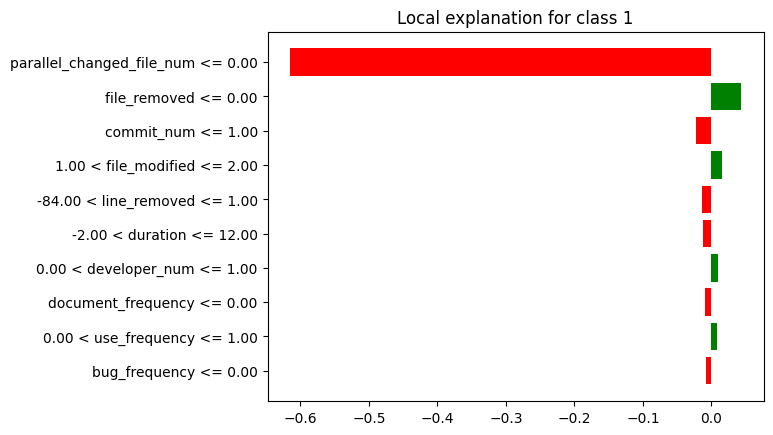

In [ ]:
lime_vn_mediana.plot()

In [ ]:
breakdown_vn_df_mediana = breakdown_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(index=[0, 26])
breakdown_vn_df_mediana['sign'] = breakdown_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_mediana = breakdown_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_mediana = shap_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_mediana = shap_vn_df_mediana.tail(25)
shap_vn_df_mediana['sign'] = shap_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_mediana = shap_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_mediana["Variable"] = lime_vn_df_mediana["variable"].str.split(" ").str[0]
lime_vn_df_mediana["Signo"] = lime_vn_df_mediana["effect"].apply(evaluar_valor)
lime_vn_df_mediana = lime_vn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_mediana['Ranking'] = breakdown_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_mediana = breakdown_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_mediana['Ranking'] = shap_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_mediana = shap_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_mediana['Ranking'] = lime_vn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_mediana = lime_vn_df_mediana.head(5)
lime_vn_df_mediana = lime_vn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(columns=['contribution'])
shap_vn_df_mediana = shap_vn_df_mediana.drop(columns=['contribution'])
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_mediana = breakdown_vn_df_mediana.head(5)
breakdown_vn_df_mediana = breakdown_vn_df_mediana.reset_index(drop=True)

shap_vn_df_mediana = shap_vn_df_mediana.head(5)
shap_vn_df_mediana = shap_vn_df_mediana.reset_index(drop=True)

lime_vn_df_mediana = lime_vn_df_mediana.reset_index(drop=True)
lime_vn_df_mediana.at[3, 'Variable'] = 'file_modified'
lime_vn_df_mediana.at[4, 'Variable'] = 'line_removed'

print(breakdown_vn_df_mediana)
print(shap_vn_df_mediana)
print(lime_vn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3              file_modified        4  Positivo
4               line_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Positivo
2                 commit_num        3  Negativo
3               line_removed        4  Negativo
4              file_modified        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               file_removed        2  Positivo
2                 commit_num        3  Negativo
3              file_modified        4  Positivo
4               line_removed        5  Negativo


In [ ]:
#lime_vn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_mediana['Variable'])
shapley_features = list(shap_vn_df_mediana['Variable'])
lime_features = list(lime_vn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_mediana[breakdown_vn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_mediana[shap_vn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_mediana[lime_vn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_modified', 'line_removed']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'line_removed', 'file_modified']
['parallel_changed_file_num', 'file_removed', 'commit_num', 'file_modified', 'line_removed']
['file_removed', 'line_removed', 'developer_num', 'commit_num', 'parallel_changed_file_num', 'file_modified']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       2   
1               line_removed         5  Negativo       4  Negativo       5   
2              developer_num         3  Positivo       2  Positivo       -   
3                 commit_num         2  Negativo       3  Negativo       3   
4  parallel_changed_file_num         1  Negativo       1  Negativo       1   
5              file_modified         4  Positivo       5  Positivo       4   

             
      Signo  
0  Positivo  
1  Negativo  
2         -  
3  Negativo  
4  Negativo  
5  Positivo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "file_modified", "line_removed", "file_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
commit_num                        2  Negativo       3  Negativo       3   
developer_num                     3  Positivo       2  Positivo       -   
file_modified                     4  Positivo       5  Positivo       4   
line_removed                      5  Negativo       4  Negativo       5   
file_removed                      -         -       -         -       2   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
commit_num                 Negativo  
developer_num                     -  
file_modified              Positivo  
line_removed               Negativo  
file_removed               Positivo

### **Instancia VN MIN:**

In [ ]:
breakdown_vn_min = exp.predict_parts(df_instancia_vn_min, type="break_down",random_state=42)
shap_vn_min = exp.predict_parts(df_instancia_vn_min, type="shap",random_state=42)
lime_vn_min = exp.predict_surrogate(df_instancia_vn_min, random_state=42)

breakdown_vn_df_min = breakdown_vn_min.result
shap_vn_df_min = shap_vn_min.result
lime_vn_df_min = lime_vn_min.result

In [ ]:
breakdown_vn_min.plot()

In [ ]:
shap_vn_min.plot()

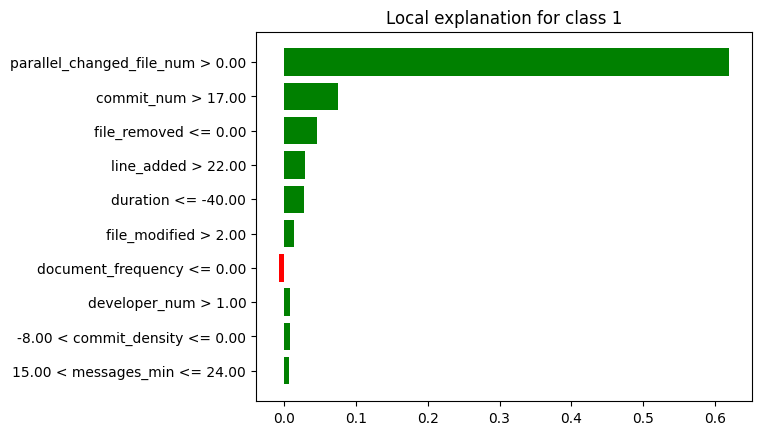

In [ ]:
lime_vn_min.plot()

In [ ]:
breakdown_vn_df_min = breakdown_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_min = breakdown_vn_df_min.drop(index=[0, 26])
breakdown_vn_df_min['sign'] = breakdown_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_min = breakdown_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_min = shap_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_min = shap_vn_df_min.tail(25)
shap_vn_df_min['sign'] = shap_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_min = shap_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_min["Variable"] = lime_vn_df_min["variable"].str.split(" ").str[0]
lime_vn_df_min["Signo"] = lime_vn_df_min["effect"].apply(evaluar_valor)
lime_vn_df_min = lime_vn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_min = lime_vn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_min['Ranking'] = breakdown_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_min = breakdown_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_min['Ranking'] = shap_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_min = shap_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_min['Ranking'] = lime_vn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_min = lime_vn_df_min.head(5)
lime_vn_df_min = lime_vn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vn_df_min = breakdown_vn_df_min.drop(columns=['contribution'])
shap_vn_df_min = shap_vn_df_min.drop(columns=['contribution'])
lime_vn_df_min = lime_vn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_min = breakdown_vn_df_min.head(5)
breakdown_vn_df_min = breakdown_vn_df_min.reset_index(drop=True)

shap_vn_df_min = shap_vn_df_min.head(5)
shap_vn_df_min = shap_vn_df_min.reset_index(drop=True)

lime_vn_df_min = lime_vn_df_min.reset_index(drop=True)

print(breakdown_vn_df_min)
print(shap_vn_df_min)
print(lime_vn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                   duration        2  Positivo
2              developer_num        3  Positivo
3              file_modified        4  Positivo
4               messages_min        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                   duration        2  Positivo
2              developer_num        3  Positivo
3              file_modified        4  Positivo
4               messages_min        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               file_removed        3  Positivo
3                 line_added        4  Positivo
4                   duration        5  Positivo


In [ ]:
#lime_vn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_min['Variable'])
shapley_features = list(shap_vn_df_min['Variable'])
lime_features = list(lime_vn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_min[breakdown_vn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_min[shap_vn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_min[lime_vn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'duration', 'developer_num', 'file_modified', 'messages_min']
['parallel_changed_file_num', 'duration', 'developer_num', 'file_modified', 'messages_min']
['parallel_changed_file_num', 'commit_num', 'file_removed', 'line_added', 'duration']
['file_removed', 'line_added', 'developer_num', 'commit_num', 'duration', 'messages_min', 'parallel_changed_file_num', 'file_modified']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       3   
1                 line_added         -         -       -         -       4   
2              developer_num         3  Positivo       3  Positivo       -   
3                 commit_num         -         -       -         -       2   
4                   duration         2  Positivo       2  Positivo       5   
5               messages_min         5  Positivo       5  Positivo       -   
6  parallel_changed_file_num         1  Positivo       1  Positivo       1   
7              file_modified         4  Positivo       4  Positivo       -   

             
      Signo  
0  Positivo  
1  Positivo  
2         -  
3  Positivo  
4  Positivo  
5         -  
6  Positivo  
7         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "duration", "developer_num", "file_modified", "messages_min", "commit_num", "file_removed", "line_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
duration                          2  Positivo       2  Positivo       5   
developer_num                     3  Positivo       3  Positivo       -   
file_modified                     4  Positivo       4  Positivo       -   
messages_min                      5  Positivo       5  Positivo       -   
commit_num                        -         -       -         -       2   
file_removed                      -         -       -         -       3   
line_added                        -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
duration                   Positivo  
developer_num                     -  
file_modified                     -  
messages_min                      -  
commit_num                 Positivo  
file_removed               Positivo  
line_added                 Positivo

### **VN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('developer_num', 2), ('messages_max', 3), ('line_removed', 4), ('commit_num', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_modified', 4), ('line_removed', 5), ('parallel_changed_file_num', 1), ('duration', 2), ('developer_num', 3), ('file_modified', 4), ('messages_min', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('developer_num', 2), ('messages_max', 3), ('line_removed', 4), ('duration', 5), ('parallel_changed_file_num', 1), ('commit_num', 3), ('developer_num', 2), ('file_modified', 5), ('line_removed', 4), ('parallel_changed_file_num', 1), ('duration', 2), ('developer_num', 3), ('file_modified', 4), ('messages_min', 5)], 'Lime': [('parallel_changed_file_num', 1), ('line_removed', 5), ('commit_num', 2), ('file_modified', 3), ('file_removed', 4), ('parallel_changed_file_num', 1), ('commit_num', 3), ('file_modified', 4), ('line_removed', 5), ('file_removed', 2), ('parallel_changed_file_num'

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_gb_vn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_gb_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_modified                       4.0      2           4.5      2   
parallel_changed_file_num           1.0      3           1.0      3   
messages_min                        5.0      1           5.0      1   
messages_max                        3.0      1           3.0      1   
duration                            2.0      1           3.5      2   
commit_num                          3.5      2           3.0      1   
developer_num                  2.666667      3      2.333333      3   
line_added                            -      -             -      -   
line_removed                        4.5      2           4.0      2   
file_removed                          -      -             -      -   

                                   Lime         
                          Ranking Medio Conteo  
file_modified                       3.5      2  
parallel_changed_file_num           1.0      3  
messages_min                          -      -  
messages_max                          -      -  
duration                            5.0      1  
commit_num                     2.333333      3  
developer_num                         -      -  
line_added                          4.0      1  
line_removed                        5.0      2  
file_removed                        3.0      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_gb_vn[("General", "Ranking")] = df_resumen_gb_vn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_gb_vn[("General", "Conteo Total")] = df_resumen_gb_vn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_gb_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_modified                       4.0      2           4.5      2   
parallel_changed_file_num           1.0      3           1.0      3   
messages_min                        5.0      1           5.0      1   
messages_max                        3.0      1           3.0      1   
duration                            2.0      1           3.5      2   
commit_num                          3.5      2           3.0      1   
developer_num                  2.666667      3      2.333333      3   
line_added                            -      -             -      -   
line_removed                        4.5      2           4.0      2   
file_removed                          -      -             -      -   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
file_modified                       3.5      2  4.000000            6  
parallel_changed_file_num           1.0      3  1.000000            9  
messages_min                          -      -  5.000000            2  
messages_max                          -      -  3.000000            2  
duration                            5.0      1  3.500000            4  
commit_num                     2.333333      3  2.944444            6  
developer_num                         -      -  2.500000            6  
line_added                          4.0      1  4.000000            1  
line_removed                        5.0      2  4.500000            6  
file_removed                        3.0      3  3.000000            3

In [ ]:
# Obtener el número de características
num_caract = df_resumen_gb_vn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_gb_vn[("General", "Peso Rango")] = 1 - ((df_resumen_gb_vn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_gb_vn[("General", "Peso Conteo")] = df_resumen_gb_vn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_gb_vn[("General", "Puntaje")] = df_resumen_gb_vn[("General", "Peso Rango")] + df_resumen_gb_vn[("General", "Peso Conteo")]
df_resumen_gb_vn[("General", "Ranking")] = df_resumen_gb_vn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_gb_vn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_gb_vn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_gb_vn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_gb_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_modified                       4.0      2           4.5      2   
parallel_changed_file_num           1.0      3           1.0      3   
messages_min                        5.0      1           5.0      1   
messages_max                        3.0      1           3.0      1   
duration                            2.0      1           3.5      2   
commit_num                          3.5      2           3.0      1   
developer_num                  2.666667      3      2.333333      3   
line_added                            -      -             -      -   
line_removed                        4.5      2           4.0      2   
file_removed                          -      -             -      -   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
file_modified                       3.5      2     4.0            6  
parallel_changed_file_num           1.0      3     1.0            9  
messages_min                          -      -    10.0            2  
messages_max                          -      -     8.0            2  
duration                            5.0      1     6.0            4  
commit_num                     2.333333      3     3.0            6  
developer_num                         -      -     2.0            6  
line_added                          4.0      1     9.0            1  
line_removed                        5.0      2     7.0            6  
file_removed                        3.0      3     5.0            3

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_gb_vn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_gb_vn = df_resumen_gb_vn[new_columns]

In [ ]:
df_resumen_gb_vn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_gb_vn[(tech, "Ranking Medio")] = df_resumen_gb_vn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_gb_vn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
developer_num                 2.0            6          2.67      3   
commit_num                    3.0            6          3.50      2   
file_modified                 4.0            6          4.00      2   
file_removed                  5.0            3             -      -   
duration                      6.0            4          2.00      1   
line_removed                  7.0            6          4.50      2   
messages_max                  8.0            2          3.00      1   
line_added                    9.0            1             -      -   
messages_min                 10.0            2          5.00      1   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
developer_num                      2.33      3             -      -  
commit_num                         3.00      1          2.33      3  
file_modified                      4.50      2          3.50      2  
file_removed                          -      -          3.00      3  
duration                           3.50      2          5.00      1  
line_removed                       4.00      2          5.00      2  
messages_max                       3.00      1             -      -  
line_added                            -      -          4.00      1  
messages_min                       5.00      1             -      -

### **Instancia FP MAX:**

In [ ]:
breakdown_fp_max = exp.predict_parts(df_instancia_fp_max, type="break_down",random_state=42)
shap_fp_max = exp.predict_parts(df_instancia_fp_max, type="shap",random_state=42)
lime_fp_max = exp.predict_surrogate(df_instancia_fp_max, random_state=42)

breakdown_fp_df_max = breakdown_fp_max.result
shap_fp_df_max = shap_fp_max.result
lime_fp_df_max=lime_fp_max.result

In [ ]:
breakdown_fp_max.plot()

In [ ]:
shap_fp_max.plot()

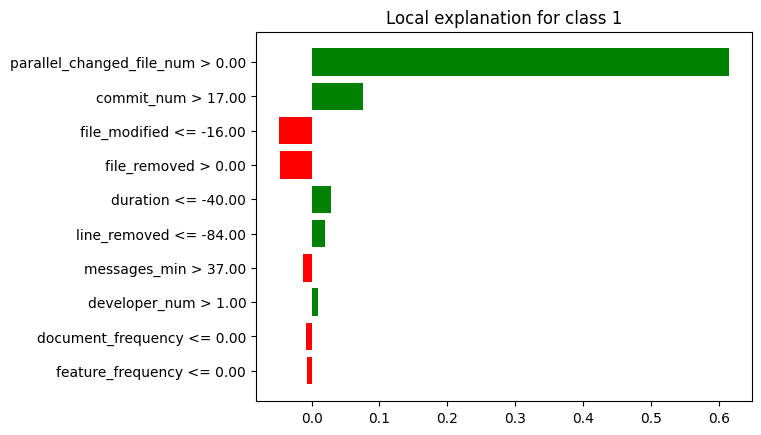

In [ ]:
lime_fp_max.plot()

In [ ]:
breakdown_fp_df_max = breakdown_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_max = breakdown_fp_df_max.drop(index=[0, 26])
breakdown_fp_df_max['sign'] = breakdown_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_max = breakdown_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_max = shap_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_max = shap_fp_df_max.tail(25)
shap_fp_df_max['sign'] = shap_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_max = shap_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_max["Variable"] = lime_fp_df_max["variable"].str.split(" ").str[0]
lime_fp_df_max["Signo"] = lime_fp_df_max["effect"].apply(evaluar_valor)
lime_fp_df_max = lime_fp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_max = lime_fp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_max['Ranking'] = breakdown_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_max = breakdown_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_max['Ranking'] = shap_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_max = shap_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_max['Ranking'] = lime_fp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_max = lime_fp_df_max.head(5)
lime_fp_df_max = lime_fp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fp_df_max = breakdown_fp_df_max.drop(columns=['contribution'])
shap_fp_df_max = shap_fp_df_max.drop(columns=['contribution'])
lime_fp_df_max = lime_fp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_max = breakdown_fp_df_max.head(5)
breakdown_fp_df_max = breakdown_fp_df_max.reset_index(drop=True)

shap_fp_df_max = shap_fp_df_max.head(5)
shap_fp_df_max = shap_fp_df_max.reset_index(drop=True)

lime_fp_df_max = lime_fp_df_max.reset_index(drop=True)

print(breakdown_fp_df_max)
print(shap_fp_df_max)
print(lime_fp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                   duration        2  Positivo
2              developer_num        3  Positivo
3                 commit_num        4  Positivo
4             commit_density        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                   duration        2  Positivo
2                 commit_num        3  Positivo
3              developer_num        4  Positivo
4               line_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              file_modified        3  Negativo
3               file_removed        4  Negativo
4                   duration        5  Positivo


In [ ]:
#lime_fp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_max['Variable'])
shapley_features = list(shap_fp_df_max['Variable'])
lime_features = list(lime_fp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_max[breakdown_fp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_max[shap_fp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_max[lime_fp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'duration', 'developer_num', 'commit_num', 'commit_density']
['parallel_changed_file_num', 'duration', 'commit_num', 'developer_num', 'line_removed']
['parallel_changed_file_num', 'commit_num', 'file_modified', 'file_removed', 'duration']
['commit_density', 'line_removed', 'developer_num', 'commit_num', 'duration', 'file_removed', 'parallel_changed_file_num', 'file_modified']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0             commit_density         5  Positivo       -         -       -   
1               line_removed         -         -       5  Positivo       -   
2              developer_num         3  Positivo       4  Positivo       -   
3                 commit_num         4  Positivo       3  Positivo       2   
4                   duration         2  Positivo       2  Positivo       5   
5               file_removed         -         -       -         -       4   
6  parallel_changed_file_num         1  Positivo       1  Positivo       1   
7              file_modified         -         -       -         -       3   

             
      Signo  
0         -  
1         -  
2         -  
3  Positivo  
4  Positivo  
5  Negativo  
6  Positivo  
7  Negativo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "duration", "developer_num", "commit_num", "commit_density", "line_removed", "file_modified", "file_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
duration                          2  Positivo       2  Positivo       5   
developer_num                     3  Positivo       4  Positivo       -   
commit_num                        4  Positivo       3  Positivo       2   
commit_density                    5  Positivo       -         -       -   
line_removed                      -         -       5  Positivo       -   
file_modified                     -         -       -         -       3   
file_removed                      -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
duration                   Positivo  
developer_num                     -  
commit_num                 Positivo  
commit_density                    -  
line_removed                      -  
file_modified              Negativo  
file_removed               Negativo

### **Instancia FP MEDIANA:**

In [ ]:
breakdown_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="break_down",random_state=42)
shap_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="shap",random_state=42)
lime_fp_mediana = exp.predict_surrogate(df_instancia_fp_mediana, random_state=42)

breakdown_fp_df_mediana = breakdown_fp_mediana.result
shap_fp_df_mediana = shap_fp_mediana.result
lime_fp_df_mediana=lime_fp_mediana.result

In [ ]:
breakdown_fp_mediana.plot()

In [ ]:
shap_fp_mediana.plot()

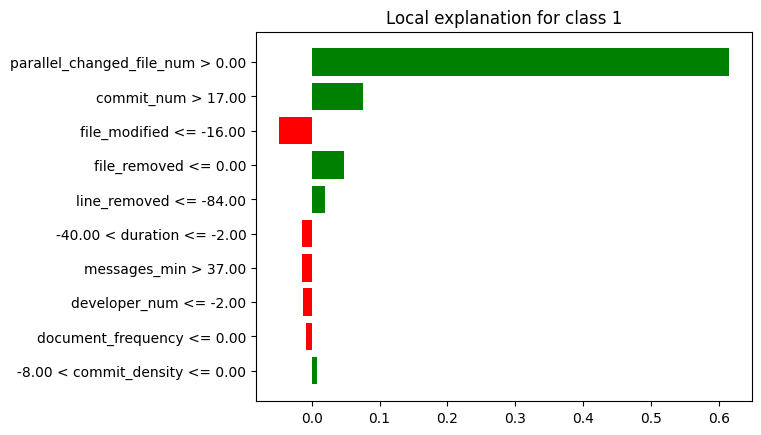

In [ ]:
lime_fp_mediana.plot()

In [ ]:
breakdown_fp_df_mediana = breakdown_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(index=[0, 26])
breakdown_fp_df_mediana['sign'] = breakdown_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_mediana = breakdown_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_mediana = shap_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_mediana = shap_fp_df_mediana.tail(25)
shap_fp_df_mediana['sign'] = shap_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_mediana = shap_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_mediana["Variable"] = lime_fp_df_mediana["variable"].str.split(" ").str[0]
lime_fp_df_mediana["Signo"] = lime_fp_df_mediana["effect"].apply(evaluar_valor)
lime_fp_df_mediana = lime_fp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_mediana['Ranking'] = breakdown_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_mediana = breakdown_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_mediana['Ranking'] = shap_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_mediana = shap_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_mediana['Ranking'] = lime_fp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_mediana = lime_fp_df_mediana.head(5)
lime_fp_df_mediana = lime_fp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(columns=['contribution'])
shap_fp_df_mediana = shap_fp_df_mediana.drop(columns=['contribution'])
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_mediana = breakdown_fp_df_mediana.head(5)
breakdown_fp_df_mediana = breakdown_fp_df_mediana.reset_index(drop=True)

shap_fp_df_mediana = shap_fp_df_mediana.head(5)
shap_fp_df_mediana = shap_fp_df_mediana.reset_index(drop=True)

lime_fp_df_mediana = lime_fp_df_mediana.reset_index(drop=True)

print(breakdown_fp_df_mediana)
print(shap_fp_df_mediana)
print(lime_fp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              file_modified        3  Negativo
3               line_removed        4  Positivo
4              developer_num        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              file_modified        3  Negativo
3               line_removed        4  Positivo
4              developer_num        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              file_modified        3  Negativo
3               file_removed        4  Positivo
4               line_removed        5  Positivo


In [ ]:
#lime_fp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_mediana['Variable'])
shapley_features = list(shap_fp_df_mediana['Variable'])
lime_features = list(lime_fp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_mediana[breakdown_fp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_mediana[shap_fp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_mediana[lime_fp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'commit_num', 'file_modified', 'line_removed', 'developer_num']
['parallel_changed_file_num', 'commit_num', 'file_modified', 'line_removed', 'developer_num']
['parallel_changed_file_num', 'commit_num', 'file_modified', 'file_removed', 'line_removed']
['file_removed', 'line_removed', 'developer_num', 'commit_num', 'parallel_changed_file_num', 'file_modified']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       4   
1               line_removed         4  Positivo       4  Positivo       5   
2              developer_num         5  Negativo       5  Negativo       -   
3                 commit_num         2  Positivo       2  Positivo       2   
4  parallel_changed_file_num         1  Positivo       1  Positivo       1   
5              file_modified         3  Negativo       3  Negativo       3   

             
      Signo  
0  Positivo  
1  Positivo  
2         -  
3  Positivo  
4  Positivo  
5  Negativo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "file_modified", "line_removed", "developer_num", "file_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
file_modified                     3  Negativo       3  Negativo       3   
line_removed                      4  Positivo       4  Positivo       5   
developer_num                     5  Negativo       5  Negativo       -   
file_removed                      -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
file_modified              Negativo  
line_removed               Positivo  
developer_num                     -  
file_removed               Positivo

### **Instancia FP MIN:**

In [ ]:
breakdown_fp_min = exp.predict_parts(df_instancia_fp_min, type="break_down",random_state=42)
shap_fp_min = exp.predict_parts(df_instancia_fp_min, type="shap",random_state=42)
lime_fp_min = exp.predict_surrogate(df_instancia_fp_min, random_state=42)

breakdown_fp_df_min = breakdown_fp_min.result
shap_fp_df_min = shap_fp_min.result
lime_fp_df_min = lime_fp_min.result

In [ ]:
breakdown_fp_min.plot()

In [ ]:
shap_fp_min.plot()

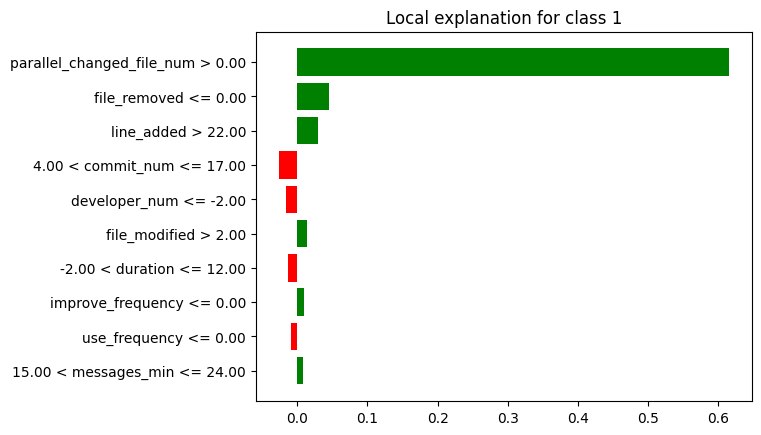

In [ ]:
lime_fp_min.plot()

In [ ]:
breakdown_fp_df_min = breakdown_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_min = breakdown_fp_df_min.drop(index=[0, 26])
breakdown_fp_df_min['sign'] = breakdown_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_min = breakdown_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_min = shap_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_min = shap_fp_df_min.tail(25)
shap_fp_df_min['sign'] = shap_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_min = shap_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_min["Variable"] = lime_fp_df_min["variable"].str.split(" ").str[0]
lime_fp_df_min["Signo"] = lime_fp_df_min["effect"].apply(evaluar_valor)
lime_fp_df_min = lime_fp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_min = lime_fp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_min['Ranking'] = breakdown_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_min = breakdown_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_min['Ranking'] = shap_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_min = shap_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_min['Ranking'] = lime_fp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_min = lime_fp_df_min.head(5)
lime_fp_df_min = lime_fp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fp_df_min = breakdown_fp_df_min.drop(columns=['contribution'])
shap_fp_df_min = shap_fp_df_min.drop(columns=['contribution'])
lime_fp_df_min = lime_fp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_min = breakdown_fp_df_min.head(5)
breakdown_fp_df_min = breakdown_fp_df_min.reset_index(drop=True)

shap_fp_df_min = shap_fp_df_min.head(5)
shap_fp_df_min = shap_fp_df_min.reset_index(drop=True)

lime_fp_df_min = lime_fp_df_min.reset_index(drop=True)
lime_fp_df_min.at[3, 'Variable'] = 'commit_num'

print(breakdown_fp_df_min)
print(shap_fp_df_min)
print(lime_fp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2             commit_density        3  Positivo
3                 line_added        4  Positivo
4               messages_min        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1             commit_density        2  Positivo
2              developer_num        3  Negativo
3              file_modified        4  Positivo
4                 line_added        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               file_removed        2  Positivo
2                 line_added        3  Positivo
3                 commit_num        4  Negativo
4              developer_num        5  Negativo


In [ ]:
#lime_fp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_min['Variable'])
shapley_features = list(shap_fp_df_min['Variable'])
lime_features = list(lime_fp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_min[breakdown_fp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_min[shap_fp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_min[lime_fp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'developer_num', 'commit_density', 'line_added', 'messages_min']
['parallel_changed_file_num', 'commit_density', 'developer_num', 'file_modified', 'line_added']
['parallel_changed_file_num', 'file_removed', 'line_added', 'commit_num', 'developer_num']
['commit_density', 'line_added', 'developer_num', 'commit_num', 'file_removed', 'parallel_changed_file_num', 'messages_min', 'file_modified']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0             commit_density         3  Positivo       2  Positivo       -   
1                 line_added         4  Positivo       5  Positivo       3   
2              developer_num         2  Negativo       3  Negativo       5   
3                 commit_num         -         -       -         -       4   
4               file_removed         -         -       -         -       2   
5  parallel_changed_file_num         1  Positivo       1  Positivo       1   
6               messages_min         5  Positivo       -         -       -   
7              file_modified         -         -       4  Positivo       -   

             
      Signo  
0         -  
1  Positivo  
2  Negativo  
3  Negativo  
4  Positivo  
5  Positivo  
6         -  
7         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "commit_density", "line_added", "messages_min", "file_modified", "file_removed", "commit_num"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Negativo       3  Negativo       5   
commit_density                    3  Positivo       2  Positivo       -   
line_added                        4  Positivo       5  Positivo       3   
messages_min                      5  Positivo       -         -       -   
file_modified                     -         -       4  Positivo       -   
file_removed                      -         -       -         -       2   
commit_num                        -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Negativo  
commit_density                    -  
line_added                 Positivo  
messages_min                      -  
file_modified                     -  
file_removed               Positivo  
commit_num                 Negativo

### **FP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('duration', 2), ('developer_num', 3), ('commit_num', 4), ('commit_density', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('file_modified', 3), ('line_removed', 4), ('developer_num', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_density', 3), ('line_added', 4), ('messages_min', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('duration', 2), ('developer_num', 4), ('commit_num', 3), ('line_removed', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('file_modified', 3), ('line_removed', 4), ('developer_num', 5), ('parallel_changed_file_num', 1), ('developer_num', 3), ('commit_density', 2), ('line_added', 5), ('file_modified', 4)], 'Lime': [('parallel_changed_file_num', 1), ('duration', 5), ('commit_num', 2), ('file_modified', 3), ('file_removed', 4), ('parallel_changed_file_num', 1), ('commit_num', 2), ('file_modified', 3), ('line_removed', 5), ('file_removed', 4), ('parallel_changed_file_num',

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_gb_fp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_gb_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_modified                       3.0      1           3.5      2   
parallel_changed_file_num           1.0      3           1.0      3   
messages_min                        5.0      1             -      -   
file_removed                          -      -             -      -   
duration                            2.0      1           2.0      1   
commit_num                          3.0      2           2.5      2   
developer_num                  3.333333      3           4.0      3   
line_added                          4.0      1           5.0      1   
line_removed                        4.0      1           4.5      2   
commit_density                      4.0      2           2.0      1   

                                   Lime         
                          Ranking Medio Conteo  
file_modified                       3.0      2  
parallel_changed_file_num           1.0      3  
messages_min                          -      -  
file_removed                   3.333333      3  
duration                            5.0      1  
commit_num                     2.666667      3  
developer_num                       5.0      1  
line_added                          3.0      1  
line_removed                        5.0      1  
commit_density                        -      -

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_gb_fp[("General", "Ranking")] = df_resumen_gb_fp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_gb_fp[("General", "Conteo Total")] = df_resumen_gb_fp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_gb_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_modified                       3.0      1           3.5      2   
parallel_changed_file_num           1.0      3           1.0      3   
messages_min                        5.0      1             -      -   
file_removed                          -      -             -      -   
duration                            2.0      1           2.0      1   
commit_num                          3.0      2           2.5      2   
developer_num                  3.333333      3           4.0      3   
line_added                          4.0      1           5.0      1   
line_removed                        4.0      1           4.5      2   
commit_density                      4.0      2           2.0      1   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
file_modified                       3.0      2  3.166667            5  
parallel_changed_file_num           1.0      3  1.000000            9  
messages_min                          -      -  5.000000            1  
file_removed                   3.333333      3  3.333333            3  
duration                            5.0      1  3.000000            3  
commit_num                     2.666667      3  2.722222            7  
developer_num                       5.0      1  4.111111            7  
line_added                          3.0      1  4.000000            3  
line_removed                        5.0      1  4.500000            4  
commit_density                        -      -  3.000000            3

In [ ]:
# Obtener el número de características
num_caract = df_resumen_gb_fp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_gb_fp[("General", "Peso Rango")] = 1 - ((df_resumen_gb_fp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_gb_fp[("General", "Peso Conteo")] = df_resumen_gb_fp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_gb_fp[("General", "Puntaje")] = df_resumen_gb_fp[("General", "Peso Rango")] + df_resumen_gb_fp[("General", "Peso Conteo")]
df_resumen_gb_fp[("General", "Ranking")] = df_resumen_gb_fp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_gb_fp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_gb_fp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_gb_fp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_gb_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_modified                       3.0      1           3.5      2   
parallel_changed_file_num           1.0      3           1.0      3   
messages_min                        5.0      1             -      -   
file_removed                          -      -             -      -   
duration                            2.0      1           2.0      1   
commit_num                          3.0      2           2.5      2   
developer_num                  3.333333      3           4.0      3   
line_added                          4.0      1           5.0      1   
line_removed                        4.0      1           4.5      2   
commit_density                      4.0      2           2.0      1   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
file_modified                       3.0      2     3.0            5  
parallel_changed_file_num           1.0      3     1.0            9  
messages_min                          -      -    10.0            1  
file_removed                   3.333333      3     7.0            3  
duration                            5.0      1     5.0            3  
commit_num                     2.666667      3     2.0            7  
developer_num                       5.0      1     4.0            7  
line_added                          3.0      1     9.0            3  
line_removed                        5.0      1     8.0            4  
commit_density                        -      -     5.0            3

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_gb_fp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_gb_fp = df_resumen_gb_fp[new_columns]

In [ ]:
df_resumen_gb_fp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_gb_fp[(tech, "Ranking Medio")] = df_resumen_gb_fp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_gb_fp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
commit_num                    2.0            7          3.00      2   
file_modified                 3.0            5          3.00      1   
developer_num                 4.0            7          3.33      3   
duration                      5.0            3          2.00      1   
commit_density                5.0            3          4.00      2   
file_removed                  7.0            3             -      -   
line_removed                  8.0            4          4.00      1   
line_added                    9.0            3          4.00      1   
messages_min                 10.0            1          5.00      1   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         2.50      2          2.67      3  
file_modified                      3.50      2          3.00      2  
developer_num                      4.00      3          5.00      1  
duration                           2.00      1          5.00      1  
commit_density                     2.00      1             -      -  
file_removed                          -      -          3.33      3  
line_removed                       4.50      2          5.00      1  
line_added                         5.00      1          3.00      1  
messages_min                          -      -             -      -

### **Instancia FN MAX:**

In [ ]:
breakdown_fn_max = exp.predict_parts(df_instancia_fn_max, type="break_down",random_state=42)
shap_fn_max = exp.predict_parts(df_instancia_fn_max, type="shap",random_state=42)
lime_fn_max = exp.predict_surrogate(df_instancia_fn_max, random_state=42)

breakdown_fn_df_max = breakdown_fn_max.result
shap_fn_df_max = shap_fn_max.result
lime_fn_df_max=lime_fn_max.result

In [ ]:
breakdown_fn_max.plot()

In [ ]:
shap_fn_max.plot()

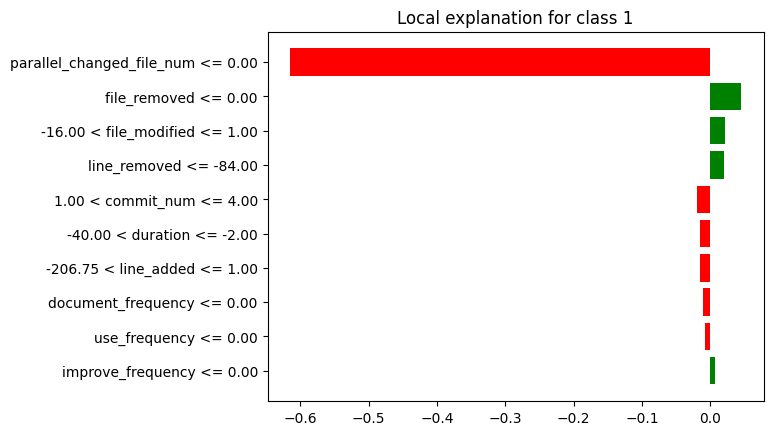

In [ ]:
lime_fn_max.plot()

In [ ]:
breakdown_fn_df_max = breakdown_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_max = breakdown_fn_df_max.drop(index=[0, 26])
breakdown_fn_df_max['sign'] = breakdown_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_max = breakdown_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_max = shap_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_max = shap_fn_df_max.tail(25)
shap_fn_df_max['sign'] = shap_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_max = shap_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_max["Variable"] = lime_fn_df_max["variable"].str.split(" ").str[0]
lime_fn_df_max["Signo"] = lime_fn_df_max["effect"].apply(evaluar_valor)
lime_fn_df_max = lime_fn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_max = lime_fn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_max['Ranking'] = breakdown_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_max = breakdown_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_max['Ranking'] = shap_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_max = shap_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_max['Ranking'] = lime_fn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_max = lime_fn_df_max.head(5)
lime_fn_df_max = lime_fn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fn_df_max = breakdown_fn_df_max.drop(columns=['contribution'])
shap_fn_df_max = shap_fn_df_max.drop(columns=['contribution'])
lime_fn_df_max = lime_fn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_max = breakdown_fn_df_max.head(5)
breakdown_fn_df_max = breakdown_fn_df_max.reset_index(drop=True)

shap_fn_df_max = shap_fn_df_max.head(5)
shap_fn_df_max = shap_fn_df_max.reset_index(drop=True)

lime_fn_df_max = lime_fn_df_max.reset_index(drop=True)
lime_fn_df_max.at[2, 'Variable'] = 'file_modified'
lime_fn_df_max.at[4, 'Variable'] = 'commit_num'

print(breakdown_fn_df_max)
print(shap_fn_df_max)
print(lime_fn_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3                   duration        4  Negativo
4               line_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Positivo
2                 commit_num        3  Negativo
3                   duration        4  Negativo
4               line_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               file_removed        2  Positivo
2              file_modified        3  Positivo
3               line_removed        4  Positivo
4                 commit_num        5  Negativo


In [ ]:
#lime_fn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_max['Variable'])
shapley_features = list(shap_fn_df_max['Variable'])
lime_features = list(lime_fn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_max[breakdown_fn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_max[shap_fn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_max[lime_fn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'developer_num', 'duration', 'line_removed']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'duration', 'line_removed']
['parallel_changed_file_num', 'file_removed', 'file_modified', 'line_removed', 'commit_num']
['file_removed', 'line_removed', 'developer_num', 'commit_num', 'duration', 'parallel_changed_file_num', 'file_modified']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       2   
1               line_removed         5  Negativo       5  Negativo       4   
2              developer_num         3  Positivo       2  Positivo       -   
3                 commit_num         2  Negativo       3  Negativo       5   
4                   duration         4  Negativo       4  Negativo       -   
5  parallel_changed_file_num         1  Negativo       1  Negativo       1   
6              file_modified         -         -       -         -       3   

             
      Signo  
0  Positivo  
1  Positivo  
2         -  
3  Negativo  
4         -  
5  Negativo  
6  Positivo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "duration", "line_removed", "file_removed", "file_modified"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
commit_num                        2  Negativo       3  Negativo       5   
developer_num                     3  Positivo       2  Positivo       -   
duration                          4  Negativo       4  Negativo       -   
line_removed                      5  Negativo       5  Negativo       4   
file_removed                      -         -       -         -       2   
file_modified                     -         -       -         -       3   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
commit_num                 Negativo  
developer_num                     -  
duration                          -  
line_removed               Positivo  
file_removed               Positivo  
file_modified              Positivo

### **Instancia FN MEDIANA:**

In [ ]:
breakdown_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="break_down",random_state=42)
shap_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="shap",random_state=42)
lime_fn_mediana = exp.predict_surrogate(df_instancia_fn_mediana, random_state=42)

breakdown_fn_df_mediana = breakdown_fn_mediana.result
shap_fn_df_mediana = shap_fn_mediana.result
lime_fn_df_mediana=lime_fn_mediana.result

In [ ]:
breakdown_fn_mediana.plot()

In [ ]:
shap_fn_mediana.plot()

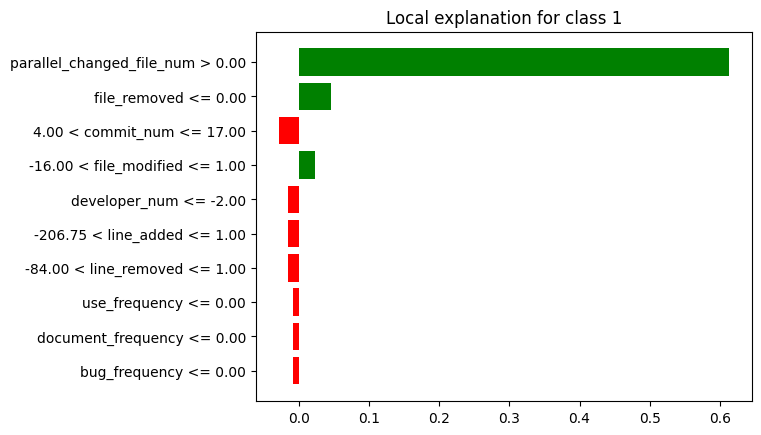

In [ ]:
lime_fn_mediana.plot()

In [ ]:
breakdown_fn_df_mediana = breakdown_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(index=[0, 26])
breakdown_fn_df_mediana['sign'] = breakdown_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_mediana = breakdown_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_mediana = shap_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_mediana = shap_fn_df_mediana.tail(25)
shap_fn_df_mediana['sign'] = shap_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_mediana = shap_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_mediana["Variable"] = lime_fn_df_mediana["variable"].str.split(" ").str[0]
lime_fn_df_mediana["Signo"] = lime_fn_df_mediana["effect"].apply(evaluar_valor)
lime_fn_df_mediana = lime_fn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_mediana['Ranking'] = breakdown_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_mediana = breakdown_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_mediana['Ranking'] = shap_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_mediana = shap_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_mediana['Ranking'] = lime_fn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_mediana = lime_fn_df_mediana.head(5)
lime_fn_df_mediana = lime_fn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(columns=['contribution'])
shap_fn_df_mediana = shap_fn_df_mediana.drop(columns=['contribution'])
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_mediana = breakdown_fn_df_mediana.head(5)
breakdown_fn_df_mediana = breakdown_fn_df_mediana.reset_index(drop=True)

shap_fn_df_mediana = shap_fn_df_mediana.head(5)
shap_fn_df_mediana = shap_fn_df_mediana.reset_index(drop=True)

lime_fn_df_mediana = lime_fn_df_mediana.reset_index(drop=True)
lime_fn_df_mediana.at[2, 'Variable'] = 'commit_num'
lime_fn_df_mediana.at[3, 'Variable'] = 'file_modified'

print(breakdown_fn_df_mediana)
print(shap_fn_df_mediana)
print(lime_fn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                   duration        3  Negativo
3                 commit_num        4  Negativo
4              messages_mean        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Negativo
3                   duration        4  Negativo
4               line_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               file_removed        2  Positivo
2                 commit_num        3  Negativo
3              file_modified        4  Positivo
4              developer_num        5  Negativo


In [ ]:
#lime_fn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_mediana['Variable'])
shapley_features = list(shap_fn_df_mediana['Variable'])
lime_features = list(lime_fn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_mediana[breakdown_fn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_mediana[shap_fn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_mediana[lime_fn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'developer_num', 'duration', 'commit_num', 'messages_mean']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'duration', 'line_removed']
['parallel_changed_file_num', 'file_removed', 'commit_num', 'file_modified', 'developer_num']
['file_removed', 'line_removed', 'messages_mean', 'developer_num', 'commit_num', 'duration', 'parallel_changed_file_num', 'file_modified']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       2   
1               line_removed         -         -       5  Negativo       -   
2              messages_mean         5  Negativo       -         -       -   
3              developer_num         2  Negativo       2  Negativo       5   
4                 commit_num         4  Negativo       3  Negativo       3   
5                   duration         3  Negativo       4  Negativo       -   
6  parallel_changed_file_num         1  Positivo       1  Positivo       1   
7              file_modified         -         -       -         -       4   

             
      Signo  
0  Positivo  
1         -  
2         -  
3  Negativo  
4  Negativo  
5         -  
6  Positivo  
7  Positivo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "duration", "commit_num","messages_mean", "line_removed", "file_removed", "file_modified"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Negativo       2  Negativo       5   
duration                          3  Negativo       4  Negativo       -   
commit_num                        4  Negativo       3  Negativo       3   
messages_mean                     5  Negativo       -         -       -   
line_removed                      -         -       5  Negativo       -   
file_removed                      -         -       -         -       2   
file_modified                     -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Negativo  
duration                          -  
commit_num                 Negativo  
messages_mean                     -  
line_removed                      -  
file_removed               Positivo  
file_modified              Positivo

### **Instancia FN MIN:**

In [ ]:
breakdown_fn_min = exp.predict_parts(df_instancia_fn_min, type="break_down",random_state=42)
shap_fn_min = exp.predict_parts(df_instancia_fn_min, type="shap",random_state=42)
lime_fn_min = exp.predict_surrogate(df_instancia_fn_min, random_state=42)

breakdown_fn_df_min = breakdown_fn_min.result
shap_fn_df_min = shap_fn_min.result
lime_fn_df_min = lime_fn_min.result

In [ ]:
breakdown_fn_min.plot()

In [ ]:
shap_fn_min.plot()

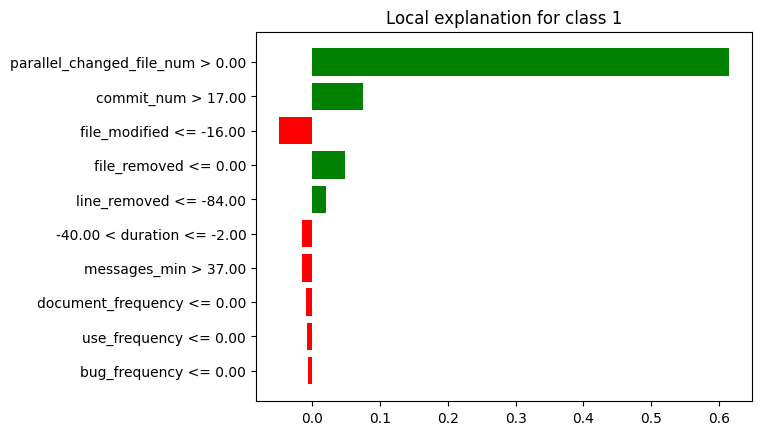

In [ ]:
lime_fn_min.plot()

In [ ]:
breakdown_fn_df_min = breakdown_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_min = breakdown_fn_df_min.drop(index=[0, 26])
breakdown_fn_df_min['sign'] = breakdown_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_min = breakdown_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_min = shap_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_min = shap_fn_df_min.tail(25)
shap_fn_df_min['sign'] = shap_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_min = shap_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_min["Variable"] = lime_fn_df_min["variable"].str.split(" ").str[0]
lime_fn_df_min["Signo"] = lime_fn_df_min["effect"].apply(evaluar_valor)
lime_fn_df_min = lime_fn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_min = lime_fn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_min['Ranking'] = breakdown_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_min = breakdown_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_min['Ranking'] = shap_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_min = shap_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_min['Ranking'] = lime_fn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_min = lime_fn_df_min.head(5)
lime_fn_df_min = lime_fn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fn_df_min = breakdown_fn_df_min.drop(columns=['contribution'])
shap_fn_df_min = shap_fn_df_min.drop(columns=['contribution'])
lime_fn_df_min = lime_fn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_min = breakdown_fn_df_min.head(5)
breakdown_fn_df_min = breakdown_fn_df_min.reset_index(drop=True)

shap_fn_df_min = shap_fn_df_min.head(5)
shap_fn_df_min = shap_fn_df_min.reset_index(drop=True)

lime_fn_df_min = lime_fn_df_min.reset_index(drop=True)

print(breakdown_fn_df_min)
print(shap_fn_df_min)
print(lime_fn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1             commit_density        2  Negativo
2              developer_num        3  Positivo
3              messages_mean        4  Positivo
4                 commit_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1             commit_density        2  Negativo
2              developer_num        3  Positivo
3              messages_mean        4  Positivo
4              file_modified        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              file_modified        3  Negativo
3               file_removed        4  Positivo
4               line_removed        5  Positivo


In [ ]:
#lime_fn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_min['Variable'])
shapley_features = list(shap_fn_df_min['Variable'])
lime_features = list(lime_fn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_min[breakdown_fn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_min[shap_fn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_min[lime_fn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'commit_density', 'developer_num', 'messages_mean', 'commit_num']
['parallel_changed_file_num', 'commit_density', 'developer_num', 'messages_mean', 'file_modified']
['parallel_changed_file_num', 'commit_num', 'file_modified', 'file_removed', 'line_removed']
['commit_density', 'line_removed', 'messages_mean', 'developer_num', 'commit_num', 'file_removed', 'parallel_changed_file_num', 'file_modified']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0             commit_density         2  Negativo       2  Negativo       -   
1               line_removed         -         -       -         -       5   
2              messages_mean         4  Positivo       4  Positivo       -   
3              developer_num         3  Positivo       3  Positivo       -   
4                 commit_num         5  Positivo       -         -       2   
5               file_removed         -         -       -         -       4   
6  parallel_changed_file_num         1  Positivo       1  Positivo       1   
7              file_modified         -         -       5  Negativo       3   

             
      Signo  
0         -  
1  Positivo  
2         -  
3         -  
4  Positivo  
5  Positivo  
6  Positivo  
7  Negativo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_density", "developer_num", "messages_mean", "commit_num", "file_modified", "file_removed", "line_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_density                    2  Negativo       2  Negativo       -   
developer_num                     3  Positivo       3  Positivo       -   
messages_mean                     4  Positivo       4  Positivo       -   
commit_num                        5  Positivo       -         -       2   
file_modified                     -         -       5  Negativo       3   
file_removed                      -         -       -         -       4   
line_removed                      -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_density                    -  
developer_num                     -  
messages_mean                     -  
commit_num                 Positivo  
file_modified              Negativo  
file_removed               Positivo  
line_removed               Positivo

### **FN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('duration', 4), ('line_removed', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('duration', 3), ('commit_num', 4), ('messages_mean', 5), ('parallel_changed_file_num', 1), ('commit_density', 2), ('developer_num', 3), ('messages_mean', 4), ('commit_num', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 3), ('developer_num', 2), ('duration', 4), ('line_removed', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('duration', 4), ('commit_num', 3), ('line_removed', 5), ('parallel_changed_file_num', 1), ('commit_density', 2), ('developer_num', 3), ('messages_mean', 4), ('file_modified', 5)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 5), ('line_removed', 4), ('file_removed', 2), ('file_modified', 3), ('parallel_changed_file_num', 1), ('developer_num', 5), ('commit_num', 3), ('file_removed', 2), ('file_modified', 4), ('parallel_changed_file_num', 1

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_gb_fn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_gb_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_modified                         -      -           5.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
file_removed                          -      -             -      -   
duration                            3.5      2           4.0      2   
commit_num                     3.666667      3           3.0      2   
developer_num                  2.666667      3      2.333333      3   
messages_mean                       4.5      2           4.0      1   
line_removed                        5.0      1           5.0      2   
commit_density                      2.0      1           2.0      1   

                                   Lime         
                          Ranking Medio Conteo  
file_modified                  3.333333      3  
parallel_changed_file_num           1.0      3  
file_removed                   2.666667      3  
duration                              -      -  
commit_num                     3.333333      3  
developer_num                       5.0      1  
messages_mean                         -      -  
line_removed                        4.5      2  
commit_density                        -      -

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_gb_fn[("General", "Ranking")] = df_resumen_gb_fn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_gb_fn[("General", "Conteo Total")] = df_resumen_gb_fn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_gb_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_modified                         -      -           5.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
file_removed                          -      -             -      -   
duration                            3.5      2           4.0      2   
commit_num                     3.666667      3           3.0      2   
developer_num                  2.666667      3      2.333333      3   
messages_mean                       4.5      2           4.0      1   
line_removed                        5.0      1           5.0      2   
commit_density                      2.0      1           2.0      1   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
file_modified                  3.333333      3  4.166667            4  
parallel_changed_file_num           1.0      3  1.000000            9  
file_removed                   2.666667      3  2.666667            3  
duration                              -      -  3.750000            4  
commit_num                     3.333333      3  3.333333            8  
developer_num                       5.0      1  3.333333            7  
messages_mean                         -      -  4.250000            3  
line_removed                        4.5      2  4.833333            5  
commit_density                        -      -  2.000000            2

In [ ]:
# Obtener el número de características
num_caract = df_resumen_gb_fn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_gb_fn[("General", "Peso Rango")] = 1 - ((df_resumen_gb_fn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_gb_fn[("General", "Peso Conteo")] = df_resumen_gb_fn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_gb_fn[("General", "Puntaje")] = df_resumen_gb_fn[("General", "Peso Rango")] + df_resumen_gb_fn[("General", "Peso Conteo")]
df_resumen_gb_fn[("General", "Ranking")] = df_resumen_gb_fn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_gb_fn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_gb_fn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_gb_fn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_gb_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
file_modified                         -      -           5.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
file_removed                          -      -             -      -   
duration                            3.5      2           4.0      2   
commit_num                     3.666667      3           3.0      2   
developer_num                  2.666667      3      2.333333      3   
messages_mean                       4.5      2           4.0      1   
line_removed                        5.0      1           5.0      2   
commit_density                      2.0      1           2.0      1   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
file_modified                  3.333333      3     7.0            4  
parallel_changed_file_num           1.0      3     1.0            9  
file_removed                   2.666667      3     4.0            3  
duration                              -      -     6.0            4  
commit_num                     3.333333      3     2.0            8  
developer_num                       5.0      1     3.0            7  
messages_mean                         -      -     9.0            3  
line_removed                        4.5      2     8.0            5  
commit_density                        -      -     5.0            2

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_gb_fn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_gb_fn = df_resumen_gb_fn[new_columns]

In [ ]:
df_resumen_gb_fn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_gb_fn[(tech, "Ranking Medio")] = df_resumen_gb_fn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_gb_fn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
commit_num                    2.0            8          3.67      3   
developer_num                 3.0            7          2.67      3   
file_removed                  4.0            3             -      -   
commit_density                5.0            2          2.00      1   
duration                      6.0            4          3.50      2   
file_modified                 7.0            4             -      -   
line_removed                  8.0            5          5.00      1   
messages_mean                 9.0            3          4.50      2   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         3.00      2          3.33      3  
developer_num                      2.33      3          5.00      1  
file_removed                          -      -          2.67      3  
commit_density                     2.00      1             -      -  
duration                           4.00      2             -      -  
file_modified                      5.00      1          3.33      3  
line_removed                       5.00      2          4.50      2  
messages_mean                      4.00      1             -      -

## **AdaBoosting:**

**FEATURE IMPORTANCE**

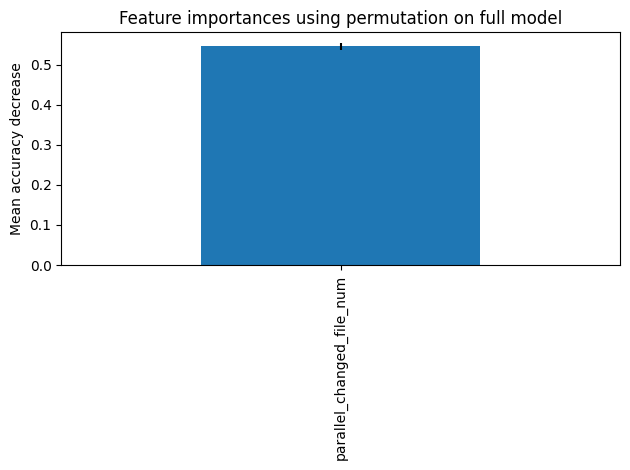

In [ ]:
permu = permutation_importance(modelo_ada, x_test, y_test, n_repeats=20, random_state=42, n_jobs=2, scoring='f1')

# Umbral para valores significativos
importance_threshold = 0.01

# Filtrar los caracteristicas
significant_indices = permu.importances_mean > importance_threshold
permu_importances = pd.Series(permu.importances_mean.round(3), index=feature_names)[significant_indices]
permu_std = permu.importances_std[significant_indices]

# Crear la representación gráfica
fig, ax = plt.subplots()
permu_importances.plot.bar(yerr=permu_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

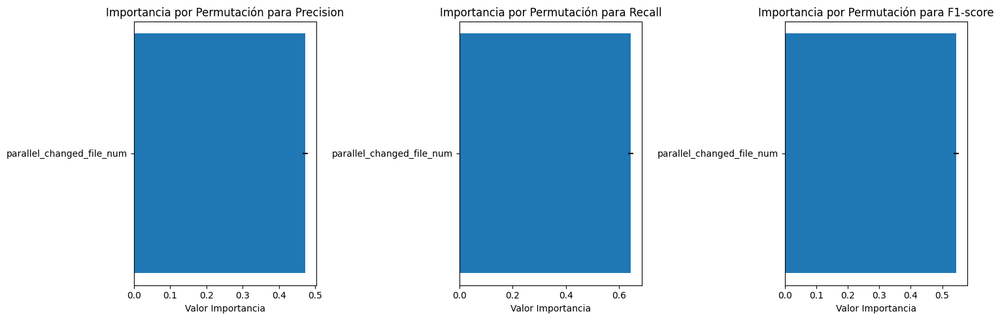

In [ ]:
scoring = ['precision', 'recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

permu_score = permutation_importance(modelo_ada, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Umbral para importancias significativas
importance_threshold = 0.01

# Itera a través de las métricas
for i, metric in enumerate(scoring):
    permu = permu_score[metric]

    # Filtra las características que cumplen la condición del umbral
    significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
    sorted_feature_names = [feature_names[j] for j in significant_indices]
    importances_mean = permu.importances_mean[significant_indices]
    importances_std = permu.importances_std[significant_indices]

    # Ordena los datos por importancia de mayor a menor
    sorted_indices = np.argsort(importances_mean)[::1]
    sorted_feature_names = [sorted_feature_names[j] for j in sorted_indices]
    importances_mean = importances_mean[sorted_indices]
    importances_std = importances_std[sorted_indices]

    # Crea la representación gráfica en el subplot correspondiente
    axs[i].barh(range(len(sorted_feature_names)), importances_mean, xerr=importances_std, align='center')
    axs[i].set_yticks(range(len(sorted_feature_names)))
    axs[i].set_yticklabels(sorted_feature_names)
    axs[i].set_xlabel('Valor Importancia')
    axs[i].set_title(f'Importancia por Permutación para {metric_names[i]}')

# Ajusta los espacios entre subplots y muestra la figura
plt.tight_layout()
plt.show()

In [ ]:
scoring = ['precision','recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

# Umbral para importancias significativas
importance_threshold = 0.01

# Crea un diccionario para almacenar los DataFrames
results_global_ada = {}

permu_score = permutation_importance(modelo_ada, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
for i, metric in enumerate(scoring):
  permu = permu_score[metric]

  # Filtra las características que cumplen la condición
  significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
  sorted_feature_names = [feature_names[j] for j in significant_indices]
  importances_mean = permu.importances_mean[significant_indices]
  importances_std = permu.importances_std[significant_indices]

  # Crear un DataFrame con los resultados
  df_exp_global = pd.DataFrame({'Feature': sorted_feature_names,
                       'Importance_Mean': importances_mean,
                       'Importance_Std': importances_std})

  # Ordenar el DataFrame por importance_mean en orden descendente
  df_exp_global = df_exp_global.sort_values(by='Importance_Mean', ascending=False)

  # Asignar el DataFrame al diccionario con el nombre de la métrica
  results_global_ada[f'df_global_{metric_names[i]}'] = df_exp_global

In [ ]:
results_global_ada['df_global_Precision']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.472056,0.006647


In [ ]:
results_global_ada['df_global_Recall']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.643949,0.009067


In [ ]:
results_global_ada['df_global_F1-score']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.544765,0.00767


**BREAK-DOWN, SHAP Y LIME:**

In [ ]:
#primero definimos el explainer
exp = dx.Explainer(modelo_ada, x_train, y_train)

Preparation of a new explainer is initiated

  -> data              : 28090 rows 25 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 28090 values
  -> model_class       : sklearn.ensemble._weight_boosting.AdaBoostClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x7ea4d39cf130> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.089, mean = 0.178, max = 0.551
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.551, mean = -0.102, max = 0.911
  -> model_info        : package sklearn

A new explainer has been created!


### **Instancia VP MAX:**

In [ ]:
breakdown_vp_max = exp.predict_parts(df_instancia_vp_max, type="break_down",random_state=42)
shap_vp_max = exp.predict_parts(df_instancia_vp_max, type="shap",random_state=42)
lime_vp_max = exp.predict_surrogate(df_instancia_vp_max, random_state=42)

breakdown_vp_df_max = breakdown_vp_max.result
shap_vp_df_max = shap_vp_max.result
lime_vp_df_max=lime_vp_max.result

In [ ]:
breakdown_vp_max.plot()

In [ ]:
shap_vp_max.plot()

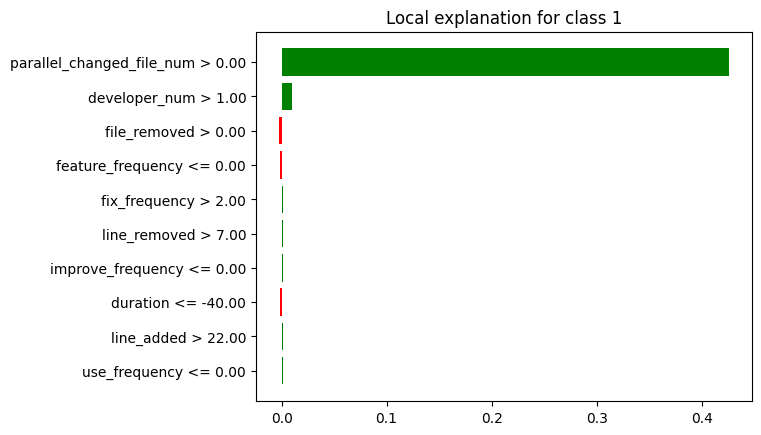

In [ ]:
lime_vp_max.plot()

In [ ]:
breakdown_vp_df_max = breakdown_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_max = breakdown_vp_df_max.drop(index=[0, 26])
breakdown_vp_df_max['sign'] = breakdown_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_max = breakdown_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_max = shap_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_max = shap_vp_df_max.tail(25)
shap_vp_df_max['sign'] = shap_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_max = shap_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_max["Variable"] = lime_vp_df_max["variable"].str.split(" ").str[0]
lime_vp_df_max["Signo"] = lime_vp_df_max["effect"].apply(evaluar_valor)
lime_vp_df_max = lime_vp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_max = lime_vp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_max['Ranking'] = breakdown_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_max = breakdown_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_max['Ranking'] = shap_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_max = shap_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_max['Ranking'] = lime_vp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_max = lime_vp_df_max.head(5)
lime_vp_df_max = lime_vp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_max = breakdown_vp_df_max.drop(columns=['contribution'])
shap_vp_df_max = shap_vp_df_max.drop(columns=['contribution'])
lime_vp_df_max = lime_vp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_max = breakdown_vp_df_max.head(5)
breakdown_vp_df_max = breakdown_vp_df_max.reset_index(drop=True)

shap_vp_df_max = shap_vp_df_max.head(5)
shap_vp_df_max = shap_vp_df_max.reset_index(drop=True)

lime_vp_df_max = lime_vp_df_max.reset_index(drop=True)

print(breakdown_vp_df_max)
print(shap_vp_df_max)
print(lime_vp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2               messages_max       14      Nulo
3               messages_min       14      Nulo
4              use_frequency       14      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2               file_removed       14      Nulo
3           change_frequency       14      Nulo
4             commit_density       14      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2               file_removed        3  Negativo
3          feature_frequency        4  Negativo
4              fix_frequency        5  Positivo


In [ ]:
#lime_vp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_max['Variable'])
shapley_features = list(shap_vp_df_max['Variable'])
lime_features = list(lime_vp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_max[breakdown_vp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_max[shap_vp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_max[lime_vp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'developer_num', 'messages_max', 'messages_min', 'use_frequency']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'change_frequency', 'commit_density']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'feature_frequency', 'fix_frequency']
['file_removed', 'change_frequency', 'commit_density', 'developer_num', 'fix_frequency', 'messages_max', 'parallel_changed_file_num', 'messages_min', 'feature_frequency', 'use_frequency']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -      14      Nulo       3   
1           change_frequency         -         -      14      Nulo       -   
2             commit_density         -         -      14      Nulo       -   
3              developer_num         2  Positivo       2  Positivo       2   
4              fix_frequency         -         -       -         -       5   
5               messages_max        14      Nulo       -         -       -   
6  parallel_changed_file_num         1  Positivo       1  Positivo       1   
7               messages_min        14      Nulo       -         -       -   
8          feature_frequency         -         -       -         -       4   
9              use_frequency        14      Nulo       -         -       -   

             
      Signo  
0  Negativo  
1         -  
2         -  
3  Positivo  
4  Positivo  
5         -  
6  Positivo  
7         -  
8  Negativo  
9         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "file_removed", "feature_frequency","fix_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Positivo       2  Positivo       2   
file_removed                      -         -      14      Nulo       3   
feature_frequency                 -         -       -         -       4   
fix_frequency                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Positivo  
file_removed               Negativo  
feature_frequency          Negativo  
fix_frequency              Positivo

### **Instancia VP MEDIANA:**

In [ ]:
breakdown_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="break_down",random_state=42)
shap_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="shap",random_state=42)
lime_vp_mediana = exp.predict_surrogate(df_instancia_vp_mediana, random_state=42)

breakdown_vp_df_mediana = breakdown_vp_mediana.result
shap_vp_df_mediana = shap_vp_mediana.result
lime_vp_df_mediana=lime_vp_mediana.result

In [ ]:
breakdown_vp_mediana.plot()

In [ ]:
shap_vp_mediana.plot()

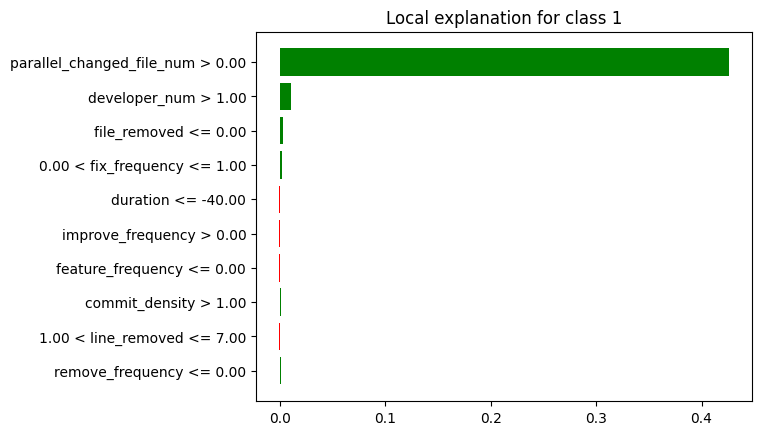

In [ ]:
lime_vp_mediana.plot()

In [ ]:
breakdown_vp_df_mediana = breakdown_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(index=[0, 26])
breakdown_vp_df_mediana['sign'] = breakdown_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_mediana = breakdown_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_mediana = shap_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_mediana = shap_vp_df_mediana.tail(25)
shap_vp_df_mediana['sign'] = shap_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_mediana = shap_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_mediana["Variable"] = lime_vp_df_mediana["variable"].str.split(" ").str[0]
lime_vp_df_mediana["Signo"] = lime_vp_df_mediana["effect"].apply(evaluar_valor)
lime_vp_df_mediana = lime_vp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_mediana['Ranking'] = breakdown_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_mediana = breakdown_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_mediana['Ranking'] = shap_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_mediana = shap_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_mediana['Ranking'] = lime_vp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_mediana = lime_vp_df_mediana.head(5)
lime_vp_df_mediana = lime_vp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(columns=['contribution'])
shap_vp_df_mediana = shap_vp_df_mediana.drop(columns=['contribution'])
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_mediana = breakdown_vp_df_mediana.head(5)
breakdown_vp_df_mediana = breakdown_vp_df_mediana.reset_index(drop=True)

shap_vp_df_mediana = shap_vp_df_mediana.head(5)
shap_vp_df_mediana = shap_vp_df_mediana.reset_index(drop=True)

lime_vp_df_mediana = lime_vp_df_mediana.reset_index(drop=True)
lime_vp_df_mediana.at[3, 'Variable'] = 'fix_frequency'

print(breakdown_vp_df_mediana)
print(shap_vp_df_mediana)
print(lime_vp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2               messages_max       14      Nulo
3               messages_min       14      Nulo
4              use_frequency       14      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2               file_removed       14      Nulo
3           change_frequency       14      Nulo
4             commit_density       14      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2               file_removed        3  Positivo
3              fix_frequency        4  Positivo
4                   duration        5  Negativo


In [ ]:
#lime_vp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_mediana['Variable'])
shapley_features = list(shap_vp_df_mediana['Variable'])
lime_features = list(lime_vp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_mediana[breakdown_vp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_mediana[shap_vp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_mediana[lime_vp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'developer_num', 'messages_max', 'messages_min', 'use_frequency']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'change_frequency', 'commit_density']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'fix_frequency', 'duration']
['file_removed', 'change_frequency', 'commit_density', 'developer_num', 'duration', 'fix_frequency', 'messages_max', 'parallel_changed_file_num', 'messages_min', 'use_frequency']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -      14      Nulo       3   
1           change_frequency         -         -      14      Nulo       -   
2             commit_density         -         -      14      Nulo       -   
3              developer_num         2  Positivo       2  Positivo       2   
4                   duration         -         -       -         -       5   
5              fix_frequency         -         -       -         -       4   
6               messages_max        14      Nulo       -         -       -   
7  parallel_changed_file_num         1  Positivo       1  Positivo       1   
8               messages_min        14      Nulo       -         -       -   
9              use_frequency        14      Nulo       -         -       -   

             
      Signo  
0  Positivo  
1         -  
2         -  
3  Positivo  
4  Negativo  
5  Positivo  
6         -  
7  Positivo  
8         -  
9         -

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "file_removed", "fix_frequency", "duration"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Positivo       2  Positivo       2   
file_removed                      -         -      14      Nulo       3   
fix_frequency                     -         -       -         -       4   
duration                          -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Positivo  
file_removed               Positivo  
fix_frequency              Positivo  
duration                   Negativo

### **Instancia VP MIN:**

In [ ]:
breakdown_vp_min = exp.predict_parts(df_instancia_vp_min, type="break_down",random_state=42)
shap_vp_min = exp.predict_parts(df_instancia_vp_min, type="shap",random_state=42)
lime_vp_min = exp.predict_surrogate(df_instancia_vp_min, random_state=42)

breakdown_vp_df_min = breakdown_vp_min.result
shap_vp_df_min = shap_vp_min.result
lime_vp_df_min = lime_vp_min.result

In [ ]:
breakdown_vp_min.plot()

In [ ]:
shap_vp_min.plot()

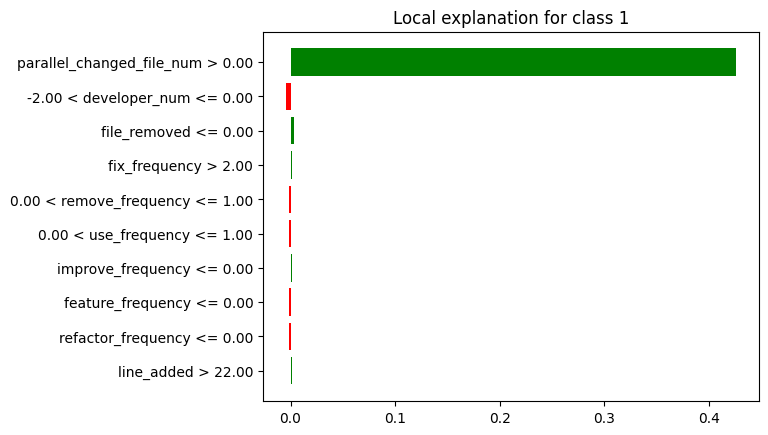

In [ ]:
lime_vp_min.plot()

In [ ]:
breakdown_vp_df_min = breakdown_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_min = breakdown_vp_df_min.drop(index=[0, 26])
breakdown_vp_df_min['sign'] = breakdown_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_min = breakdown_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_min = shap_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_min = shap_vp_df_min.tail(25)
shap_vp_df_min['sign'] = shap_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_min = shap_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_min["Variable"] = lime_vp_df_min["variable"].str.split(" ").str[0]
lime_vp_df_min["Signo"] = lime_vp_df_min["effect"].apply(evaluar_valor)
lime_vp_df_min = lime_vp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_min = lime_vp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_min['Ranking'] = breakdown_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_min = breakdown_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_min['Ranking'] = shap_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_min = shap_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_min['Ranking'] = lime_vp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_min = lime_vp_df_min.head(5)
lime_vp_df_min = lime_vp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_min = breakdown_vp_df_min.drop(columns=['contribution'])
shap_vp_df_min = shap_vp_df_min.drop(columns=['contribution'])
lime_vp_df_min = lime_vp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_min = breakdown_vp_df_min.head(5)
breakdown_vp_df_min = breakdown_vp_df_min.reset_index(drop=True)

shap_vp_df_min = shap_vp_df_min.head(5)
shap_vp_df_min = shap_vp_df_min.reset_index(drop=True)

lime_vp_df_min = lime_vp_df_min.reset_index(drop=True)
lime_vp_df_min.at[1, 'Variable'] = 'developer_num'
lime_vp_df_min.at[4, 'Variable'] = 'remove_frequency'

print(breakdown_vp_df_min)
print(shap_vp_df_min)
print(lime_vp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2               messages_max       14      Nulo
3               messages_min       14      Nulo
4              use_frequency       14      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2               file_removed       14      Nulo
3           change_frequency       14      Nulo
4             commit_density       14      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2               file_removed        3  Positivo
3              fix_frequency        4  Positivo
4           remove_frequency        5  Negativo


In [ ]:
#lime_vp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_min['Variable'])
shapley_features = list(shap_vp_df_min['Variable'])
lime_features = list(lime_vp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_min[breakdown_vp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_min[shap_vp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_min[lime_vp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'developer_num', 'messages_max', 'messages_min', 'use_frequency']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'change_frequency', 'commit_density']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'fix_frequency', 'remove_frequency']
['file_removed', 'change_frequency', 'commit_density', 'developer_num', 'remove_frequency', 'fix_frequency', 'messages_max', 'parallel_changed_file_num', 'messages_min', 'use_frequency']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -      14      Nulo       3   
1           change_frequency         -         -      14      Nulo       -   
2             commit_density         -         -      14      Nulo       -   
3              developer_num         2  Positivo       2  Positivo       2   
4           remove_frequency         -         -       -         -       5   
5              fix_frequency         -         -       -         -       4   
6               messages_max        14      Nulo       -         -       -   
7  parallel_changed_file_num         1  Positivo       1  Positivo       1   
8               messages_min        14      Nulo       -         -       -   
9              use_frequency        14      Nulo       -         -       -   

             
      Signo  
0  Positivo  
1         -  
2         -  
3  Negativo  
4  Negativo  
5  Positivo  
6         -  
7  Positivo  
8         -  
9         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "file_removed", "fix_frequency","remove_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Positivo       2  Positivo       2   
file_removed                      -         -      14      Nulo       3   
fix_frequency                     -         -       -         -       4   
remove_frequency                  -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Negativo  
file_removed               Positivo  
fix_frequency              Positivo  
remove_frequency           Negativo

### **VP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('developer_num', 2), ('parallel_changed_file_num', 1), ('developer_num', 2), ('parallel_changed_file_num', 1), ('developer_num', 2)], 'Shapley': [('parallel_changed_file_num', 1), ('developer_num', 2), ('file_removed', 14), ('parallel_changed_file_num', 1), ('developer_num', 2), ('file_removed', 14), ('parallel_changed_file_num', 1), ('developer_num', 2), ('file_removed', 14)], 'Lime': [('parallel_changed_file_num', 1), ('developer_num', 2), ('file_removed', 3), ('feature_frequency', 4), ('fix_frequency', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('file_removed', 3), ('fix_frequency', 4), ('duration', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('file_removed', 3), ('fix_frequency', 4), ('remove_frequency', 5)]}
{'Breakdown': {'parallel_changed_file_num': 3, 'developer_num': 3}, 'Shapley': {'parallel_changed_file_num': 3, 'developer_num': 3, 'file_removed': 3}, 'Lime': {'parallel_changed_file_num': 3, '

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_ada_vp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_ada_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
feature_frequency                     -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
remove_frequency                      -      -             -      -   
fix_frequency                         -      -             -      -   
duration                              -      -             -      -   
developer_num                       2.0      3           2.0      3   
file_removed                          -      -          14.0      3   

                                   Lime         
                          Ranking Medio Conteo  
feature_frequency              4.000000      1  
parallel_changed_file_num      1.000000      3  
remove_frequency               5.000000      1  
fix_frequency                  4.333333      3  
duration                       5.000000      1  
developer_num                  2.000000      3  
file_removed                   3.000000      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_ada_vp[("General", "Ranking")] = df_resumen_ada_vp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_ada_vp[("General", "Conteo Total")] = df_resumen_ada_vp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_ada_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
feature_frequency                     -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
remove_frequency                      -      -             -      -   
fix_frequency                         -      -             -      -   
duration                              -      -             -      -   
developer_num                       2.0      3           2.0      3   
file_removed                          -      -          14.0      3   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
feature_frequency              4.000000      1  4.000000            1  
parallel_changed_file_num      1.000000      3  1.000000            9  
remove_frequency               5.000000      1  5.000000            1  
fix_frequency                  4.333333      3  4.333333            3  
duration                       5.000000      1  5.000000            1  
developer_num                  2.000000      3  2.000000            9  
file_removed                   3.000000      3  8.500000            6

In [ ]:
# Obtener el número de características
num_caract = df_resumen_ada_vp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_ada_vp[("General", "Peso Rango")] = 1 - ((df_resumen_ada_vp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_ada_vp[("General", "Peso Conteo")] = df_resumen_ada_vp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_ada_vp[("General", "Puntaje")] = df_resumen_ada_vp[("General", "Peso Rango")] + df_resumen_ada_vp[("General", "Peso Conteo")]
df_resumen_ada_vp[("General", "Ranking")] = df_resumen_ada_vp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_ada_vp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_ada_vp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_ada_vp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_ada_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
feature_frequency                     -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
remove_frequency                      -      -             -      -   
fix_frequency                         -      -             -      -   
duration                              -      -             -      -   
developer_num                       2.0      3           2.0      3   
file_removed                          -      -          14.0      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
feature_frequency              4.000000      1     4.0            1  
parallel_changed_file_num      1.000000      3     1.0            9  
remove_frequency               5.000000      1     6.0            1  
fix_frequency                  4.333333      3     3.0            3  
duration                       5.000000      1     6.0            1  
developer_num                  2.000000      3     2.0            9  
file_removed                   3.000000      3     5.0            6

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_ada_vp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_ada_vp = df_resumen_ada_vp[new_columns]

In [ ]:
df_resumen_ada_vp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_ada_vp[(tech, "Ranking Medio")] = df_resumen_ada_vp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_ada_vp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
developer_num                 2.0            9          2.00      3   
fix_frequency                 3.0            3             -      -   
feature_frequency             4.0            1             -      -   
file_removed                  5.0            6             -      -   
remove_frequency              6.0            1             -      -   
duration                      6.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
developer_num                      2.00      3          2.00      3  
fix_frequency                         -      -          4.33      3  
feature_frequency                     -      -          4.00      1  
file_removed                      14.00      3          3.00      3  
remove_frequency                      -      -          5.00      1  
duration                              -      -          5.00      1

### **Instancia VN MAX:**

In [ ]:
breakdown_vn_max = exp.predict_parts(df_instancia_vn_max, type="break_down",random_state=42)
shap_vn_max = exp.predict_parts(df_instancia_vn_max, type="shap",random_state=42)
lime_vn_max = exp.predict_surrogate(df_instancia_vn_max, random_state=42)

breakdown_vn_df_max = breakdown_vn_max.result
shap_vn_df_max = shap_vn_max.result
lime_vn_df_max = lime_vn_max.result

In [ ]:
breakdown_vn_max.plot()

In [ ]:
shap_vn_max.plot()

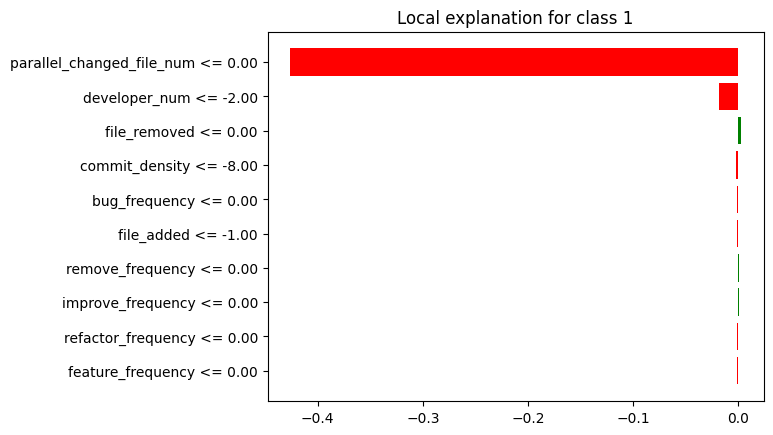

In [ ]:
lime_vn_max.plot()

In [ ]:
breakdown_vn_df_max = breakdown_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_max = breakdown_vn_df_max.drop(index=[0, 26])
breakdown_vn_df_max['sign'] = breakdown_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_max = breakdown_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_max = shap_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_max = shap_vn_df_max.tail(25)
shap_vn_df_max['sign'] = shap_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_max = shap_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_max["Variable"] = lime_vn_df_max["variable"].str.split(" ").str[0]
lime_vn_df_max["Signo"] = lime_vn_df_max["effect"].apply(evaluar_valor)
lime_vn_df_max = lime_vn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_max = lime_vn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_max['Ranking'] = breakdown_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_max = breakdown_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_max['Ranking'] = shap_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_max = shap_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_max['Ranking'] = lime_vn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_max = lime_vn_df_max.head(5)
lime_vn_df_max = lime_vn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_vn_df_max = breakdown_vn_df_max.drop(columns=['contribution'])
shap_vn_df_max = shap_vn_df_max.drop(columns=['contribution'])
lime_vn_df_max = lime_vn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_max = breakdown_vn_df_max.head(5)
breakdown_vn_df_max = breakdown_vn_df_max.reset_index(drop=True)

shap_vn_df_max = shap_vn_df_max.head(5)
shap_vn_df_max = shap_vn_df_max.reset_index(drop=True)

lime_vn_df_max = lime_vn_df_max.reset_index(drop=True)

print(breakdown_vn_df_max)
print(shap_vn_df_max)
print(lime_vn_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Negativo
2           delete_frequency       14      Nulo
3               messages_min       14      Nulo
4              use_frequency       14      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Negativo
2               file_removed       14      Nulo
3           change_frequency       14      Nulo
4             commit_density       14      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Negativo
2               file_removed        3  Positivo
3             commit_density        4  Negativo
4              bug_frequency        5  Negativo


In [ ]:
#lime_vn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_max['Variable'])
shapley_features = list(shap_vn_df_max['Variable'])
lime_features = list(lime_vn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_max[breakdown_vn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_max[shap_vn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_max[lime_vn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'developer_num', 'delete_frequency', 'messages_min', 'use_frequency']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'change_frequency', 'commit_density']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'commit_density', 'bug_frequency']
['file_removed', 'delete_frequency', 'change_frequency', 'bug_frequency', 'commit_density', 'developer_num', 'parallel_changed_file_num', 'messages_min', 'use_frequency']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -      14      Nulo       3   
1           delete_frequency        14      Nulo       -         -       -   
2           change_frequency         -         -      14      Nulo       -   
3              bug_frequency         -         -       -         -       5   
4             commit_density         -         -      14      Nulo       4   
5              developer_num         2  Negativo       2  Negativo       2   
6  parallel_changed_file_num         1  Negativo       1  Negativo       1   
7               messages_min        14      Nulo       -         -       -   
8              use_frequency        14      Nulo       -         -       -   

             
      Signo  
0  Positivo  
1         -  
2         -  
3  Negativo  
4  Negativo  
5  Negativo  
6  Negativo  
7         -  
8         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "file_removed", "commit_density", "bug_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
developer_num                     2  Negativo       2  Negativo       2   
file_removed                      -         -      14      Nulo       3   
commit_density                    -         -      14      Nulo       4   
bug_frequency                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
developer_num              Negativo  
file_removed               Positivo  
commit_density             Negativo  
bug_frequency              Negativo

### **Instancia VN MEDIANA:**

In [ ]:
breakdown_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="break_down",random_state=42)
shap_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="shap",random_state=42)
lime_vn_mediana = exp.predict_surrogate(df_instancia_vn_mediana, random_state=42)

breakdown_vn_df_mediana = breakdown_vn_mediana.result
shap_vn_df_mediana = shap_vn_mediana.result
lime_vn_df_mediana = lime_vn_mediana.result

In [ ]:
breakdown_vn_mediana.plot()

In [ ]:
shap_vn_mediana.plot()

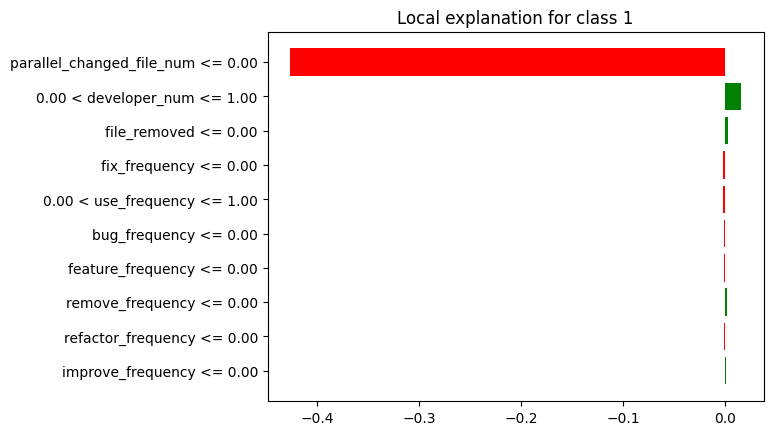

In [ ]:
lime_vn_mediana.plot()

In [ ]:
breakdown_vn_df_mediana = breakdown_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(index=[0, 26])
breakdown_vn_df_mediana['sign'] = breakdown_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_mediana = breakdown_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_mediana = shap_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_mediana = shap_vn_df_mediana.tail(25)
shap_vn_df_mediana['sign'] = shap_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_mediana = shap_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_mediana["Variable"] = lime_vn_df_mediana["variable"].str.split(" ").str[0]
lime_vn_df_mediana["Signo"] = lime_vn_df_mediana["effect"].apply(evaluar_valor)
lime_vn_df_mediana = lime_vn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_mediana['Ranking'] = breakdown_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_mediana = breakdown_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_mediana['Ranking'] = shap_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_mediana = shap_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_mediana['Ranking'] = lime_vn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_mediana = lime_vn_df_mediana.head(5)
lime_vn_df_mediana = lime_vn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(columns=['contribution'])
shap_vn_df_mediana = shap_vn_df_mediana.drop(columns=['contribution'])
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_mediana = breakdown_vn_df_mediana.head(5)
breakdown_vn_df_mediana = breakdown_vn_df_mediana.reset_index(drop=True)

shap_vn_df_mediana = shap_vn_df_mediana.head(5)
shap_vn_df_mediana = shap_vn_df_mediana.reset_index(drop=True)

lime_vn_df_mediana = lime_vn_df_mediana.reset_index(drop=True)
lime_vn_df_mediana.at[1, 'Variable'] = 'developer_num'
lime_vn_df_mediana.at[4, 'Variable'] = 'use_frequency'

print(breakdown_vn_df_mediana)
print(shap_vn_df_mediana)
print(lime_vn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Positivo
2              bug_frequency       14      Nulo
3           delete_frequency       14      Nulo
4               messages_min       14      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Positivo
2               file_removed       14      Nulo
3           change_frequency       14      Nulo
4             commit_density       14      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Positivo
2               file_removed        3  Positivo
3              fix_frequency        4  Negativo
4              use_frequency        5  Negativo


In [ ]:
#lime_vn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_mediana['Variable'])
shapley_features = list(shap_vn_df_mediana['Variable'])
lime_features = list(lime_vn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_mediana[breakdown_vn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_mediana[shap_vn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_mediana[lime_vn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'developer_num', 'bug_frequency', 'delete_frequency', 'messages_min']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'change_frequency', 'commit_density']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'fix_frequency', 'use_frequency']
['file_removed', 'delete_frequency', 'change_frequency', 'commit_density', 'bug_frequency', 'developer_num', 'fix_frequency', 'parallel_changed_file_num', 'messages_min', 'use_frequency']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -      14      Nulo       3   
1           delete_frequency        14      Nulo       -         -       -   
2           change_frequency         -         -      14      Nulo       -   
3             commit_density         -         -      14      Nulo       -   
4              bug_frequency        14      Nulo       -         -       -   
5              developer_num         2  Positivo       2  Positivo       2   
6              fix_frequency         -         -       -         -       4   
7  parallel_changed_file_num         1  Negativo       1  Negativo       1   
8               messages_min        14      Nulo       -         -       -   
9              use_frequency         -         -       -         -       5   

             
      Signo  
0  Positivo  
1         -  
2         -  
3         -  
4         -  
5  Positivo  
6  Negativo  
7  Negativo  
8         -  
9  Negativo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "file_removed", "fix_frequency", "use_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
developer_num                     2  Positivo       2  Positivo       2   
file_removed                      -         -      14      Nulo       3   
fix_frequency                     -         -       -         -       4   
use_frequency                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
developer_num              Positivo  
file_removed               Positivo  
fix_frequency              Negativo  
use_frequency              Negativo

### **Instancia VN MIN:**

In [ ]:
breakdown_vn_min = exp.predict_parts(df_instancia_vn_min, type="break_down",random_state=42)
shap_vn_min = exp.predict_parts(df_instancia_vn_min, type="shap",random_state=42)
lime_vn_min = exp.predict_surrogate(df_instancia_vn_min, random_state=42)

breakdown_vn_df_min = breakdown_vn_min.result
shap_vn_df_min = shap_vn_min.result
lime_vn_df_min = lime_vn_min.result

In [ ]:
breakdown_vn_min.plot()

In [ ]:
shap_vn_min.plot()

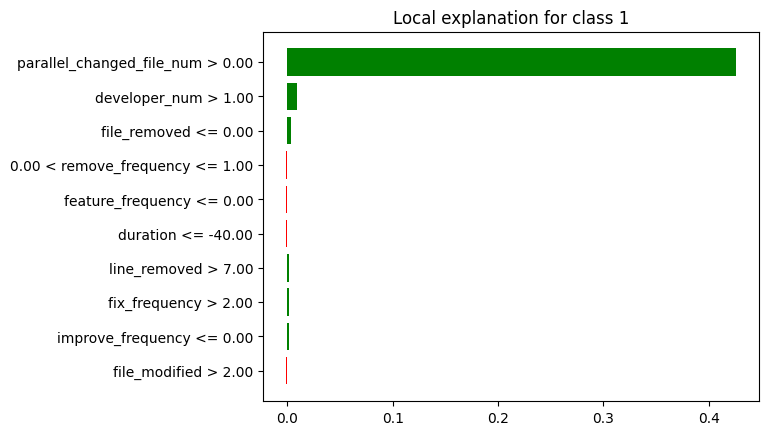

In [ ]:
lime_vn_min.plot()

In [ ]:
breakdown_vn_df_min = breakdown_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_min = breakdown_vn_df_min.drop(index=[0, 26])
breakdown_vn_df_min['sign'] = breakdown_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_min = breakdown_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_min = shap_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_min = shap_vn_df_min.tail(25)
shap_vn_df_min['sign'] = shap_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_min = shap_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_min["Variable"] = lime_vn_df_min["variable"].str.split(" ").str[0]
lime_vn_df_min["Signo"] = lime_vn_df_min["effect"].apply(evaluar_valor)
lime_vn_df_min = lime_vn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_min = lime_vn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_min['Ranking'] = breakdown_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_min = breakdown_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_min['Ranking'] = shap_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_min = shap_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_min['Ranking'] = lime_vn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_min = lime_vn_df_min.head(5)
lime_vn_df_min = lime_vn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vn_df_min = breakdown_vn_df_min.drop(columns=['contribution'])
shap_vn_df_min = shap_vn_df_min.drop(columns=['contribution'])
lime_vn_df_min = lime_vn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_min = breakdown_vn_df_min.head(5)
breakdown_vn_df_min = breakdown_vn_df_min.reset_index(drop=True)

shap_vn_df_min = shap_vn_df_min.head(5)
shap_vn_df_min = shap_vn_df_min.reset_index(drop=True)

lime_vn_df_min = lime_vn_df_min.reset_index(drop=True)
lime_vn_df_min.at[3, 'Variable'] = 'remove_frequency'

print(breakdown_vn_df_min)
print(shap_vn_df_min)
print(lime_vn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2               messages_max       14      Nulo
3               messages_min       14      Nulo
4              use_frequency       14      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2               file_removed       14      Nulo
3           change_frequency       14      Nulo
4             commit_density       14      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2               file_removed        3  Positivo
3           remove_frequency        4  Negativo
4          feature_frequency        5  Negativo


In [ ]:
#lime_vn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_min['Variable'])
shapley_features = list(shap_vn_df_min['Variable'])
lime_features = list(lime_vn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_min[breakdown_vn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_min[shap_vn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_min[lime_vn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'developer_num', 'messages_max', 'messages_min', 'use_frequency']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'change_frequency', 'commit_density']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'remove_frequency', 'feature_frequency']
['file_removed', 'change_frequency', 'commit_density', 'developer_num', 'remove_frequency', 'messages_max', 'parallel_changed_file_num', 'messages_min', 'feature_frequency', 'use_frequency']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -      14      Nulo       3   
1           change_frequency         -         -      14      Nulo       -   
2             commit_density         -         -      14      Nulo       -   
3              developer_num         2  Positivo       2  Positivo       2   
4           remove_frequency         -         -       -         -       4   
5               messages_max        14      Nulo       -         -       -   
6  parallel_changed_file_num         1  Positivo       1  Positivo       1   
7               messages_min        14      Nulo       -         -       -   
8          feature_frequency         -         -       -         -       5   
9              use_frequency        14      Nulo       -         -       -   

             
      Signo  
0  Positivo  
1         -  
2         -  
3  Positivo  
4  Negativo  
5         -  
6  Positivo  
7         -  
8  Negativo  
9         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "file_removed", "remove_frequency", "feature_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Positivo       2  Positivo       2   
file_removed                      -         -      14      Nulo       3   
remove_frequency                  -         -       -         -       4   
feature_frequency                 -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Positivo  
file_removed               Positivo  
remove_frequency           Negativo  
feature_frequency          Negativo

### **VN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('developer_num', 2), ('parallel_changed_file_num', 1), ('developer_num', 2), ('parallel_changed_file_num', 1), ('developer_num', 2)], 'Shapley': [('parallel_changed_file_num', 1), ('developer_num', 2), ('file_removed', 14), ('commit_density', 14), ('parallel_changed_file_num', 1), ('developer_num', 2), ('file_removed', 14), ('parallel_changed_file_num', 1), ('developer_num', 2), ('file_removed', 14)], 'Lime': [('parallel_changed_file_num', 1), ('developer_num', 2), ('file_removed', 3), ('commit_density', 4), ('bug_frequency', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('file_removed', 3), ('fix_frequency', 4), ('use_frequency', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('file_removed', 3), ('remove_frequency', 4), ('feature_frequency', 5)]}
{'Breakdown': {'parallel_changed_file_num': 3, 'developer_num': 3}, 'Shapley': {'parallel_changed_file_num': 3, 'developer_num': 3, 'file_removed': 3, 'commit_densi

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_ada_vn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_ada_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
use_frequency                         -      -             -      -   
feature_frequency                     -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
remove_frequency                      -      -             -      -   
fix_frequency                         -      -             -      -   
developer_num                       2.0      3           2.0      3   
commit_density                        -      -          14.0      1   
bug_frequency                         -      -             -      -   
file_removed                          -      -          14.0      3   

                                   Lime         
                          Ranking Medio Conteo  
use_frequency                       5.0      1  
feature_frequency                   5.0      1  
parallel_changed_file_num           1.0      3  
remove_frequency                    4.0      1  
fix_frequency                       4.0      1  
developer_num                       2.0      3  
commit_density                      4.0      1  
bug_frequency                       5.0      1  
file_removed                        3.0      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_ada_vn[("General", "Ranking")] = df_resumen_ada_vn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_ada_vn[("General", "Conteo Total")] = df_resumen_ada_vn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_ada_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
use_frequency                         -      -             -      -   
feature_frequency                     -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
remove_frequency                      -      -             -      -   
fix_frequency                         -      -             -      -   
developer_num                       2.0      3           2.0      3   
commit_density                        -      -          14.0      1   
bug_frequency                         -      -             -      -   
file_removed                          -      -          14.0      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
use_frequency                       5.0      1     5.0            1  
feature_frequency                   5.0      1     5.0            1  
parallel_changed_file_num           1.0      3     1.0            9  
remove_frequency                    4.0      1     4.0            1  
fix_frequency                       4.0      1     4.0            1  
developer_num                       2.0      3     2.0            9  
commit_density                      4.0      1     9.0            2  
bug_frequency                       5.0      1     5.0            1  
file_removed                        3.0      3     8.5            6

In [ ]:
# Obtener el número de características
num_caract = df_resumen_ada_vn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_ada_vn[("General", "Peso Rango")] = 1 - ((df_resumen_ada_vn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_ada_vn[("General", "Peso Conteo")] = df_resumen_ada_vn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_ada_vn[("General", "Puntaje")] = df_resumen_ada_vn[("General", "Peso Rango")] + df_resumen_ada_vn[("General", "Peso Conteo")]
df_resumen_ada_vn[("General", "Ranking")] = df_resumen_ada_vn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_ada_vn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_ada_vn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_ada_vn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_ada_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
use_frequency                         -      -             -      -   
feature_frequency                     -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
remove_frequency                      -      -             -      -   
fix_frequency                         -      -             -      -   
developer_num                       2.0      3           2.0      3   
commit_density                        -      -          14.0      1   
bug_frequency                         -      -             -      -   
file_removed                          -      -          14.0      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
use_frequency                       5.0      1     7.0            1  
feature_frequency                   5.0      1     7.0            1  
parallel_changed_file_num           1.0      3     1.0            9  
remove_frequency                    4.0      1     3.0            1  
fix_frequency                       4.0      1     3.0            1  
developer_num                       2.0      3     2.0            9  
commit_density                      4.0      1     6.0            2  
bug_frequency                       5.0      1     7.0            1  
file_removed                        3.0      3     5.0            6

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_ada_vn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_ada_vn = df_resumen_ada_vn[new_columns]

In [ ]:
df_resumen_ada_vn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_ada_vn[(tech, "Ranking Medio")] = df_resumen_ada_vn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_ada_vn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
developer_num                 2.0            9          2.00      3   
remove_frequency              3.0            1             -      -   
fix_frequency                 3.0            1             -      -   
file_removed                  5.0            6             -      -   
commit_density                6.0            2             -      -   
use_frequency                 7.0            1             -      -   
feature_frequency             7.0            1             -      -   
bug_frequency                 7.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
developer_num                      2.00      3          2.00      3  
remove_frequency                      -      -          4.00      1  
fix_frequency                         -      -          4.00      1  
file_removed                      14.00      3          3.00      3  
commit_density                    14.00      1          4.00      1  
use_frequency                         -      -          5.00      1  
feature_frequency                     -      -          5.00      1  
bug_frequency                         -      -          5.00      1

### **Instancia FP MAX:**

In [ ]:
breakdown_fp_max = exp.predict_parts(df_instancia_fp_max, type="break_down",random_state=42)
shap_fp_max = exp.predict_parts(df_instancia_fp_max, type="shap",random_state=42)
lime_fp_max = exp.predict_surrogate(df_instancia_fp_max, random_state=42)

breakdown_fp_df_max = breakdown_fp_max.result
shap_fp_df_max = shap_fp_max.result
lime_fp_df_max=lime_fp_max.result

In [ ]:
breakdown_fp_max.plot()

In [ ]:
shap_fp_max.plot()

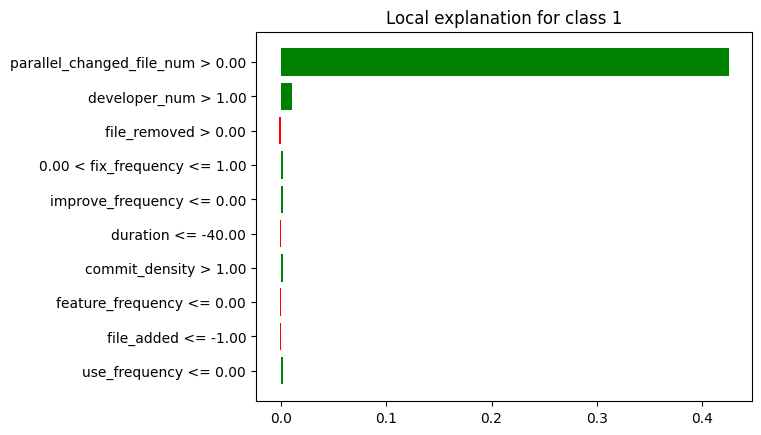

In [ ]:
lime_fp_max.plot()

In [ ]:
breakdown_fp_df_max = breakdown_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_max = breakdown_fp_df_max.drop(index=[0, 26])
breakdown_fp_df_max['sign'] = breakdown_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_max = breakdown_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_max = shap_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_max = shap_fp_df_max.tail(25)
shap_fp_df_max['sign'] = shap_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_max = shap_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_max["Variable"] = lime_fp_df_max["variable"].str.split(" ").str[0]
lime_fp_df_max["Signo"] = lime_fp_df_max["effect"].apply(evaluar_valor)
lime_fp_df_max = lime_fp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_max = lime_fp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_max['Ranking'] = breakdown_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_max = breakdown_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_max['Ranking'] = shap_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_max = shap_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_max['Ranking'] = lime_fp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_max = lime_fp_df_max.head(5)
lime_fp_df_max = lime_fp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fp_df_max = breakdown_fp_df_max.drop(columns=['contribution'])
shap_fp_df_max = shap_fp_df_max.drop(columns=['contribution'])
lime_fp_df_max = lime_fp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_max = breakdown_fp_df_max.head(5)
breakdown_fp_df_max = breakdown_fp_df_max.reset_index(drop=True)

shap_fp_df_max = shap_fp_df_max.head(5)
shap_fp_df_max = shap_fp_df_max.reset_index(drop=True)

lime_fp_df_max = lime_fp_df_max.reset_index(drop=True)
lime_fp_df_max.at[3, 'Variable'] = 'fix_frequency'

print(breakdown_fp_df_max)
print(shap_fp_df_max)
print(lime_fp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2               messages_max       14      Nulo
3               messages_min       14      Nulo
4              use_frequency       14      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2               file_removed       14      Nulo
3           change_frequency       14      Nulo
4             commit_density       14      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2               file_removed        3  Negativo
3              fix_frequency        4  Positivo
4          improve_frequency        5  Positivo


In [ ]:
#lime_fp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_max['Variable'])
shapley_features = list(shap_fp_df_max['Variable'])
lime_features = list(lime_fp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_max[breakdown_fp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_max[shap_fp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_max[lime_fp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'developer_num', 'messages_max', 'messages_min', 'use_frequency']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'change_frequency', 'commit_density']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'fix_frequency', 'improve_frequency']
['improve_frequency', 'file_removed', 'change_frequency', 'commit_density', 'developer_num', 'fix_frequency', 'messages_max', 'parallel_changed_file_num', 'messages_min', 'use_frequency']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0          improve_frequency         -         -       -         -       5   
1               file_removed         -         -      14      Nulo       3   
2           change_frequency         -         -      14      Nulo       -   
3             commit_density         -         -      14      Nulo       -   
4              developer_num         2  Positivo       2  Positivo       2   
5              fix_frequency         -         -       -         -       4   
6               messages_max        14      Nulo       -         -       -   
7  parallel_changed_file_num         1  Positivo       1  Positivo       1   
8               messages_min        14      Nulo       -         -       -   
9              use_frequency        14      Nulo       -         -       -   

             
      Signo  
0  Positivo  
1  Negativo  
2         -  
3         -  
4  Positivo  
5  Positivo  
6         -  
7  Positivo  
8         -  
9         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "file_removed", "fix_frequency", "improve_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Positivo       2  Positivo       2   
file_removed                      -         -      14      Nulo       3   
fix_frequency                     -         -       -         -       4   
improve_frequency                 -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Positivo  
file_removed               Negativo  
fix_frequency              Positivo  
improve_frequency          Positivo

### **Instancia FP MEDIANA:**

In [ ]:
breakdown_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="break_down",random_state=42)
shap_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="shap",random_state=42)
lime_fp_mediana = exp.predict_surrogate(df_instancia_fp_mediana, random_state=42)

breakdown_fp_df_mediana = breakdown_fp_mediana.result
shap_fp_df_mediana = shap_fp_mediana.result
lime_fp_df_mediana=lime_fp_mediana.result

In [ ]:
breakdown_fp_mediana.plot()

In [ ]:
shap_fp_mediana.plot()

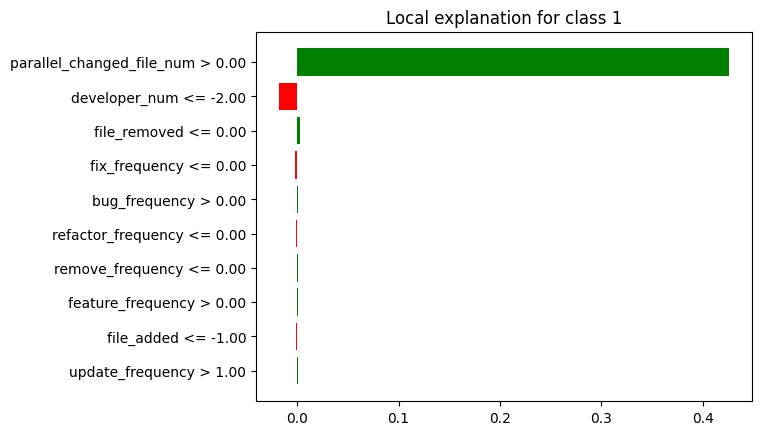

In [ ]:
lime_fp_mediana.plot()

In [ ]:
breakdown_fp_df_mediana = breakdown_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(index=[0, 26])
breakdown_fp_df_mediana['sign'] = breakdown_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_mediana = breakdown_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_mediana = shap_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_mediana = shap_fp_df_mediana.tail(25)
shap_fp_df_mediana['sign'] = shap_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_mediana = shap_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_mediana["Variable"] = lime_fp_df_mediana["variable"].str.split(" ").str[0]
lime_fp_df_mediana["Signo"] = lime_fp_df_mediana["effect"].apply(evaluar_valor)
lime_fp_df_mediana = lime_fp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_mediana['Ranking'] = breakdown_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_mediana = breakdown_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_mediana['Ranking'] = shap_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_mediana = shap_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_mediana['Ranking'] = lime_fp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_mediana = lime_fp_df_mediana.head(5)
lime_fp_df_mediana = lime_fp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(columns=['contribution'])
shap_fp_df_mediana = shap_fp_df_mediana.drop(columns=['contribution'])
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_mediana = breakdown_fp_df_mediana.head(5)
breakdown_fp_df_mediana = breakdown_fp_df_mediana.reset_index(drop=True)

shap_fp_df_mediana = shap_fp_df_mediana.head(5)
shap_fp_df_mediana = shap_fp_df_mediana.reset_index(drop=True)

lime_fp_df_mediana = lime_fp_df_mediana.reset_index(drop=True)

print(breakdown_fp_df_mediana)
print(shap_fp_df_mediana)
print(lime_fp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num       14      Nulo
3         document_frequency       14      Nulo
4           change_frequency       14      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2               file_removed       14      Nulo
3           change_frequency       14      Nulo
4             commit_density       14      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2               file_removed        3  Positivo
3              fix_frequency        4  Negativo
4              bug_frequency        5  Positivo


In [ ]:
#lime_fp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_mediana['Variable'])
shapley_features = list(shap_fp_df_mediana['Variable'])
lime_features = list(lime_fp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_mediana[breakdown_fp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_mediana[shap_fp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_mediana[lime_fp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'developer_num', 'commit_num', 'document_frequency', 'change_frequency']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'change_frequency', 'commit_density']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'fix_frequency', 'bug_frequency']
['file_removed', 'change_frequency', 'bug_frequency', 'commit_density', 'developer_num', 'commit_num', 'fix_frequency', 'document_frequency', 'parallel_changed_file_num']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -      14      Nulo       3   
1           change_frequency        14      Nulo      14      Nulo       -   
2              bug_frequency         -         -       -         -       5   
3             commit_density         -         -      14      Nulo       -   
4              developer_num         2  Negativo       2  Negativo       2   
5                 commit_num        14      Nulo       -         -       -   
6              fix_frequency         -         -       -         -       4   
7         document_frequency        14      Nulo       -         -       -   
8  parallel_changed_file_num         1  Positivo       1  Positivo       1   

             
      Signo  
0  Positivo  
1         -  
2  Positivo  
3         -  
4  Negativo  
5         -  
6  Negativo  
7         -  
8  Positivo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "file_removed", "fix_frequency", "bug_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Negativo       2  Negativo       2   
file_removed                      -         -      14      Nulo       3   
fix_frequency                     -         -       -         -       4   
bug_frequency                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Negativo  
file_removed               Positivo  
fix_frequency              Negativo  
bug_frequency              Positivo

### **Instancia FP MIN:**

In [ ]:
breakdown_fp_min = exp.predict_parts(df_instancia_fp_min, type="break_down",random_state=42)
shap_fp_min = exp.predict_parts(df_instancia_fp_min, type="shap",random_state=42)
lime_fp_min = exp.predict_surrogate(df_instancia_fp_min, random_state=42)

breakdown_fp_df_min = breakdown_fp_min.result
shap_fp_df_min = shap_fp_min.result
lime_fp_df_min = lime_fp_min.result

In [ ]:
breakdown_fp_min.plot()

In [ ]:
shap_fp_min.plot()

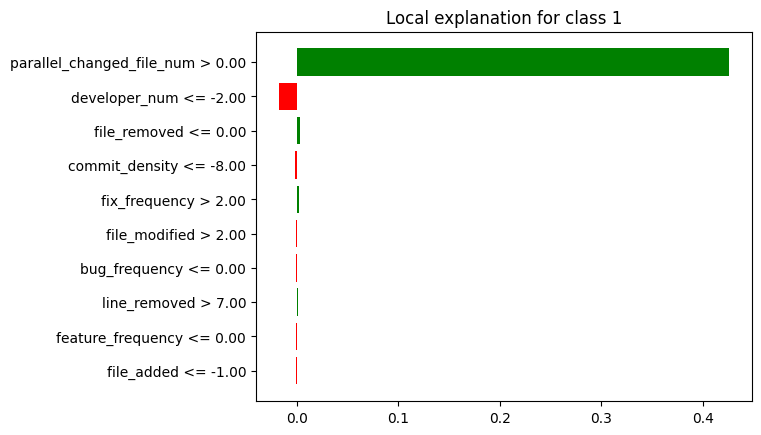

In [ ]:
lime_fp_min.plot()

In [ ]:
breakdown_fp_df_min = breakdown_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_min = breakdown_fp_df_min.drop(index=[0, 26])
breakdown_fp_df_min['sign'] = breakdown_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_min = breakdown_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_min = shap_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_min = shap_fp_df_min.tail(25)
shap_fp_df_min['sign'] = shap_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_min = shap_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_min["Variable"] = lime_fp_df_min["variable"].str.split(" ").str[0]
lime_fp_df_min["Signo"] = lime_fp_df_min["effect"].apply(evaluar_valor)
lime_fp_df_min = lime_fp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_min = lime_fp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_min['Ranking'] = breakdown_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_min = breakdown_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_min['Ranking'] = shap_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_min = shap_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_min['Ranking'] = lime_fp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_min = lime_fp_df_min.head(5)
lime_fp_df_min = lime_fp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fp_df_min = breakdown_fp_df_min.drop(columns=['contribution'])
shap_fp_df_min = shap_fp_df_min.drop(columns=['contribution'])
lime_fp_df_min = lime_fp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_min = breakdown_fp_df_min.head(5)
breakdown_fp_df_min = breakdown_fp_df_min.reset_index(drop=True)

shap_fp_df_min = shap_fp_df_min.head(5)
shap_fp_df_min = shap_fp_df_min.reset_index(drop=True)

lime_fp_df_min = lime_fp_df_min.reset_index(drop=True)

print(breakdown_fp_df_min)
print(shap_fp_df_min)
print(lime_fp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num       14      Nulo
3         document_frequency       14      Nulo
4           change_frequency       14      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2               file_removed       14      Nulo
3           change_frequency       14      Nulo
4             commit_density       14      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2               file_removed        3  Positivo
3             commit_density        4  Negativo
4              fix_frequency        5  Positivo


In [ ]:
#lime_fp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_min['Variable'])
shapley_features = list(shap_fp_df_min['Variable'])
lime_features = list(lime_fp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_min[breakdown_fp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_min[shap_fp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_min[lime_fp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'developer_num', 'commit_num', 'document_frequency', 'change_frequency']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'change_frequency', 'commit_density']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'commit_density', 'fix_frequency']
['file_removed', 'change_frequency', 'commit_density', 'developer_num', 'commit_num', 'fix_frequency', 'document_frequency', 'parallel_changed_file_num']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -      14      Nulo       3   
1           change_frequency        14      Nulo      14      Nulo       -   
2             commit_density         -         -      14      Nulo       4   
3              developer_num         2  Negativo       2  Negativo       2   
4                 commit_num        14      Nulo       -         -       -   
5              fix_frequency         -         -       -         -       5   
6         document_frequency        14      Nulo       -         -       -   
7  parallel_changed_file_num         1  Positivo       1  Positivo       1   

             
      Signo  
0  Positivo  
1         -  
2  Negativo  
3  Negativo  
4         -  
5  Positivo  
6         -  
7  Positivo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "file_removed", "commit_density", "fix_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Negativo       2  Negativo       2   
file_removed                      -         -      14      Nulo       3   
commit_density                    -         -      14      Nulo       4   
fix_frequency                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Negativo  
file_removed               Positivo  
commit_density             Negativo  
fix_frequency              Positivo

### **FP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('developer_num', 2), ('parallel_changed_file_num', 1), ('developer_num', 2), ('parallel_changed_file_num', 1), ('developer_num', 2)], 'Shapley': [('parallel_changed_file_num', 1), ('developer_num', 2), ('file_removed', 14), ('parallel_changed_file_num', 1), ('developer_num', 2), ('file_removed', 14), ('parallel_changed_file_num', 1), ('developer_num', 2), ('file_removed', 14), ('commit_density', 14)], 'Lime': [('parallel_changed_file_num', 1), ('developer_num', 2), ('file_removed', 3), ('fix_frequency', 4), ('improve_frequency', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('file_removed', 3), ('fix_frequency', 4), ('bug_frequency', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('file_removed', 3), ('commit_density', 4), ('fix_frequency', 5)]}
{'Breakdown': {'parallel_changed_file_num': 3, 'developer_num': 3}, 'Shapley': {'parallel_changed_file_num': 3, 'developer_num': 3, 'file_removed': 3, 'commit_density'

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_ada_fp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_ada_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
parallel_changed_file_num           1.0      3           1.0      3   
fix_frequency                         -      -             -      -   
developer_num                       2.0      3           2.0      3   
commit_density                        -      -          14.0      1   
bug_frequency                         -      -             -      -   
file_removed                          -      -          14.0      3   
improve_frequency                     -      -             -      -   

                                   Lime         
                          Ranking Medio Conteo  
parallel_changed_file_num      1.000000      3  
fix_frequency                  4.333333      3  
developer_num                  2.000000      3  
commit_density                 4.000000      1  
bug_frequency                  5.000000      1  
file_removed                   3.000000      3  
improve_frequency              5.000000      1

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_ada_fp[("General", "Ranking")] = df_resumen_ada_fp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_ada_fp[("General", "Conteo Total")] = df_resumen_ada_fp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_ada_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
parallel_changed_file_num           1.0      3           1.0      3   
fix_frequency                         -      -             -      -   
developer_num                       2.0      3           2.0      3   
commit_density                        -      -          14.0      1   
bug_frequency                         -      -             -      -   
file_removed                          -      -          14.0      3   
improve_frequency                     -      -             -      -   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
parallel_changed_file_num      1.000000      3  1.000000            9  
fix_frequency                  4.333333      3  4.333333            3  
developer_num                  2.000000      3  2.000000            9  
commit_density                 4.000000      1  9.000000            2  
bug_frequency                  5.000000      1  5.000000            1  
file_removed                   3.000000      3  8.500000            6  
improve_frequency              5.000000      1  5.000000            1

In [ ]:
# Obtener el número de características
num_caract = df_resumen_ada_fp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_ada_fp[("General", "Peso Rango")] = 1 - ((df_resumen_ada_fp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_ada_fp[("General", "Peso Conteo")] = df_resumen_ada_fp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_ada_fp[("General", "Puntaje")] = df_resumen_ada_fp[("General", "Peso Rango")] + df_resumen_ada_fp[("General", "Peso Conteo")]
df_resumen_ada_fp[("General", "Ranking")] = df_resumen_ada_fp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_ada_fp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_ada_fp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_ada_fp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_ada_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
parallel_changed_file_num           1.0      3           1.0      3   
fix_frequency                         -      -             -      -   
developer_num                       2.0      3           2.0      3   
commit_density                        -      -          14.0      1   
bug_frequency                         -      -             -      -   
file_removed                          -      -          14.0      3   
improve_frequency                     -      -             -      -   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
parallel_changed_file_num      1.000000      3     1.0            9  
fix_frequency                  4.333333      3     3.0            3  
developer_num                  2.000000      3     2.0            9  
commit_density                 4.000000      1     7.0            2  
bug_frequency                  5.000000      1     5.0            1  
file_removed                   3.000000      3     4.0            6  
improve_frequency              5.000000      1     5.0            1

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_ada_fp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_ada_fp = df_resumen_ada_fp[new_columns]

In [ ]:
df_resumen_ada_fp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_ada_fp[(tech, "Ranking Medio")] = df_resumen_ada_fp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_ada_fp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
developer_num                 2.0            9          2.00      3   
fix_frequency                 3.0            3             -      -   
file_removed                  4.0            6             -      -   
bug_frequency                 5.0            1             -      -   
improve_frequency             5.0            1             -      -   
commit_density                7.0            2             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
developer_num                      2.00      3          2.00      3  
fix_frequency                         -      -          4.33      3  
file_removed                      14.00      3          3.00      3  
bug_frequency                         -      -          5.00      1  
improve_frequency                     -      -          5.00      1  
commit_density                    14.00      1          4.00      1

### **Instancia FN MAX:**

In [ ]:
breakdown_fn_max = exp.predict_parts(df_instancia_fn_max, type="break_down",random_state=42)
shap_fn_max = exp.predict_parts(df_instancia_fn_max, type="shap",random_state=42)
lime_fn_max = exp.predict_surrogate(df_instancia_fn_max, random_state=42)

breakdown_fn_df_max = breakdown_fn_max.result
shap_fn_df_max = shap_fn_max.result
lime_fn_df_max=lime_fn_max.result

In [ ]:
breakdown_fn_max.plot()

In [ ]:
shap_fn_max.plot()

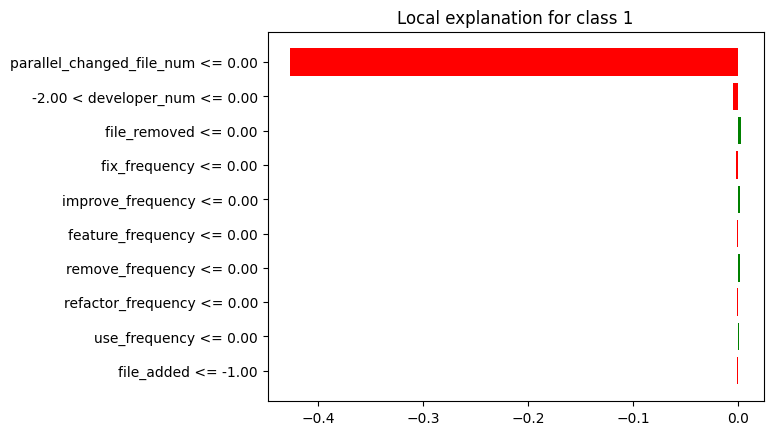

In [ ]:
lime_fn_max.plot()

In [ ]:
breakdown_fn_df_max = breakdown_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_max = breakdown_fn_df_max.drop(index=[0, 26])
breakdown_fn_df_max['sign'] = breakdown_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_max = breakdown_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_max = shap_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_max = shap_fn_df_max.tail(25)
shap_fn_df_max['sign'] = shap_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_max = shap_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_max["Variable"] = lime_fn_df_max["variable"].str.split(" ").str[0]
lime_fn_df_max["Signo"] = lime_fn_df_max["effect"].apply(evaluar_valor)
lime_fn_df_max = lime_fn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_max = lime_fn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_max['Ranking'] = breakdown_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_max = breakdown_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_max['Ranking'] = shap_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_max = shap_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_max['Ranking'] = lime_fn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_max = lime_fn_df_max.head(5)
lime_fn_df_max = lime_fn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fn_df_max = breakdown_fn_df_max.drop(columns=['contribution'])
shap_fn_df_max = shap_fn_df_max.drop(columns=['contribution'])
lime_fn_df_max = lime_fn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_max = breakdown_fn_df_max.head(5)
breakdown_fn_df_max = breakdown_fn_df_max.reset_index(drop=True)

shap_fn_df_max = shap_fn_df_max.head(5)
shap_fn_df_max = shap_fn_df_max.reset_index(drop=True)

lime_fn_df_max = lime_fn_df_max.reset_index(drop=True)
lime_fn_df_max.at[1, 'Variable'] = 'developer_num'

print(breakdown_fn_df_max)
print(shap_fn_df_max)
print(lime_fn_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Positivo
2              bug_frequency       14      Nulo
3           delete_frequency       14      Nulo
4               messages_min       14      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Positivo
2               file_removed       14      Nulo
3           change_frequency       14      Nulo
4             commit_density       14      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Negativo
2               file_removed        3  Positivo
3              fix_frequency        4  Negativo
4          improve_frequency        5  Positivo


In [ ]:
#lime_fn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_max['Variable'])
shapley_features = list(shap_fn_df_max['Variable'])
lime_features = list(lime_fn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_max[breakdown_fn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_max[shap_fn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_max[lime_fn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'developer_num', 'bug_frequency', 'delete_frequency', 'messages_min']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'change_frequency', 'commit_density']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'fix_frequency', 'improve_frequency']
['improve_frequency', 'file_removed', 'delete_frequency', 'change_frequency', 'commit_density', 'bug_frequency', 'developer_num', 'fix_frequency', 'parallel_changed_file_num', 'messages_min']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0          improve_frequency         -         -       -         -       5   
1               file_removed         -         -      14      Nulo       3   
2           delete_frequency        14      Nulo       -         -       -   
3           change_frequency         -         -      14      Nulo       -   
4             commit_density         -         -      14      Nulo       -   
5              bug_frequency        14      Nulo       -         -       -   
6              developer_num         2  Positivo       2  Positivo       2   
7              fix_frequency         -         -       -         -       4   
8  parallel_changed_file_num         1  Negativo       1  Negativo       1   
9               messages_min        14      Nulo       -         -       -   

             
      Signo  
0  Positivo  
1  Positivo  
2         -  
3         -  
4         -  
5         -  
6  Negativo  
7  Negativo  
8  Negativo  
9         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "file_removed", "fix_frequency", "improve_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
developer_num                     2  Positivo       2  Positivo       2   
file_removed                      -         -      14      Nulo       3   
fix_frequency                     -         -       -         -       4   
improve_frequency                 -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
developer_num              Negativo  
file_removed               Positivo  
fix_frequency              Negativo  
improve_frequency          Positivo

### **Instancia FN MEDIANA:**

In [ ]:
breakdown_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="break_down",random_state=42)
shap_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="shap",random_state=42)
lime_fn_mediana = exp.predict_surrogate(df_instancia_fn_mediana, random_state=42)

breakdown_fn_df_mediana = breakdown_fn_mediana.result
shap_fn_df_mediana = shap_fn_mediana.result
lime_fn_df_mediana=lime_fn_mediana.result

In [ ]:
breakdown_fn_mediana.plot()

In [ ]:
shap_fn_mediana.plot()

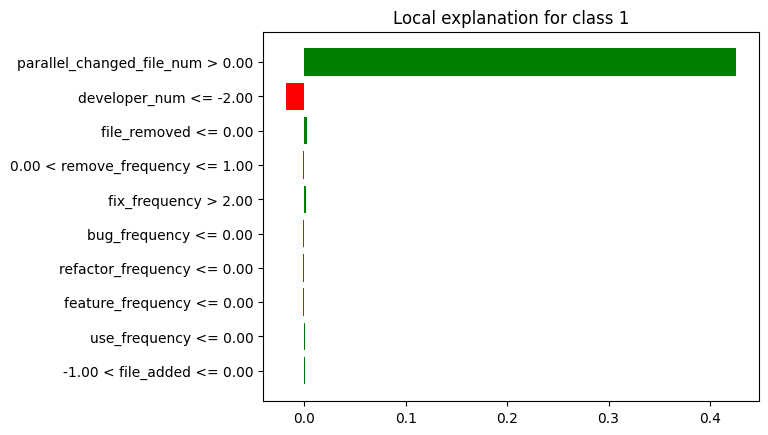

In [ ]:
lime_fn_mediana.plot()

In [ ]:
breakdown_fn_df_mediana = breakdown_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(index=[0, 26])
breakdown_fn_df_mediana['sign'] = breakdown_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_mediana = breakdown_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_mediana = shap_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_mediana = shap_fn_df_mediana.tail(25)
shap_fn_df_mediana['sign'] = shap_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_mediana = shap_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_mediana["Variable"] = lime_fn_df_mediana["variable"].str.split(" ").str[0]
lime_fn_df_mediana["Signo"] = lime_fn_df_mediana["effect"].apply(evaluar_valor)
lime_fn_df_mediana = lime_fn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_mediana['Ranking'] = breakdown_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_mediana = breakdown_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_mediana['Ranking'] = shap_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_mediana = shap_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_mediana['Ranking'] = lime_fn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_mediana = lime_fn_df_mediana.head(5)
lime_fn_df_mediana = lime_fn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(columns=['contribution'])
shap_fn_df_mediana = shap_fn_df_mediana.drop(columns=['contribution'])
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_mediana = breakdown_fn_df_mediana.head(5)
breakdown_fn_df_mediana = breakdown_fn_df_mediana.reset_index(drop=True)

shap_fn_df_mediana = shap_fn_df_mediana.head(5)
shap_fn_df_mediana = shap_fn_df_mediana.reset_index(drop=True)

lime_fn_df_mediana = lime_fn_df_mediana.reset_index(drop=True)
lime_fn_df_mediana.at[3, 'Variable'] = 'remove_frequency'

print(breakdown_fn_df_mediana)
print(shap_fn_df_mediana)
print(lime_fn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num       14      Nulo
3         document_frequency       14      Nulo
4           change_frequency       14      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2               file_removed       14      Nulo
3           change_frequency       14      Nulo
4             commit_density       14      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2               file_removed        3  Positivo
3           remove_frequency        4  Negativo
4              fix_frequency        5  Positivo


In [ ]:
#lime_fn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_mediana['Variable'])
shapley_features = list(shap_fn_df_mediana['Variable'])
lime_features = list(lime_fn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_mediana[breakdown_fn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_mediana[shap_fn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_mediana[lime_fn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'developer_num', 'commit_num', 'document_frequency', 'change_frequency']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'change_frequency', 'commit_density']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'remove_frequency', 'fix_frequency']
['file_removed', 'change_frequency', 'commit_density', 'developer_num', 'commit_num', 'fix_frequency', 'remove_frequency', 'document_frequency', 'parallel_changed_file_num']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -      14      Nulo       3   
1           change_frequency        14      Nulo      14      Nulo       -   
2             commit_density         -         -      14      Nulo       -   
3              developer_num         2  Negativo       2  Negativo       2   
4                 commit_num        14      Nulo       -         -       -   
5              fix_frequency         -         -       -         -       5   
6           remove_frequency         -         -       -         -       4   
7         document_frequency        14      Nulo       -         -       -   
8  parallel_changed_file_num         1  Positivo       1  Positivo       1   

             
      Signo  
0  Positivo  
1         -  
2         -  
3  Negativo  
4         -  
5  Positivo  
6  Negativo  
7         -  
8  Positivo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "file_removed", "remove_frequency", "fix_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Negativo       2  Negativo       2   
file_removed                      -         -      14      Nulo       3   
remove_frequency                  -         -       -         -       4   
fix_frequency                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Negativo  
file_removed               Positivo  
remove_frequency           Negativo  
fix_frequency              Positivo

### **Instancia FN MIN:**

In [ ]:
breakdown_fn_min = exp.predict_parts(df_instancia_fn_min, type="break_down",random_state=42)
shap_fn_min = exp.predict_parts(df_instancia_fn_min, type="shap",random_state=42)
lime_fn_min = exp.predict_surrogate(df_instancia_fn_min, random_state=42)

breakdown_fn_df_min = breakdown_fn_min.result
shap_fn_df_min = shap_fn_min.result
lime_fn_df_min = lime_fn_min.result

In [ ]:
breakdown_fn_min.plot()

In [ ]:
shap_fn_min.plot()

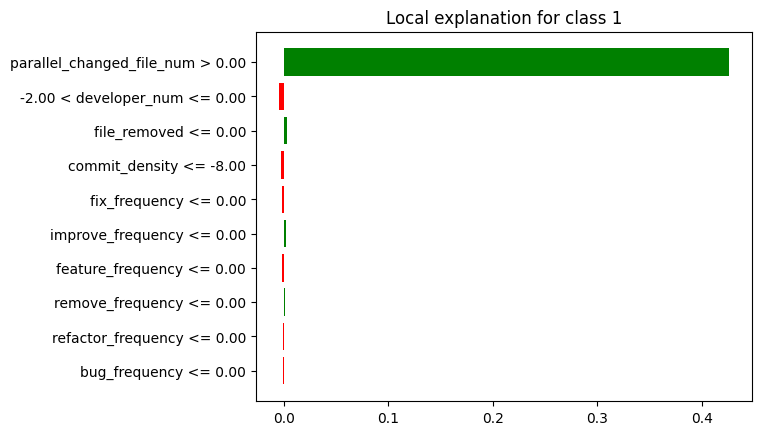

In [ ]:
lime_fn_min.plot()

In [ ]:
breakdown_fn_df_min = breakdown_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_min = breakdown_fn_df_min.drop(index=[0, 26])
breakdown_fn_df_min['sign'] = breakdown_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_min = breakdown_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_min = shap_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_min = shap_fn_df_min.tail(25)
shap_fn_df_min['sign'] = shap_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_min = shap_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_min["Variable"] = lime_fn_df_min["variable"].str.split(" ").str[0]
lime_fn_df_min["Signo"] = lime_fn_df_min["effect"].apply(evaluar_valor)
lime_fn_df_min = lime_fn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_min = lime_fn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_min['Ranking'] = breakdown_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_min = breakdown_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_min['Ranking'] = shap_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_min = shap_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_min['Ranking'] = lime_fn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_min = lime_fn_df_min.head(5)
lime_fn_df_min = lime_fn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fn_df_min = breakdown_fn_df_min.drop(columns=['contribution'])
shap_fn_df_min = shap_fn_df_min.drop(columns=['contribution'])
lime_fn_df_min = lime_fn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_min = breakdown_fn_df_min.head(5)
breakdown_fn_df_min = breakdown_fn_df_min.reset_index(drop=True)

shap_fn_df_min = shap_fn_df_min.head(5)
shap_fn_df_min = shap_fn_df_min.reset_index(drop=True)

lime_fn_df_min = lime_fn_df_min.reset_index(drop=True)
lime_fn_df_min.at[1, 'Variable'] = 'developer_num'

print(breakdown_fn_df_min)
print(shap_fn_df_min)
print(lime_fn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2               messages_max       14      Nulo
3               messages_min       14      Nulo
4              use_frequency       14      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2               file_removed       14      Nulo
3           change_frequency       14      Nulo
4             commit_density       14      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2               file_removed        3  Positivo
3             commit_density        4  Negativo
4              fix_frequency        5  Negativo


In [ ]:
#lime_fn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_min['Variable'])
shapley_features = list(shap_fn_df_min['Variable'])
lime_features = list(lime_fn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_min[breakdown_fn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_min[shap_fn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_min[lime_fn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'developer_num', 'messages_max', 'messages_min', 'use_frequency']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'change_frequency', 'commit_density']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'commit_density', 'fix_frequency']
['file_removed', 'change_frequency', 'commit_density', 'developer_num', 'fix_frequency', 'messages_max', 'parallel_changed_file_num', 'messages_min', 'use_frequency']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -      14      Nulo       3   
1           change_frequency         -         -      14      Nulo       -   
2             commit_density         -         -      14      Nulo       4   
3              developer_num         2  Positivo       2  Positivo       2   
4              fix_frequency         -         -       -         -       5   
5               messages_max        14      Nulo       -         -       -   
6  parallel_changed_file_num         1  Positivo       1  Positivo       1   
7               messages_min        14      Nulo       -         -       -   
8              use_frequency        14      Nulo       -         -       -   

             
      Signo  
0  Positivo  
1         -  
2  Negativo  
3  Negativo  
4  Negativo  
5         -  
6  Positivo  
7         -  
8         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "file_removed", "commit_density", "fix_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Positivo       2  Positivo       2   
file_removed                      -         -      14      Nulo       3   
commit_density                    -         -      14      Nulo       4   
fix_frequency                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Negativo  
file_removed               Positivo  
commit_density             Negativo  
fix_frequency              Negativo

### **FN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('developer_num', 2), ('parallel_changed_file_num', 1), ('developer_num', 2), ('parallel_changed_file_num', 1), ('developer_num', 2)], 'Shapley': [('parallel_changed_file_num', 1), ('developer_num', 2), ('file_removed', 14), ('parallel_changed_file_num', 1), ('developer_num', 2), ('file_removed', 14), ('parallel_changed_file_num', 1), ('developer_num', 2), ('file_removed', 14), ('commit_density', 14)], 'Lime': [('parallel_changed_file_num', 1), ('developer_num', 2), ('file_removed', 3), ('fix_frequency', 4), ('improve_frequency', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('file_removed', 3), ('remove_frequency', 4), ('fix_frequency', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('file_removed', 3), ('commit_density', 4), ('fix_frequency', 5)]}
{'Breakdown': {'parallel_changed_file_num': 3, 'developer_num': 3}, 'Shapley': {'parallel_changed_file_num': 3, 'developer_num': 3, 'file_removed': 3, 'commit_densi

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_ada_fn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_ada_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
parallel_changed_file_num           1.0      3           1.0      3   
remove_frequency                      -      -             -      -   
fix_frequency                         -      -             -      -   
developer_num                       2.0      3           2.0      3   
commit_density                        -      -          14.0      1   
file_removed                          -      -          14.0      3   
improve_frequency                     -      -             -      -   

                                   Lime         
                          Ranking Medio Conteo  
parallel_changed_file_num      1.000000      3  
remove_frequency               4.000000      1  
fix_frequency                  4.666667      3  
developer_num                  2.000000      3  
commit_density                 4.000000      1  
file_removed                   3.000000      3  
improve_frequency              5.000000      1

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_ada_fn[("General", "Ranking")] = df_resumen_ada_fn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_ada_fn[("General", "Conteo Total")] = df_resumen_ada_fn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_ada_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
parallel_changed_file_num           1.0      3           1.0      3   
remove_frequency                      -      -             -      -   
fix_frequency                         -      -             -      -   
developer_num                       2.0      3           2.0      3   
commit_density                        -      -          14.0      1   
file_removed                          -      -          14.0      3   
improve_frequency                     -      -             -      -   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
parallel_changed_file_num      1.000000      3  1.000000            9  
remove_frequency               4.000000      1  4.000000            1  
fix_frequency                  4.666667      3  4.666667            3  
developer_num                  2.000000      3  2.000000            9  
commit_density                 4.000000      1  9.000000            2  
file_removed                   3.000000      3  8.500000            6  
improve_frequency              5.000000      1  5.000000            1

In [ ]:
# Obtener el número de características
num_caract = df_resumen_ada_fn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_ada_fn[("General", "Peso Rango")] = 1 - ((df_resumen_ada_fn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_ada_fn[("General", "Peso Conteo")] = df_resumen_ada_fn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_ada_fn[("General", "Puntaje")] = df_resumen_ada_fn[("General", "Peso Rango")] + df_resumen_ada_fn[("General", "Peso Conteo")]
df_resumen_ada_fn[("General", "Ranking")] = df_resumen_ada_fn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_ada_fn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_ada_fn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_ada_fn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_ada_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
parallel_changed_file_num           1.0      3           1.0      3   
remove_frequency                      -      -             -      -   
fix_frequency                         -      -             -      -   
developer_num                       2.0      3           2.0      3   
commit_density                        -      -          14.0      1   
file_removed                          -      -          14.0      3   
improve_frequency                     -      -             -      -   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
parallel_changed_file_num      1.000000      3     1.0            9  
remove_frequency               4.000000      1     5.0            1  
fix_frequency                  4.666667      3     3.0            3  
developer_num                  2.000000      3     2.0            9  
commit_density                 4.000000      1     7.0            2  
file_removed                   3.000000      3     4.0            6  
improve_frequency              5.000000      1     6.0            1

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_ada_fn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_ada_fn = df_resumen_ada_fn[new_columns]

In [ ]:
df_resumen_ada_fn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_ada_fn[(tech, "Ranking Medio")] = df_resumen_ada_fn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_ada_fn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
developer_num                 2.0            9          2.00      3   
fix_frequency                 3.0            3             -      -   
file_removed                  4.0            6             -      -   
remove_frequency              5.0            1             -      -   
improve_frequency             6.0            1             -      -   
commit_density                7.0            2             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
developer_num                      2.00      3          2.00      3  
fix_frequency                         -      -          4.67      3  
file_removed                      14.00      3          3.00      3  
remove_frequency                      -      -          4.00      1  
improve_frequency                     -      -          5.00      1  
commit_density                    14.00      1          4.00      1

## **RUSBoost:**

**FEATURE IMPORTANCE**

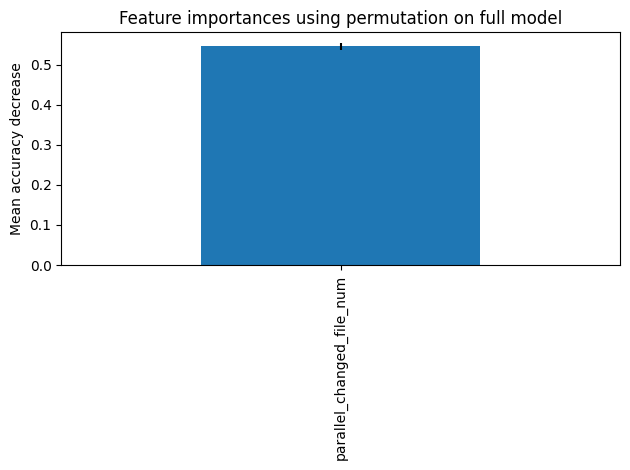

In [ ]:
permu = permutation_importance(modelo_rus, x_test, y_test, n_repeats=20, random_state=42, n_jobs=2, scoring='f1')

# Umbral para valores significativos
importance_threshold = 0.01

# Filtrar los caracteristicas
significant_indices = permu.importances_mean > importance_threshold
permu_importances = pd.Series(permu.importances_mean.round(3), index=feature_names)[significant_indices]
permu_std = permu.importances_std[significant_indices]

# Crear la representación gráfica
fig, ax = plt.subplots()
permu_importances.plot.bar(yerr=permu_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

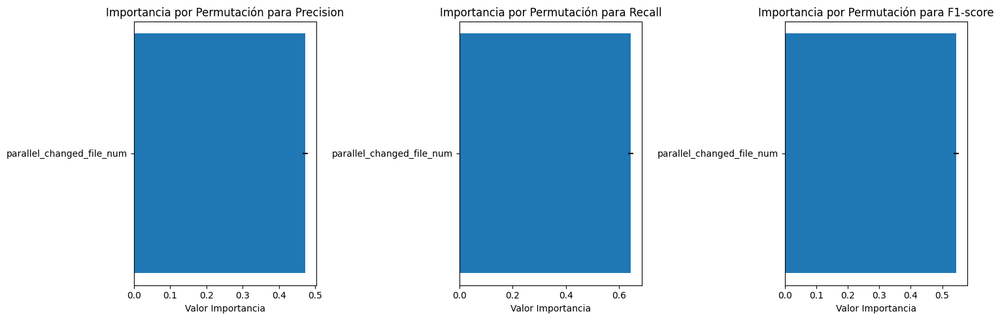

In [ ]:
scoring = ['precision', 'recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

permu_score = permutation_importance(modelo_rus, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Umbral para importancias significativas
importance_threshold = 0.01

# Itera a través de las métricas
for i, metric in enumerate(scoring):
    permu = permu_score[metric]

    # Filtra las características que cumplen la condición del umbral
    significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
    sorted_feature_names = [feature_names[j] for j in significant_indices]
    importances_mean = permu.importances_mean[significant_indices]
    importances_std = permu.importances_std[significant_indices]

    # Ordena los datos por importancia de mayor a menor
    sorted_indices = np.argsort(importances_mean)[::1]
    sorted_feature_names = [sorted_feature_names[j] for j in sorted_indices]
    importances_mean = importances_mean[sorted_indices]
    importances_std = importances_std[sorted_indices]

    # Crea la representación gráfica en el subplot correspondiente
    axs[i].barh(range(len(sorted_feature_names)), importances_mean, xerr=importances_std, align='center')
    axs[i].set_yticks(range(len(sorted_feature_names)))
    axs[i].set_yticklabels(sorted_feature_names)
    axs[i].set_xlabel('Valor Importancia')
    axs[i].set_title(f'Importancia por Permutación para {metric_names[i]}')

# Ajusta los espacios entre subplots y muestra la figura
plt.tight_layout()
plt.show()


In [ ]:
scoring = ['precision','recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

# Umbral para importancias significativas
importance_threshold = 0.01

# Crea un diccionario para almacenar los DataFrames
results_global_rus = {}

permu_score = permutation_importance(modelo_rus, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
for i, metric in enumerate(scoring):
  permu = permu_score[metric]

  # Filtra las características que cumplen la condición
  significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
  sorted_feature_names = [feature_names[j] for j in significant_indices]
  importances_mean = permu.importances_mean[significant_indices]
  importances_std = permu.importances_std[significant_indices]

  # Crear un DataFrame con los resultados
  df_exp_global = pd.DataFrame({'Feature': sorted_feature_names,
                       'Importance_Mean': importances_mean,
                       'Importance_Std': importances_std})

  # Ordenar el DataFrame por importance_mean en orden descendente
  df_exp_global = df_exp_global.sort_values(by='Importance_Mean', ascending=False)

  # Asignar el DataFrame al diccionario con el nombre de la métrica
  results_global_rus[f'df_global_{metric_names[i]}'] = df_exp_global

In [ ]:
results_global_rus['df_global_Precision']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.472056,0.006647


In [ ]:
results_global_rus['df_global_Recall']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.643949,0.009067


In [ ]:
results_global_rus['df_global_F1-score']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.544765,0.00767


**BREAK-DOWN, SHAP Y LIME:**

In [ ]:
#primero definimos el explainer
exp = dx.Explainer(modelo_rus, x_train, y_train)

Preparation of a new explainer is initiated

  -> data              : 28090 rows 25 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 28090 values
  -> model_class       : imblearn.ensemble._weight_boosting.RUSBoostClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x7ea4d39cf130> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.354, mean = 0.398, max = 0.608
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.608, mean = -0.322, max = 0.646
  -> model_info        : package imblearn

A new explainer has been created!


### **Instancia VP MAX:**

In [ ]:
breakdown_vp_max = exp.predict_parts(df_instancia_vp_max, type="break_down",random_state=42)
shap_vp_max = exp.predict_parts(df_instancia_vp_max, type="shap",random_state=42)
lime_vp_max = exp.predict_surrogate(df_instancia_vp_max, random_state=42)

breakdown_vp_df_max = breakdown_vp_max.result
shap_vp_df_max = shap_vp_max.result
lime_vp_df_max=lime_vp_max.result

In [ ]:
breakdown_vp_max.plot()

In [ ]:
shap_vp_max.plot()

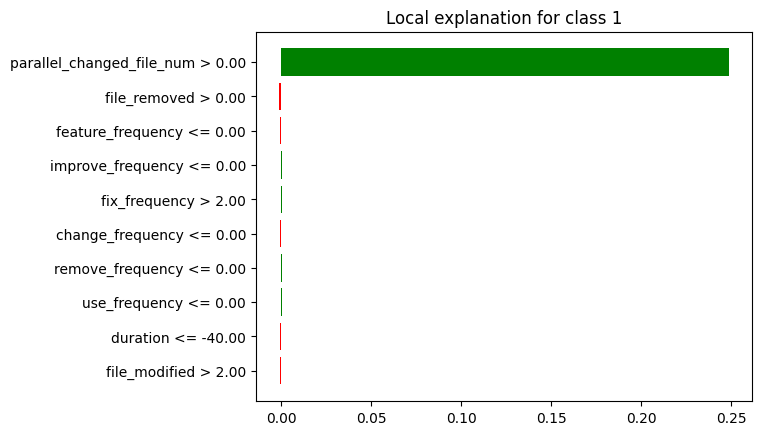

In [ ]:
lime_vp_max.plot()

In [ ]:
breakdown_vp_df_max = breakdown_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_max = breakdown_vp_df_max.drop(index=[0, 26])
breakdown_vp_df_max['sign'] = breakdown_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_max = breakdown_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_max = shap_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_max = shap_vp_df_max.tail(25)
shap_vp_df_max['sign'] = shap_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_max = shap_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_max["Variable"] = lime_vp_df_max["variable"].str.split(" ").str[0]
lime_vp_df_max["Signo"] = lime_vp_df_max["effect"].apply(evaluar_valor)
lime_vp_df_max = lime_vp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_max = lime_vp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_max['Ranking'] = breakdown_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_max = breakdown_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_max['Ranking'] = shap_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_max = shap_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_max['Ranking'] = lime_vp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_max = lime_vp_df_max.head(5)
lime_vp_df_max = lime_vp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_max = breakdown_vp_df_max.drop(columns=['contribution'])
shap_vp_df_max = shap_vp_df_max.drop(columns=['contribution'])
lime_vp_df_max = lime_vp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_max = breakdown_vp_df_max.head(5)
breakdown_vp_df_max = breakdown_vp_df_max.reset_index(drop=True)

shap_vp_df_max = shap_vp_df_max.head(5)
shap_vp_df_max = shap_vp_df_max.reset_index(drop=True)

lime_vp_df_max = lime_vp_df_max.reset_index(drop=True)

print(breakdown_vp_df_max)
print(shap_vp_df_max)
print(lime_vp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               messages_max       13      Nulo
2               messages_min       13      Nulo
3              use_frequency       13      Nulo
4           update_frequency       13      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              bug_frequency       13      Nulo
2           change_frequency       13      Nulo
3             commit_density       13      Nulo
4                 commit_num       13      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               file_removed        2  Negativo
2          feature_frequency        3  Negativo
3          improve_frequency        4  Positivo
4              fix_frequency        5  Positivo


In [ ]:
#lime_vp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_max['Variable'])
shapley_features = list(shap_vp_df_max['Variable'])
lime_features = list(lime_vp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_max[breakdown_vp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_max[shap_vp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_max[lime_vp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'messages_max', 'messages_min', 'use_frequency', 'update_frequency']
['parallel_changed_file_num', 'bug_frequency', 'change_frequency', 'commit_density', 'commit_num']
['parallel_changed_file_num', 'file_removed', 'feature_frequency', 'improve_frequency', 'fix_frequency']
['improve_frequency', 'update_frequency', 'change_frequency', 'commit_density', 'bug_frequency', 'commit_num', 'fix_frequency', 'file_removed', 'messages_max', 'parallel_changed_file_num', 'messages_min', 'feature_frequency', 'use_frequency']


Variable Breakdown           Shapley              Lime  \
                                Ranking     Signo Ranking     Signo Ranking   
0           improve_frequency         -         -       -         -       4   
1            update_frequency        13      Nulo       -         -       -   
2            change_frequency         -         -      13      Nulo       -   
3              commit_density         -         -      13      Nulo       -   
4               bug_frequency         -         -      13      Nulo       -   
5                  commit_num         -         -      13      Nulo       -   
6               fix_frequency         -         -       -         -       5   
7                file_removed         -         -       -         -       2   
8                messages_max        13      Nulo       -         -       -   
9   parallel_changed_file_num         1  Positivo       1  Positivo       1   
10               messages_min        13      Nulo       -         -       -   
11          feature_frequency         -         -       -         -       3   
12              use_frequency        13      Nulo       -         -       -   

              
       Signo  
0   Positivo  
1          -  
2          -  
3          -  
4          -  
5          -  
6   Positivo  
7   Negativo  
8          -  
9   Positivo  
10         -  
11  Negativo  
12         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "file_removed", "feature_frequency", "improve_frequency", "fix_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
file_removed                      -         -       -         -       2   
feature_frequency                 -         -       -         -       3   
improve_frequency                 -         -       -         -       4   
fix_frequency                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
file_removed               Negativo  
feature_frequency          Negativo  
improve_frequency          Positivo  
fix_frequency              Positivo

### **Instancia VP MEDIANA:**

In [ ]:
breakdown_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="break_down",random_state=42)
shap_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="shap",random_state=42)
lime_vp_mediana = exp.predict_surrogate(df_instancia_vp_mediana, random_state=42)

breakdown_vp_df_mediana = breakdown_vp_mediana.result
shap_vp_df_mediana = shap_vp_mediana.result
lime_vp_df_mediana=lime_vp_mediana.result

In [ ]:
breakdown_vp_mediana.plot()

In [ ]:
shap_vp_mediana.plot()

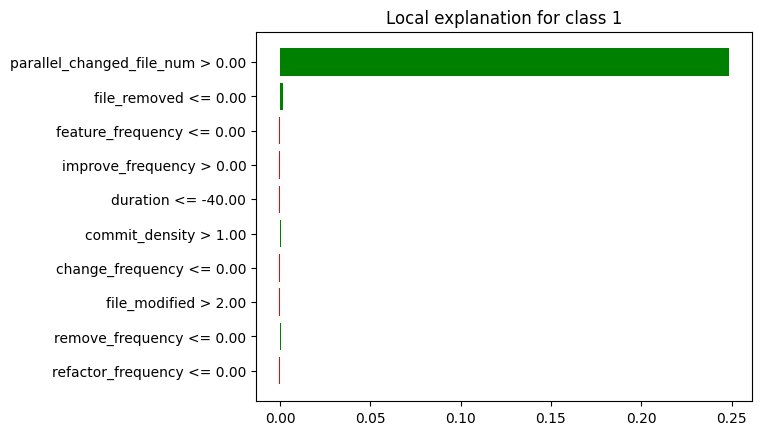

In [ ]:
lime_vp_mediana.plot()

In [ ]:
breakdown_vp_df_mediana = breakdown_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(index=[0, 26])
breakdown_vp_df_mediana['sign'] = breakdown_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_mediana = breakdown_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_mediana = shap_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_mediana = shap_vp_df_mediana.tail(25)
shap_vp_df_mediana['sign'] = shap_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_mediana = shap_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_mediana["Variable"] = lime_vp_df_mediana["variable"].str.split(" ").str[0]
lime_vp_df_mediana["Signo"] = lime_vp_df_mediana["effect"].apply(evaluar_valor)
lime_vp_df_mediana = lime_vp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_mediana['Ranking'] = breakdown_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_mediana = breakdown_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_mediana['Ranking'] = shap_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_mediana = shap_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_mediana['Ranking'] = lime_vp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_mediana = lime_vp_df_mediana.head(5)
lime_vp_df_mediana = lime_vp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(columns=['contribution'])
shap_vp_df_mediana = shap_vp_df_mediana.drop(columns=['contribution'])
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_mediana = breakdown_vp_df_mediana.head(5)
breakdown_vp_df_mediana = breakdown_vp_df_mediana.reset_index(drop=True)

shap_vp_df_mediana = shap_vp_df_mediana.head(5)
shap_vp_df_mediana = shap_vp_df_mediana.reset_index(drop=True)

lime_vp_df_mediana = lime_vp_df_mediana.reset_index(drop=True)

print(breakdown_vp_df_mediana)
print(shap_vp_df_mediana)
print(lime_vp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               messages_max       13      Nulo
2               messages_min       13      Nulo
3              use_frequency       13      Nulo
4           update_frequency       13      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              bug_frequency       13      Nulo
2           change_frequency       13      Nulo
3             commit_density       13      Nulo
4                 commit_num       13      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               file_removed        2  Positivo
2          feature_frequency        3  Negativo
3          improve_frequency        4  Negativo
4                   duration        5  Negativo


In [ ]:
#lime_vp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_mediana['Variable'])
shapley_features = list(shap_vp_df_mediana['Variable'])
lime_features = list(lime_vp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_mediana[breakdown_vp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_mediana[shap_vp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_mediana[lime_vp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'messages_max', 'messages_min', 'use_frequency', 'update_frequency']
['parallel_changed_file_num', 'bug_frequency', 'change_frequency', 'commit_density', 'commit_num']
['parallel_changed_file_num', 'file_removed', 'feature_frequency', 'improve_frequency', 'duration']
['improve_frequency', 'update_frequency', 'change_frequency', 'commit_density', 'bug_frequency', 'commit_num', 'duration', 'file_removed', 'messages_max', 'parallel_changed_file_num', 'messages_min', 'feature_frequency', 'use_frequency']


Variable Breakdown           Shapley              Lime  \
                                Ranking     Signo Ranking     Signo Ranking   
0           improve_frequency         -         -       -         -       4   
1            update_frequency        13      Nulo       -         -       -   
2            change_frequency         -         -      13      Nulo       -   
3              commit_density         -         -      13      Nulo       -   
4               bug_frequency         -         -      13      Nulo       -   
5                  commit_num         -         -      13      Nulo       -   
6                    duration         -         -       -         -       5   
7                file_removed         -         -       -         -       2   
8                messages_max        13      Nulo       -         -       -   
9   parallel_changed_file_num         1  Positivo       1  Positivo       1   
10               messages_min        13      Nulo       -         -       -   
11          feature_frequency         -         -       -         -       3   
12              use_frequency        13      Nulo       -         -       -   

              
       Signo  
0   Negativo  
1          -  
2          -  
3          -  
4          -  
5          -  
6   Negativo  
7   Positivo  
8          -  
9   Positivo  
10         -  
11  Negativo  
12         -

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "file_removed", "feature_frequency", "improve_frequency", "duration"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
file_removed                      -         -       -         -       2   
feature_frequency                 -         -       -         -       3   
improve_frequency                 -         -       -         -       4   
duration                          -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
file_removed               Positivo  
feature_frequency          Negativo  
improve_frequency          Negativo  
duration                   Negativo

### **Instancia VP MIN:**

In [ ]:
breakdown_vp_min = exp.predict_parts(df_instancia_vp_min, type="break_down",random_state=42)
shap_vp_min = exp.predict_parts(df_instancia_vp_min, type="shap",random_state=42)
lime_vp_min = exp.predict_surrogate(df_instancia_vp_min, random_state=42)

breakdown_vp_df_min = breakdown_vp_min.result
shap_vp_df_min = shap_vp_min.result
lime_vp_df_min = lime_vp_min.result

In [ ]:
breakdown_vp_min.plot()

In [ ]:
shap_vp_min.plot()

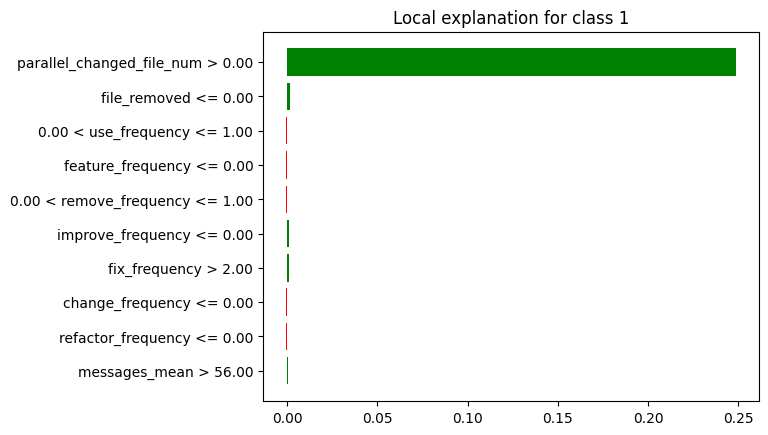

In [ ]:
lime_vp_min.plot()

In [ ]:
breakdown_vp_df_min = breakdown_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_min = breakdown_vp_df_min.drop(index=[0, 26])
breakdown_vp_df_min['sign'] = breakdown_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_min = breakdown_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_min = shap_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_min = shap_vp_df_min.tail(25)
shap_vp_df_min['sign'] = shap_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_min = shap_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_min["Variable"] = lime_vp_df_min["variable"].str.split(" ").str[0]
lime_vp_df_min["Signo"] = lime_vp_df_min["effect"].apply(evaluar_valor)
lime_vp_df_min = lime_vp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_min = lime_vp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_min['Ranking'] = breakdown_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_min = breakdown_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_min['Ranking'] = shap_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_min = shap_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_min['Ranking'] = lime_vp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_min = lime_vp_df_min.head(5)
lime_vp_df_min = lime_vp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_min = breakdown_vp_df_min.drop(columns=['contribution'])
shap_vp_df_min = shap_vp_df_min.drop(columns=['contribution'])
lime_vp_df_min = lime_vp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_min = breakdown_vp_df_min.head(5)
breakdown_vp_df_min = breakdown_vp_df_min.reset_index(drop=True)

shap_vp_df_min = shap_vp_df_min.head(5)
shap_vp_df_min = shap_vp_df_min.reset_index(drop=True)

lime_vp_df_min = lime_vp_df_min.reset_index(drop=True)
lime_vp_df_min.at[2, 'Variable'] = 'use_frequency'
lime_vp_df_min.at[4, 'Variable'] = 'remove_frequency'

print(breakdown_vp_df_min)
print(shap_vp_df_min)
print(lime_vp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               messages_max       13      Nulo
2               messages_min       13      Nulo
3              use_frequency       13      Nulo
4           update_frequency       13      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              bug_frequency       13      Nulo
2           change_frequency       13      Nulo
3             commit_density       13      Nulo
4                 commit_num       13      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               file_removed        2  Positivo
2              use_frequency        3  Negativo
3          feature_frequency        4  Negativo
4           remove_frequency        5  Negativo


In [ ]:
#lime_vp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_min['Variable'])
shapley_features = list(shap_vp_df_min['Variable'])
lime_features = list(lime_vp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_min[breakdown_vp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_min[shap_vp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_min[lime_vp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'messages_max', 'messages_min', 'use_frequency', 'update_frequency']
['parallel_changed_file_num', 'bug_frequency', 'change_frequency', 'commit_density', 'commit_num']
['parallel_changed_file_num', 'file_removed', 'use_frequency', 'feature_frequency', 'remove_frequency']
['update_frequency', 'change_frequency', 'commit_density', 'bug_frequency', 'commit_num', 'remove_frequency', 'file_removed', 'messages_max', 'parallel_changed_file_num', 'messages_min', 'feature_frequency', 'use_frequency']


Variable Breakdown           Shapley              Lime  \
                                Ranking     Signo Ranking     Signo Ranking   
0            update_frequency        13      Nulo       -         -       -   
1            change_frequency         -         -      13      Nulo       -   
2              commit_density         -         -      13      Nulo       -   
3               bug_frequency         -         -      13      Nulo       -   
4                  commit_num         -         -      13      Nulo       -   
5            remove_frequency         -         -       -         -       5   
6                file_removed         -         -       -         -       2   
7                messages_max        13      Nulo       -         -       -   
8   parallel_changed_file_num         1  Positivo       1  Positivo       1   
9                messages_min        13      Nulo       -         -       -   
10          feature_frequency         -         -       -         -       4   
11              use_frequency        13      Nulo       -         -       3   

              
       Signo  
0          -  
1          -  
2          -  
3          -  
4          -  
5   Negativo  
6   Positivo  
7          -  
8   Positivo  
9          -  
10  Negativo  
11  Negativo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "file_removed", "use_frequency", "feature_frequency", "remove_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
file_removed                      -         -       -         -       2   
use_frequency                    13      Nulo       -         -       3   
feature_frequency                 -         -       -         -       4   
remove_frequency                  -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
file_removed               Positivo  
use_frequency              Negativo  
feature_frequency          Negativo  
remove_frequency           Negativo

### **VP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('parallel_changed_file_num', 1), ('parallel_changed_file_num', 1), ('use_frequency', 13)], 'Shapley': [('parallel_changed_file_num', 1), ('parallel_changed_file_num', 1), ('parallel_changed_file_num', 1)], 'Lime': [('parallel_changed_file_num', 1), ('file_removed', 2), ('feature_frequency', 3), ('improve_frequency', 4), ('fix_frequency', 5), ('parallel_changed_file_num', 1), ('file_removed', 2), ('feature_frequency', 3), ('improve_frequency', 4), ('duration', 5), ('parallel_changed_file_num', 1), ('file_removed', 2), ('use_frequency', 3), ('feature_frequency', 4), ('remove_frequency', 5)]}
{'Breakdown': {'parallel_changed_file_num': 3, 'use_frequency': 1}, 'Shapley': {'parallel_changed_file_num': 3}, 'Lime': {'parallel_changed_file_num': 3, 'file_removed': 3, 'feature_frequency': 3, 'improve_frequency': 2, 'fix_frequency': 1, 'duration': 1, 'use_frequency': 1, 'remove_frequency': 1}}
{'Breakdown': {'parallel_changed_file_num': 1.0, 'use

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_rus_vp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_rus_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
use_frequency                      13.0      1             -      -   
feature_frequency                     -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
remove_frequency                      -      -             -      -   
fix_frequency                         -      -             -      -   
duration                              -      -             -      -   
file_removed                          -      -             -      -   
improve_frequency                     -      -             -      -   

                                   Lime         
                          Ranking Medio Conteo  
use_frequency                  3.000000      1  
feature_frequency              3.333333      3  
parallel_changed_file_num      1.000000      3  
remove_frequency               5.000000      1  
fix_frequency                  5.000000      1  
duration                       5.000000      1  
file_removed                   2.000000      3  
improve_frequency              4.000000      2

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_rus_vp[("General", "Ranking")] = df_resumen_rus_vp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_rus_vp[("General", "Conteo Total")] = df_resumen_rus_vp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_rus_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
use_frequency                      13.0      1             -      -   
feature_frequency                     -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
remove_frequency                      -      -             -      -   
fix_frequency                         -      -             -      -   
duration                              -      -             -      -   
file_removed                          -      -             -      -   
improve_frequency                     -      -             -      -   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
use_frequency                  3.000000      1  8.000000            2  
feature_frequency              3.333333      3  3.333333            3  
parallel_changed_file_num      1.000000      3  1.000000            9  
remove_frequency               5.000000      1  5.000000            1  
fix_frequency                  5.000000      1  5.000000            1  
duration                       5.000000      1  5.000000            1  
file_removed                   2.000000      3  2.000000            3  
improve_frequency              4.000000      2  4.000000            2

In [ ]:
# Obtener el número de características
num_caract = df_resumen_rus_vp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_rus_vp[("General", "Peso Rango")] = 1 - ((df_resumen_rus_vp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_rus_vp[("General", "Peso Conteo")] = df_resumen_rus_vp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_rus_vp[("General", "Puntaje")] = df_resumen_rus_vp[("General", "Peso Rango")] + df_resumen_rus_vp[("General", "Peso Conteo")]
df_resumen_rus_vp[("General", "Ranking")] = df_resumen_rus_vp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_rus_vp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_rus_vp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_rus_vp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_rus_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
use_frequency                      13.0      1             -      -   
feature_frequency                     -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
remove_frequency                      -      -             -      -   
fix_frequency                         -      -             -      -   
duration                              -      -             -      -   
file_removed                          -      -             -      -   
improve_frequency                     -      -             -      -   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
use_frequency                  3.000000      1     5.0            2  
feature_frequency              3.333333      3     3.0            3  
parallel_changed_file_num      1.000000      3     1.0            9  
remove_frequency               5.000000      1     6.0            1  
fix_frequency                  5.000000      1     6.0            1  
duration                       5.000000      1     6.0            1  
file_removed                   2.000000      3     2.0            3  
improve_frequency              4.000000      2     4.0            2

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_rus_vp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_rus_vp = df_resumen_rus_vp[new_columns]

In [ ]:
df_resumen_rus_vp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_rus_vp[(tech, "Ranking Medio")] = df_resumen_rus_vp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_rus_vp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
file_removed                  2.0            3             -      -   
feature_frequency             3.0            3             -      -   
improve_frequency             4.0            2             -      -   
use_frequency                 5.0            2         13.00      1   
remove_frequency              6.0            1             -      -   
fix_frequency                 6.0            1             -      -   
duration                      6.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
file_removed                          -      -          2.00      3  
feature_frequency                     -      -          3.33      3  
improve_frequency                     -      -          4.00      2  
use_frequency                         -      -          3.00      1  
remove_frequency                      -      -          5.00      1  
fix_frequency                         -      -          5.00      1  
duration                              -      -          5.00      1

### **Instancia VN MAX:**

In [ ]:
breakdown_vn_max = exp.predict_parts(df_instancia_vn_max, type="break_down",random_state=42)
shap_vn_max = exp.predict_parts(df_instancia_vn_max, type="shap",random_state=42)
lime_vn_max = exp.predict_surrogate(df_instancia_vn_max, random_state=42)

breakdown_vn_df_max = breakdown_vn_max.result
shap_vn_df_max = shap_vn_max.result
lime_vn_df_max = lime_vn_max.result

In [ ]:
breakdown_vn_max.plot()

In [ ]:
shap_vn_max.plot()

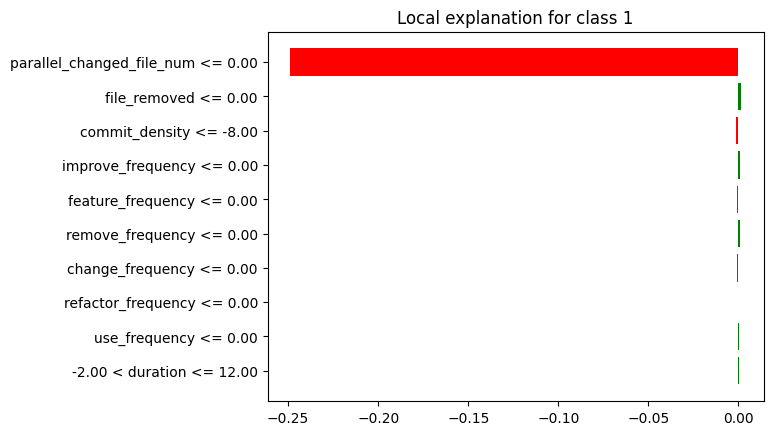

In [ ]:
lime_vn_max.plot()

In [ ]:
breakdown_vn_df_max = breakdown_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_max = breakdown_vn_df_max.drop(index=[0, 26])
breakdown_vn_df_max['sign'] = breakdown_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_max = breakdown_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_max = shap_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_max = shap_vn_df_max.tail(25)
shap_vn_df_max['sign'] = shap_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_max = shap_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_max["Variable"] = lime_vn_df_max["variable"].str.split(" ").str[0]
lime_vn_df_max["Signo"] = lime_vn_df_max["effect"].apply(evaluar_valor)
lime_vn_df_max = lime_vn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_max = lime_vn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_max['Ranking'] = breakdown_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_max = breakdown_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_max['Ranking'] = shap_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_max = shap_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_max['Ranking'] = lime_vn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_max = lime_vn_df_max.head(5)
lime_vn_df_max = lime_vn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_vn_df_max = breakdown_vn_df_max.drop(columns=['contribution'])
shap_vn_df_max = shap_vn_df_max.drop(columns=['contribution'])
lime_vn_df_max = lime_vn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_max = breakdown_vn_df_max.head(5)
breakdown_vn_df_max = breakdown_vn_df_max.reset_index(drop=True)

shap_vn_df_max = shap_vn_df_max.head(5)
shap_vn_df_max = shap_vn_df_max.reset_index(drop=True)

lime_vn_df_max = lime_vn_df_max.reset_index(drop=True)

print(breakdown_vn_df_max)
print(shap_vn_df_max)
print(lime_vn_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               messages_max       13      Nulo
2               messages_min       13      Nulo
3              use_frequency       13      Nulo
4           update_frequency       13      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              bug_frequency       13      Nulo
2           change_frequency       13      Nulo
3             commit_density       13      Nulo
4                 commit_num       13      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               file_removed        2  Positivo
2             commit_density        3  Negativo
3          improve_frequency        4  Positivo
4          feature_frequency        5  Negativo


In [ ]:
#lime_vn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_max['Variable'])
shapley_features = list(shap_vn_df_max['Variable'])
lime_features = list(lime_vn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_max[breakdown_vn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_max[shap_vn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_max[lime_vn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'messages_max', 'messages_min', 'use_frequency', 'update_frequency']
['parallel_changed_file_num', 'bug_frequency', 'change_frequency', 'commit_density', 'commit_num']
['parallel_changed_file_num', 'file_removed', 'commit_density', 'improve_frequency', 'feature_frequency']
['improve_frequency', 'update_frequency', 'change_frequency', 'commit_density', 'bug_frequency', 'commit_num', 'file_removed', 'messages_max', 'parallel_changed_file_num', 'messages_min', 'feature_frequency', 'use_frequency']


Variable Breakdown           Shapley              Lime  \
                                Ranking     Signo Ranking     Signo Ranking   
0           improve_frequency         -         -       -         -       4   
1            update_frequency        13      Nulo       -         -       -   
2            change_frequency         -         -      13      Nulo       -   
3              commit_density         -         -      13      Nulo       3   
4               bug_frequency         -         -      13      Nulo       -   
5                  commit_num         -         -      13      Nulo       -   
6                file_removed         -         -       -         -       2   
7                messages_max        13      Nulo       -         -       -   
8   parallel_changed_file_num         1  Negativo       1  Negativo       1   
9                messages_min        13      Nulo       -         -       -   
10          feature_frequency         -         -       -         -       5   
11              use_frequency        13      Nulo       -         -       -   

              
       Signo  
0   Positivo  
1          -  
2          -  
3   Negativo  
4          -  
5          -  
6   Positivo  
7          -  
8   Negativo  
9          -  
10  Negativo  
11         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "file_removed", "commit_density", "improve_frequency", "feature_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
file_removed                      -         -       -         -       2   
commit_density                    -         -      13      Nulo       3   
improve_frequency                 -         -       -         -       4   
feature_frequency                 -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
file_removed               Positivo  
commit_density             Negativo  
improve_frequency          Positivo  
feature_frequency          Negativo

### **Instancia VN MEDIANA:**

In [ ]:
breakdown_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="break_down",random_state=42)
shap_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="shap",random_state=42)
lime_vn_mediana = exp.predict_surrogate(df_instancia_vn_mediana, random_state=42)

breakdown_vn_df_mediana = breakdown_vn_mediana.result
shap_vn_df_mediana = shap_vn_mediana.result
lime_vn_df_mediana = lime_vn_mediana.result

In [ ]:
breakdown_vn_mediana.plot()

In [ ]:
shap_vn_mediana.plot()

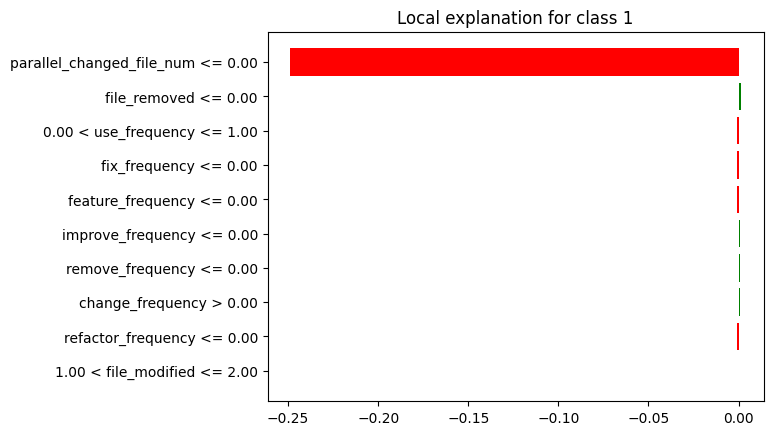

In [ ]:
lime_vn_mediana.plot()

In [ ]:
breakdown_vn_df_mediana = breakdown_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(index=[0, 26])
breakdown_vn_df_mediana['sign'] = breakdown_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_mediana = breakdown_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_mediana = shap_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_mediana = shap_vn_df_mediana.tail(25)
shap_vn_df_mediana['sign'] = shap_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_mediana = shap_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_mediana["Variable"] = lime_vn_df_mediana["variable"].str.split(" ").str[0]
lime_vn_df_mediana["Signo"] = lime_vn_df_mediana["effect"].apply(evaluar_valor)
lime_vn_df_mediana = lime_vn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_mediana['Ranking'] = breakdown_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_mediana = breakdown_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_mediana['Ranking'] = shap_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_mediana = shap_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_mediana['Ranking'] = lime_vn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_mediana = lime_vn_df_mediana.head(5)
lime_vn_df_mediana = lime_vn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(columns=['contribution'])
shap_vn_df_mediana = shap_vn_df_mediana.drop(columns=['contribution'])
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_mediana = breakdown_vn_df_mediana.head(5)
breakdown_vn_df_mediana = breakdown_vn_df_mediana.reset_index(drop=True)

shap_vn_df_mediana = shap_vn_df_mediana.head(5)
shap_vn_df_mediana = shap_vn_df_mediana.reset_index(drop=True)

lime_vn_df_mediana = lime_vn_df_mediana.reset_index(drop=True)
lime_vn_df_mediana.at[2, 'Variable'] = 'use_frequency'

print(breakdown_vn_df_mediana)
print(shap_vn_df_mediana)
print(lime_vn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               messages_max       13      Nulo
2               messages_min       13      Nulo
3              use_frequency       13      Nulo
4           update_frequency       13      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              bug_frequency       13      Nulo
2           change_frequency       13      Nulo
3             commit_density       13      Nulo
4                 commit_num       13      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               file_removed        2  Positivo
2              use_frequency        3  Negativo
3              fix_frequency        4  Negativo
4          feature_frequency        5  Negativo


In [ ]:
#lime_vn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_mediana['Variable'])
shapley_features = list(shap_vn_df_mediana['Variable'])
lime_features = list(lime_vn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_mediana[breakdown_vn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_mediana[shap_vn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_mediana[lime_vn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'messages_max', 'messages_min', 'use_frequency', 'update_frequency']
['parallel_changed_file_num', 'bug_frequency', 'change_frequency', 'commit_density', 'commit_num']
['parallel_changed_file_num', 'file_removed', 'use_frequency', 'fix_frequency', 'feature_frequency']
['update_frequency', 'change_frequency', 'commit_density', 'bug_frequency', 'commit_num', 'fix_frequency', 'file_removed', 'messages_max', 'parallel_changed_file_num', 'messages_min', 'feature_frequency', 'use_frequency']


Variable Breakdown           Shapley              Lime  \
                                Ranking     Signo Ranking     Signo Ranking   
0            update_frequency        13      Nulo       -         -       -   
1            change_frequency         -         -      13      Nulo       -   
2              commit_density         -         -      13      Nulo       -   
3               bug_frequency         -         -      13      Nulo       -   
4                  commit_num         -         -      13      Nulo       -   
5               fix_frequency         -         -       -         -       4   
6                file_removed         -         -       -         -       2   
7                messages_max        13      Nulo       -         -       -   
8   parallel_changed_file_num         1  Negativo       1  Negativo       1   
9                messages_min        13      Nulo       -         -       -   
10          feature_frequency         -         -       -         -       5   
11              use_frequency        13      Nulo       -         -       3   

              
       Signo  
0          -  
1          -  
2          -  
3          -  
4          -  
5   Negativo  
6   Positivo  
7          -  
8   Negativo  
9          -  
10  Negativo  
11  Negativo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "file_removed", "use_frequency", "fix_frequency", "feature_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
file_removed                      -         -       -         -       2   
use_frequency                    13      Nulo       -         -       3   
fix_frequency                     -         -       -         -       4   
feature_frequency                 -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
file_removed               Positivo  
use_frequency              Negativo  
fix_frequency              Negativo  
feature_frequency          Negativo

### **Instancia VN MIN:**

In [ ]:
breakdown_vn_min = exp.predict_parts(df_instancia_vn_min, type="break_down",random_state=42)
shap_vn_min = exp.predict_parts(df_instancia_vn_min, type="shap",random_state=42)
lime_vn_min = exp.predict_surrogate(df_instancia_vn_min, random_state=42)

breakdown_vn_df_min = breakdown_vn_min.result
shap_vn_df_min = shap_vn_min.result
lime_vn_df_min = lime_vn_min.result

In [ ]:
breakdown_vn_min.plot()

In [ ]:
shap_vn_min.plot()

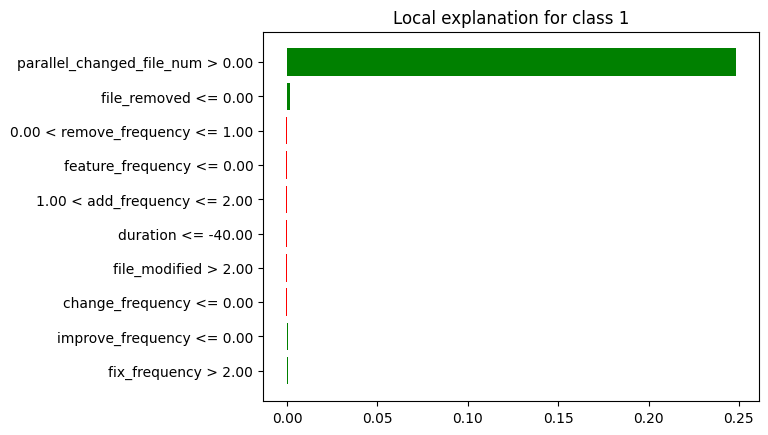

In [ ]:
lime_vn_min.plot()

In [ ]:
breakdown_vn_df_min = breakdown_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_min = breakdown_vn_df_min.drop(index=[0, 26])
breakdown_vn_df_min['sign'] = breakdown_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_min = breakdown_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_min = shap_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_min = shap_vn_df_min.tail(25)
shap_vn_df_min['sign'] = shap_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_min = shap_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_min["Variable"] = lime_vn_df_min["variable"].str.split(" ").str[0]
lime_vn_df_min["Signo"] = lime_vn_df_min["effect"].apply(evaluar_valor)
lime_vn_df_min = lime_vn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_min = lime_vn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_min['Ranking'] = breakdown_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_min = breakdown_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_min['Ranking'] = shap_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_min = shap_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_min['Ranking'] = lime_vn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_min = lime_vn_df_min.head(5)
lime_vn_df_min = lime_vn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vn_df_min = breakdown_vn_df_min.drop(columns=['contribution'])
shap_vn_df_min = shap_vn_df_min.drop(columns=['contribution'])
lime_vn_df_min = lime_vn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_min = breakdown_vn_df_min.head(5)
breakdown_vn_df_min = breakdown_vn_df_min.reset_index(drop=True)

shap_vn_df_min = shap_vn_df_min.head(5)
shap_vn_df_min = shap_vn_df_min.reset_index(drop=True)

lime_vn_df_min = lime_vn_df_min.reset_index(drop=True)
lime_vn_df_min.at[2, 'Variable'] = 'remove_frequency'
lime_vn_df_min.at[4, 'Variable'] = 'add_frequency'

print(breakdown_vn_df_min)
print(shap_vn_df_min)
print(lime_vn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               messages_max       13      Nulo
2               messages_min       13      Nulo
3              use_frequency       13      Nulo
4           update_frequency       13      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              bug_frequency       13      Nulo
2           change_frequency       13      Nulo
3             commit_density       13      Nulo
4                 commit_num       13      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               file_removed        2  Positivo
2           remove_frequency        3  Negativo
3          feature_frequency        4  Negativo
4              add_frequency        5  Negativo


In [ ]:
#lime_vn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_min['Variable'])
shapley_features = list(shap_vn_df_min['Variable'])
lime_features = list(lime_vn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_min[breakdown_vn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_min[shap_vn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_min[lime_vn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'messages_max', 'messages_min', 'use_frequency', 'update_frequency']
['parallel_changed_file_num', 'bug_frequency', 'change_frequency', 'commit_density', 'commit_num']
['parallel_changed_file_num', 'file_removed', 'remove_frequency', 'feature_frequency', 'add_frequency']
['update_frequency', 'change_frequency', 'commit_density', 'bug_frequency', 'commit_num', 'remove_frequency', 'file_removed', 'messages_max', 'parallel_changed_file_num', 'messages_min', 'add_frequency', 'feature_frequency', 'use_frequency']


Variable Breakdown           Shapley              Lime  \
                                Ranking     Signo Ranking     Signo Ranking   
0            update_frequency        13      Nulo       -         -       -   
1            change_frequency         -         -      13      Nulo       -   
2              commit_density         -         -      13      Nulo       -   
3               bug_frequency         -         -      13      Nulo       -   
4                  commit_num         -         -      13      Nulo       -   
5            remove_frequency         -         -       -         -       3   
6                file_removed         -         -       -         -       2   
7                messages_max        13      Nulo       -         -       -   
8   parallel_changed_file_num         1  Positivo       1  Positivo       1   
9                messages_min        13      Nulo       -         -       -   
10              add_frequency         -         -       -         -       5   
11          feature_frequency         -         -       -         -       4   
12              use_frequency        13      Nulo       -         -       -   

              
       Signo  
0          -  
1          -  
2          -  
3          -  
4          -  
5   Negativo  
6   Positivo  
7          -  
8   Positivo  
9          -  
10  Negativo  
11  Negativo  
12         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "file_removed", "remove_frequency", "feature_frequency", "add_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
file_removed                      -         -       -         -       2   
remove_frequency                  -         -       -         -       3   
feature_frequency                 -         -       -         -       4   
add_frequency                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
file_removed               Positivo  
remove_frequency           Negativo  
feature_frequency          Negativo  
add_frequency              Negativo

### **VN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('parallel_changed_file_num', 1), ('use_frequency', 13), ('parallel_changed_file_num', 1)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_density', 13), ('parallel_changed_file_num', 1), ('parallel_changed_file_num', 1)], 'Lime': [('parallel_changed_file_num', 1), ('file_removed', 2), ('commit_density', 3), ('improve_frequency', 4), ('feature_frequency', 5), ('parallel_changed_file_num', 1), ('file_removed', 2), ('use_frequency', 3), ('fix_frequency', 4), ('feature_frequency', 5), ('parallel_changed_file_num', 1), ('file_removed', 2), ('remove_frequency', 3), ('feature_frequency', 4), ('add_frequency', 5)]}
{'Breakdown': {'parallel_changed_file_num': 3, 'use_frequency': 1}, 'Shapley': {'parallel_changed_file_num': 3, 'commit_density': 1}, 'Lime': {'parallel_changed_file_num': 3, 'file_removed': 3, 'commit_density': 1, 'improve_frequency': 1, 'feature_frequency': 3, 'use_frequency': 1, 'fix_frequency': 1, 'remove_frequency': 1, '

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_rus_vn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_rus_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
use_frequency                      13.0      1             -      -   
feature_frequency                     -      -             -      -   
add_frequency                         -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
remove_frequency                      -      -             -      -   
fix_frequency                         -      -             -      -   
file_removed                          -      -             -      -   
commit_density                        -      -          13.0      1   
improve_frequency                     -      -             -      -   

                                   Lime         
                          Ranking Medio Conteo  
use_frequency                  3.000000      1  
feature_frequency              4.666667      3  
add_frequency                  5.000000      1  
parallel_changed_file_num      1.000000      3  
remove_frequency               3.000000      1  
fix_frequency                  4.000000      1  
file_removed                   2.000000      3  
commit_density                 3.000000      1  
improve_frequency              4.000000      1

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_rus_vn[("General", "Ranking")] = df_resumen_rus_vn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_rus_vn[("General", "Conteo Total")] = df_resumen_rus_vn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_rus_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
use_frequency                      13.0      1             -      -   
feature_frequency                     -      -             -      -   
add_frequency                         -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
remove_frequency                      -      -             -      -   
fix_frequency                         -      -             -      -   
file_removed                          -      -             -      -   
commit_density                        -      -          13.0      1   
improve_frequency                     -      -             -      -   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
use_frequency                  3.000000      1  8.000000            2  
feature_frequency              4.666667      3  4.666667            3  
add_frequency                  5.000000      1  5.000000            1  
parallel_changed_file_num      1.000000      3  1.000000            9  
remove_frequency               3.000000      1  3.000000            1  
fix_frequency                  4.000000      1  4.000000            1  
file_removed                   2.000000      3  2.000000            3  
commit_density                 3.000000      1  8.000000            2  
improve_frequency              4.000000      1  4.000000            1

In [ ]:
# Obtener el número de características
num_caract = df_resumen_rus_vn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_rus_vn[("General", "Peso Rango")] = 1 - ((df_resumen_rus_vn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_rus_vn[("General", "Peso Conteo")] = df_resumen_rus_vn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_rus_vn[("General", "Puntaje")] = df_resumen_rus_vn[("General", "Peso Rango")] + df_resumen_rus_vn[("General", "Peso Conteo")]
df_resumen_rus_vn[("General", "Ranking")] = df_resumen_rus_vn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_rus_vn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_rus_vn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_rus_vn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_rus_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
use_frequency                      13.0      1             -      -   
feature_frequency                     -      -             -      -   
add_frequency                         -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
remove_frequency                      -      -             -      -   
fix_frequency                         -      -             -      -   
file_removed                          -      -             -      -   
commit_density                        -      -          13.0      1   
improve_frequency                     -      -             -      -   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
use_frequency                  3.000000      1     7.0            2  
feature_frequency              4.666667      3     3.0            3  
add_frequency                  5.000000      1     9.0            1  
parallel_changed_file_num      1.000000      3     1.0            9  
remove_frequency               3.000000      1     4.0            1  
fix_frequency                  4.000000      1     5.0            1  
file_removed                   2.000000      3     2.0            3  
commit_density                 3.000000      1     7.0            2  
improve_frequency              4.000000      1     5.0            1

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_rus_vn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_rus_vn = df_resumen_rus_vn[new_columns]

In [ ]:
df_resumen_rus_vn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_rus_vn[(tech, "Ranking Medio")] = df_resumen_rus_vn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_rus_vn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
file_removed                  2.0            3             -      -   
feature_frequency             3.0            3             -      -   
remove_frequency              4.0            1             -      -   
fix_frequency                 5.0            1             -      -   
improve_frequency             5.0            1             -      -   
use_frequency                 7.0            2         13.00      1   
commit_density                7.0            2             -      -   
add_frequency                 9.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
file_removed                          -      -          2.00      3  
feature_frequency                     -      -          4.67      3  
remove_frequency                      -      -          3.00      1  
fix_frequency                         -      -          4.00      1  
improve_frequency                     -      -          4.00      1  
use_frequency                         -      -          3.00      1  
commit_density                    13.00      1          3.00      1  
add_frequency                         -      -          5.00      1

### **Instancia FP MAX:**

In [ ]:
breakdown_fp_max = exp.predict_parts(df_instancia_fp_max, type="break_down",random_state=42)
shap_fp_max = exp.predict_parts(df_instancia_fp_max, type="shap",random_state=42)
lime_fp_max = exp.predict_surrogate(df_instancia_fp_max, random_state=42)

breakdown_fp_df_max = breakdown_fp_max.result
shap_fp_df_max = shap_fp_max.result
lime_fp_df_max=lime_fp_max.result

In [ ]:
breakdown_fp_max.plot()

In [ ]:
shap_fp_max.plot()

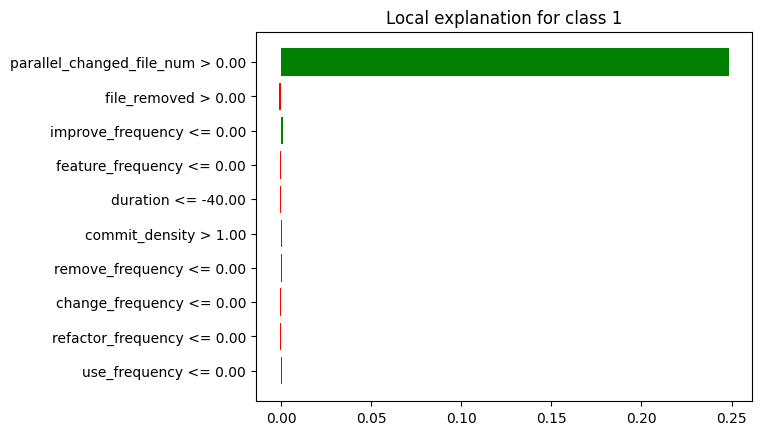

In [ ]:
lime_fp_max.plot()

In [ ]:
breakdown_fp_df_max = breakdown_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_max = breakdown_fp_df_max.drop(index=[0, 26])
breakdown_fp_df_max['sign'] = breakdown_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_max = breakdown_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_max = shap_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_max = shap_fp_df_max.tail(25)
shap_fp_df_max['sign'] = shap_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_max = shap_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_max["Variable"] = lime_fp_df_max["variable"].str.split(" ").str[0]
lime_fp_df_max["Signo"] = lime_fp_df_max["effect"].apply(evaluar_valor)
lime_fp_df_max = lime_fp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_max = lime_fp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_max['Ranking'] = breakdown_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_max = breakdown_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_max['Ranking'] = shap_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_max = shap_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_max['Ranking'] = lime_fp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_max = lime_fp_df_max.head(5)
lime_fp_df_max = lime_fp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fp_df_max = breakdown_fp_df_max.drop(columns=['contribution'])
shap_fp_df_max = shap_fp_df_max.drop(columns=['contribution'])
lime_fp_df_max = lime_fp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_max = breakdown_fp_df_max.head(5)
breakdown_fp_df_max = breakdown_fp_df_max.reset_index(drop=True)

shap_fp_df_max = shap_fp_df_max.head(5)
shap_fp_df_max = shap_fp_df_max.reset_index(drop=True)

lime_fp_df_max = lime_fp_df_max.reset_index(drop=True)

print(breakdown_fp_df_max)
print(shap_fp_df_max)
print(lime_fp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               messages_max       13      Nulo
2               messages_min       13      Nulo
3              use_frequency       13      Nulo
4           update_frequency       13      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              bug_frequency       13      Nulo
2           change_frequency       13      Nulo
3             commit_density       13      Nulo
4                 commit_num       13      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               file_removed        2  Negativo
2          improve_frequency        3  Positivo
3          feature_frequency        4  Negativo
4                   duration        5  Negativo


In [ ]:
#lime_fp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_max['Variable'])
shapley_features = list(shap_fp_df_max['Variable'])
lime_features = list(lime_fp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_max[breakdown_fp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_max[shap_fp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_max[lime_fp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'messages_max', 'messages_min', 'use_frequency', 'update_frequency']
['parallel_changed_file_num', 'bug_frequency', 'change_frequency', 'commit_density', 'commit_num']
['parallel_changed_file_num', 'file_removed', 'improve_frequency', 'feature_frequency', 'duration']
['improve_frequency', 'update_frequency', 'change_frequency', 'commit_density', 'bug_frequency', 'commit_num', 'duration', 'file_removed', 'messages_max', 'parallel_changed_file_num', 'messages_min', 'feature_frequency', 'use_frequency']


Variable Breakdown           Shapley              Lime  \
                                Ranking     Signo Ranking     Signo Ranking   
0           improve_frequency         -         -       -         -       3   
1            update_frequency        13      Nulo       -         -       -   
2            change_frequency         -         -      13      Nulo       -   
3              commit_density         -         -      13      Nulo       -   
4               bug_frequency         -         -      13      Nulo       -   
5                  commit_num         -         -      13      Nulo       -   
6                    duration         -         -       -         -       5   
7                file_removed         -         -       -         -       2   
8                messages_max        13      Nulo       -         -       -   
9   parallel_changed_file_num         1  Positivo       1  Positivo       1   
10               messages_min        13      Nulo       -         -       -   
11          feature_frequency         -         -       -         -       4   
12              use_frequency        13      Nulo       -         -       -   

              
       Signo  
0   Positivo  
1          -  
2          -  
3          -  
4          -  
5          -  
6   Negativo  
7   Negativo  
8          -  
9   Positivo  
10         -  
11  Negativo  
12         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "file_removed", "improve_frequency", "feature_frequency", "duration"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
file_removed                      -         -       -         -       2   
improve_frequency                 -         -       -         -       3   
feature_frequency                 -         -       -         -       4   
duration                          -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
file_removed               Negativo  
improve_frequency          Positivo  
feature_frequency          Negativo  
duration                   Negativo

### **Instancia FP MEDIANA:**

In [ ]:
breakdown_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="break_down",random_state=42)
shap_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="shap",random_state=42)
lime_fp_mediana = exp.predict_surrogate(df_instancia_fp_mediana, random_state=42)

breakdown_fp_df_mediana = breakdown_fp_mediana.result
shap_fp_df_mediana = shap_fp_mediana.result
lime_fp_df_mediana=lime_fp_mediana.result

In [ ]:
breakdown_fp_mediana.plot()

In [ ]:
shap_fp_mediana.plot()

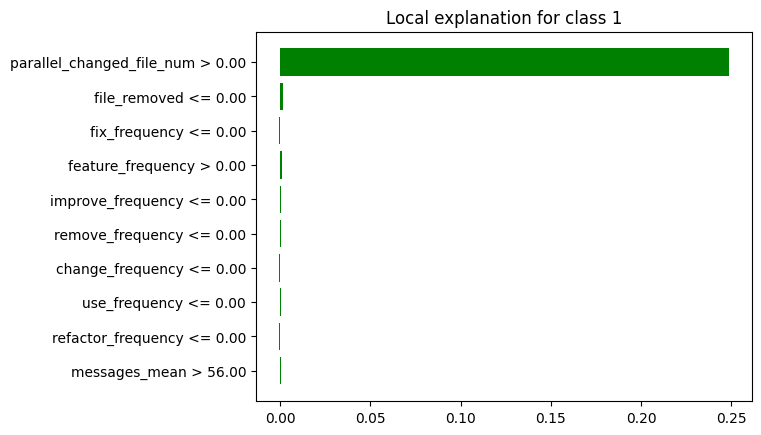

In [ ]:
lime_fp_mediana.plot()

In [ ]:
breakdown_fp_df_mediana = breakdown_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(index=[0, 26])
breakdown_fp_df_mediana['sign'] = breakdown_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_mediana = breakdown_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_mediana = shap_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_mediana = shap_fp_df_mediana.tail(25)
shap_fp_df_mediana['sign'] = shap_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_mediana = shap_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_mediana["Variable"] = lime_fp_df_mediana["variable"].str.split(" ").str[0]
lime_fp_df_mediana["Signo"] = lime_fp_df_mediana["effect"].apply(evaluar_valor)
lime_fp_df_mediana = lime_fp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_mediana['Ranking'] = breakdown_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_mediana = breakdown_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_mediana['Ranking'] = shap_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_mediana = shap_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_mediana['Ranking'] = lime_fp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_mediana = lime_fp_df_mediana.head(5)
lime_fp_df_mediana = lime_fp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(columns=['contribution'])
shap_fp_df_mediana = shap_fp_df_mediana.drop(columns=['contribution'])
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_mediana = breakdown_fp_df_mediana.head(5)
breakdown_fp_df_mediana = breakdown_fp_df_mediana.reset_index(drop=True)

shap_fp_df_mediana = shap_fp_df_mediana.head(5)
shap_fp_df_mediana = shap_fp_df_mediana.reset_index(drop=True)

lime_fp_df_mediana = lime_fp_df_mediana.reset_index(drop=True)

print(breakdown_fp_df_mediana)
print(shap_fp_df_mediana)
print(lime_fp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               messages_max       13      Nulo
2               messages_min       13      Nulo
3              use_frequency       13      Nulo
4           update_frequency       13      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              bug_frequency       13      Nulo
2           change_frequency       13      Nulo
3             commit_density       13      Nulo
4                 commit_num       13      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               file_removed        2  Positivo
2              fix_frequency        3  Negativo
3          feature_frequency        4  Positivo
4          improve_frequency        5  Positivo


In [ ]:
#lime_fp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_mediana['Variable'])
shapley_features = list(shap_fp_df_mediana['Variable'])
lime_features = list(lime_fp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_mediana[breakdown_fp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_mediana[shap_fp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_mediana[lime_fp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'messages_max', 'messages_min', 'use_frequency', 'update_frequency']
['parallel_changed_file_num', 'bug_frequency', 'change_frequency', 'commit_density', 'commit_num']
['parallel_changed_file_num', 'file_removed', 'fix_frequency', 'feature_frequency', 'improve_frequency']
['improve_frequency', 'update_frequency', 'change_frequency', 'commit_density', 'bug_frequency', 'commit_num', 'fix_frequency', 'file_removed', 'messages_max', 'parallel_changed_file_num', 'messages_min', 'feature_frequency', 'use_frequency']


Variable Breakdown           Shapley              Lime  \
                                Ranking     Signo Ranking     Signo Ranking   
0           improve_frequency         -         -       -         -       5   
1            update_frequency        13      Nulo       -         -       -   
2            change_frequency         -         -      13      Nulo       -   
3              commit_density         -         -      13      Nulo       -   
4               bug_frequency         -         -      13      Nulo       -   
5                  commit_num         -         -      13      Nulo       -   
6               fix_frequency         -         -       -         -       3   
7                file_removed         -         -       -         -       2   
8                messages_max        13      Nulo       -         -       -   
9   parallel_changed_file_num         1  Positivo       1  Positivo       1   
10               messages_min        13      Nulo       -         -       -   
11          feature_frequency         -         -       -         -       4   
12              use_frequency        13      Nulo       -         -       -   

              
       Signo  
0   Positivo  
1          -  
2          -  
3          -  
4          -  
5          -  
6   Negativo  
7   Positivo  
8          -  
9   Positivo  
10         -  
11  Positivo  
12         -

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "file_removed", "fix_frequency", "feature_frequency", "improve_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
file_removed                      -         -       -         -       2   
fix_frequency                     -         -       -         -       3   
feature_frequency                 -         -       -         -       4   
improve_frequency                 -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
file_removed               Positivo  
fix_frequency              Negativo  
feature_frequency          Positivo  
improve_frequency          Positivo

### **Instancia FP MIN:**

In [ ]:
breakdown_fp_min = exp.predict_parts(df_instancia_fp_min, type="break_down",random_state=42)
shap_fp_min = exp.predict_parts(df_instancia_fp_min, type="shap",random_state=42)
lime_fp_min = exp.predict_surrogate(df_instancia_fp_min, random_state=42)

breakdown_fp_df_min = breakdown_fp_min.result
shap_fp_df_min = shap_fp_min.result
lime_fp_df_min = lime_fp_min.result

In [ ]:
breakdown_fp_min.plot()

In [ ]:
shap_fp_min.plot()

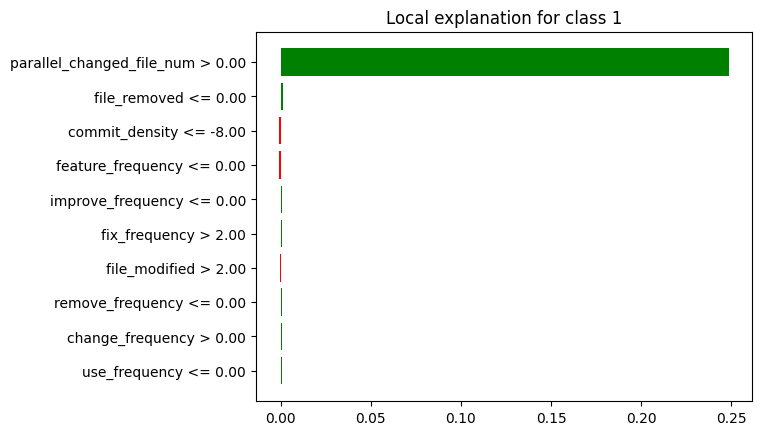

In [ ]:
lime_fp_min.plot()

In [ ]:
breakdown_fp_df_min = breakdown_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_min = breakdown_fp_df_min.drop(index=[0, 26])
breakdown_fp_df_min['sign'] = breakdown_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_min = breakdown_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_min = shap_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_min = shap_fp_df_min.tail(25)
shap_fp_df_min['sign'] = shap_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_min = shap_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_min["Variable"] = lime_fp_df_min["variable"].str.split(" ").str[0]
lime_fp_df_min["Signo"] = lime_fp_df_min["effect"].apply(evaluar_valor)
lime_fp_df_min = lime_fp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_min = lime_fp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_min['Ranking'] = breakdown_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_min = breakdown_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_min['Ranking'] = shap_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_min = shap_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_min['Ranking'] = lime_fp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_min = lime_fp_df_min.head(5)
lime_fp_df_min = lime_fp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fp_df_min = breakdown_fp_df_min.drop(columns=['contribution'])
shap_fp_df_min = shap_fp_df_min.drop(columns=['contribution'])
lime_fp_df_min = lime_fp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_min = breakdown_fp_df_min.head(5)
breakdown_fp_df_min = breakdown_fp_df_min.reset_index(drop=True)

shap_fp_df_min = shap_fp_df_min.head(5)
shap_fp_df_min = shap_fp_df_min.reset_index(drop=True)

lime_fp_df_min = lime_fp_df_min.reset_index(drop=True)

print(breakdown_fp_df_min)
print(shap_fp_df_min)
print(lime_fp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               messages_max       13      Nulo
2               messages_min       13      Nulo
3              use_frequency       13      Nulo
4           update_frequency       13      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              bug_frequency       13      Nulo
2           change_frequency       13      Nulo
3             commit_density       13      Nulo
4                 commit_num       13      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               file_removed        2  Positivo
2             commit_density        3  Negativo
3          feature_frequency        4  Negativo
4          improve_frequency        5  Positivo


In [ ]:
#lime_fp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_min['Variable'])
shapley_features = list(shap_fp_df_min['Variable'])
lime_features = list(lime_fp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_min[breakdown_fp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_min[shap_fp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_min[lime_fp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'messages_max', 'messages_min', 'use_frequency', 'update_frequency']
['parallel_changed_file_num', 'bug_frequency', 'change_frequency', 'commit_density', 'commit_num']
['parallel_changed_file_num', 'file_removed', 'commit_density', 'feature_frequency', 'improve_frequency']
['improve_frequency', 'update_frequency', 'change_frequency', 'commit_density', 'bug_frequency', 'commit_num', 'file_removed', 'messages_max', 'parallel_changed_file_num', 'messages_min', 'feature_frequency', 'use_frequency']


Variable Breakdown           Shapley              Lime  \
                                Ranking     Signo Ranking     Signo Ranking   
0           improve_frequency         -         -       -         -       5   
1            update_frequency        13      Nulo       -         -       -   
2            change_frequency         -         -      13      Nulo       -   
3              commit_density         -         -      13      Nulo       3   
4               bug_frequency         -         -      13      Nulo       -   
5                  commit_num         -         -      13      Nulo       -   
6                file_removed         -         -       -         -       2   
7                messages_max        13      Nulo       -         -       -   
8   parallel_changed_file_num         1  Positivo       1  Positivo       1   
9                messages_min        13      Nulo       -         -       -   
10          feature_frequency         -         -       -         -       4   
11              use_frequency        13      Nulo       -         -       -   

              
       Signo  
0   Positivo  
1          -  
2          -  
3   Negativo  
4          -  
5          -  
6   Positivo  
7          -  
8   Positivo  
9          -  
10  Negativo  
11         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "file_removed", "commit_density", "feature_frequency", "improve_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
file_removed                      -         -       -         -       2   
commit_density                    -         -      13      Nulo       3   
feature_frequency                 -         -       -         -       4   
improve_frequency                 -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
file_removed               Positivo  
commit_density             Negativo  
feature_frequency          Negativo  
improve_frequency          Positivo

### **FP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('parallel_changed_file_num', 1), ('parallel_changed_file_num', 1)], 'Shapley': [('parallel_changed_file_num', 1), ('parallel_changed_file_num', 1), ('parallel_changed_file_num', 1), ('commit_density', 13)], 'Lime': [('parallel_changed_file_num', 1), ('file_removed', 2), ('improve_frequency', 3), ('feature_frequency', 4), ('duration', 5), ('parallel_changed_file_num', 1), ('file_removed', 2), ('fix_frequency', 3), ('feature_frequency', 4), ('improve_frequency', 5), ('parallel_changed_file_num', 1), ('file_removed', 2), ('commit_density', 3), ('feature_frequency', 4), ('improve_frequency', 5)]}
{'Breakdown': {'parallel_changed_file_num': 3}, 'Shapley': {'parallel_changed_file_num': 3, 'commit_density': 1}, 'Lime': {'parallel_changed_file_num': 3, 'file_removed': 3, 'improve_frequency': 3, 'feature_frequency': 3, 'duration': 1, 'fix_frequency': 1, 'commit_density': 1}}
{'Breakdown': {'parallel_changed_file_num': 1.0}, 'Shapley': {'parallel

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_rus_fp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_rus_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
feature_frequency                     -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
fix_frequency                         -      -             -      -   
file_removed                          -      -             -      -   
duration                              -      -             -      -   
commit_density                        -      -          13.0      1   
improve_frequency                     -      -             -      -   

                                   Lime         
                          Ranking Medio Conteo  
feature_frequency              4.000000      3  
parallel_changed_file_num      1.000000      3  
fix_frequency                  3.000000      1  
file_removed                   2.000000      3  
duration                       5.000000      1  
commit_density                 3.000000      1  
improve_frequency              4.333333      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_rus_fp[("General", "Ranking")] = df_resumen_rus_fp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_rus_fp[("General", "Conteo Total")] = df_resumen_rus_fp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_rus_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
feature_frequency                     -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
fix_frequency                         -      -             -      -   
file_removed                          -      -             -      -   
duration                              -      -             -      -   
commit_density                        -      -          13.0      1   
improve_frequency                     -      -             -      -   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
feature_frequency              4.000000      3  4.000000            3  
parallel_changed_file_num      1.000000      3  1.000000            9  
fix_frequency                  3.000000      1  3.000000            1  
file_removed                   2.000000      3  2.000000            3  
duration                       5.000000      1  5.000000            1  
commit_density                 3.000000      1  8.000000            2  
improve_frequency              4.333333      3  4.333333            3

In [ ]:
# Obtener el número de características
num_caract = df_resumen_rus_fp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_rus_fp[("General", "Peso Rango")] = 1 - ((df_resumen_rus_fp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_rus_fp[("General", "Peso Conteo")] = df_resumen_rus_fp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_rus_fp[("General", "Puntaje")] = df_resumen_rus_fp[("General", "Peso Rango")] + df_resumen_rus_fp[("General", "Peso Conteo")]
df_resumen_rus_fp[("General", "Ranking")] = df_resumen_rus_fp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_rus_fp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_rus_fp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_rus_fp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_rus_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
feature_frequency                     -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
fix_frequency                         -      -             -      -   
file_removed                          -      -             -      -   
duration                              -      -             -      -   
commit_density                        -      -          13.0      1   
improve_frequency                     -      -             -      -   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
feature_frequency              4.000000      3     3.0            3  
parallel_changed_file_num      1.000000      3     1.0            9  
fix_frequency                  3.000000      1     5.0            1  
file_removed                   2.000000      3     2.0            3  
duration                       5.000000      1     7.0            1  
commit_density                 3.000000      1     6.0            2  
improve_frequency              4.333333      3     4.0            3

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_rus_fp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_rus_fp = df_resumen_rus_fp[new_columns]

In [ ]:
df_resumen_rus_fp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_rus_fp[(tech, "Ranking Medio")] = df_resumen_rus_fp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_rus_fp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
file_removed                  2.0            3             -      -   
feature_frequency             3.0            3             -      -   
improve_frequency             4.0            3             -      -   
fix_frequency                 5.0            1             -      -   
commit_density                6.0            2             -      -   
duration                      7.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
file_removed                          -      -          2.00      3  
feature_frequency                     -      -          4.00      3  
improve_frequency                     -      -          4.33      3  
fix_frequency                         -      -          3.00      1  
commit_density                    13.00      1          3.00      1  
duration                              -      -          5.00      1

### **Instancia FN MAX:**

In [ ]:
breakdown_fn_max = exp.predict_parts(df_instancia_fn_max, type="break_down",random_state=42)
shap_fn_max = exp.predict_parts(df_instancia_fn_max, type="shap",random_state=42)
lime_fn_max = exp.predict_surrogate(df_instancia_fn_max, random_state=42)

breakdown_fn_df_max = breakdown_fn_max.result
shap_fn_df_max = shap_fn_max.result
lime_fn_df_max=lime_fn_max.result

In [ ]:
breakdown_fn_max.plot()

In [ ]:
shap_fn_max.plot()

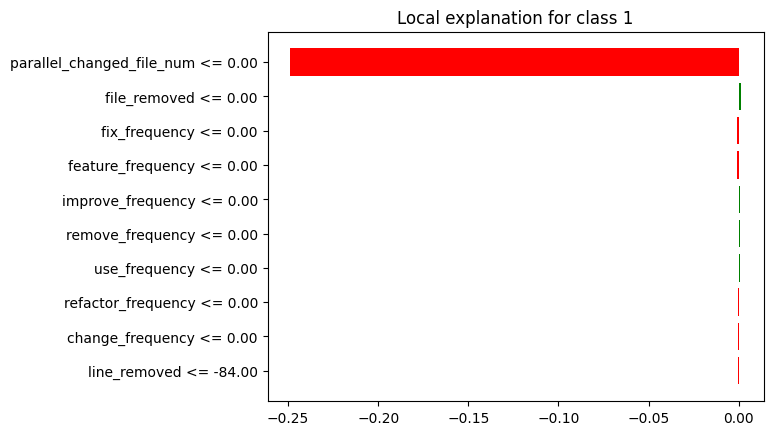

In [ ]:
lime_fn_max.plot()

In [ ]:
breakdown_fn_df_max = breakdown_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_max = breakdown_fn_df_max.drop(index=[0, 26])
breakdown_fn_df_max['sign'] = breakdown_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_max = breakdown_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_max = shap_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_max = shap_fn_df_max.tail(25)
shap_fn_df_max['sign'] = shap_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_max = shap_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_max["Variable"] = lime_fn_df_max["variable"].str.split(" ").str[0]
lime_fn_df_max["Signo"] = lime_fn_df_max["effect"].apply(evaluar_valor)
lime_fn_df_max = lime_fn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_max = lime_fn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_max['Ranking'] = breakdown_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_max = breakdown_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_max['Ranking'] = shap_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_max = shap_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_max['Ranking'] = lime_fn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_max = lime_fn_df_max.head(5)
lime_fn_df_max = lime_fn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fn_df_max = breakdown_fn_df_max.drop(columns=['contribution'])
shap_fn_df_max = shap_fn_df_max.drop(columns=['contribution'])
lime_fn_df_max = lime_fn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_max = breakdown_fn_df_max.head(5)
breakdown_fn_df_max = breakdown_fn_df_max.reset_index(drop=True)

shap_fn_df_max = shap_fn_df_max.head(5)
shap_fn_df_max = shap_fn_df_max.reset_index(drop=True)

lime_fn_df_max = lime_fn_df_max.reset_index(drop=True)

print(breakdown_fn_df_max)
print(shap_fn_df_max)
print(lime_fn_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               messages_max       13      Nulo
2               messages_min       13      Nulo
3              use_frequency       13      Nulo
4           update_frequency       13      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              bug_frequency       13      Nulo
2           change_frequency       13      Nulo
3             commit_density       13      Nulo
4                 commit_num       13      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               file_removed        2  Positivo
2              fix_frequency        3  Negativo
3          feature_frequency        4  Negativo
4          improve_frequency        5  Positivo


In [ ]:
#lime_fn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_max['Variable'])
shapley_features = list(shap_fn_df_max['Variable'])
lime_features = list(lime_fn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_max[breakdown_fn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_max[shap_fn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_max[lime_fn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'messages_max', 'messages_min', 'use_frequency', 'update_frequency']
['parallel_changed_file_num', 'bug_frequency', 'change_frequency', 'commit_density', 'commit_num']
['parallel_changed_file_num', 'file_removed', 'fix_frequency', 'feature_frequency', 'improve_frequency']
['improve_frequency', 'update_frequency', 'change_frequency', 'commit_density', 'bug_frequency', 'commit_num', 'fix_frequency', 'file_removed', 'messages_max', 'parallel_changed_file_num', 'messages_min', 'feature_frequency', 'use_frequency']


Variable Breakdown           Shapley              Lime  \
                                Ranking     Signo Ranking     Signo Ranking   
0           improve_frequency         -         -       -         -       5   
1            update_frequency        13      Nulo       -         -       -   
2            change_frequency         -         -      13      Nulo       -   
3              commit_density         -         -      13      Nulo       -   
4               bug_frequency         -         -      13      Nulo       -   
5                  commit_num         -         -      13      Nulo       -   
6               fix_frequency         -         -       -         -       3   
7                file_removed         -         -       -         -       2   
8                messages_max        13      Nulo       -         -       -   
9   parallel_changed_file_num         1  Negativo       1  Negativo       1   
10               messages_min        13      Nulo       -         -       -   
11          feature_frequency         -         -       -         -       4   
12              use_frequency        13      Nulo       -         -       -   

              
       Signo  
0   Positivo  
1          -  
2          -  
3          -  
4          -  
5          -  
6   Negativo  
7   Positivo  
8          -  
9   Negativo  
10         -  
11  Negativo  
12         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "file_removed", "fix_frequency", "feature_frequency", "improve_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
file_removed                      -         -       -         -       2   
fix_frequency                     -         -       -         -       3   
feature_frequency                 -         -       -         -       4   
improve_frequency                 -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
file_removed               Positivo  
fix_frequency              Negativo  
feature_frequency          Negativo  
improve_frequency          Positivo

### **Instancia FN MEDIANA:**

In [ ]:
breakdown_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="break_down",random_state=42)
shap_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="shap",random_state=42)
lime_fn_mediana = exp.predict_surrogate(df_instancia_fn_mediana, random_state=42)

breakdown_fn_df_mediana = breakdown_fn_mediana.result
shap_fn_df_mediana = shap_fn_mediana.result
lime_fn_df_mediana=lime_fn_mediana.result

In [ ]:
breakdown_fn_mediana.plot()

In [ ]:
shap_fn_mediana.plot()

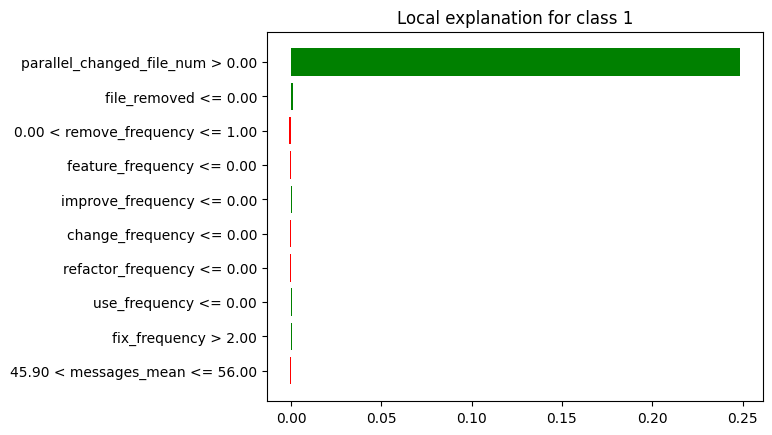

In [ ]:
lime_fn_mediana.plot()

In [ ]:
breakdown_fn_df_mediana = breakdown_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(index=[0, 26])
breakdown_fn_df_mediana['sign'] = breakdown_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_mediana = breakdown_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_mediana = shap_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_mediana = shap_fn_df_mediana.tail(25)
shap_fn_df_mediana['sign'] = shap_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_mediana = shap_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_mediana["Variable"] = lime_fn_df_mediana["variable"].str.split(" ").str[0]
lime_fn_df_mediana["Signo"] = lime_fn_df_mediana["effect"].apply(evaluar_valor)
lime_fn_df_mediana = lime_fn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_mediana['Ranking'] = breakdown_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_mediana = breakdown_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_mediana['Ranking'] = shap_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_mediana = shap_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_mediana['Ranking'] = lime_fn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_mediana = lime_fn_df_mediana.head(5)
lime_fn_df_mediana = lime_fn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(columns=['contribution'])
shap_fn_df_mediana = shap_fn_df_mediana.drop(columns=['contribution'])
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_mediana = breakdown_fn_df_mediana.head(5)
breakdown_fn_df_mediana = breakdown_fn_df_mediana.reset_index(drop=True)

shap_fn_df_mediana = shap_fn_df_mediana.head(5)
shap_fn_df_mediana = shap_fn_df_mediana.reset_index(drop=True)

lime_fn_df_mediana = lime_fn_df_mediana.reset_index(drop=True)
lime_fn_df_mediana.at[2, 'Variable'] = 'remove_frequency'


print(breakdown_fn_df_mediana)
print(shap_fn_df_mediana)
print(lime_fn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               messages_max       13      Nulo
2               messages_min       13      Nulo
3              use_frequency       13      Nulo
4           update_frequency       13      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              bug_frequency       13      Nulo
2           change_frequency       13      Nulo
3             commit_density       13      Nulo
4                 commit_num       13      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               file_removed        2  Positivo
2           remove_frequency        3  Negativo
3          feature_frequency        4  Negativo
4          improve_frequency        5  Positivo


In [ ]:
#lime_fn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_mediana['Variable'])
shapley_features = list(shap_fn_df_mediana['Variable'])
lime_features = list(lime_fn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_mediana[breakdown_fn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_mediana[shap_fn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_mediana[lime_fn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'messages_max', 'messages_min', 'use_frequency', 'update_frequency']
['parallel_changed_file_num', 'bug_frequency', 'change_frequency', 'commit_density', 'commit_num']
['parallel_changed_file_num', 'file_removed', 'remove_frequency', 'feature_frequency', 'improve_frequency']
['improve_frequency', 'update_frequency', 'change_frequency', 'commit_density', 'bug_frequency', 'commit_num', 'remove_frequency', 'file_removed', 'messages_max', 'parallel_changed_file_num', 'messages_min', 'feature_frequency', 'use_frequency']


Variable Breakdown           Shapley              Lime  \
                                Ranking     Signo Ranking     Signo Ranking   
0           improve_frequency         -         -       -         -       5   
1            update_frequency        13      Nulo       -         -       -   
2            change_frequency         -         -      13      Nulo       -   
3              commit_density         -         -      13      Nulo       -   
4               bug_frequency         -         -      13      Nulo       -   
5                  commit_num         -         -      13      Nulo       -   
6            remove_frequency         -         -       -         -       3   
7                file_removed         -         -       -         -       2   
8                messages_max        13      Nulo       -         -       -   
9   parallel_changed_file_num         1  Positivo       1  Positivo       1   
10               messages_min        13      Nulo       -         -       -   
11          feature_frequency         -         -       -         -       4   
12              use_frequency        13      Nulo       -         -       -   

              
       Signo  
0   Positivo  
1          -  
2          -  
3          -  
4          -  
5          -  
6   Negativo  
7   Positivo  
8          -  
9   Positivo  
10         -  
11  Negativo  
12         -

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "file_removed", "remove_frequency", "feature_frequency", "improve_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
file_removed                      -         -       -         -       2   
remove_frequency                  -         -       -         -       3   
feature_frequency                 -         -       -         -       4   
improve_frequency                 -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
file_removed               Positivo  
remove_frequency           Negativo  
feature_frequency          Negativo  
improve_frequency          Positivo

### **Instancia FN MIN:**

In [ ]:
breakdown_fn_min = exp.predict_parts(df_instancia_fn_min, type="break_down",random_state=42)
shap_fn_min = exp.predict_parts(df_instancia_fn_min, type="shap",random_state=42)
lime_fn_min = exp.predict_surrogate(df_instancia_fn_min, random_state=42)

breakdown_fn_df_min = breakdown_fn_min.result
shap_fn_df_min = shap_fn_min.result
lime_fn_df_min = lime_fn_min.result

In [ ]:
breakdown_fn_min.plot()

In [ ]:
shap_fn_min.plot()

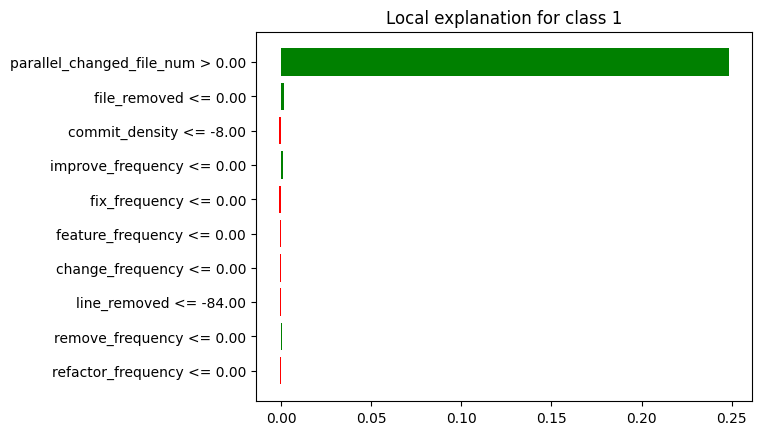

In [ ]:
lime_fn_min.plot()

In [ ]:
breakdown_fn_df_min = breakdown_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_min = breakdown_fn_df_min.drop(index=[0, 26])
breakdown_fn_df_min['sign'] = breakdown_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_min = breakdown_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_min = shap_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_min = shap_fn_df_min.tail(25)
shap_fn_df_min['sign'] = shap_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_min = shap_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_min["Variable"] = lime_fn_df_min["variable"].str.split(" ").str[0]
lime_fn_df_min["Signo"] = lime_fn_df_min["effect"].apply(evaluar_valor)
lime_fn_df_min = lime_fn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_min = lime_fn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_min['Ranking'] = breakdown_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_min = breakdown_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_min['Ranking'] = shap_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_min = shap_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_min['Ranking'] = lime_fn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_min = lime_fn_df_min.head(5)
lime_fn_df_min = lime_fn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fn_df_min = breakdown_fn_df_min.drop(columns=['contribution'])
shap_fn_df_min = shap_fn_df_min.drop(columns=['contribution'])
lime_fn_df_min = lime_fn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_min = breakdown_fn_df_min.head(5)
breakdown_fn_df_min = breakdown_fn_df_min.reset_index(drop=True)

shap_fn_df_min = shap_fn_df_min.head(5)
shap_fn_df_min = shap_fn_df_min.reset_index(drop=True)

lime_fn_df_min = lime_fn_df_min.reset_index(drop=True)

print(breakdown_fn_df_min)
print(shap_fn_df_min)
print(lime_fn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               messages_max       13      Nulo
2               messages_min       13      Nulo
3              use_frequency       13      Nulo
4           update_frequency       13      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              bug_frequency       13      Nulo
2           change_frequency       13      Nulo
3             commit_density       13      Nulo
4                 commit_num       13      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               file_removed        2  Positivo
2             commit_density        3  Negativo
3          improve_frequency        4  Positivo
4              fix_frequency        5  Negativo


In [ ]:
#lime_fn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_min['Variable'])
shapley_features = list(shap_fn_df_min['Variable'])
lime_features = list(lime_fn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_min[breakdown_fn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_min[shap_fn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_min[lime_fn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'messages_max', 'messages_min', 'use_frequency', 'update_frequency']
['parallel_changed_file_num', 'bug_frequency', 'change_frequency', 'commit_density', 'commit_num']
['parallel_changed_file_num', 'file_removed', 'commit_density', 'improve_frequency', 'fix_frequency']
['improve_frequency', 'update_frequency', 'change_frequency', 'commit_density', 'bug_frequency', 'commit_num', 'fix_frequency', 'file_removed', 'messages_max', 'parallel_changed_file_num', 'messages_min', 'use_frequency']


Variable Breakdown           Shapley              Lime  \
                                Ranking     Signo Ranking     Signo Ranking   
0           improve_frequency         -         -       -         -       4   
1            update_frequency        13      Nulo       -         -       -   
2            change_frequency         -         -      13      Nulo       -   
3              commit_density         -         -      13      Nulo       3   
4               bug_frequency         -         -      13      Nulo       -   
5                  commit_num         -         -      13      Nulo       -   
6               fix_frequency         -         -       -         -       5   
7                file_removed         -         -       -         -       2   
8                messages_max        13      Nulo       -         -       -   
9   parallel_changed_file_num         1  Positivo       1  Positivo       1   
10               messages_min        13      Nulo       -         -       -   
11              use_frequency        13      Nulo       -         -       -   

              
       Signo  
0   Positivo  
1          -  
2          -  
3   Negativo  
4          -  
5          -  
6   Negativo  
7   Positivo  
8          -  
9   Positivo  
10         -  
11         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "file_removed", "commit_density", "improve_frequency", "fix_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
file_removed                      -         -       -         -       2   
commit_density                    -         -      13      Nulo       3   
improve_frequency                 -         -       -         -       4   
fix_frequency                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
file_removed               Positivo  
commit_density             Negativo  
improve_frequency          Positivo  
fix_frequency              Negativo

### **FN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('parallel_changed_file_num', 1), ('parallel_changed_file_num', 1)], 'Shapley': [('parallel_changed_file_num', 1), ('parallel_changed_file_num', 1), ('parallel_changed_file_num', 1), ('commit_density', 13)], 'Lime': [('parallel_changed_file_num', 1), ('file_removed', 2), ('fix_frequency', 3), ('feature_frequency', 4), ('improve_frequency', 5), ('parallel_changed_file_num', 1), ('file_removed', 2), ('remove_frequency', 3), ('feature_frequency', 4), ('improve_frequency', 5), ('parallel_changed_file_num', 1), ('file_removed', 2), ('commit_density', 3), ('improve_frequency', 4), ('fix_frequency', 5)]}
{'Breakdown': {'parallel_changed_file_num': 3}, 'Shapley': {'parallel_changed_file_num': 3, 'commit_density': 1}, 'Lime': {'parallel_changed_file_num': 3, 'file_removed': 3, 'fix_frequency': 2, 'feature_frequency': 2, 'improve_frequency': 3, 'remove_frequency': 1, 'commit_density': 1}}
{'Breakdown': {'parallel_changed_file_num': 1.0}, 'Shapley'

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_rus_fn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_rus_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
feature_frequency                     -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
remove_frequency                      -      -             -      -   
fix_frequency                         -      -             -      -   
file_removed                          -      -             -      -   
commit_density                        -      -          13.0      1   
improve_frequency                     -      -             -      -   

                                   Lime         
                          Ranking Medio Conteo  
feature_frequency              4.000000      2  
parallel_changed_file_num      1.000000      3  
remove_frequency               3.000000      1  
fix_frequency                  4.000000      2  
file_removed                   2.000000      3  
commit_density                 3.000000      1  
improve_frequency              4.666667      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_rus_fn[("General", "Ranking")] = df_resumen_rus_fn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_rus_fn[("General", "Conteo Total")] = df_resumen_rus_fn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_rus_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
feature_frequency                     -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
remove_frequency                      -      -             -      -   
fix_frequency                         -      -             -      -   
file_removed                          -      -             -      -   
commit_density                        -      -          13.0      1   
improve_frequency                     -      -             -      -   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
feature_frequency              4.000000      2  4.000000            2  
parallel_changed_file_num      1.000000      3  1.000000            9  
remove_frequency               3.000000      1  3.000000            1  
fix_frequency                  4.000000      2  4.000000            2  
file_removed                   2.000000      3  2.000000            3  
commit_density                 3.000000      1  8.000000            2  
improve_frequency              4.666667      3  4.666667            3

In [ ]:
# Obtener el número de características
num_caract = df_resumen_rus_fn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_rus_fn[("General", "Peso Rango")] = 1 - ((df_resumen_rus_fn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_rus_fn[("General", "Peso Conteo")] = df_resumen_rus_fn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_rus_fn[("General", "Puntaje")] = df_resumen_rus_fn[("General", "Peso Rango")] + df_resumen_rus_fn[("General", "Peso Conteo")]
df_resumen_rus_fn[("General", "Ranking")] = df_resumen_rus_fn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_rus_fn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_rus_fn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_rus_fn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_rus_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
feature_frequency                     -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
remove_frequency                      -      -             -      -   
fix_frequency                         -      -             -      -   
file_removed                          -      -             -      -   
commit_density                        -      -          13.0      1   
improve_frequency                     -      -             -      -   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
feature_frequency              4.000000      2     4.0            2  
parallel_changed_file_num      1.000000      3     1.0            9  
remove_frequency               3.000000      1     6.0            1  
fix_frequency                  4.000000      2     4.0            2  
file_removed                   2.000000      3     2.0            3  
commit_density                 3.000000      1     7.0            2  
improve_frequency              4.666667      3     3.0            3

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_rus_fn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_rus_fn = df_resumen_rus_fn[new_columns]

In [ ]:
df_resumen_rus_fn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_rus_fn[(tech, "Ranking Medio")] = df_resumen_rus_fn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_rus_fn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
file_removed                  2.0            3             -      -   
improve_frequency             3.0            3             -      -   
feature_frequency             4.0            2             -      -   
fix_frequency                 4.0            2             -      -   
remove_frequency              6.0            1             -      -   
commit_density                7.0            2             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
file_removed                          -      -          2.00      3  
improve_frequency                     -      -          4.67      3  
feature_frequency                     -      -          4.00      2  
fix_frequency                         -      -          4.00      2  
remove_frequency                      -      -          3.00      1  
commit_density                    13.00      1          3.00      1

## **LOCAL GENERAL:**

Verdadero Positivo:

In [ ]:
# Lista de DataFrames resumen y algoritmo
dfs_resumen = [df_resumen_rf_vp, df_resumen_brf_vp, df_resumen_gb_vp, df_resumen_ada_vp, df_resumen_rus_vp]
algorithms = ["RandomForest", "BalancedRandomForest", "GradientBoosting", "ADABoost", "RUSBoost"]

# Crear un conjunto de índices único
index_set = set()

# Iterar sobre cada DataFrame resumen y agregar sus índices al conjunto
for df_resumen in dfs_resumen:
    index_set.update(df_resumen.index)
index_list = list(index_set)

# Crear un nuevo DataFrame para el resultado final
df_resumen_final = pd.DataFrame(index=index_list)

# Agregar las columnas de "General" con "Ranking" y "Conteo Total" para cada algoritmo
for algorithm, df_resumen in zip(algorithms, dfs_resumen):
    df_resumen_final[(algorithm, 'Ranking')] = df_resumen[('General', 'Ranking')]
    df_resumen_final[(algorithm, 'Conteo Total')] = df_resumen[('General', 'Conteo Total')]

# Rellenar el DataFrame final con datos o '-'
df_resumen_final = df_resumen_final.fillna('-')

# Calcular el ranking final promediando los rankings de las técnicas
df_resumen_final["Ranking Final"] = df_resumen_final[[(algo, "Ranking") for algo in algorithms]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_final[("Conteo Final")] = df_resumen_final[[(algo, "Conteo Total") for algo in algorithms]].replace('-', 0).sum(axis=1)

# Obtener el número de características
num_caract = df_resumen_final.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_final[("Peso Rango")] = 1 - ((df_resumen_final[("Ranking Final")].rank(ascending=True) - 1) / num_caract)
df_resumen_final[("Peso Conteo")] = df_resumen_final[("Conteo Final")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_final[("Puntaje")] = df_resumen_final[("Peso Rango")] + df_resumen_final[("Peso Conteo")]
df_resumen_final[("Ranking Final")] = df_resumen_final[("Puntaje")].rank(ascending=False, method="min")


# Eliminar las columnas innecesarias
df_resumen_final.drop("Peso Rango", axis=1, inplace=True)
df_resumen_final.drop("Peso Conteo", axis=1, inplace=True)
df_resumen_final.drop("Puntaje", axis=1, inplace=True)

df_resumen_final.sort_values(by=("Ranking Final"), ascending=True, inplace=True)

# Formatear los valores
for algo in algorithms:
    df_resumen_final[(algo, "Ranking")] = df_resumen_final[(algo, "Ranking")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)
    df_resumen_final[(algo, "Conteo Total")] = df_resumen_final[(algo, "Conteo Total")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)

df_resumen_final[("Ranking Final")] = df_resumen_final[("Ranking Final")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)
df_resumen_final[("Conteo Final")] = df_resumen_final[("Conteo Final")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)

df_resumen_final

,"(RandomForest, Ranking)","(RandomForest, Conteo Total)","(BalancedRandomForest, Ranking)","(BalancedRandomForest, Conteo Total)","(GradientBoosting, Ranking)","(GradientBoosting, Conteo Total)","(ADABoost, Ranking)","(ADABoost, Conteo Total)","(RUSBoost, Ranking)","(RUSBoost, Conteo Total)",Ranking Final,Conteo Final
parallel_changed_file_num,1,9,1,9,1,9,1,9,1,9,1,45
developer_num,3,8,2,6,3,6,2,9,-,-,2,29
commit_num,2,9,3,5,2,7,-,-,-,-,3,21
file_removed,8,3,5,4,4,5,5,6,2,3,4,21
duration,5,3,8,3,5,5,6,1,6,1,5,13
file_modified,6,6,4,4,8,3,-,-,-,-,5,13
improve_frequency,-,-,-,-,7,2,-,-,4,2,7,4
feature_frequency,-,-,11,1,-,-,4,1,3,3,8,5
line_removed,4,4,6,3,11,2,-,-,-,-,9,9
line_added,7,2,8,3,6,3,-,-,-,-,10,8


Verdadero Negativo:

In [ ]:
# Lista de DataFrames resumen y algoritmo
dfs_resumen = [df_resumen_rf_vn, df_resumen_brf_vn, df_resumen_gb_vn, df_resumen_ada_vn, df_resumen_rus_vn]
algorithms = ["RandomForest", "BalancedRandomForest", "GradientBoosting", "ADABoost", "RUSBoost"]

# Crear un conjunto de índices único
index_set = set()

# Iterar sobre cada DataFrame resumen y agregar sus índices al conjunto
for df_resumen in dfs_resumen:
    index_set.update(df_resumen.index)
index_list = list(index_set)

# Crear un nuevo DataFrame para el resultado final
df_resumen_final = pd.DataFrame(index=index_list)

# Agregar las columnas de "General" con "Ranking" y "Conteo Total" para cada algoritmo
for algorithm, df_resumen in zip(algorithms, dfs_resumen):
    df_resumen_final[(algorithm, 'Ranking')] = df_resumen[('General', 'Ranking')]
    df_resumen_final[(algorithm, 'Conteo Total')] = df_resumen[('General', 'Conteo Total')]

# Rellenar el DataFrame final con datos o '-'
df_resumen_final = df_resumen_final.fillna('-')

# Calcular el ranking final promediando los rankings de las técnicas
df_resumen_final["Ranking Final"] = df_resumen_final[[(algo, "Ranking") for algo in algorithms]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_final[("Conteo Final")] = df_resumen_final[[(algo, "Conteo Total") for algo in algorithms]].replace('-', 0).sum(axis=1)

# Obtener el número de características
num_caract = df_resumen_final.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_final[("Peso Rango")] = 1 - ((df_resumen_final[("Ranking Final")].rank(ascending=True) - 1) / num_caract)
df_resumen_final[("Peso Conteo")] = df_resumen_final[("Conteo Final")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_final[("Puntaje")] = df_resumen_final[("Peso Rango")] + df_resumen_final[("Peso Conteo")]
df_resumen_final[("Ranking Final")] = df_resumen_final[("Puntaje")].rank(ascending=False, method="min")


# Eliminar las columnas innecesarias
df_resumen_final.drop("Peso Rango", axis=1, inplace=True)
df_resumen_final.drop("Peso Conteo", axis=1, inplace=True)
df_resumen_final.drop("Puntaje", axis=1, inplace=True)

df_resumen_final.sort_values(by=("Ranking Final"), ascending=True, inplace=True)

# Formatear los valores
for algo in algorithms:
    df_resumen_final[(algo, "Ranking")] = df_resumen_final[(algo, "Ranking")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)
    df_resumen_final[(algo, "Conteo Total")] = df_resumen_final[(algo, "Conteo Total")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)

df_resumen_final[("Ranking Final")] = df_resumen_final[("Ranking Final")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)
df_resumen_final[("Conteo Final")] = df_resumen_final[("Conteo Final")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)

df_resumen_final

,"(RandomForest, Ranking)","(RandomForest, Conteo Total)","(BalancedRandomForest, Ranking)","(BalancedRandomForest, Conteo Total)","(GradientBoosting, Ranking)","(GradientBoosting, Conteo Total)","(ADABoost, Ranking)","(ADABoost, Conteo Total)","(RUSBoost, Ranking)","(RUSBoost, Conteo Total)",Ranking Final,Conteo Final
parallel_changed_file_num,1,9,1,9,1,9,1,9,1,9,1,45
developer_num,2,9,5,6,2,6,2,9,-,-,2,30
commit_num,3,8,2,7,3,6,-,-,-,-,2,21
file_modified,5,4,4,6,4,6,-,-,-,-,4,16
line_removed,4,5,3,4,7,6,-,-,-,-,5,15
file_removed,10,1,6,3,5,3,5,6,2,3,6,16
use_frequency,6,2,-,-,-,-,7,1,7,2,7,5
fix_frequency,7,1,-,-,-,-,3,1,5,1,8,3
remove_frequency,-,-,10,2,-,-,3,1,4,1,9,4
duration,7,3,9,4,6,4,-,-,-,-,10,11


Falso Positivo:

In [ ]:
# Lista de DataFrames resumen y algoritmo
dfs_resumen = [df_resumen_rf_fp, df_resumen_brf_fp, df_resumen_gb_fp, df_resumen_ada_fp, df_resumen_rus_fp]
algorithms = ["RandomForest", "BalancedRandomForest", "GradientBoosting", "ADABoost", "RUSBoost"]

# Crear un conjunto de índices único
index_set = set()

# Iterar sobre cada DataFrame resumen y agregar sus índices al conjunto
for df_resumen in dfs_resumen:
    index_set.update(df_resumen.index)
index_list = list(index_set)

# Crear un nuevo DataFrame para el resultado final
df_resumen_final = pd.DataFrame(index=index_list)

# Agregar las columnas de "General" con "Ranking" y "Conteo Total" para cada algoritmo
for algorithm, df_resumen in zip(algorithms, dfs_resumen):
    df_resumen_final[(algorithm, 'Ranking')] = df_resumen[('General', 'Ranking')]
    df_resumen_final[(algorithm, 'Conteo Total')] = df_resumen[('General', 'Conteo Total')]

# Rellenar el DataFrame final con datos o '-'
df_resumen_final = df_resumen_final.fillna('-')

# Calcular el ranking final promediando los rankings de las técnicas
df_resumen_final["Ranking Final"] = df_resumen_final[[(algo, "Ranking") for algo in algorithms]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_final[("Conteo Final")] = df_resumen_final[[(algo, "Conteo Total") for algo in algorithms]].replace('-', 0).sum(axis=1)

# Obtener el número de características
num_caract = df_resumen_final.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_final[("Peso Rango")] = 1 - ((df_resumen_final[("Ranking Final")].rank(ascending=True) - 1) / num_caract)
df_resumen_final[("Peso Conteo")] = df_resumen_final[("Conteo Final")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_final[("Puntaje")] = df_resumen_final[("Peso Rango")] + df_resumen_final[("Peso Conteo")]
df_resumen_final[("Ranking Final")] = df_resumen_final[("Puntaje")].rank(ascending=False, method="min")


# Eliminar las columnas innecesarias
df_resumen_final.drop("Peso Rango", axis=1, inplace=True)
df_resumen_final.drop("Peso Conteo", axis=1, inplace=True)
df_resumen_final.drop("Puntaje", axis=1, inplace=True)

df_resumen_final.sort_values(by=("Ranking Final"), ascending=True, inplace=True)

# Formatear los valores
for algo in algorithms:
    df_resumen_final[(algo, "Ranking")] = df_resumen_final[(algo, "Ranking")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)
    df_resumen_final[(algo, "Conteo Total")] = df_resumen_final[(algo, "Conteo Total")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)

df_resumen_final[("Ranking Final")] = df_resumen_final[("Ranking Final")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)
df_resumen_final[("Conteo Final")] = df_resumen_final[("Conteo Final")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)

df_resumen_final

,"(RandomForest, Ranking)","(RandomForest, Conteo Total)","(BalancedRandomForest, Ranking)","(BalancedRandomForest, Conteo Total)","(GradientBoosting, Ranking)","(GradientBoosting, Conteo Total)","(ADABoost, Ranking)","(ADABoost, Conteo Total)","(RUSBoost, Ranking)","(RUSBoost, Conteo Total)",Ranking Final,Conteo Final
parallel_changed_file_num,1,9,1,9,1,9,1,9,1,9,1,45
commit_num,2,9,2,8,2,7,-,-,-,-,2,24
developer_num,3,9,8,3,4,7,2,9,-,-,3,28
line_removed,5,7,2,7,8,4,-,-,-,-,4,18
file_removed,9,2,5,6,7,3,4,6,2,3,5,20
file_modified,4,2,7,1,3,5,-,-,-,-,6,8
fix_frequency,-,-,-,-,-,-,3,3,5,1,7,4
improve_frequency,-,-,-,-,-,-,5,1,4,3,8,4
duration,5,3,10,2,5,3,-,-,7,1,9,9
commit_density,10,1,9,2,5,3,7,2,6,2,10,10


Falso Negativo:

In [ ]:
# Lista de DataFrames resumen y algoritmo
dfs_resumen = [df_resumen_rf_fn, df_resumen_brf_fn, df_resumen_gb_fn, df_resumen_ada_fn, df_resumen_rus_fn]
algorithms = ["RandomForest", "BalancedRandomForest", "GradientBoosting", "ADABoost", "RUSBoost"]

# Crear un conjunto de índices único
index_set = set()

# Iterar sobre cada DataFrame resumen y agregar sus índices al conjunto
for df_resumen in dfs_resumen:
    index_set.update(df_resumen.index)
index_list = list(index_set)

# Crear un nuevo DataFrame para el resultado final
df_resumen_final = pd.DataFrame(index=index_list)

# Agregar las columnas de "General" con "Ranking" y "Conteo Total" para cada algoritmo
for algorithm, df_resumen in zip(algorithms, dfs_resumen):
    df_resumen_final[(algorithm, 'Ranking')] = df_resumen[('General', 'Ranking')]
    df_resumen_final[(algorithm, 'Conteo Total')] = df_resumen[('General', 'Conteo Total')]

# Rellenar el DataFrame final con datos o '-'
df_resumen_final = df_resumen_final.fillna('-')

# Calcular el ranking final promediando los rankings de las técnicas
df_resumen_final["Ranking Final"] = df_resumen_final[[(algo, "Ranking") for algo in algorithms]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_final[("Conteo Final")] = df_resumen_final[[(algo, "Conteo Total") for algo in algorithms]].replace('-', 0).sum(axis=1)

# Obtener el número de características
num_caract = df_resumen_final.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_final[("Peso Rango")] = 1 - ((df_resumen_final[("Ranking Final")].rank(ascending=True) - 1) / num_caract)
df_resumen_final[("Peso Conteo")] = df_resumen_final[("Conteo Final")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_final[("Puntaje")] = df_resumen_final[("Peso Rango")] + df_resumen_final[("Peso Conteo")]
df_resumen_final[("Ranking Final")] = df_resumen_final[("Puntaje")].rank(ascending=False, method="min")


# Eliminar las columnas innecesarias
df_resumen_final.drop("Peso Rango", axis=1, inplace=True)
df_resumen_final.drop("Peso Conteo", axis=1, inplace=True)
df_resumen_final.drop("Puntaje", axis=1, inplace=True)

df_resumen_final.sort_values(by=("Ranking Final"), ascending=True, inplace=True)

# Formatear los valores
for algo in algorithms:
    df_resumen_final[(algo, "Ranking")] = df_resumen_final[(algo, "Ranking")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)
    df_resumen_final[(algo, "Conteo Total")] = df_resumen_final[(algo, "Conteo Total")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)

df_resumen_final[("Ranking Final")] = df_resumen_final[("Ranking Final")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)
df_resumen_final[("Conteo Final")] = df_resumen_final[("Conteo Final")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)

df_resumen_final

,"(RandomForest, Ranking)","(RandomForest, Conteo Total)","(BalancedRandomForest, Ranking)","(BalancedRandomForest, Conteo Total)","(GradientBoosting, Ranking)","(GradientBoosting, Conteo Total)","(ADABoost, Ranking)","(ADABoost, Conteo Total)","(RUSBoost, Ranking)","(RUSBoost, Conteo Total)",Ranking Final,Conteo Final
parallel_changed_file_num,1,9,1,9,1,9,1,9,1,9,1,45
commit_num,2,9,3,7,2,8,-,-,-,-,2,24
developer_num,3,7,2,6,3,7,2,9,-,-,2,29
file_removed,9,3,9,5,4,3,4,6,2,3,4,20
fix_frequency,-,-,-,-,-,-,3,3,4,2,5,5
commit_density,4,4,5,2,5,2,7,2,7,2,6,12
line_removed,5,4,4,3,8,5,-,-,-,-,7,12
improve_frequency,-,-,-,-,-,-,6,1,3,3,8,4
duration,7,3,6,5,6,4,-,-,-,-,9,12
file_modified,6,3,7,4,7,4,-,-,-,-,10,11


# **Resultados:**

**RENDIMIENTO MODELOS:**

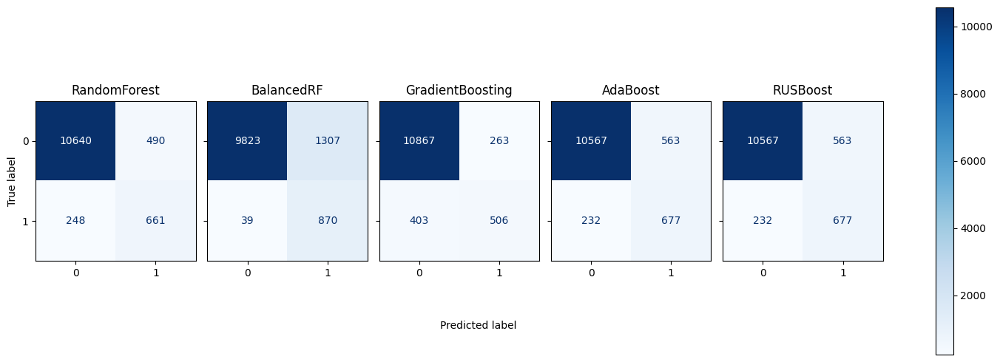

In [ ]:
classifiers = ["RandomForest", "BalancedRF", "GradientBoosting", "AdaBoost", "RUSBoost"]
matrices_confusion = [cm_rf, cm_brf, cm_gb, cm_ada, cm_rus]
class_names = ["0", "1"]

fig, axes = plt.subplots(1, 5, figsize=(15, 5), sharey="row")

for i, (cm, classifier_name) in enumerate(zip(matrices_confusion, classifiers)):

    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

    disp.plot(ax=axes[i], cmap="Blues")
    axes[i].set_title(classifier_name)
    disp.im_.colorbar.remove()
    disp.ax_.set_xlabel('')
    if i!=0:
        disp.ax_.set_ylabel('')

plt.tight_layout()
fig.text(0.4, 0.1, "Predicted label", ha="left")
fig.colorbar(disp.im_, ax=axes)
plt.show()

In [ ]:
score_result

,Modelo,Accuracy,Precision,Recall,F1-score
0,RandomForest,0.937626,0.567107,0.747603,0.644445
1,BalancedRF,0.883974,0.390961,0.955130,0.554618
2,GradientBoosting,0.946697,0.681937,0.554920,0.611138
3,AdaBoost,0.934337,0.549142,0.736062,0.628656
4,RUSBoost,0.934337,0.549142,0.736062,0.628656


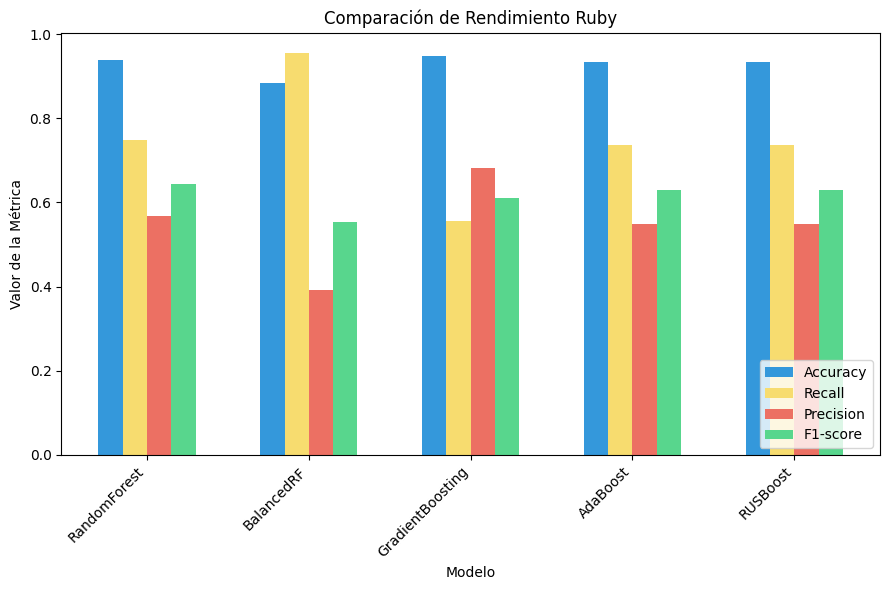

In [ ]:
metricas = ['Accuracy', 'Recall', 'Precision', 'F1-score']
colores = ['#3498DB', '#F7DC6F','#EC7063', '#58D68D']

num_modelos = len(score_result)
ancho_barra = 0.15
x = range(num_modelos)

plt.figure(figsize=(9, 6))

# Crear un gráfico de barras para cada métrica
for i, metrica in enumerate(metricas):
    # Calcular la posición para las barras de esta métrica
    posiciones_x = [pos + i * ancho_barra for pos in x]

    # Obtener los valores de la métrica actual
    valores_metrica = score_result[metrica]

    # Crear las barras para la métrica actual
    plt.bar(
        posiciones_x,
        valores_metrica,
        width=ancho_barra,
        label=metrica,
        color=colores[i],
    )

# Personalizar el gráfico
plt.xlabel('Modelo')
plt.ylabel('Valor de la Métrica')
plt.title('Comparación de Rendimiento Ruby')
plt.xticks([pos + (len(metricas) - 1) * ancho_barra / 2 for pos in x], score_result['Modelo'], rotation=45, ha="right")
plt.legend(loc='lower right')

# Mostrar el gráfico combinado
plt.tight_layout()
plt.show()

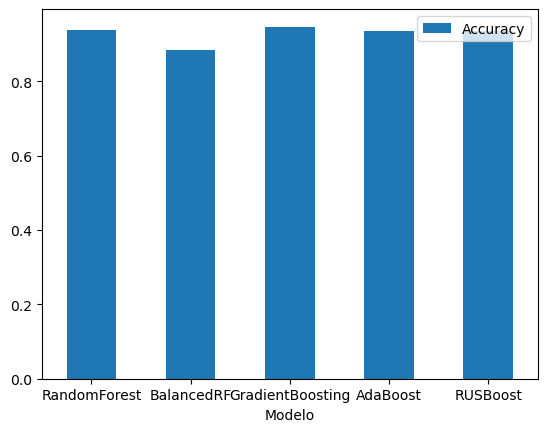

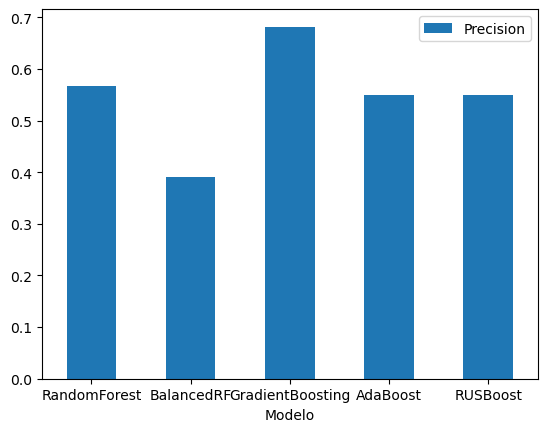

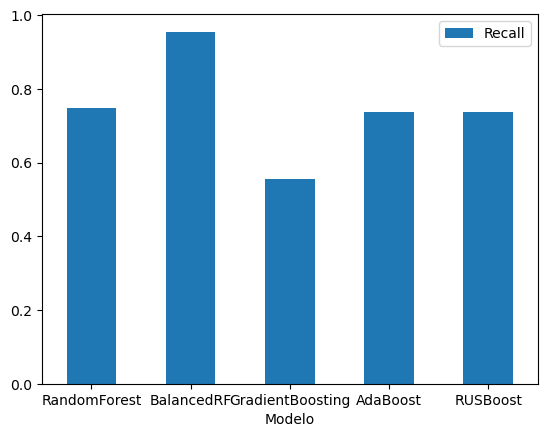

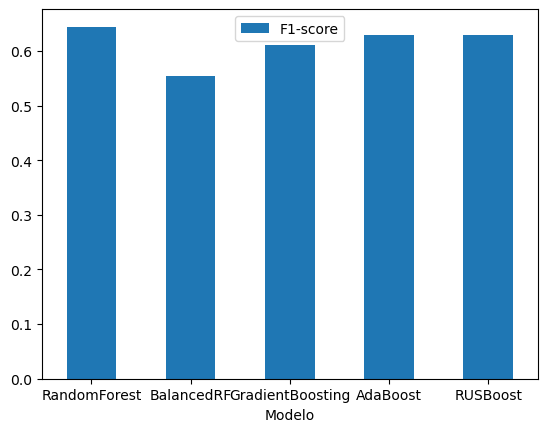

In [ ]:
variables=list(score_result)
variables.pop(0)

for var in variables:
  score_result.plot.bar(x='Modelo', y=var, rot=0)

**RENDIMIENTO INVERSO:**

In [ ]:
score_inv_result

,Modelo,Accuracy,Precision,Recall,F1-score
0,RandomForest,0.938699,0.977223,0.955975,0.966482
1,BalancedRF,0.888197,0.996045,0.882570,0.935880
2,GradientBoost,0.944680,0.964241,0.976370,0.970268
3,AdaBoost,0.933965,0.978517,0.949416,0.963747
4,RUSBoost,0.933965,0.978517,0.949416,0.963747


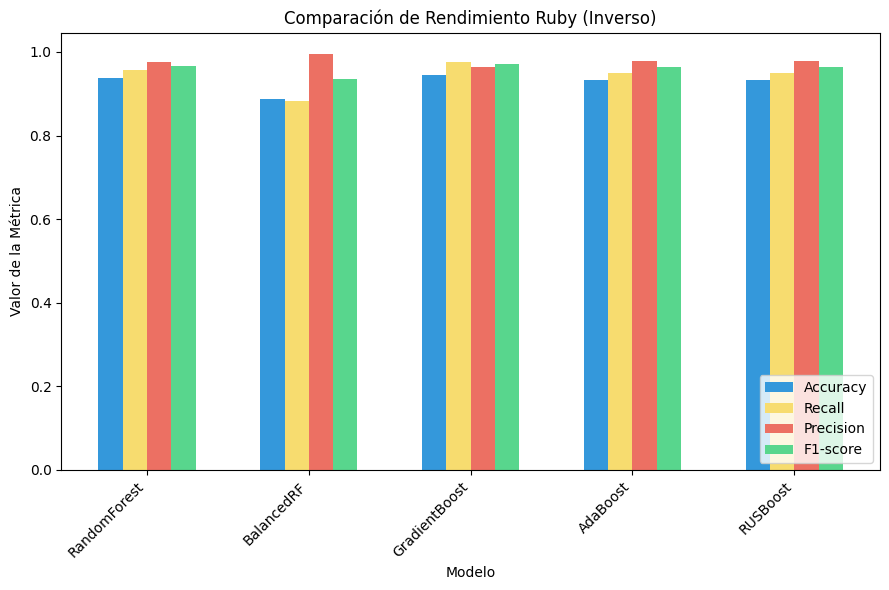

In [ ]:
metricas = ['Accuracy', 'Recall', 'Precision', 'F1-score']
colores = ['#3498DB', '#F7DC6F','#EC7063', '#58D68D']

num_modelos = len(score_inv_result)
ancho_barra = 0.15
x = range(num_modelos)

plt.figure(figsize=(9, 6))

# Crear un gráfico de barras para cada métrica
for i, metrica in enumerate(metricas):
    # Calcular la posición para las barras de esta métrica
    posiciones_x = [pos + i * ancho_barra for pos in x]

    # Obtener los valores de la métrica actual
    valores_metrica = score_inv_result[metrica]

    # Crear las barras para la métrica actual
    plt.bar(
        posiciones_x,
        valores_metrica,
        width=ancho_barra,
        label=metrica,
        color=colores[i],
    )

# Personalizar el gráfico
plt.xlabel('Modelo')
plt.ylabel('Valor de la Métrica')
plt.title('Comparación de Rendimiento Ruby (Inverso)')
plt.xticks([pos + (len(metricas) - 1) * ancho_barra / 2 for pos in x], score_inv_result['Modelo'], rotation=45, ha="right")
plt.legend(loc='lower right')

# Mostrar el gráfico combinado
plt.tight_layout()
plt.show()

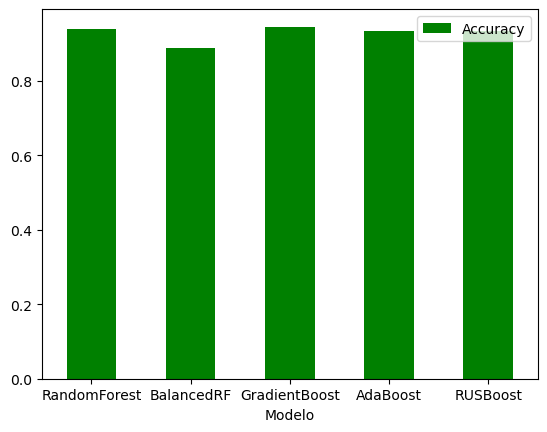

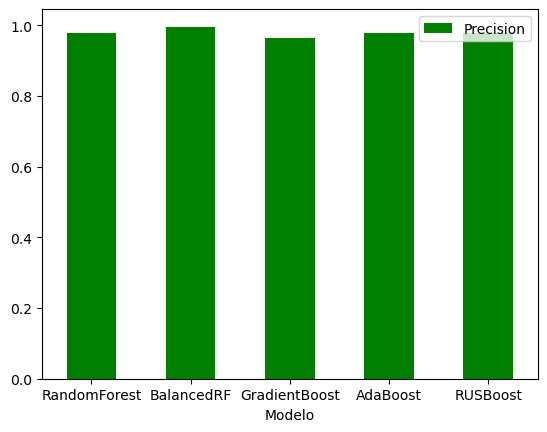

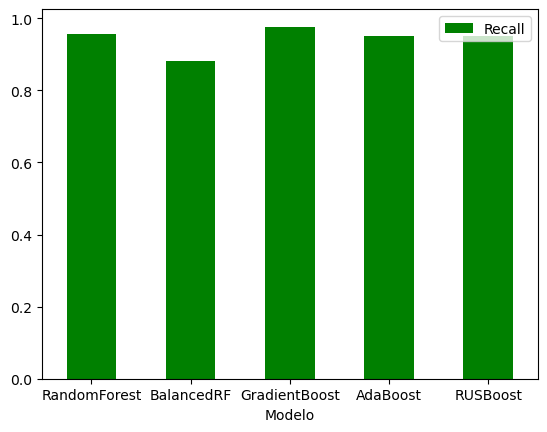

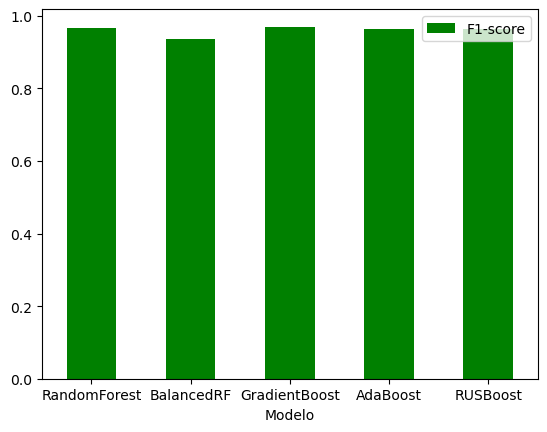

In [ ]:
variables_inv=list(score_inv_result)
variables_inv.pop(0)

for var in variables_inv:
  score_inv_result.plot.bar(x='Modelo', y=var, rot=0, color='green')

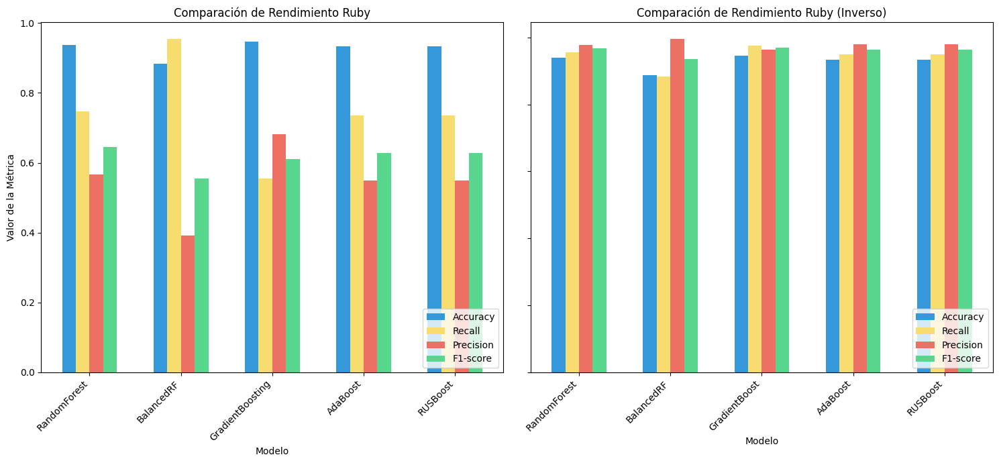

In [ ]:
# Código para la primera gráfica (score_result)
metricas = ['Accuracy', 'Recall', 'Precision', 'F1-score']
colores = ['#3498DB', '#F7DC6F', '#EC7063', '#58D68D']

num_modelos = len(score_result)
ancho_barra = 0.15
x = range(num_modelos)

# Crear una figura con dos subplots, uno a la izquierda y otro a la derecha
plt.figure(figsize=(15, 7))

# Subplot izquierdo para la primera gráfica (score_result)
plt.subplot(1, 2, 1)

for i, metrica in enumerate(metricas):
    posiciones_x = [pos + i * ancho_barra for pos in x]
    valores_metrica = score_result[metrica]
    plt.bar(
        posiciones_x,
        valores_metrica,
        width=ancho_barra,
        label=metrica,
        color=colores[i],
    )

plt.xlabel('Modelo')
plt.ylabel('Valor de la Métrica')
plt.title('Comparación de Rendimiento Ruby')
plt.xticks([pos + (len(metricas) - 1) * ancho_barra / 2 for pos in x], score_result['Modelo'], rotation=45, ha="right")
plt.legend(loc='lower right')

# Subplot derecho para la segunda gráfica (score_inv_result)
plt.subplot(1, 2, 2)

for i, metrica in enumerate(metricas):
    posiciones_x = [pos + i * ancho_barra for pos in x]
    valores_metrica = score_inv_result[metrica]
    plt.bar(
        posiciones_x,
        valores_metrica,
        width=ancho_barra,
        label=metrica,
        color=colores[i],
    )

plt.xlabel('Modelo')
plt.title('Comparación de Rendimiento Ruby (Inverso)')
plt.xticks([pos + (len(metricas) - 1) * ancho_barra / 2 for pos in x], score_inv_result['Modelo'], rotation=45, ha="right")
plt.legend(loc='lower right')
plt.tick_params(labelleft = False)


# Ajustar los subplots para evitar superposiciones
plt.tight_layout()

# Mostrar la figura combinada
plt.show()
